<a href="https://colab.research.google.com/github/sznajder/FwdMuonTrigger/blob/master/FwdMuonMPGNNHitClassifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Graph Neural Network for SEGMENT classification

### Based on:

https://github.com/jmduarte/gnn-fpga/blob/master/README.md

https://github.com/jmduarte/heptrkx-gnn-tracking/blob/master/README.md

https://github.com/jmduarte/gnn-fpga/blob/master/gnn/MPNN_HitClassifier.ipynb



In [1]:
# System imports
from __future__ import print_function
from __future__ import division
import os
import sys
import multiprocessing as mp
from timeit import default_timer as timer

# Externals
import math
import numpy as np
import pandas as pd
from collections import namedtuple
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix, find
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial import cKDTree
import sklearn.metrics
from sklearn.model_selection import train_test_split

# Torch imports
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F

from google.colab import drive

# Mount google drive on remote Colab machine
drive.mount('/content/gdrive', force_remount=False)
sys.path.append('gdrive/My Drive/Colab Notebooks')

!ls 'gdrive/My Drive/Colab Notebooks/Data'
data_dir = 'gdrive/My Drive/Colab Notebooks/Data'

# Input and Output files and events to read
infile = data_dir+'/graphs.npz'
events_start=0
events_end=100


# Local imports
#from estimator import Estimator
#from acts import process_hits_files, select_barrel_hits

#%matplotlib notebook
#%matplotlib ipympl
%matplotlib inline

# Training concurrency
import os
os.environ['OMP_NUM_THREADS'] = '4'
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

cuda = False

if cuda:
    np_to_torch = lambda x, volatile=False: (
        Variable(torch.from_numpy(x.astype(np.float32)), volatile=volatile).cuda())
else:
    np_to_torch = lambda x, volatile=False: (
        Variable(torch.from_numpy(x.astype(np.float32)), volatile=volatile))

torch_to_np = lambda x: x.cpu().data.numpy()

# Graph is a namedtuple of (X, Ri, Ro, y) for convenience
feature_names = ['vh_sim_r', 'vh_sim_phi', 'vh_sim_z','isMuon']
feature_scale = np.array([1000., 180. / 6., 1000., 1])
Graph = namedtuple('Graph', ['X', 'Ri', 'Ro', 'y'])

# Sparse graph uses the indices for the Ri, Ro matrices
SparseGraph = namedtuple('SparseGraph',['X', 'Ri_rows', 'Ri_cols', 'Ro_rows', 'Ro_cols', 'y'])

def graph_to_sparse(graph):
    Ri_rows, Ri_cols = graph.Ri.nonzero()
    Ro_rows, Ro_cols = graph.Ro.nonzero()
    return dict(X=graph.X, y=graph.y,
                Ri_rows=Ri_rows, Ri_cols=Ri_cols,
                Ro_rows=Ro_rows, Ro_cols=Ro_cols)

def sparse_to_graph(X, Ri_rows, Ri_cols, Ro_rows, Ro_cols, y, dtype=np.uint8):
    n_nodes, n_edges = X.shape[0], Ri_rows.shape[0]
    Ri = np.zeros((n_nodes, n_edges), dtype=dtype)
    Ro = np.zeros((n_nodes, n_edges), dtype=dtype)
    Ri[Ri_rows, Ri_cols] = 1
    Ro[Ro_rows, Ro_cols] = 1
    return Graph(X, Ri, Ro, y)


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive
_about.txt	   graphs		  ntuple_qqH_ZZ4mu.root
bolsas_astro.txt   jet_images.h5	  ntuple_SingleMuon_Endcap_9.root
bolsas_fisica.txt  model_best.pt	  ntuple_SingleNeutrino_PU200_63.root
events.root	   ntuple_bkg_ZZ4mu.root  VBFHZZ_background.csv
GOOG.csv	   ntuple_ggH_ZZ4mu.root  VBFHZZ_signal.csv


## PYTORCH module implementing a Message Passing GNN

https://github.com/jmduarte/gnn-fpga/blob/master/gnn/model.py

In [2]:
"""
This module implements the PyTorch modules that define the
message-passing graph neural networks for hit or segment classification.

"""
##############################################################

class EdgeNetwork(nn.Module):
    """
    A module which computes weights for edges of the graph.
    For each edge, it selects the associated nodes' features
    and applies some fully-connected network layers with a final
    sigmoid activation.
    """
    def __init__(self, input_dim, hidden_dim=8, hidden_activation=nn.Tanh):
        super(EdgeNetwork, self).__init__()
        self.network = nn.Sequential(
            nn.Linear(input_dim*2, hidden_dim),
            hidden_activation(),
            nn.Linear(hidden_dim, 1),
            nn.Sigmoid())
    def forward(self, X, Ri, Ro):
        # Select the features of the associated nodes
        bo = torch.bmm(Ro.transpose(1, 2), X)
        bi = torch.bmm(Ri.transpose(1, 2), X)
        B = torch.cat([bo, bi], dim=2)
        # Apply the network to each edge
        return self.network(B).squeeze(-1)

##############################################################

class NodeNetwork(nn.Module):
    """
    A module which computes new node features on the graph.
    For each node, it aggregates the neighbor node features
    (separately on the input and output side), and combines
    them with the node's previous features in a fully-connected
    network to compute the new features.
    """
    def __init__(self, input_dim, output_dim, hidden_activation=nn.Tanh):
        super(NodeNetwork, self).__init__()
        self.network = nn.Sequential(
            nn.Linear(input_dim*3, output_dim),
            hidden_activation(),
            nn.Linear(output_dim, output_dim),
            hidden_activation())
    def forward(self, X, e, Ri, Ro):
        bo = torch.bmm(Ro.transpose(1, 2), X)
        bi = torch.bmm(Ri.transpose(1, 2), X)
        Rwo = Ro * e[:,None]
        Rwi = Ri * e[:,None]
        mi = torch.bmm(Rwi, bo)
        mo = torch.bmm(Rwo, bi)
        M = torch.cat([mi, mo, X], dim=2)
        return self.network(M)

##############################################################

class NodeClassifier(nn.Module):
    """
    A message-passing graph neural network model which performs
    binary classification of nodes.
    """
    def __init__(self, input_dim=4, hidden_dim=8, n_iters=1, hidden_activation=nn.Tanh):
        super(NodeClassifier, self).__init__()
        self.n_iters = n_iters
        # Setup the input network
        self.input_network = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            hidden_activation())
        # Setup the edge network
        self.edge_network = EdgeNetwork(input_dim+hidden_dim, hidden_dim, hidden_activation)
        # Setup the node layers
        self.node_network = NodeNetwork(input_dim+hidden_dim, hidden_dim, hidden_activation)
        # Setup the output network
        self.output_network = nn.Sequential(
            nn.Linear(input_dim+hidden_dim, 1),
            nn.Sigmoid())

    def forward(self, inputs):
        """Apply forward pass of the model"""
        X, Ri, Ro = inputs
        # Apply input network to get hidden representation
        H = self.input_network(X)
        # Shortcut connect the inputs onto the hidden representation
        H = torch.cat([H, X], dim=-1)
        # Loop over iterations of edge and node networks
        for i in range(self.n_iters):
            # Apply edge network
            e = self.edge_network(H, Ri, Ro)
            # Apply node network
            H = self.node_network(H, e, Ri, Ro)
            # Shortcut connect the inputs onto the hidden representation
            H = torch.cat([H, X], dim=-1)
        # Apply final output network
        return self.output_network(H).squeeze(-1)

##############################################################

class SegmentClassifier(nn.Module):
    """
    Segment classification graph neural network model.
    Consists of an input network, an edge network, and a node network.
    """
    def __init__(self, input_dim=2, hidden_dim=8, n_iters=3, hidden_activation=nn.Tanh):
        super(SegmentClassifier, self).__init__()
        self.n_iters = n_iters
        # Setup the input network
        self.input_network = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            hidden_activation())
        # Setup the edge network
        self.edge_network = EdgeNetwork(input_dim+hidden_dim, hidden_dim,
                                        hidden_activation)
        # Setup the node layers
        self.node_network = NodeNetwork(input_dim+hidden_dim, hidden_dim,
                                        hidden_activation)

    def forward(self, inputs):
        """Apply forward pass of the model"""
        X, Ri, Ro = inputs
        # Apply input network to get hidden representation
        H = self.input_network(X)
        # Shortcut connect the inputs onto the hidden representation
        H = torch.cat([H, X], dim=-1)
        # Loop over iterations of edge and node networks
        for i in range(self.n_iters):
            # Apply edge network
            e = self.edge_network(H, Ri, Ro)
            # Apply node network
            H = self.node_network(H, e, Ri, Ro)
            # Shortcut connect the inputs onto the hidden representation
            H = torch.cat([H, X], dim=-1)
        # Apply final edge network
        return self.edge_network(H, Ri, Ro)


################################################################################
'''
from torch_geometric.nn.conv import SAGEConv

class Net(torch.nn.Module):
  def __init__(self):
    super(Net, self).__init__()
    self.conv1 = SAGEConv(in_channels = NN_input, out_channels = NN_input, flow = 'source_to_target',concat = True)
    self.lin1 = torch.nn.Linear(NN_input, int(3*NN_input))
    self.lin2 = torch.nn.Linear(int(3*NN_input), int(3*NN_input))
    self.lin3 = torch.nn.Linear(int(3*NN_input),1)
    self.act3 = torch.nn.Sigmoid()     
 
  
  
  def forward(self, data):
    x, edge_index = data['x'], data['edge_index']
    for aux_i in range(x.shape[0]):

      aux_x = torch.tensor([[]],dtype=torch.float32)

      aux_x = x[aux_i]   
      aux_x = self.conv1(aux_x,edge_index[aux_i])
      aux_x = self.lin1(aux_x)
      aux_x = self.lin2(aux_x)
      aux_x = self.lin3(aux_x)
      aux_x = self.act3(aux_x)
      print("see aux_X before")
      print(aux_x)
      aux_x = aux_x.squeeze()
      print(aux_x)
      input()
      if aux_i == 0:
        aux_out = aux_x
      else:
        aux_out = torch.cat([aux_out,aux_x],dim = -1)
      print("see aux_out")
      print(aux_out)
      input()

    return aux_x   
'''     

'\nfrom torch_geometric.nn.conv import SAGEConv\n\nclass Net(torch.nn.Module):\n  def __init__(self):\n    super(Net, self).__init__()\n    self.conv1 = SAGEConv(in_channels = NN_input, out_channels = NN_input, flow = \'source_to_target\',concat = True)\n    self.lin1 = torch.nn.Linear(NN_input, int(3*NN_input))\n    self.lin2 = torch.nn.Linear(int(3*NN_input), int(3*NN_input))\n    self.lin3 = torch.nn.Linear(int(3*NN_input),1)\n    self.act3 = torch.nn.Sigmoid()     \n \n  \n  \n  def forward(self, data):\n    x, edge_index = data[\'x\'], data[\'edge_index\']\n    for aux_i in range(x.shape[0]):\n\n      aux_x = torch.tensor([[]],dtype=torch.float32)\n\n      aux_x = x[aux_i]   \n      aux_x = self.conv1(aux_x,edge_index[aux_i])\n      aux_x = self.lin1(aux_x)\n      aux_x = self.lin2(aux_x)\n      aux_x = self.lin3(aux_x)\n      aux_x = self.act3(aux_x)\n      print("see aux_X before")\n      print(aux_x)\n      aux_x = aux_x.squeeze()\n      print(aux_x)\n      input()\n      if au

## PYTORCH module implementing the Estimator

https://github.com/jmduarte/gnn-fpga/blob/master/gnn/estimator.py

In [0]:
"""
This module contains the Estimator class implementation which provides
code for doing the training of a PyTorch model.
"""

from __future__ import print_function

from datetime import datetime
from timeit import default_timer as timer

import numpy as np

import shutil 
import os

import torch

def logger(s):
    """Simple logger function which prints date/time"""
    print(datetime.now(), s)

class Estimator():
    """Estimator class"""

    def __init__(self, model, loss_func, opt='Adam',
                 train_losses=None, valid_losses=None,
                 cuda=False, l1=0.):

        self.model = model
        if cuda:
            self.model.cuda()
        self.loss_func = loss_func
        if opt == 'Adam':
            self.optimizer = torch.optim.Adam(self.model.parameters())
        elif opt == 'SGD':
            self.optimizer = torch.optim.SGD(self.model.parameters())

        self.train_losses = train_losses if train_losses is not None else []
        self.valid_losses = valid_losses if valid_losses is not None else []
        self.l1 = l1

        logger('Model: \n%s' % model)
        logger('Parameters: %i' %
               sum(param.numel() for param in model.parameters()))

    def l1_penalty(self, arr):
        return torch.abs(arr).sum()
        
    def training_step(self, inputs, targets):
        """Applies single optimization step on batch"""
        self.model.zero_grad()
        self.optimizer.zero_grad()
        outputs = self.model(inputs)
        node_weights = [layer.weight for layer in self.model.node_network.network if hasattr(layer, 'weight')]
        edge_weights = [layer.weight for layer in self.model.edge_network.network if hasattr(layer, 'weight')]
        l1_regularization = self.l1 * sum([self.l1_penalty(arr) for arr in node_weights]) + self.l1 * sum([self.l1_penalty(arr) for arr in edge_weights])
        loss = self.loss_func(outputs, targets) + l1_regularization 
        loss.backward()
        self.optimizer.step()
        return loss

    def save_checkpoint(self, state, is_best, filename='checkpoint.pt'):
#        directory = os.path.dirname(filename)
        directory = data_dir
        try:
            os.stat(directory)
        except:
            os.mkdir(directory)
        torch.save(state, filename)
        if is_best:
            bestfilename = directory+'/model_best.pt'
            shutil.copyfile(filename, bestfilename)
            
    def load_checkpoint(self, filename='checkpoint.pt'):
        checkpoint = torch.load(filename)
        self.model.load_state_dict(checkpoint['state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer'])
        self.valid_losses = checkpoint['valid_losses']
        self.train_losses = checkpoint['train_losses']
    
    def fit_gen(self, train_generator, n_batches=1, n_epochs=1,
                valid_generator=None, n_valid_batches=1, verbose=0, 
                filename='checkpoint.pt'):
        """Runs batch training for a number of specified epochs."""
        epoch_start = len(self.train_losses)
        epoch_end = epoch_start + n_epochs
        if len(self.valid_losses) > 0:
            best_valid_loss = self.valid_losses[-1]
        else:
            best_valid_loss = 99999999
        for i in range(epoch_start, epoch_end):
            logger('Epoch %i' % i)
            start_time = timer()
            sum_loss = 0

            # Train the model
            self.model.train()
            
            for j in range(n_batches):
                batch_input, batch_target = next(train_generator)
                batch_loss = (self.training_step(batch_input, batch_target)
                              .cpu().data.item())
                sum_loss += batch_loss
                if verbose > 0:
                    logger('  Batch %i loss %f' % (j, batch_loss))
            end_time = timer()
            avg_loss = sum_loss / n_batches
            self.train_losses.append(avg_loss)
            logger('  training loss %.3g time %gs' %
                   (avg_loss, (end_time - start_time)))

            with torch.no_grad():
                # Evaluate the model on the validation set
                if (valid_generator is not None) and (n_valid_batches > 0):
                    self.model.eval()
                    valid_loss = 0
                    for j in range(n_valid_batches):
                        valid_input, valid_target = next(valid_generator)
                        valid_loss += (self.loss_func(self.model(valid_input), valid_target)
                                       .cpu().data.item())
                    valid_loss = valid_loss / n_valid_batches
                    self.valid_losses.append(valid_loss)
                    logger('  validate loss %.3g' % valid_loss)
                
                    #Save model checkpoint - modified
                    logger(' save checkpoint') 
                    is_best = valid_loss < best_valid_loss
                    best_valid_loss = min(valid_loss, best_valid_loss)
                    self.save_checkpoint({
                        'epoch': i + 1,
                        'state_dict': self.model.state_dict(),
                        'best_valid_loss': best_valid_loss,
                        'valid_losses': self.valid_losses,
                        'train_losses': self.train_losses,
                        'optimizer' : self.optimizer.state_dict(),
                    }, is_best, filename=filename)

    def predict(self, generator, n_batches, concat=True):
        with torch.no_grad():  
            self.model.eval()
            outputs = []
            for j in range(n_batches):
                test_input, test_target = next(generator)
                outputs.append(self.model(test_input))
            if concat:
                outputs = torch.cat(outputs)
            return outputs

    # DEPRECATED; MOVE TO BATCH GENERATOR VERSION
    def fit(self, train_input, train_target, batch_size=32, n_epochs=1,
            valid_input=None, valid_target=None):
        """Runs batch training for a number of specified epochs."""
        if type(train_input) == list:
            n_samples = train_input[0].size(0)
        else:
            n_samples = train_input.size(0)
        n_batches = (n_samples + batch_size - 1) // batch_size
        logger('Training samples: %i' % n_samples)
        logger('Batches per epoch: %i' % n_batches)
        if valid_input is not None:
            n_valid = (valid_input[0].size(0) if type(valid_input) == list
                       else valid_input.size(0))
            logger('Validation samples: %i' % n_valid)

        batch_idxs = np.arange(0, n_samples, batch_size)

        epoch_start = len(self.train_losses)
        epoch_end = epoch_start + n_epochs
        for i in range(epoch_start, epoch_end):
            logger('Epoch %i' % i)
            start_time = timer()
            sum_loss = 0

            self.model.train()
            for j in batch_idxs:
                # TODO: add support for more customized batching
                if type(train_input) is list:
                    batch_input = [ti[j:j+batch_size] for ti in train_input]
                else:
                    batch_input = train_input[j:j+batch_size]
                batch_target = train_target[j:j+batch_size]
                loss = self.training_step(batch_input, batch_target)
                sum_loss += loss.cpu().data.item()

            end_time = timer()
            avg_loss = sum_loss / n_batches
            self.train_losses.append(avg_loss)
            logger('  training loss %.3g time %gs' %
                   (avg_loss, (end_time - start_time)))

            # Evaluate the model on the validation set
            self.model.eval()
            if (valid_input is not None) and (valid_target is not None):
                valid_loss = (self.loss_func(self.model(valid_input), valid_target)
                              .cpu().data.item())
                self.valid_losses.append(valid_loss)
                logger('  validate loss %.3g' % valid_loss)



## Batch Generator

In [0]:
def batch_generator(X, Ri, Ro, y, n_samples=1, batch_size=1, train=True):
    volatile = not train
    batch_idxs = np.arange(0, n_samples, batch_size)
    # Loop over epochs
    while True:
        # Loop over batches
        for j in batch_idxs:
#            batch_X  = np_to_torch(  X[j:j+batch_size], volatile=volatile )
#            batch_Ri = np_to_torch( Ri[j:j+batch_size], volatile=volatile )
#            batch_Ro = np_to_torch( Ro[j:j+batch_size], volatile=volatile )
#            batch_y  = np_to_torch(  y[j:j+batch_size], volatile=volatile )
 
          with torch.set_grad_enabled(train):
            batch_X  = np_to_torch(  X[j:j+batch_size] )
            batch_Ri = np_to_torch( Ri[j:j+batch_size] )
            batch_Ro = np_to_torch( Ro[j:j+batch_size] )
            batch_y  = np_to_torch(  y[j:j+batch_size] )
            batch_inputs = [batch_X, batch_Ri, batch_Ro]
            yield batch_inputs, batch_y

## Network  Model and Training Configuration

In [0]:
# Model config
#hidden_dim = 64
hidden_dim = 16
#n_iters = 7
n_iters = 5

# Training config
batch_size = 10
n_epochs = 20
valid_frac = 0.2
test_frac = 0.2


## Load and prepare the graphs DATASET

In [6]:
# Load GRAPHS from inputfile
#sparse = np.load(infile, allow_pickle=True)
#gfile = np.load(infile)
#garray = gfile.f.arr_0 # convert file to 2D np.ndarrays
import glob
filenames =  glob.glob(data_dir+'/graphs/*.npz')

# Load the graphs into a list 
graphs = []
for f in filenames:
  gfile = np.load(f)
#  graph = SparseGraph(**dict(gfile.items()))
  graph = Graph(**dict(gfile.items()))
  graphs.append(graph)

# Get the matrix sizes in this batch
n_graphs = len(graphs)
n_features = graphs[0].X.shape[1] 
n_nodes    = np.array([g.X.shape[0] for g in graphs])
n_edges    = np.array([g.y.shape[0] for g in graphs])
max_nodes = n_nodes.max()
max_edges = n_edges.max()


print("n_graphs",n_graphs)
print("n_features",n_features)
print("n_nodes",n_nodes)
print("n_edges",n_edges)
print("max_nodes",max_nodes)
print("max_edges",max_edges)

# Define GRAPH tensors for the full dataset
n_samples = n_graphs
X  = np.zeros((n_samples, max_nodes, n_features), dtype=np.float32) # node features 
Ri = np.zeros((n_samples, max_nodes, max_edges) , dtype=np.float32)  # adjacency matrix
Ro = np.zeros((n_samples, max_nodes, max_edges) , dtype=np.float32)  #
y  = np.zeros((n_samples, max_edges), dtype=np.float32)             # target label

# Loop over graphs and fill the tensors ( with event # indexed  by i )
for i, g in enumerate(graphs):
  X[i, :n_nodes[i]] = g.X 
  Ri[i, :n_nodes[i], :n_edges[i]] = g.Ri
  Ro[i, :n_nodes[i], :n_edges[i]] = g.Ro
  y[i,  :n_edges[i]] = g.y                 


n_graphs 2480
n_features 4
n_nodes [19  6  5 ... 10  2 12]
n_edges [11  2  2 ... 11  1 15]
max_nodes 24
max_edges 56


## Partition dataset into TRAIN , TEST and VALIDATION

In [7]:
%%time
# We round by batch_size to avoid partial batches
n_test  = int(n_samples * test_frac)     // batch_size * batch_size
n_valid = int(n_samples * valid_frac)    // batch_size * batch_size
n_train = (n_samples - n_valid - n_test) // batch_size * batch_size
n_train_batches = n_train // batch_size
n_valid_batches = n_valid // batch_size
n_test_batches  = n_test  // batch_size

# Partition the dataset into TEST, VALIDATION and TRAIN excluding isMuon from features ( X[:,:,3])
(train_X, test_X,  train_Ri, test_Ri,  train_Ro, test_Ro,  train_y, test_y)  = train_test_split(X[:,:,0:n_features-1], Ri, Ro, y, test_size=n_test)
(train_X, valid_X, train_Ri, valid_Ri, train_Ro, valid_Ro, train_y, valid_y) = train_test_split(X[:,:,0:n_features-1], Ri, Ro, y, test_size=n_valid)

# Prepare the batch samples
train_batcher = batch_generator(train_X, train_Ri, train_Ro, train_y, train=True , n_samples=n_train, batch_size=batch_size)
valid_batcher = batch_generator(valid_X, valid_Ri, valid_Ro, valid_y, train=False, n_samples=n_valid, batch_size=batch_size)
test_batcher  = batch_generator(test_X ,  test_Ri,  test_Ro, test_y , train=False, n_samples=n_test , batch_size=batch_size)

print('Graphs shapes:', X.shape , Ri.shape , Ro.shape , y.shape)
print('Graphs node features:', feature_names)
print("n_train, n_valid, n_test  = " , n_train, " , " , n_valid, " , " , n_test )
print('Train shapes:', train_X.shape , train_Ri.shape , train_Ro.shape , train_y.shape)
print('Valid shapes:', valid_X.shape , valid_Ri.shape , valid_Ro.shape , valid_y.shape)
print('Test shapes: ', test_X.shape  , test_Ri.shape  , test_Ro.shape  , test_y.shape)



Graphs shapes: (2480, 24, 4) (2480, 24, 56) (2480, 24, 56) (2480, 56)
Graphs node features: ['vh_sim_r', 'vh_sim_phi', 'vh_sim_z', 'isMuon']
n_train, n_valid, n_test  =  1500  ,  490  ,  490
Train shapes: (1990, 24, 3) (1990, 24, 56) (1990, 24, 56) (1990, 56)
Valid shapes: (490, 24, 3) (490, 24, 56) (490, 24, 56) (490, 56)
Test shapes:  (490, 24, 3) (490, 24, 56) (490, 24, 56) (490, 56)
CPU times: user 10.8 ms, sys: 35.4 ms, total: 46.2 ms
Wall time: 45.5 ms


## Construct the GNN model

In [8]:
# Construct the model
#model = EdgeClassifier(input_dim=n_features, hidden_dim=hidden_dim, n_iters=n_iters)
model = SegmentClassifier(input_dim=n_features-1, hidden_dim=hidden_dim, n_iters=n_iters) # input_dim=n_features-1 to exclude isMuon from GNN input 
loss_func = nn.BCELoss()
estim = Estimator(model, loss_func=loss_func, cuda=cuda)

2020-05-20 22:26:40.264277 Model: 
SegmentClassifier(
  (input_network): Sequential(
    (0): Linear(in_features=3, out_features=16, bias=True)
    (1): Tanh()
  )
  (edge_network): EdgeNetwork(
    (network): Sequential(
      (0): Linear(in_features=38, out_features=16, bias=True)
      (1): Tanh()
      (2): Linear(in_features=16, out_features=1, bias=True)
      (3): Sigmoid()
    )
  )
  (node_network): NodeNetwork(
    (network): Sequential(
      (0): Linear(in_features=57, out_features=16, bias=True)
      (1): Tanh()
      (2): Linear(in_features=16, out_features=16, bias=True)
      (3): Tanh()
    )
  )
)
2020-05-20 22:26:40.264882 Parameters: 1905


## Train the GNN

In [9]:
estim.fit_gen(train_batcher, n_batches=n_train_batches, n_epochs=n_epochs,valid_generator=valid_batcher, n_valid_batches=n_valid_batches)

2020-05-20 22:26:40.273056 Epoch 0
2020-05-20 22:26:42.040893   training loss 0.577 time 1.76771s
2020-05-20 22:26:42.203177   validate loss 0.392
2020-05-20 22:26:42.203336  save checkpoint
2020-05-20 22:26:42.502018 Epoch 1
2020-05-20 22:26:44.077788   training loss 0.255 time 1.57452s
2020-05-20 22:26:44.239722   validate loss 0.156
2020-05-20 22:26:44.239888  save checkpoint
2020-05-20 22:26:44.246671 Epoch 2
2020-05-20 22:26:45.737000   training loss 0.112 time 1.48956s
2020-05-20 22:26:45.896005   validate loss 0.0805
2020-05-20 22:26:45.896186  save checkpoint
2020-05-20 22:26:45.905993 Epoch 3
2020-05-20 22:26:47.338856   training loss 0.0661 time 1.43239s
2020-05-20 22:26:47.497912   validate loss 0.0533
2020-05-20 22:26:47.498072  save checkpoint
2020-05-20 22:26:47.510774 Epoch 4
2020-05-20 22:26:48.959807   training loss 0.0483 time 1.44888s
2020-05-20 22:26:49.117328   validate loss 0.0419
2020-05-20 22:26:49.117480  save checkpoint
2020-05-20 22:26:49.124043 Epoch 5
2020-

## Evaluate Training


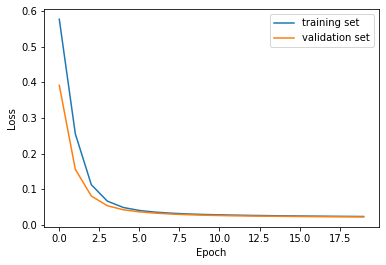

In [10]:
# Plot the loss
plt.figure()
plt.plot(estim.train_losses, label='training set')
plt.plot(estim.valid_losses, label='validation set')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc=0);

## Evaluate Performance


AUC:  0.9943
Test set results with threshold of 0.4
Purity (Precision)= 0.6176
Signal Efficiency (Recall)=    0.6311
Accuracy=  0.9899


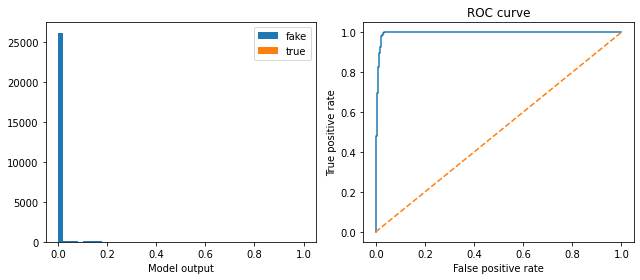

In [11]:
# Evaluate on TEST data
test_outputs = estim.predict(test_batcher, n_test_batches, concat=False)
test_pred = torch_to_np(estim.predict(test_batcher, n_test_batches))

flat_y = test_y.flatten()
flat_pred = test_pred.flatten()

# Compute the ROC curve
fpr, tpr, _ = sklearn.metrics.roc_curve(flat_y, flat_pred)
roc_auc = sklearn.metrics.auc(fpr, tpr)

thresh = 0.4

print('AUC:  %.4f' % roc_auc )
print('Test set results with threshold of', thresh)
print('Purity (Precision)= %.4f' % sklearn.metrics.precision_score(flat_y, flat_pred>thresh))
print('Signal Efficiency (Recall)=    %.4f' % sklearn.metrics.recall_score(flat_y, flat_pred>thresh))
print('Accuracy=  %.4f' % sklearn.metrics.accuracy_score(flat_y, flat_pred>thresh))


plt.figure(figsize=(9,4))

# Plot the model outputs
plt.subplot(121)
binning=dict(bins=50, range=(0,1), histtype='bar')
plt.hist(flat_pred[flat_y<thresh], label='fake', **binning)
plt.hist(flat_pred[flat_y>thresh], label='true', **binning)
plt.xlabel('Model output')
plt.legend(loc=0)

# Plot the ROC curve
plt.subplot(122)
plt.plot(fpr, tpr)
plt.plot([0, 1], [0, 1], '--')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')

plt.tight_layout()

## Visualize some samples

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [3.2882959e-05 3.0086767e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


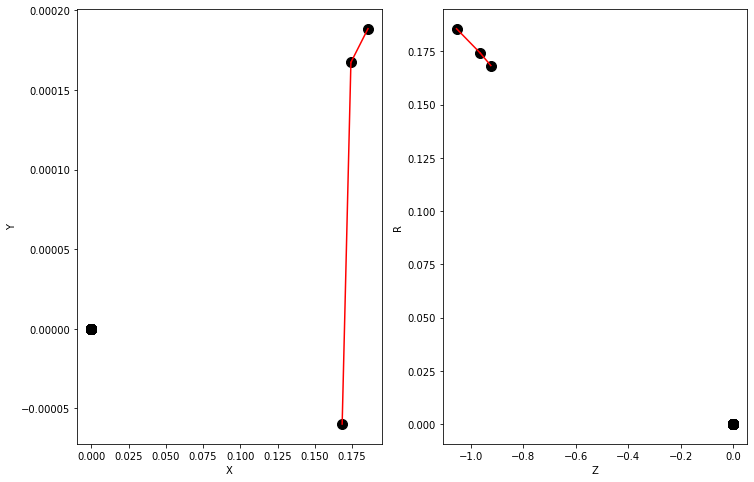

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.06987493 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


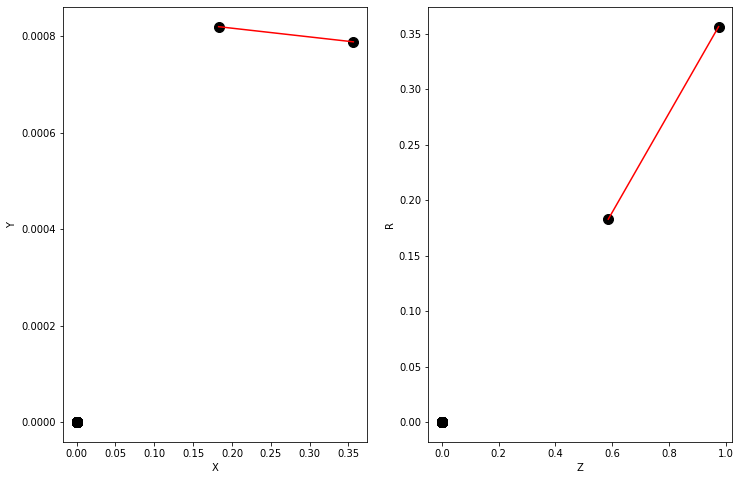

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.02275037 0.01863587 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


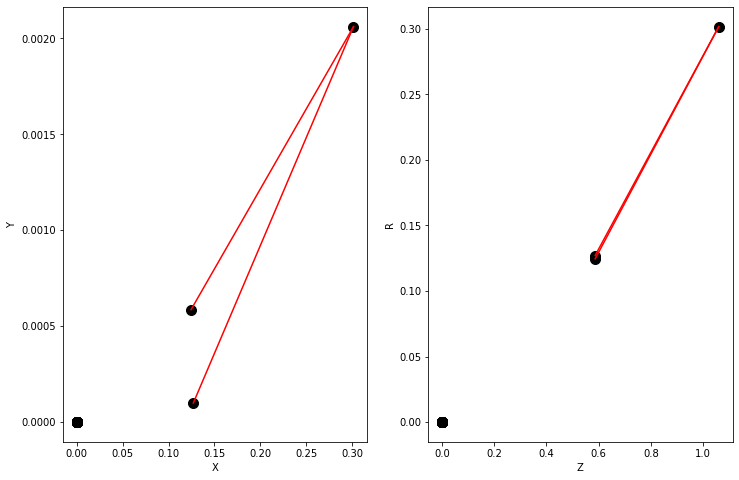

Y = [0. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.39999217 0.40584466 0.05361591 0.30134842 0.30550215 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 1.000, recall 0.333


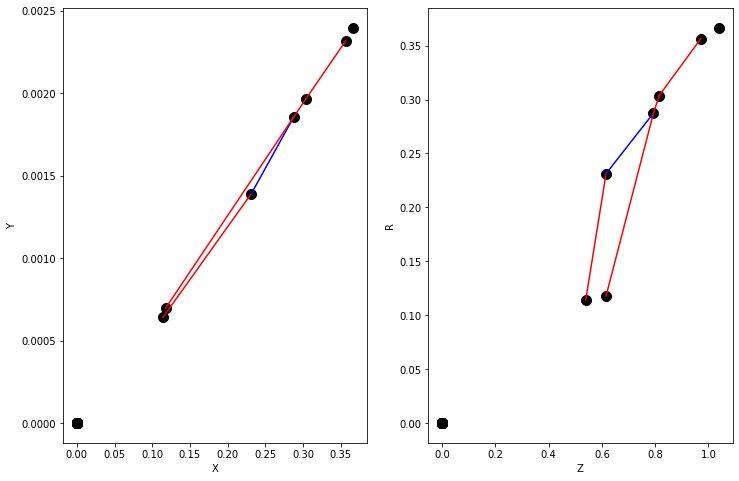

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.8918918e-05 8.3944076e-05 4.6273493e-05 4.9392067e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

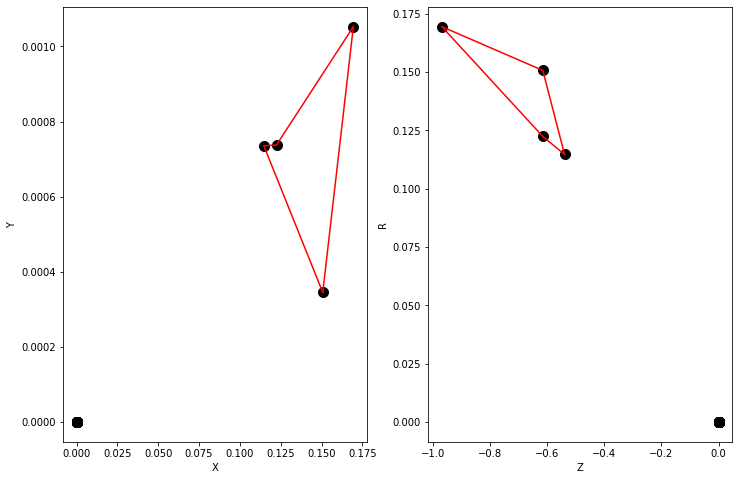

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.45171598 0.54284424 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


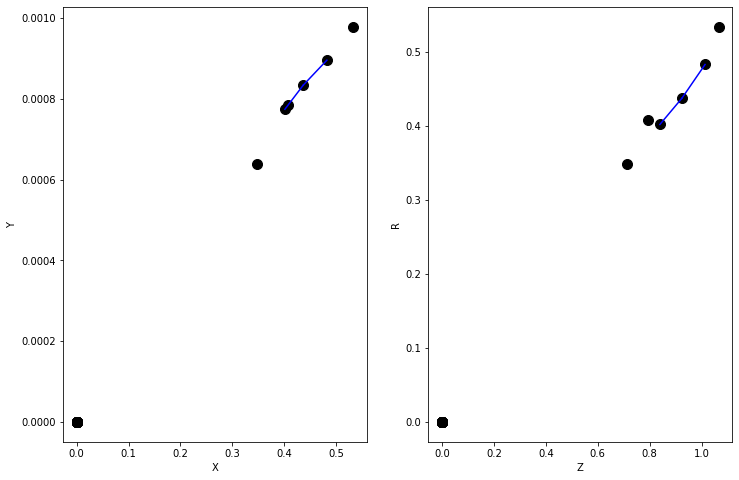

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.8192264e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

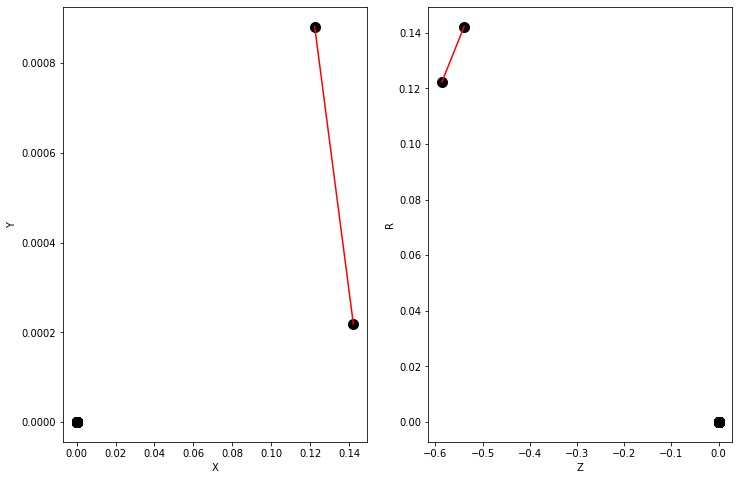

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.06314146 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


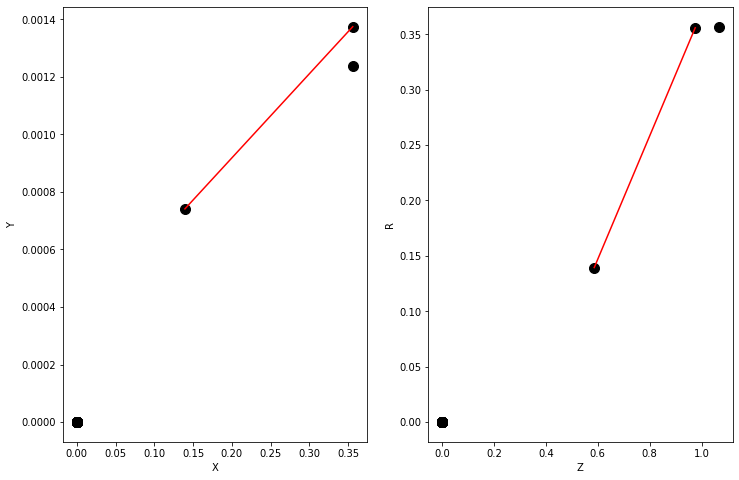

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.04627351 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


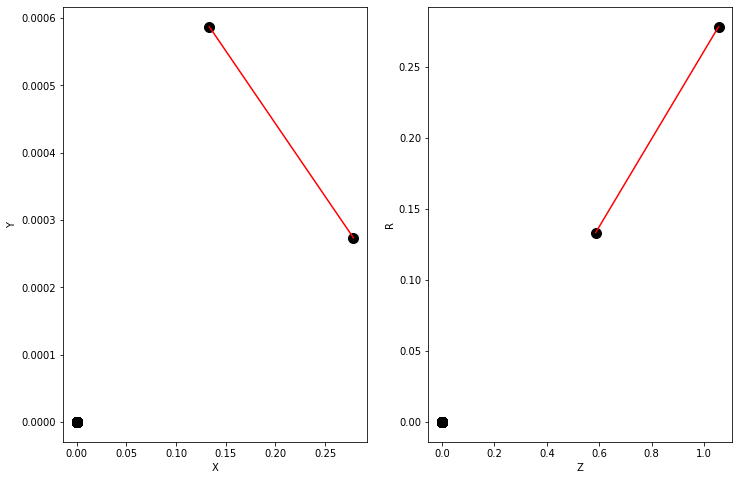

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.4657252e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

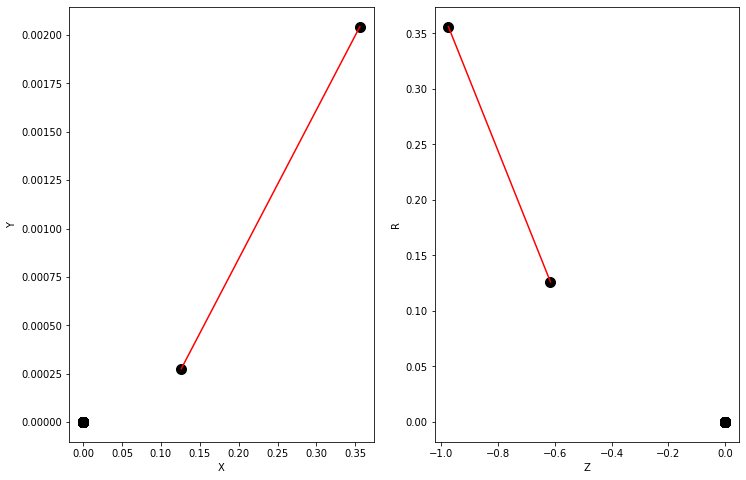

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.8305777e-05 5.4491236e-05 5.2677937e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

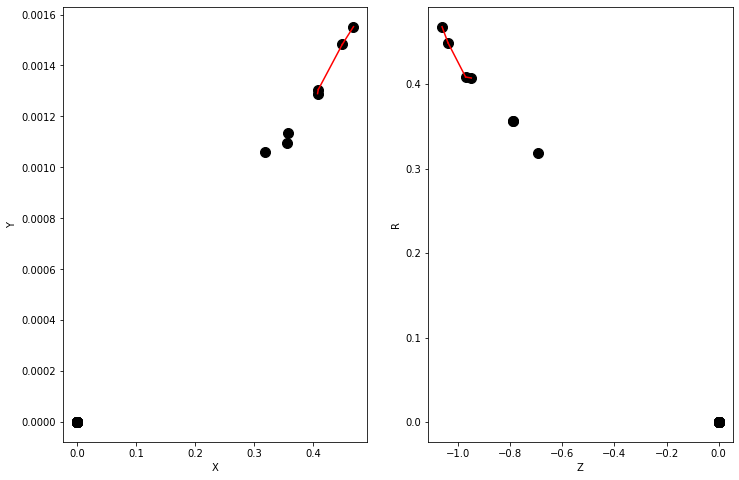

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.3593656e-05 7.3386007e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

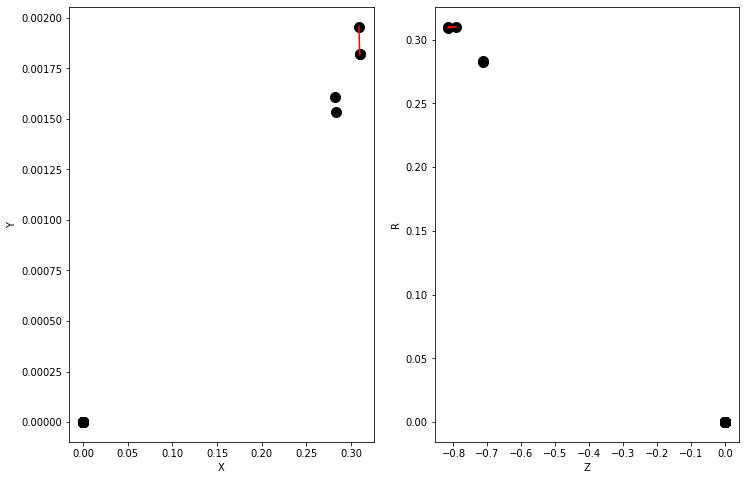

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.36982197 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


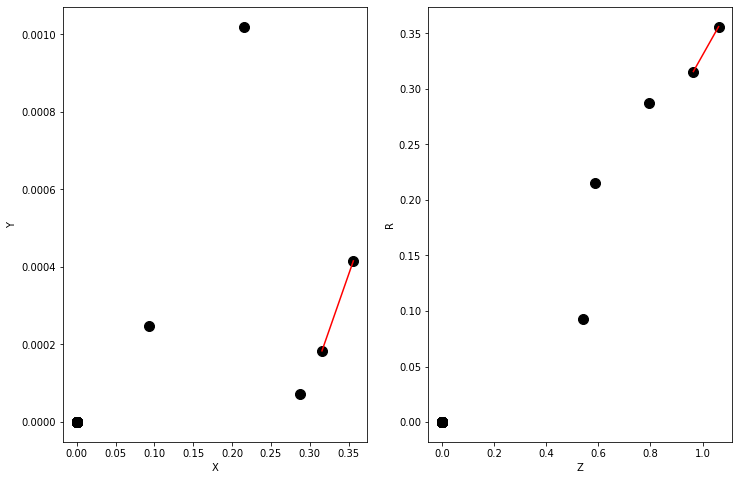

Y = [0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.07046356 0.07475659 0.22189812 0.32032424 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


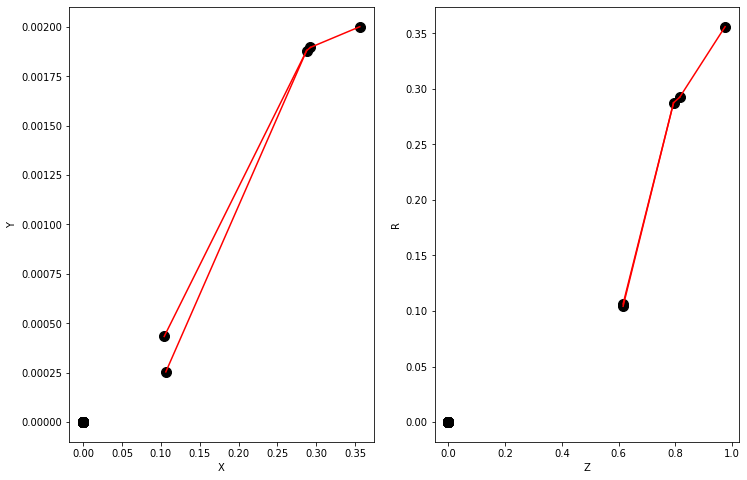

Y = [0. 0. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.550891   0.58096194 0.5716418  0.5162045  0.02686339 0.43153825
 0.448625   0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.667, recall 1.000


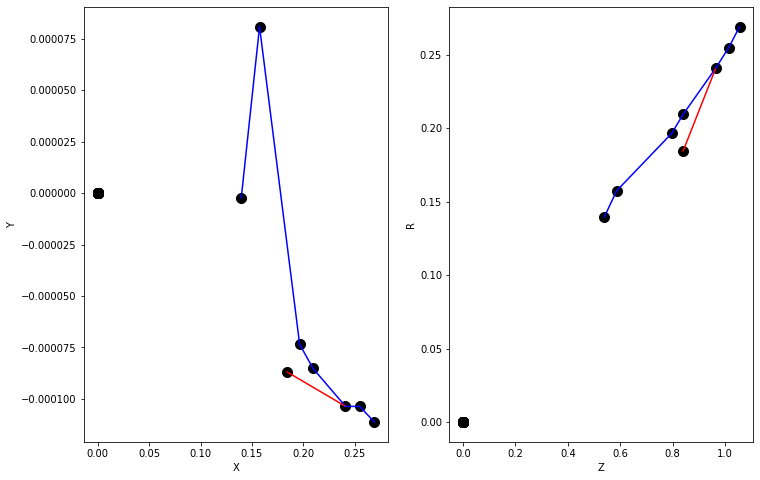

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.8592977e-05 8.5839900e-05 9.9880679e-05 9.6793854e-05 4.5087876e-05
 4.9658953e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

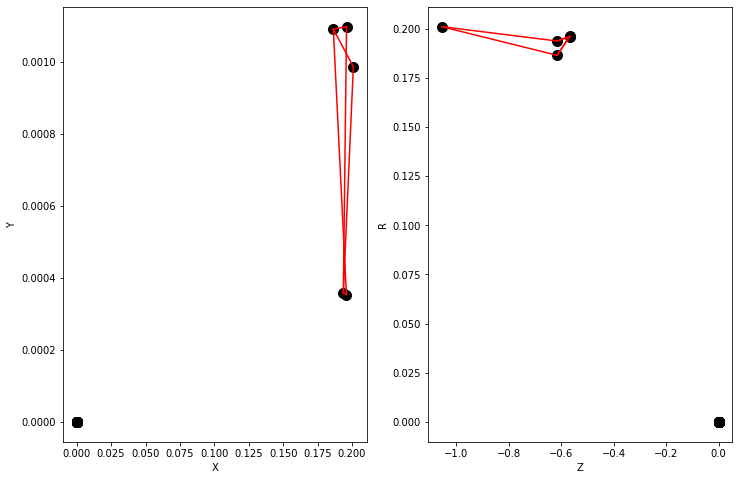

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.6440800e-05 5.8479400e-05 6.1315761e-05 4.1280837e-05 4.0832772e-05
 3.6758076e-05 3.5965586e-05 3.7670452e-05 3.5851383e-05 3.3957134e-05
 3.2380769e-05 3.6593970e-05 3.4877467e-05 3.1669537e-05 3.0771960e-05
 3.3163680e-05 3.2230793e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

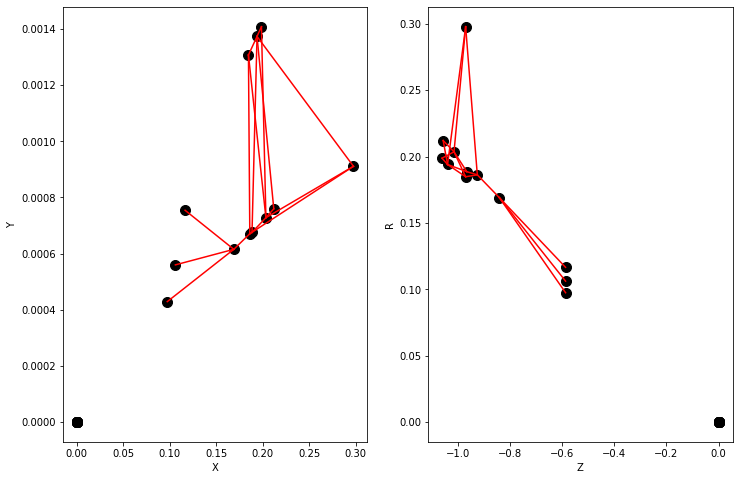

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.06987493 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


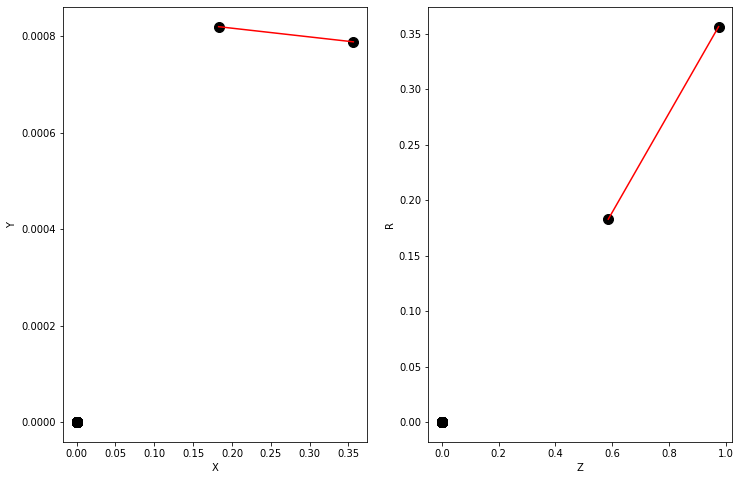

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.06661912 0.07308278 0.30269617 0.29396772 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


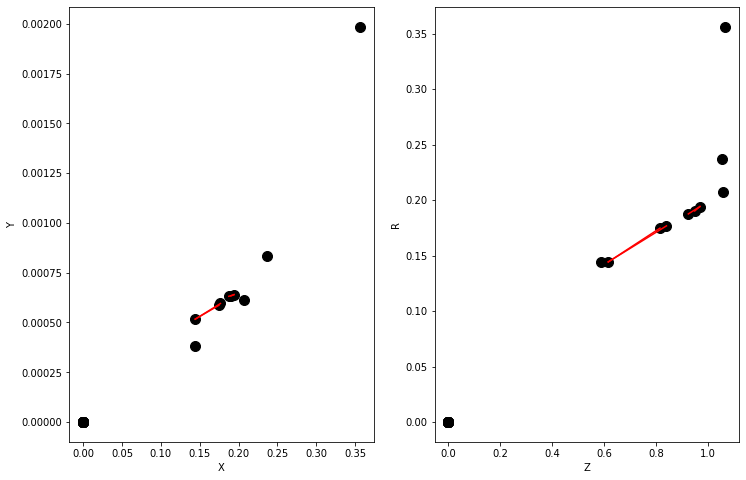

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.20117743 0.29381546 0.08383124 0.13538082 0.15976115 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


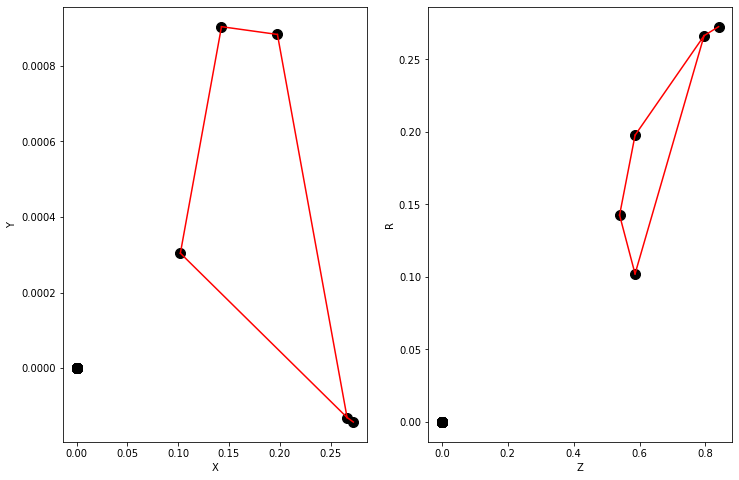

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.188889e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

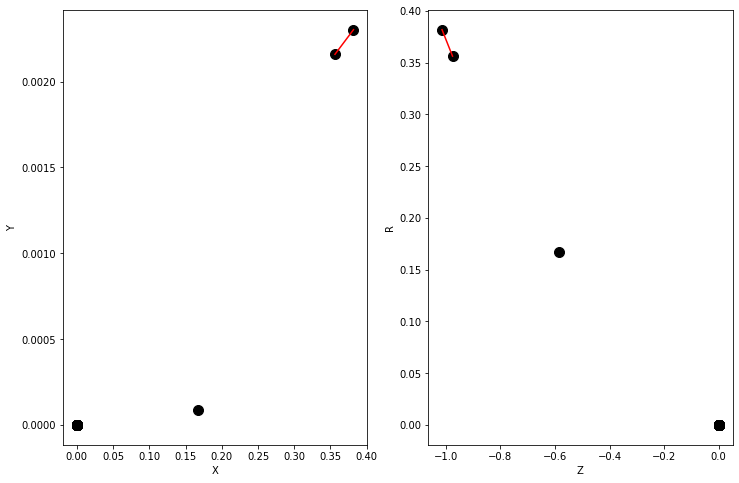

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.01948725 0.02023127 0.0223454  0.04331039 0.04537876 0.10240828
 0.10089685 0.11116263 0.10946117 0.08969    0.09131753 0.09246174
 0.09332743 0.09515069 0.096287   0.04616628 0.04607246 0.04607745
 0.0368872  0.03663838 0.03667102 0.04003185 0.03981082 0.03983821
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


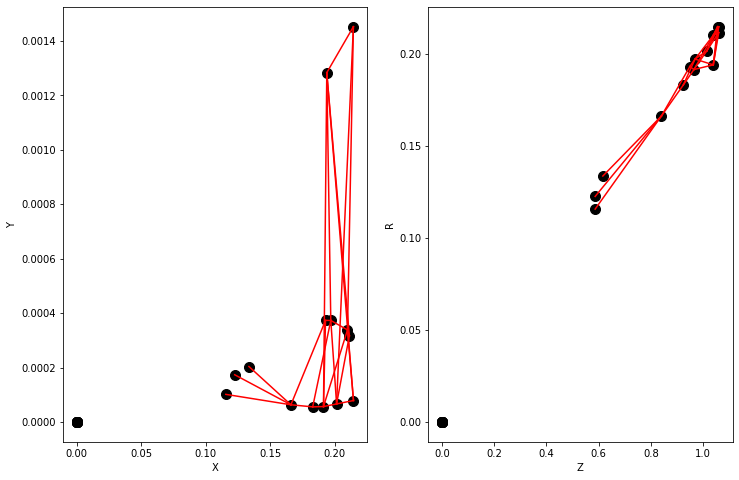

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.2552797e-05 7.6475684e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

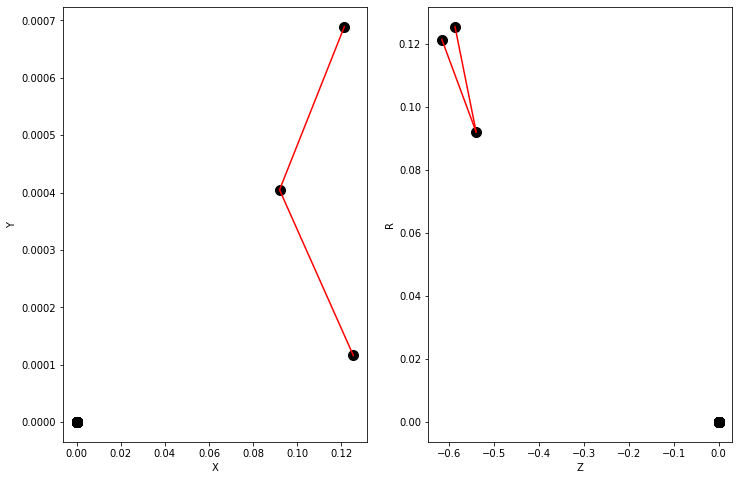

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.6671015e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

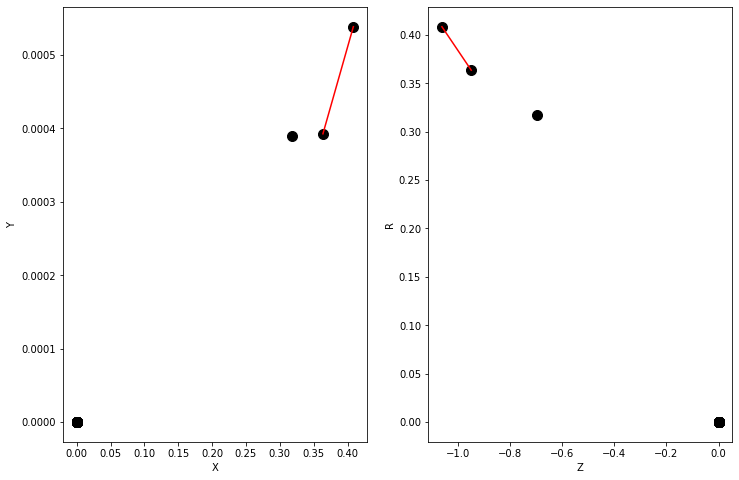

Y = [1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.583719   0.61797845 0.62832636 0.5987407  0.3946789  0.3929706
 0.32353073 0.32220277 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.929, precision 1.000, recall 0.500


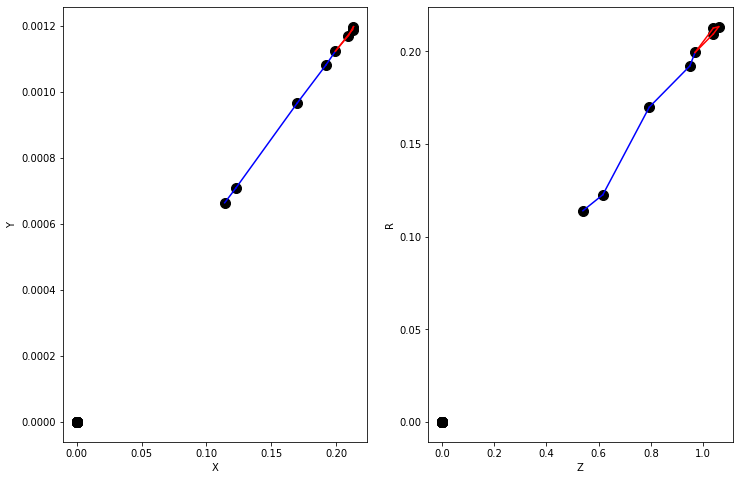

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.5267711  0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


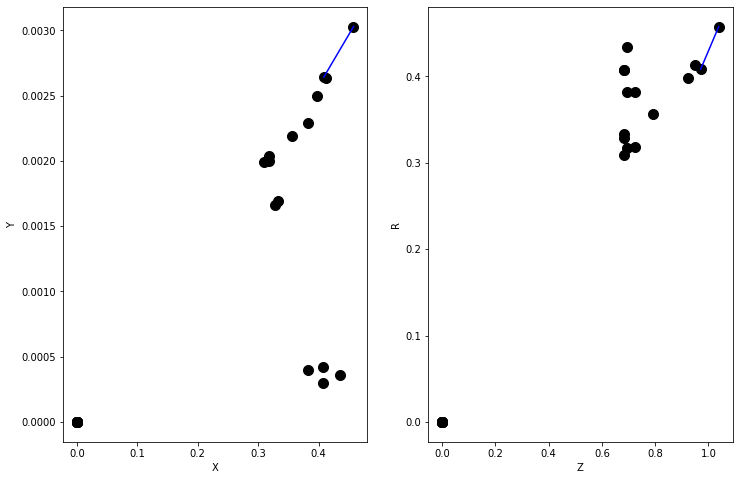

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.0543462e-05 6.0764294e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

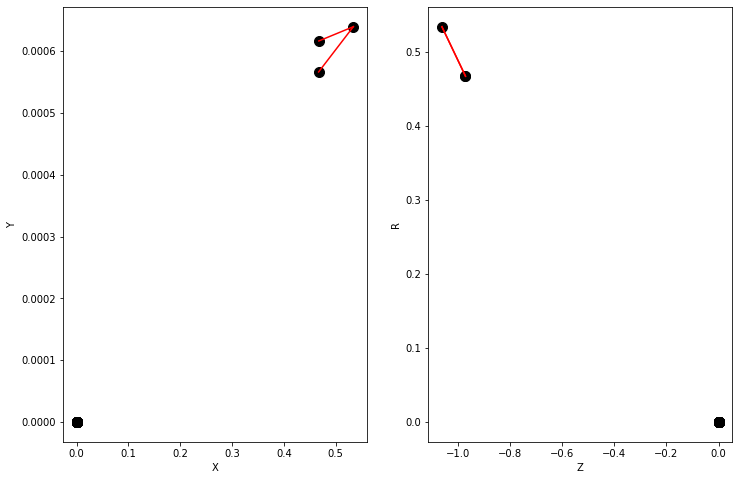

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [3.8653066e-05 3.7400769e-05 3.8303155e-05 3.3255241e-05 3.4585206e-05
 3.4586723e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

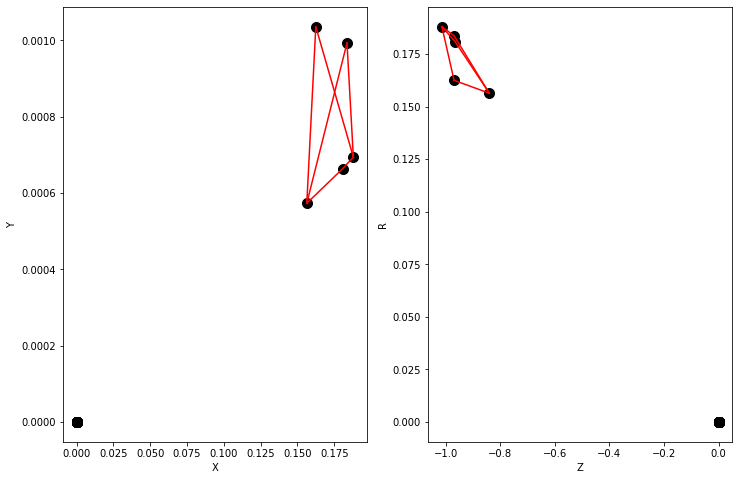

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.5267166e-05 4.5477162e-05 3.9860835e-05 3.7420428e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

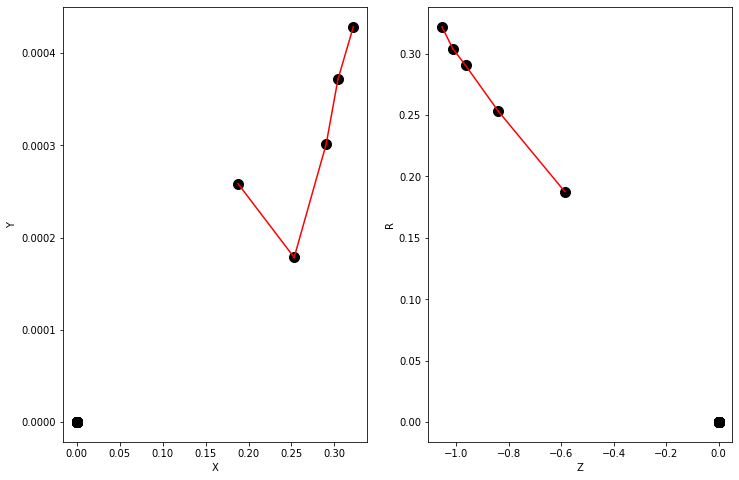

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.08614181 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


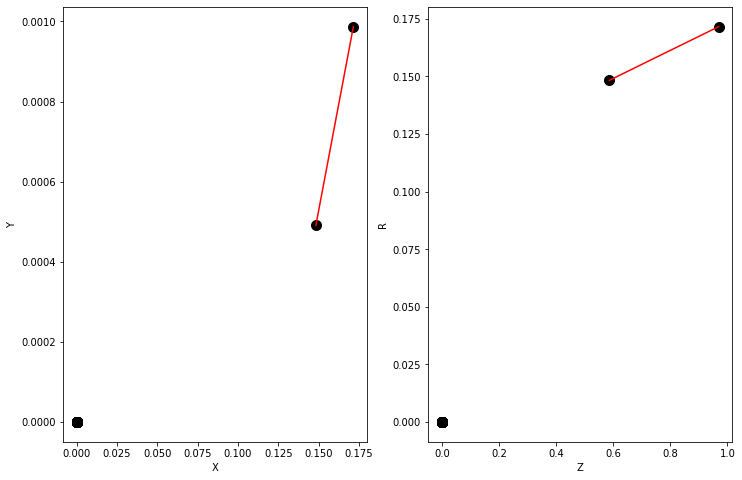

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.593318e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

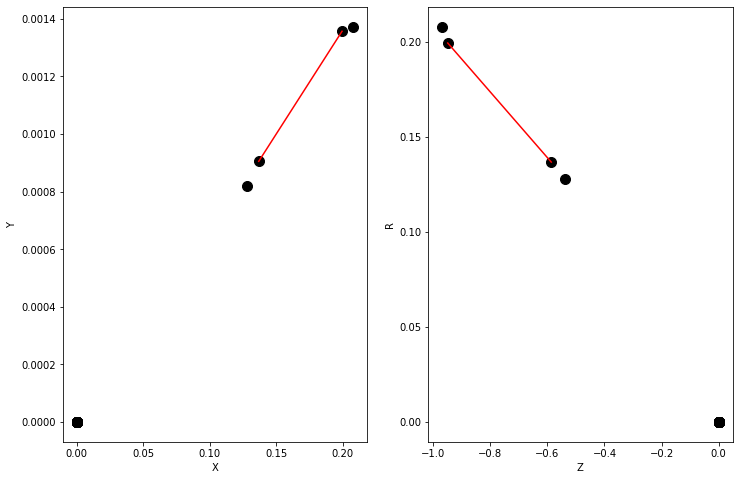

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.9774502e-05 5.7289333e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

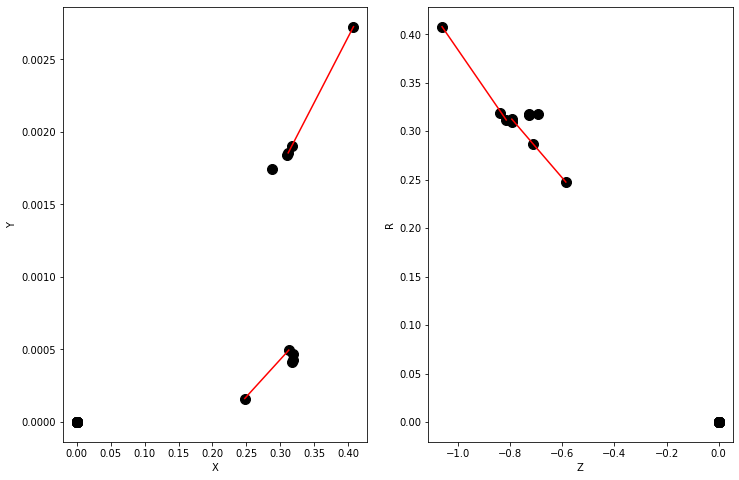

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.576193e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

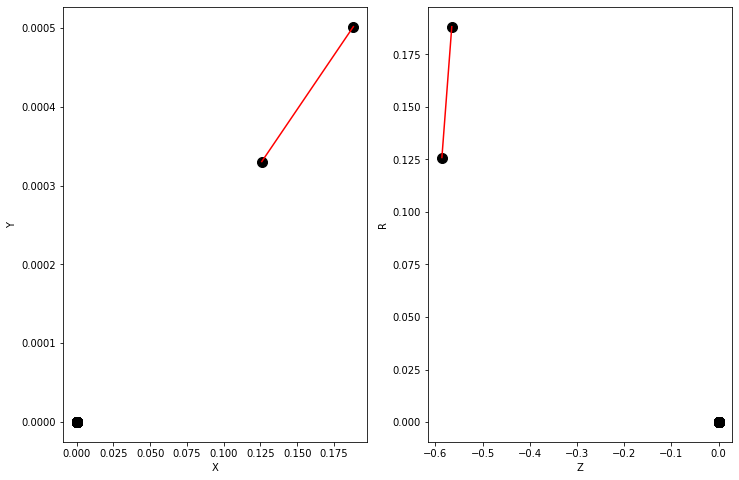

Y = [1. 1. 1. 1. 0. 1. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.6180972e-01 5.4877317e-01 8.1433421e-01 3.3895254e-01 3.1800985e-01
 2.8326839e-01 2.3941736e-01 4.4842637e-01 3.9756718e-01 3.5625958e-01
 3.3995295e-01 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

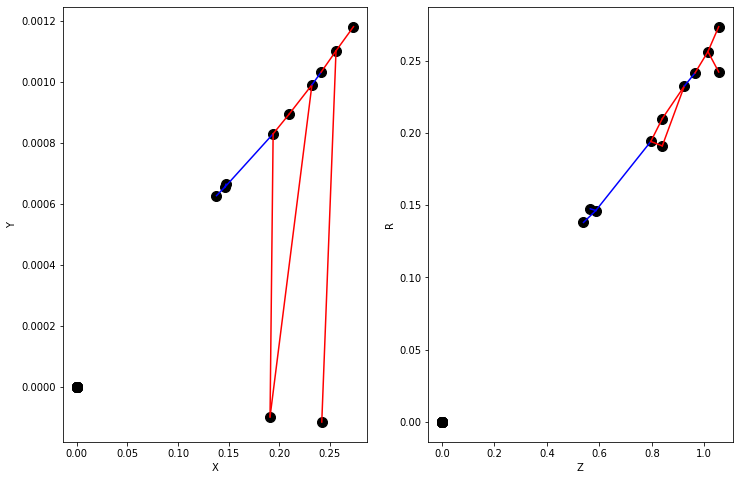

Y = [1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.3255324e-01 8.6356640e-01 5.9441888e-01 6.9141614e-01 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

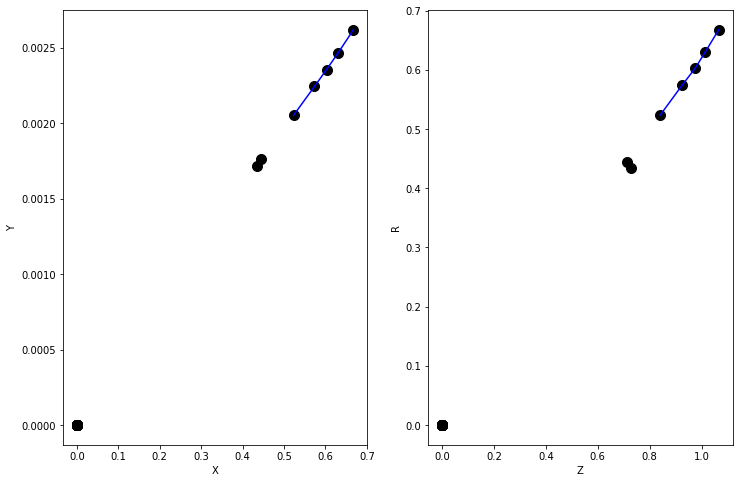

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.6998073e-05 6.5591368e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

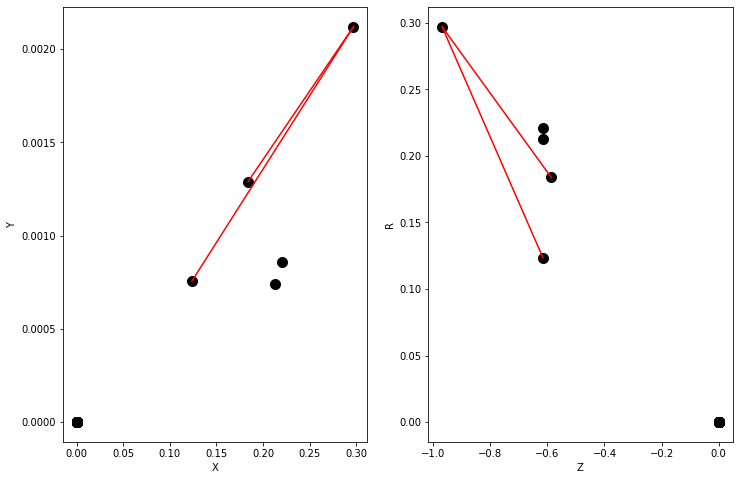

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.05487404 0.09284595 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


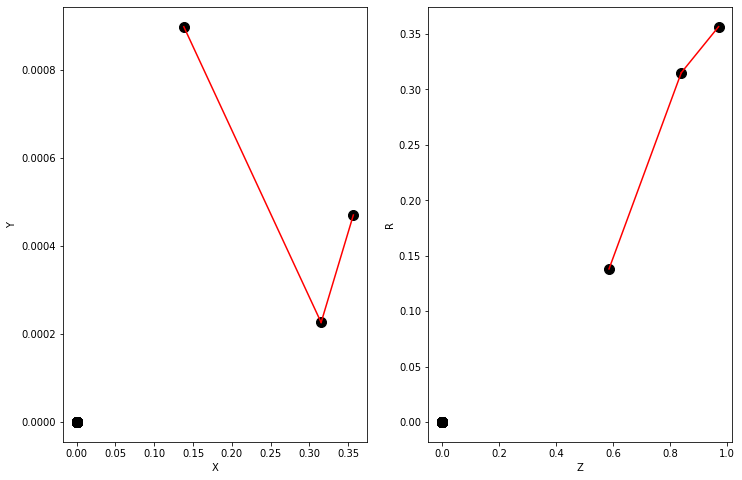

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.24585211 0.17384224 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


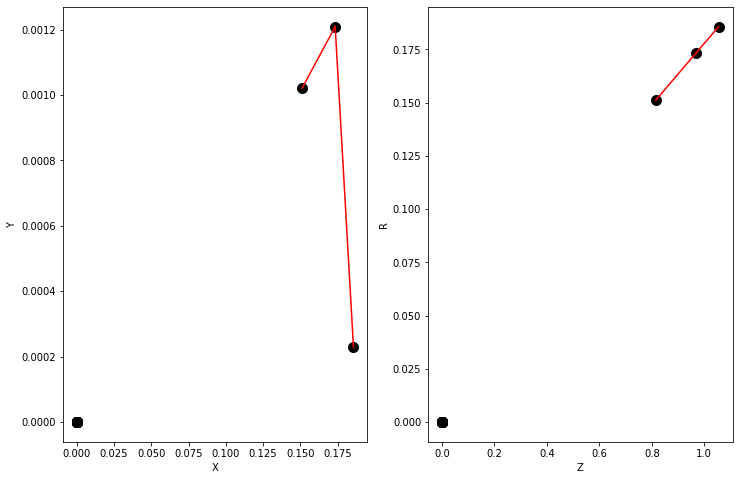

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.6451363  0.7214318  0.60800695 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.946, precision 0.000, recall 0.000


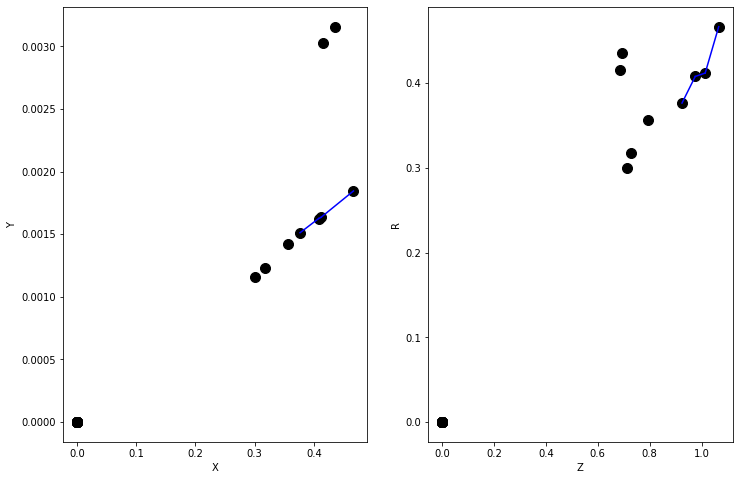

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.1256363e-05 6.7065950e-05 3.8316015e-05 3.8139060e-05 3.1951357e-05
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

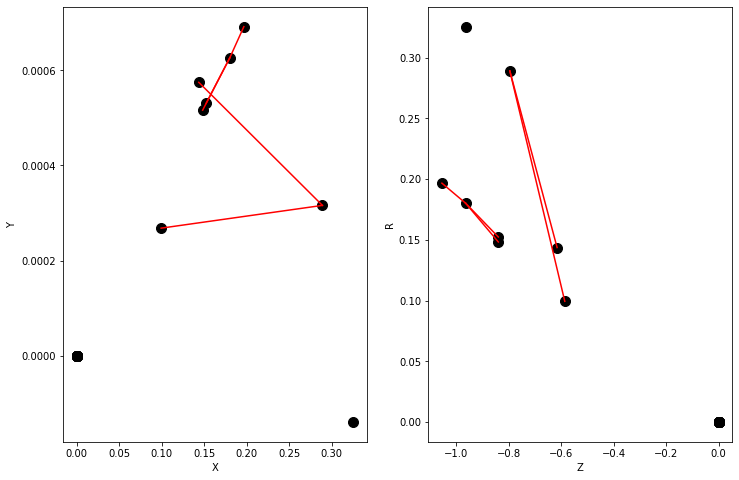

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.9790665e-05 6.9954505e-05 5.8565678e-05 6.7697198e-05 5.9642742e-05
 5.9780770e-05 6.7648281e-05 5.8593945e-05 5.9078822e-05 6.8319918e-05
 6.0173359e-05 6.0312559e-05 6.8270027e-05 5.9106998e-05 3.7342001e-05
 4.2048614e-05 4.2898690e-05 4.8620601e-05 4.3896700e-05 4.9740713e-05
 4.3356235e-05 4.9105907e-05 4.2442294e-05 4.8083013e-05 3.6998485e-05
 4.1646475e-05 4.2485950e-05 3.9124014e-05 3.8006645e-05 4.3387794e-05
 3.9890270e-05 3.8747694e-05 3.5801091e-05 3.5696703e-05 3.5653971e-05
 3.5758199e-05 3.6911228e-05 3.6801990e-05 3.6760463e-05 3.6869504e-05
 3.5249832e-05 3.5147652e-05 3.5108125e-05 3.5210152e-05 3.2798212e-05
 3.3682991e-05 3.2648670e-05 3.2688829e-05 3.3569217e-05 3.2540036e-05
 3.2902502e-05 3.3791577e-05 3.2752174e-05 3.3012820e-05 3.3906330e-05
 3.2861735e-05]
--------------------

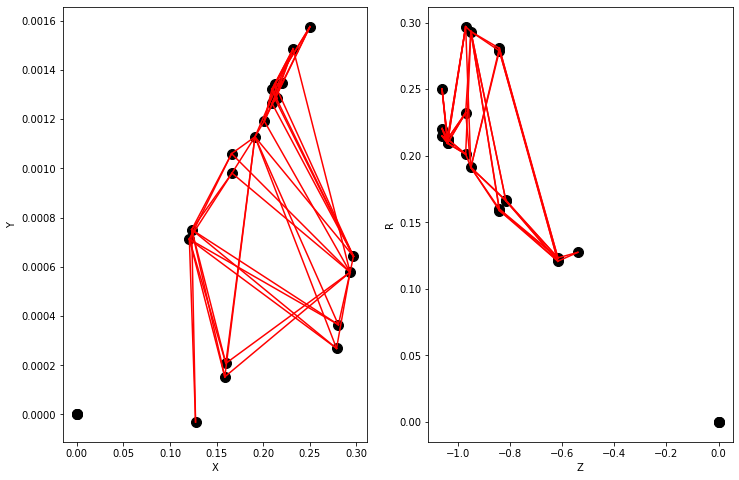

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.8580088e-05 5.8144142e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

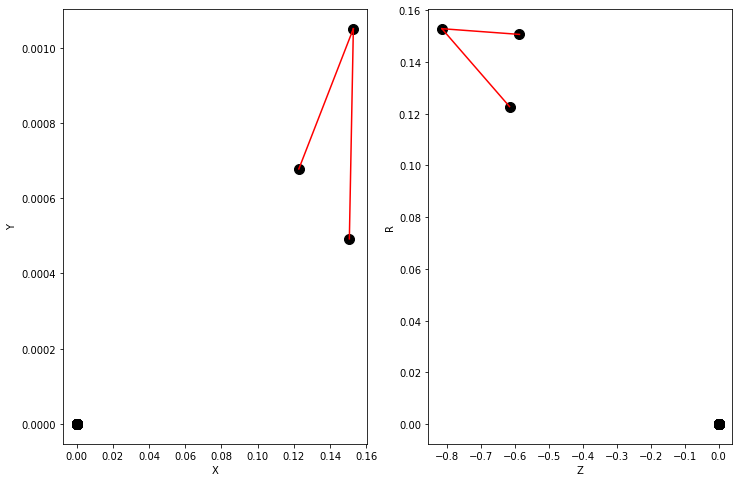

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.32441    0.2882642  0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


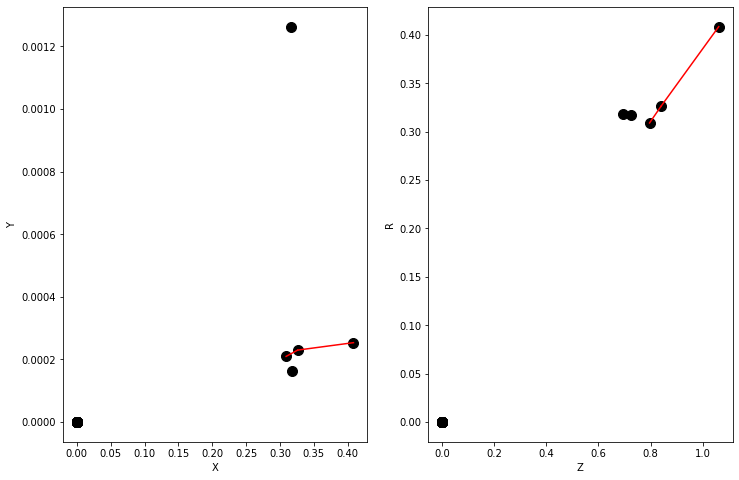

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.235812e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

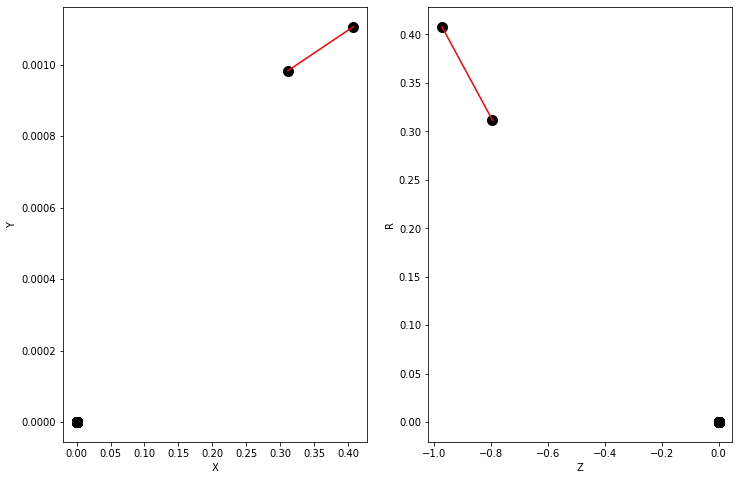

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.4964803e-05 3.8688398e-05 3.5630517e-05 3.2887881e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

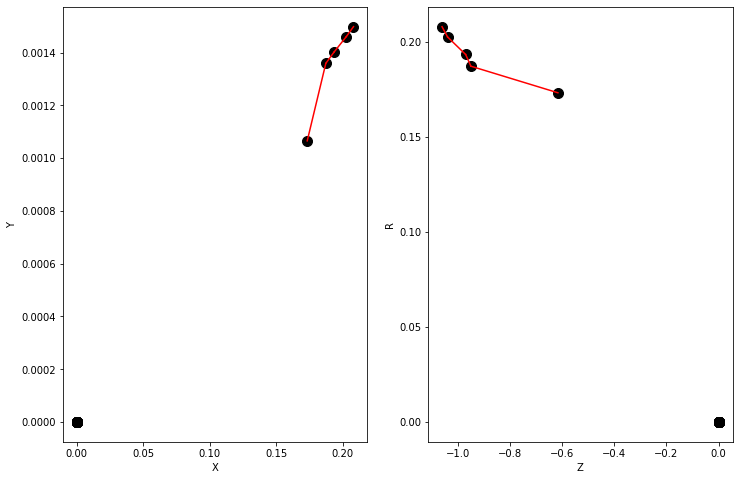

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.07241163 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


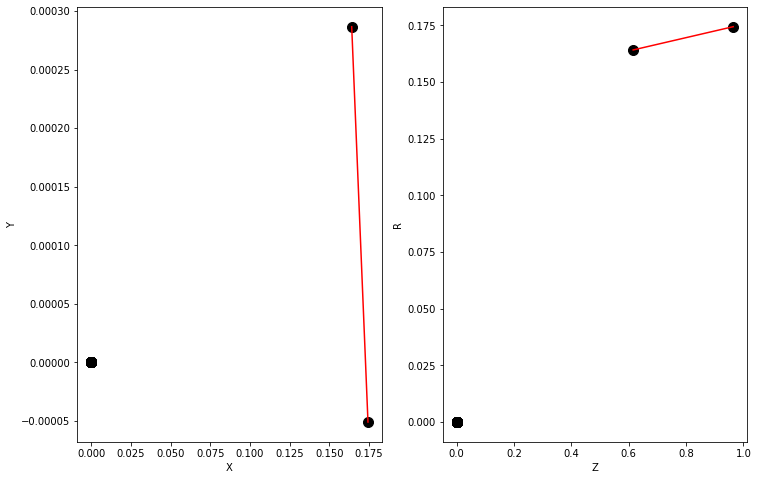

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.04581452 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


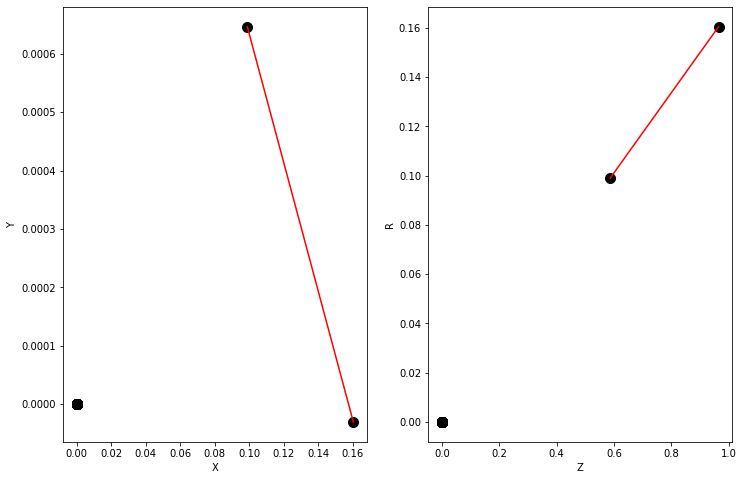

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.45373613 0.5232311  0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


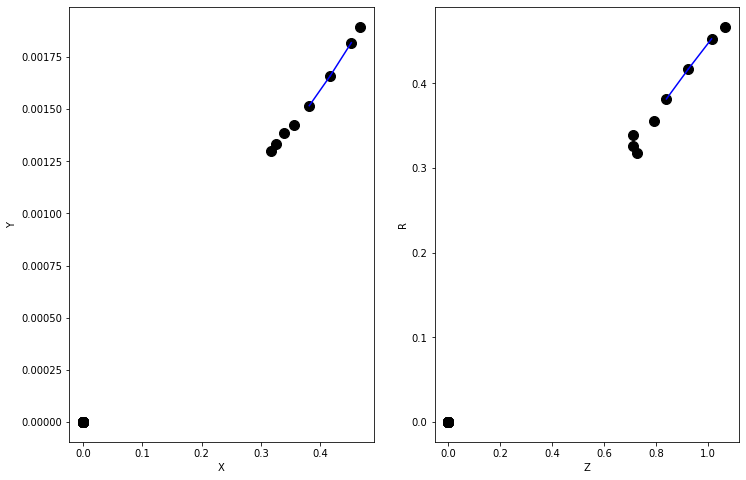

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.2454416  0.39273378 0.6335101  0.502943   0.47301596 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.946, precision 0.000, recall 0.000


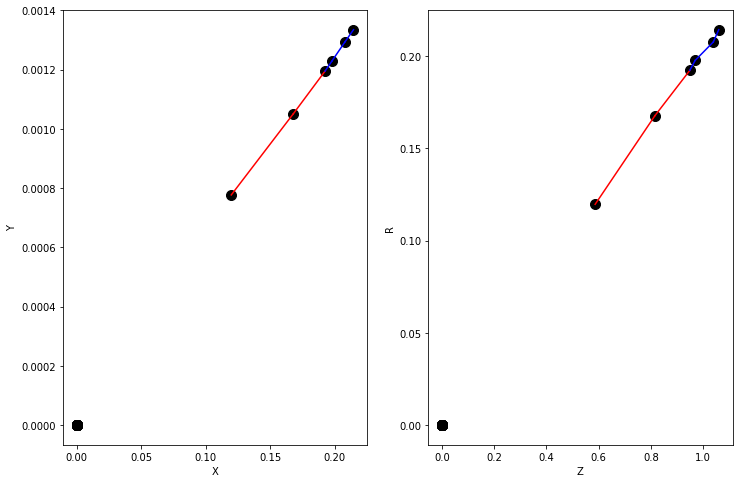

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.779814e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

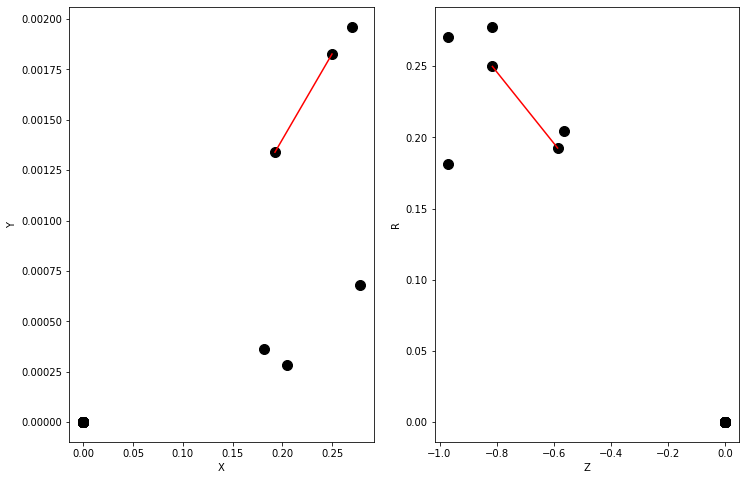

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.0100645  0.0067319  0.0100848  0.00674482 0.01601378 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


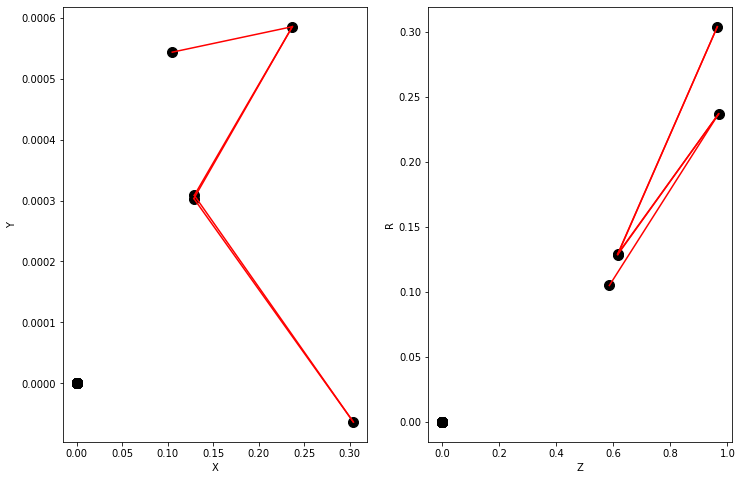

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.11394395 0.03545939 0.17660752 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


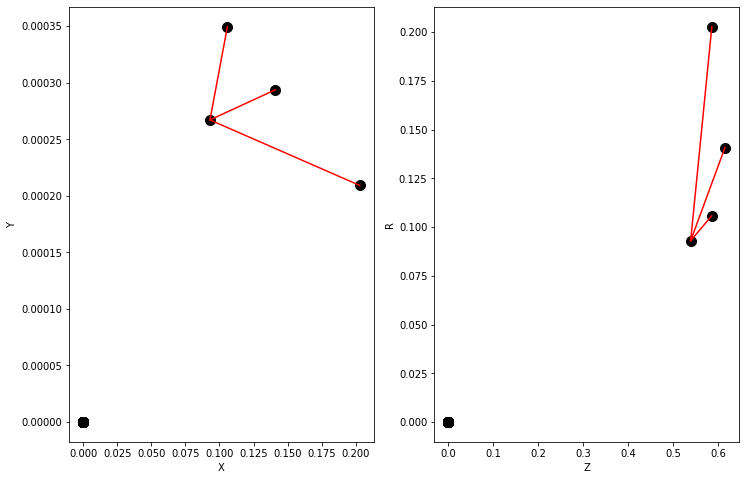

Y = [0. 0. 1. 0. 1. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.2911032  0.27232972 0.37236086 0.35146105 0.4686037  0.4084057
 0.5278519  0.4852892  0.22523256 0.17903423 0.21064313 0.20118955
 0.18852982 0.1745428  0.1561475  0.14286175 0.2671214  0.22120841
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.929, precision 0.500, recall 0.500


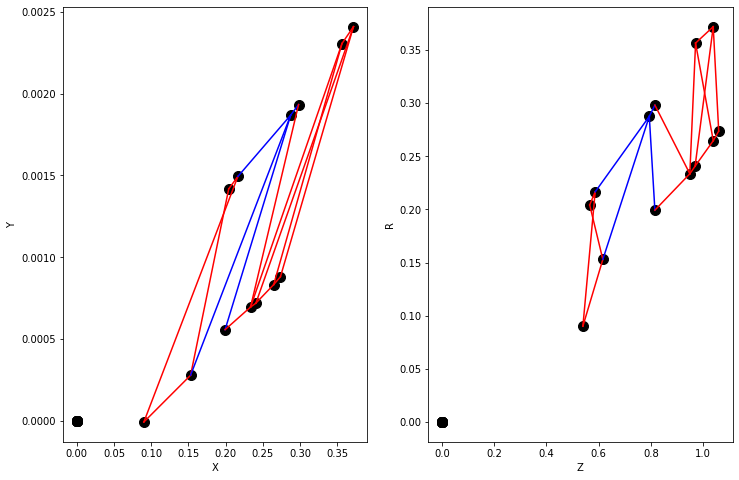

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.19807194 0.17391665 0.17320499 0.17681907 0.17966115 0.17659068
 0.00688501 0.00679777 0.00653994 0.00553336 0.0054631  0.00525514
 0.0049639  0.00490115 0.0047164  0.00566918 0.00559721 0.00538426
 0.00594733 0.00587183 0.0056484  0.00579259 0.00571903 0.00550128
 0.02729542 0.02673843 0.02493152 0.1374141  0.13551041 0.16152827
 0.16160762 0.15864977 0.15871805 0.14007066 0.13831042 0.13829623
 0.1365451  0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


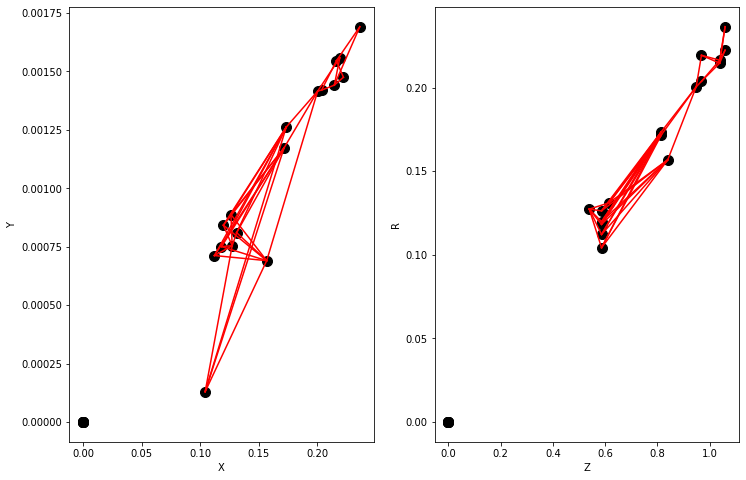

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [9.930800e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

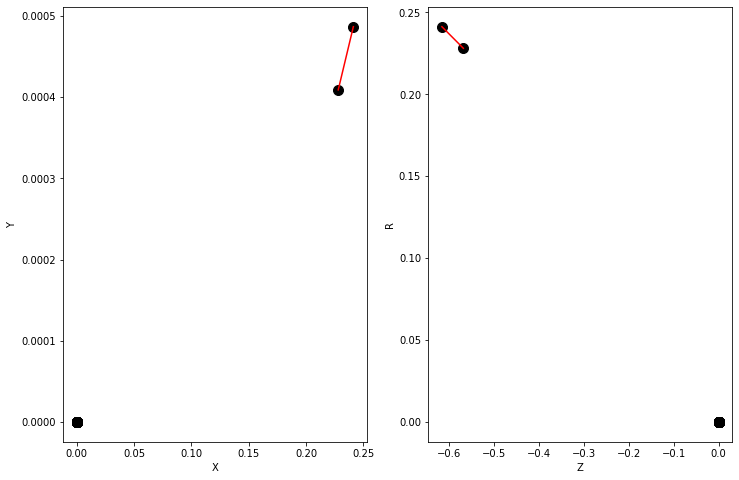

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.36361158 0.38151428 0.23347226 0.2529194  0.1499363  0.15006614
 0.14871271 0.14884001 0.05141439 0.05509941 0.05112464 0.05130742
 0.05498529 0.05101828 0.05003791 0.05364008 0.0497556  0.04993222
 0.05352733 0.04965054 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


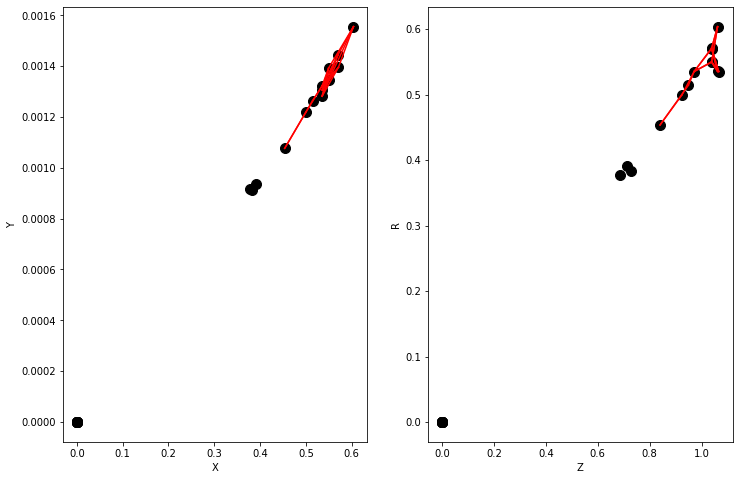

Y = [1. 0. 1. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.34489173 0.3029962  0.45538583 0.41828975 0.7745774  0.6747966
 0.56376404 0.4966314  0.45452213 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.857, recall 0.857


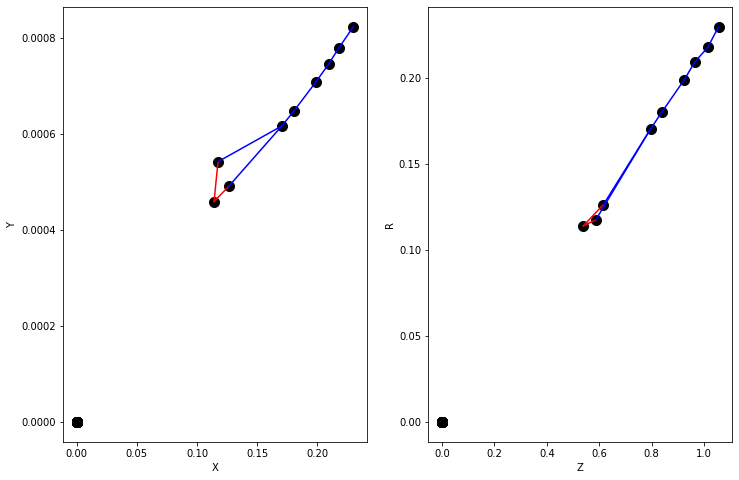

Y = [1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.6447750e-01 5.4183513e-01 8.7179750e-01 8.1745946e-01 7.0272189e-01
 5.8489078e-01 5.0234669e-01 4.8476231e-01 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

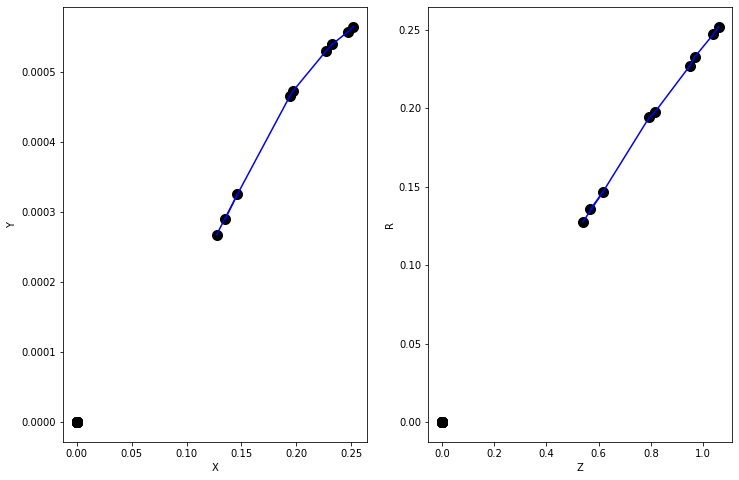

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.11555883 0.10020076 0.11040116 0.10061584 0.12667955 0.11025413
 0.12119795 0.1106859  0.32036364 0.20217155 0.25197423 0.2211497
 0.42219868 0.35531783 0.3120198  0.30396518 0.27753502 0.38603336
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


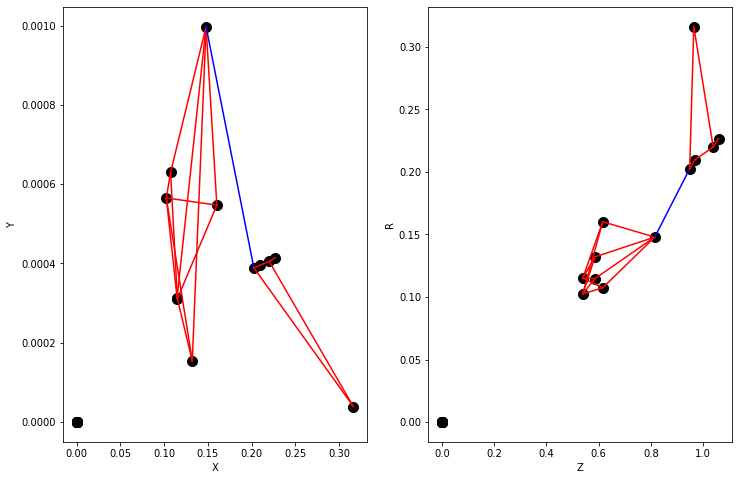

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.0197348e-05 5.3553242e-05 4.6603411e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

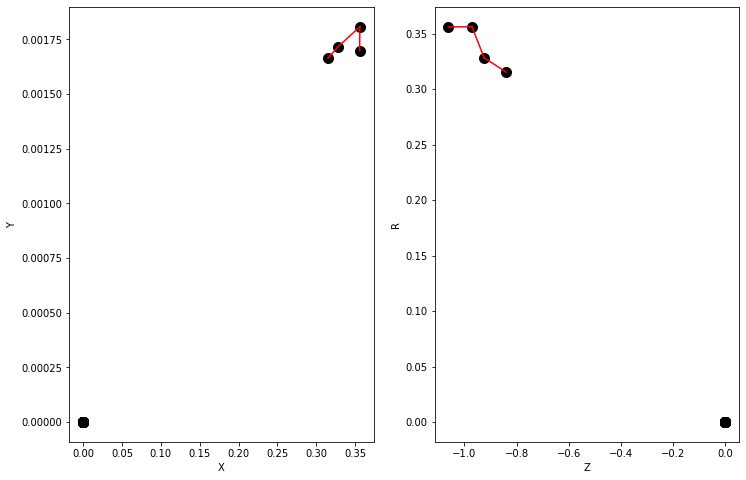

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.778287e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

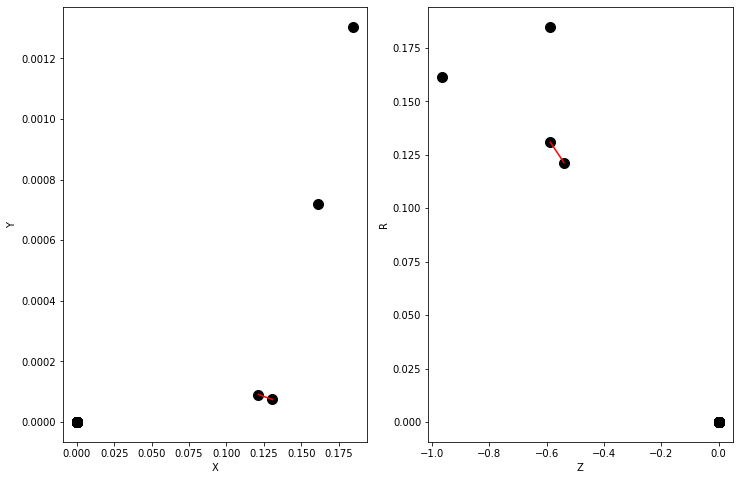

Y = [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.10571412 0.1106493  0.29766887 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


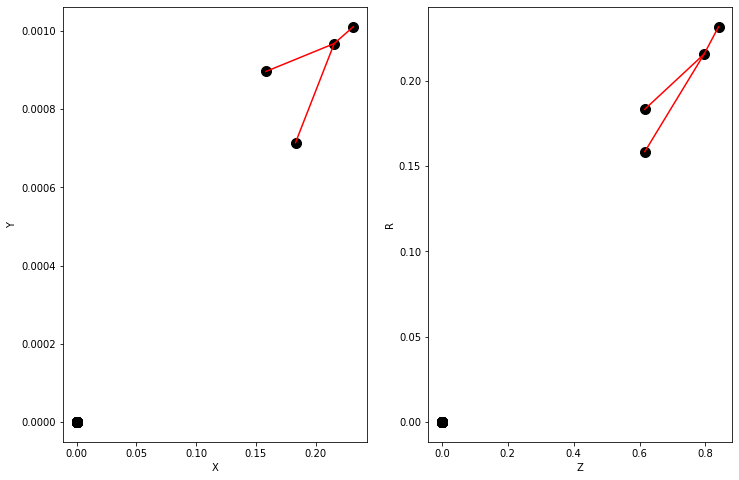

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.16586316 0.14763431 0.1453446  0.29192922 0.29016164 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


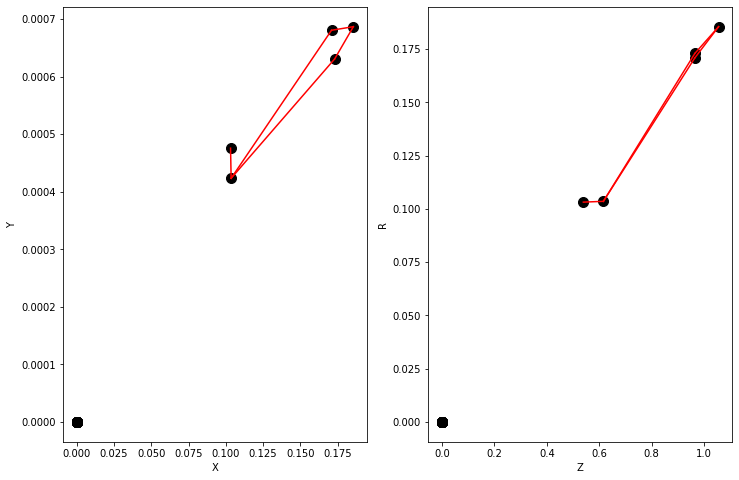

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.22167042 0.30946183 0.5470268  0.51281416 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


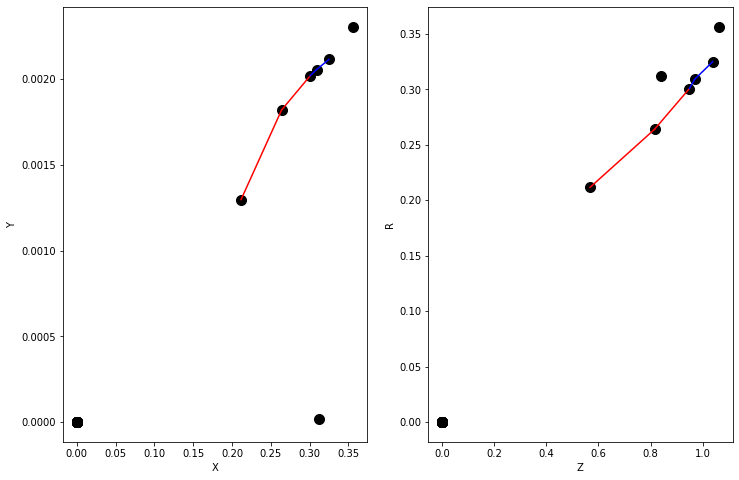

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.1321574e-05 6.9747883e-05 5.8890106e-05 3.6836824e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

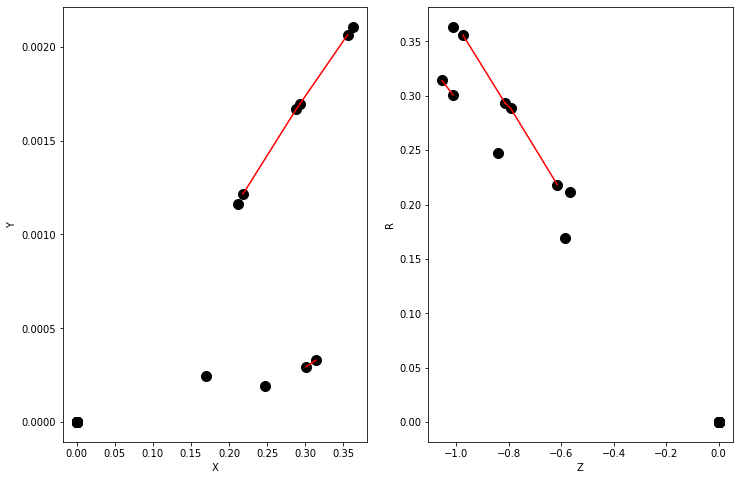

Y = [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.26357797 0.26101378 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


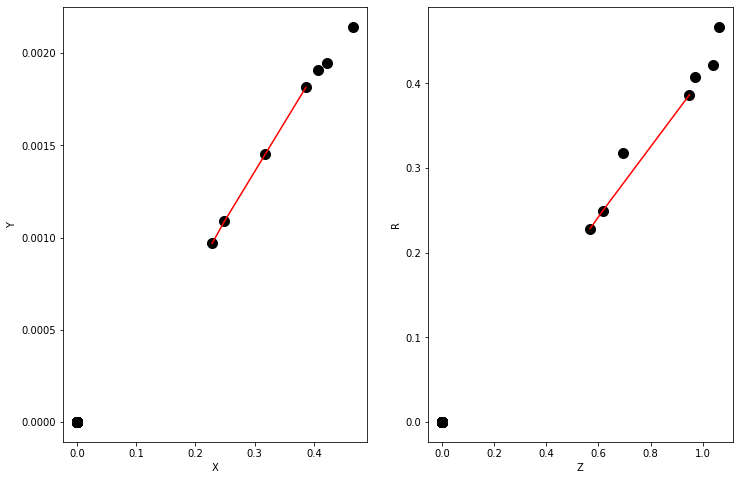

Y = [1. 1. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.5705808  0.2912724  0.17648092 0.46404636 0.52337664 0.5285766
 0.49914357 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 1.000, recall 0.833


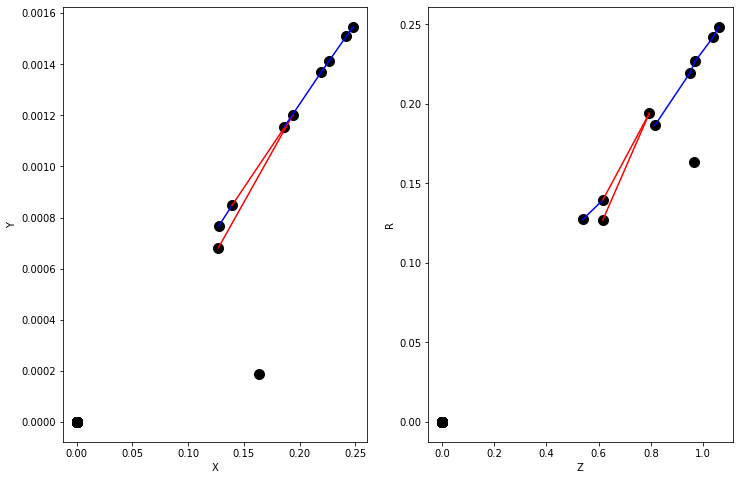

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.03164434 0.03855615 0.03610709 0.24827017 0.36339605 0.4468522
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


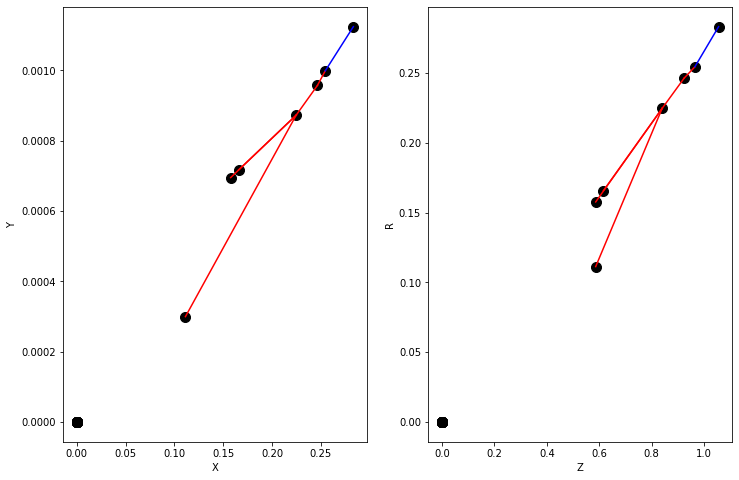

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.6062509e-05 5.0050854e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

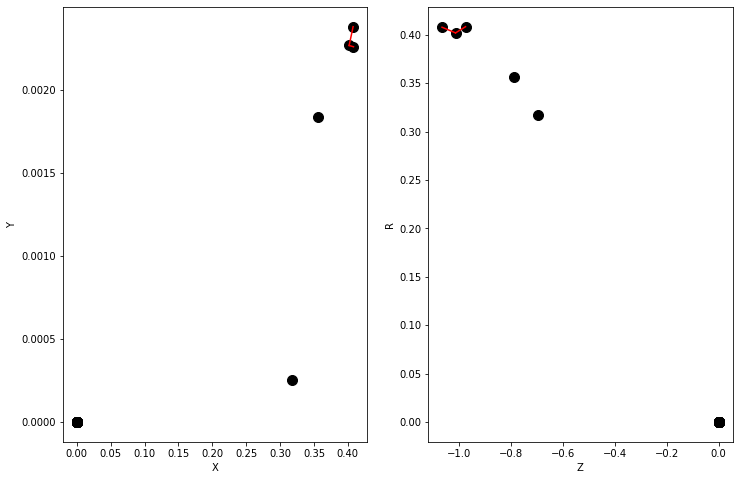

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.20140117 0.08580122 0.08223334 0.02959959 0.05874577 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


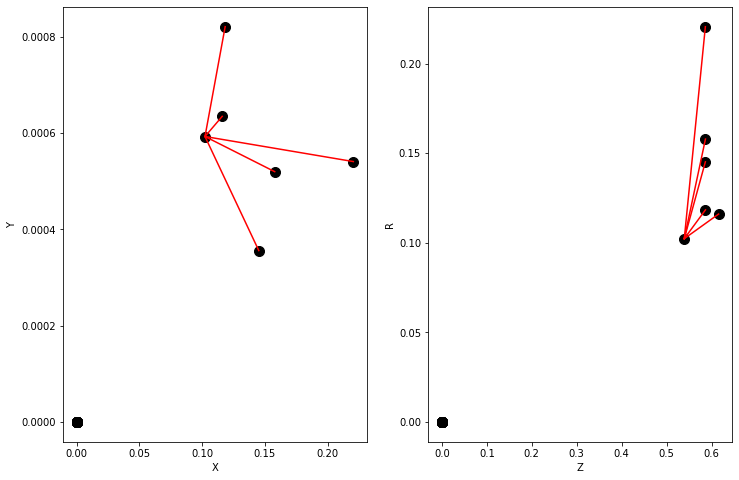

Y = [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.45556998 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 1.000, recall 1.000


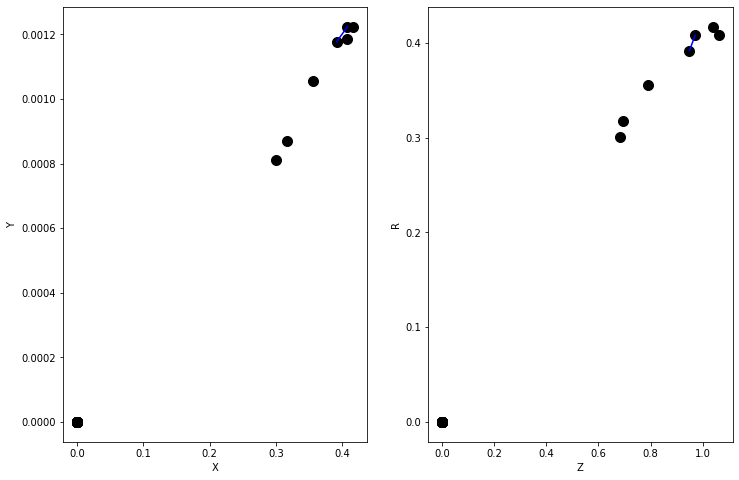

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.14599787 0.14950536 0.3548576  0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


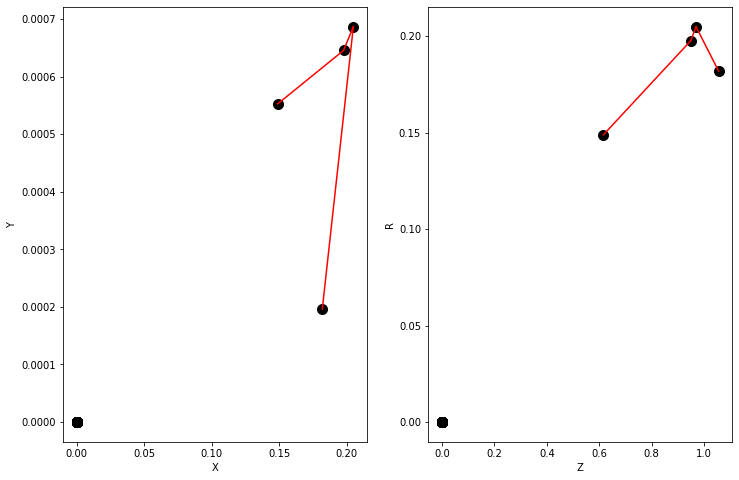

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.04143583 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


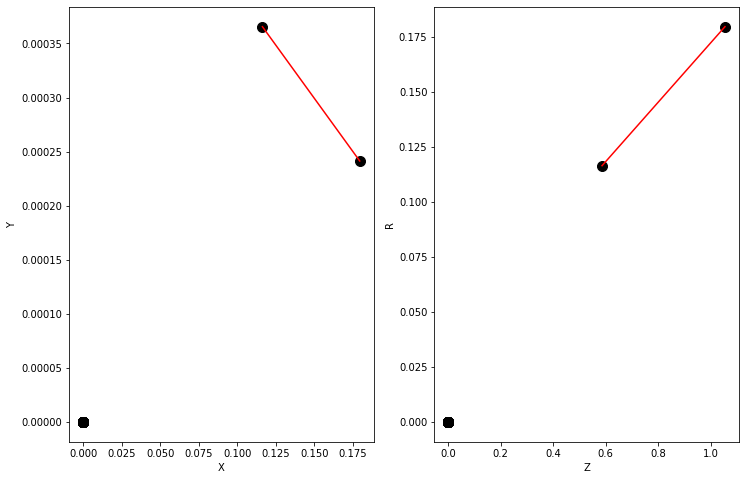

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.066686   0.06317102 0.06363278 0.13142368 0.1530841  0.14810702
 0.3999579  0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


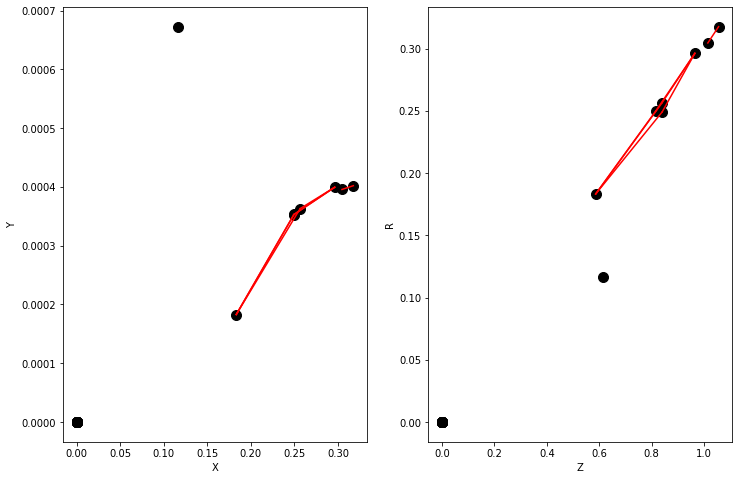

Y = [1. 0. 1. 0. 1. 0. 1. 0. 1. 0. 1. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.284933   0.31201184 0.2842315  0.31146732 0.37396586 0.44891295
 0.39819196 0.39422643 0.27153385 0.3012796  0.3105712  0.30721965
 0.31800756 0.08161537 0.07706098 0.09730756 0.1928659  0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.839, precision 0.000, recall 0.000


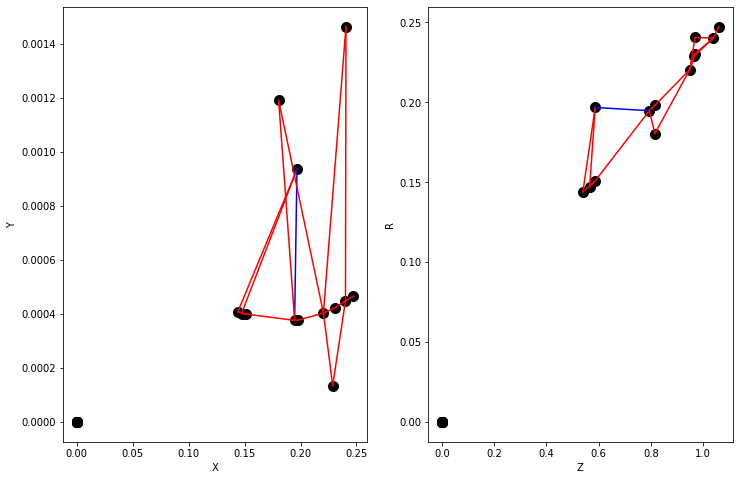

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.430324e-05 6.776379e-05 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

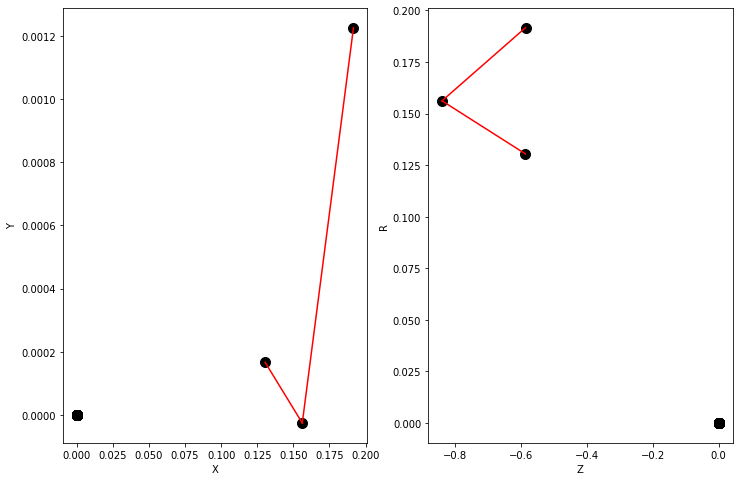

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.0001234  0.00012502 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


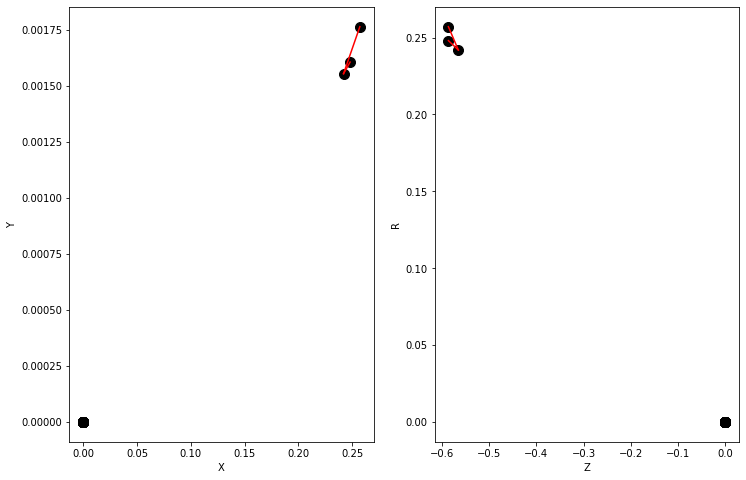

Y = [1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.65064436 0.4813122  0.35945225 0.36074045 0.34679702 0.3482287
 0.49209446 0.44251415 0.44220275 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.929, precision 1.000, recall 0.556


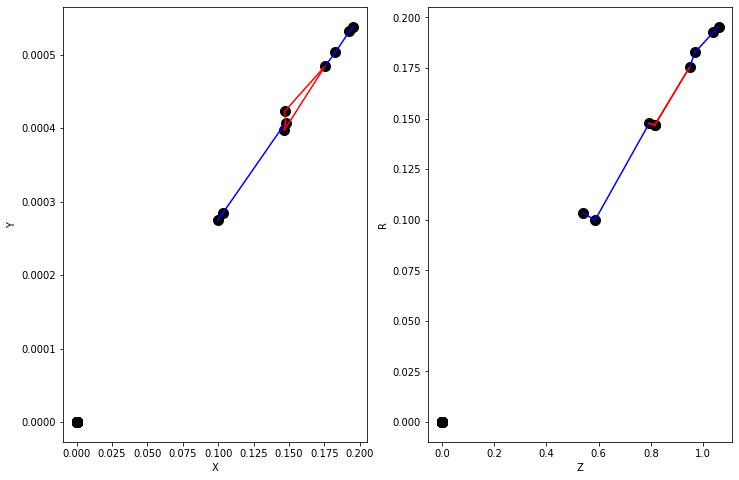

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.8263977e-05 5.7196645e-05 5.9279217e-05 5.8187794e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

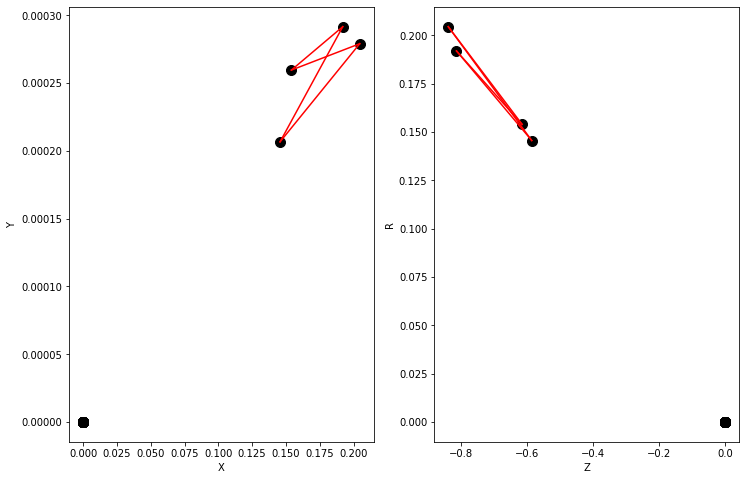

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.255506e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

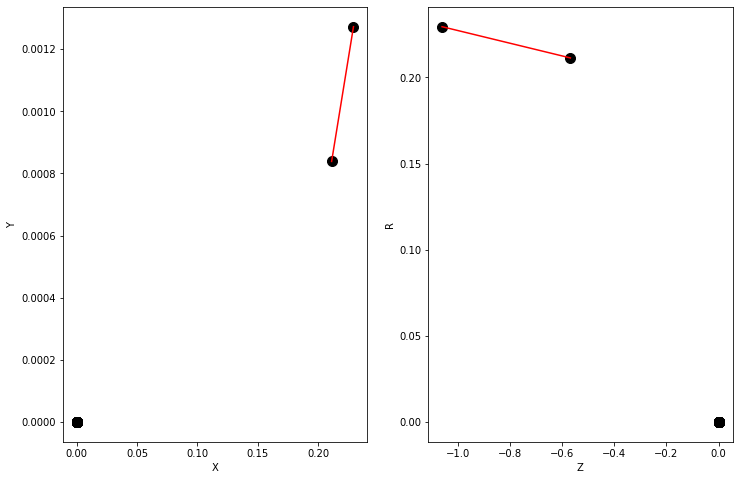

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.32201338 0.24168266 0.18087026 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


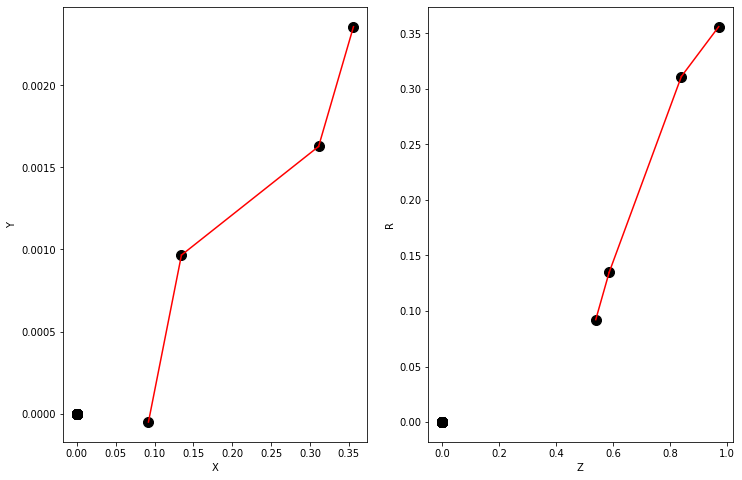

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.16272537 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


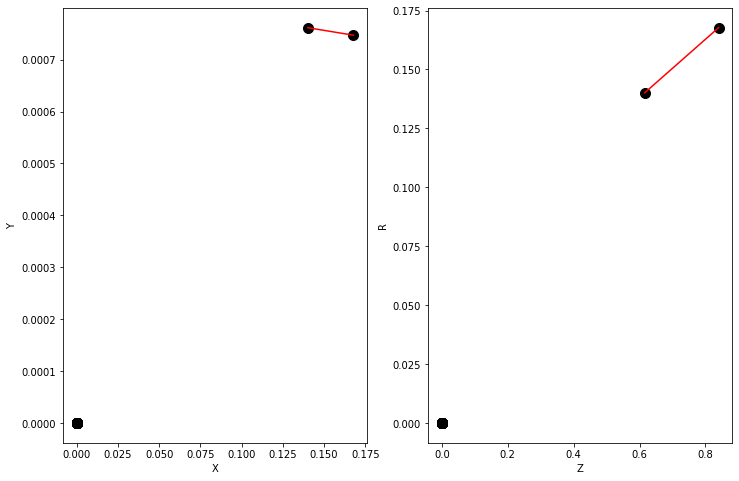

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.9484722e-05 6.0819832e-05 5.3282693e-05 4.5603414e-05 3.9651255e-05
 3.6575166e-05 3.3991284e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

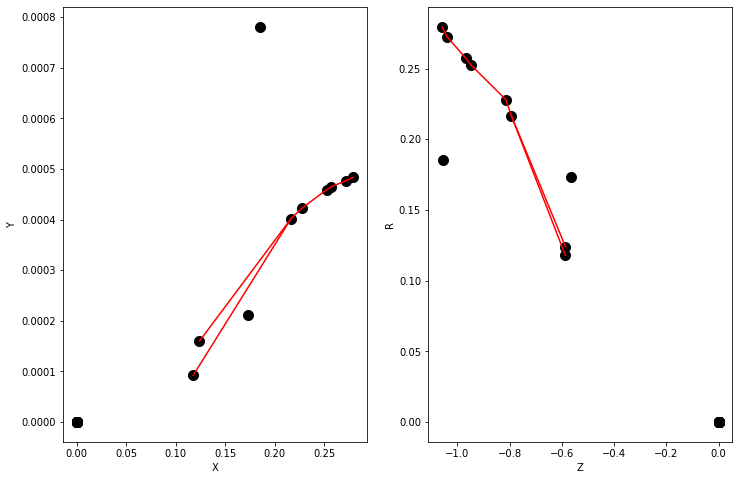

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.36311254 0.3022039  0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


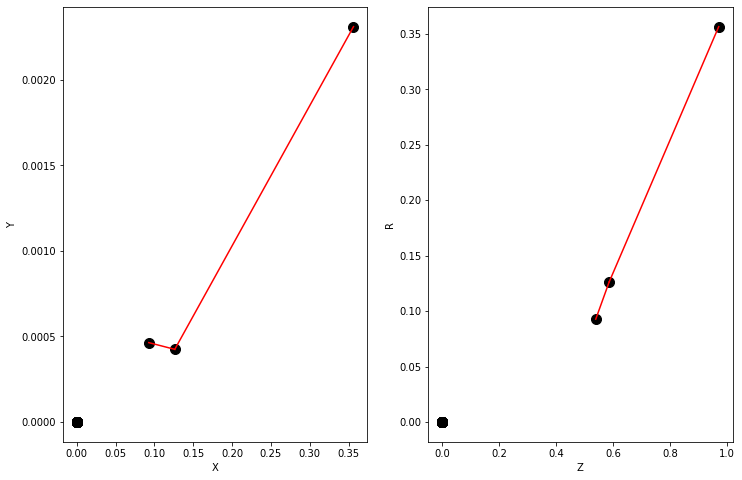

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.45613495 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


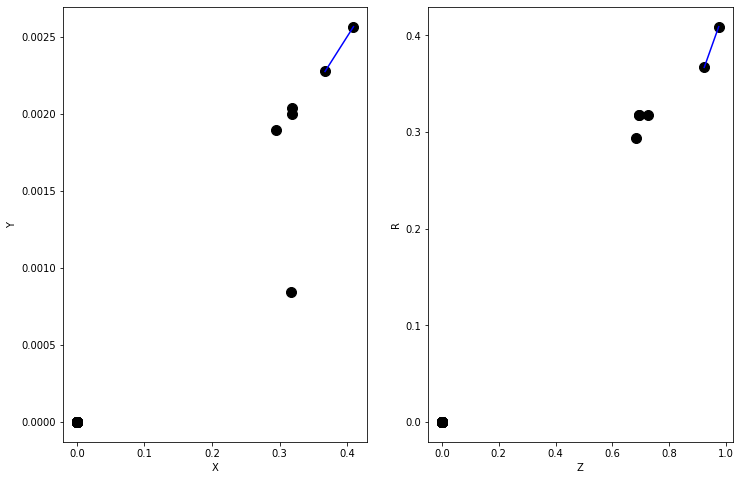

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.01003921 0.00867175 0.01135516 0.00980369 0.011491   0.00992042
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


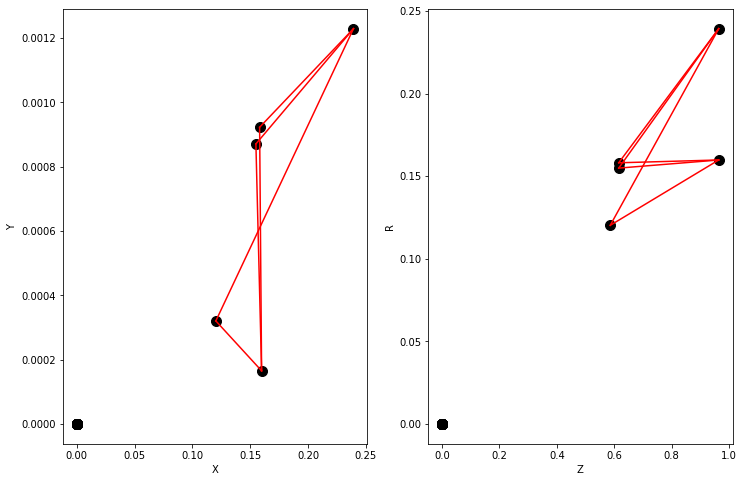

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.6232056e-05 7.2560848e-05 5.7855206e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

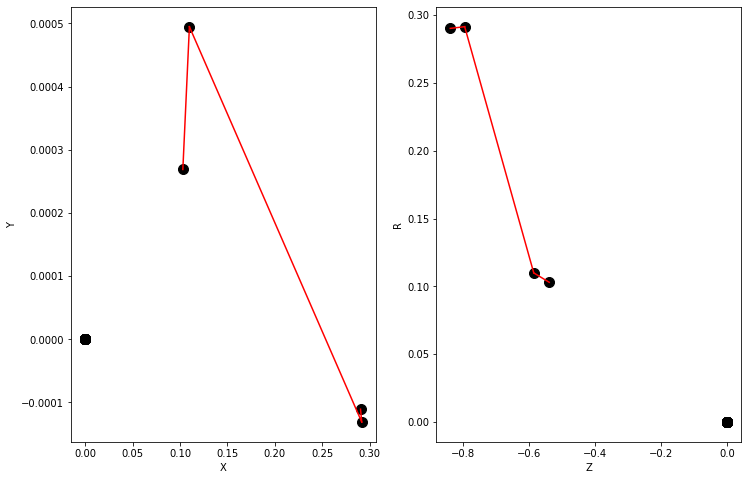

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.509432e-05 6.005498e-05 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

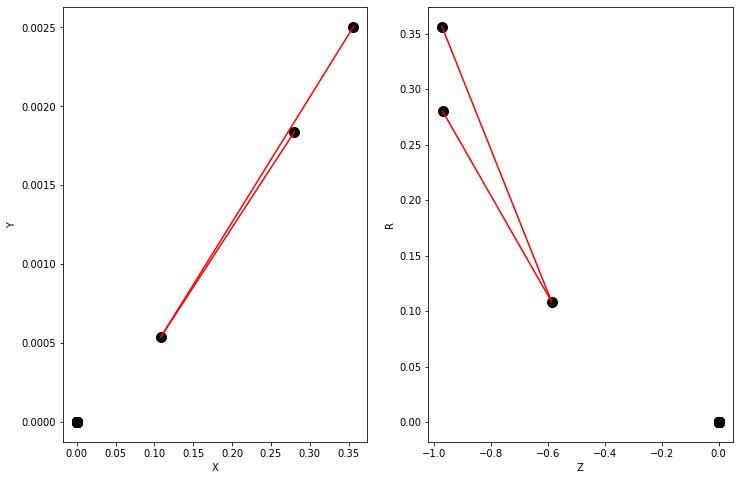

Y = [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.43359527 0.34586477 0.18437578 0.29002845 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 1.000, recall 0.500


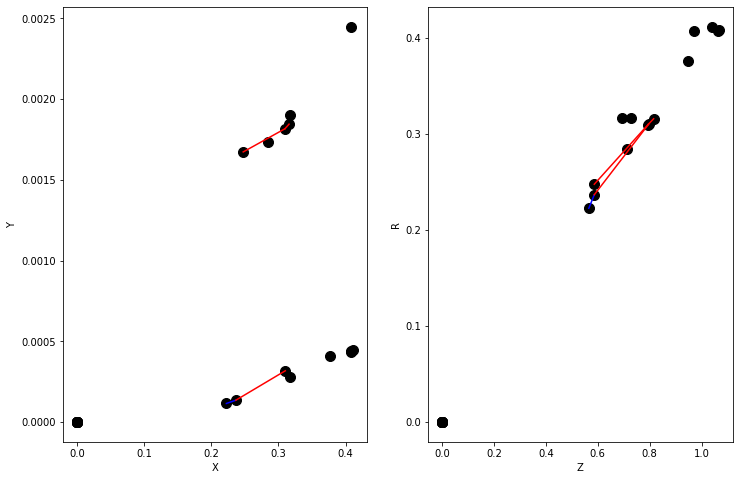

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.07386912 0.07301221 0.0679848  0.38434556 0.25565687 0.22512193
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


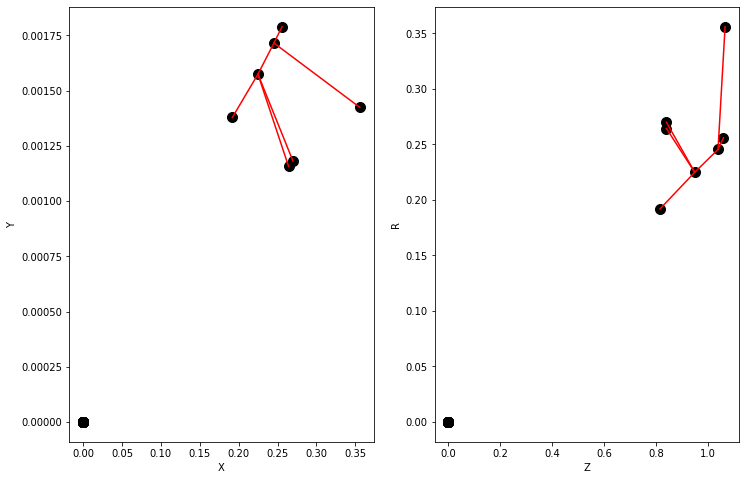

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.11132609 0.32290682 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


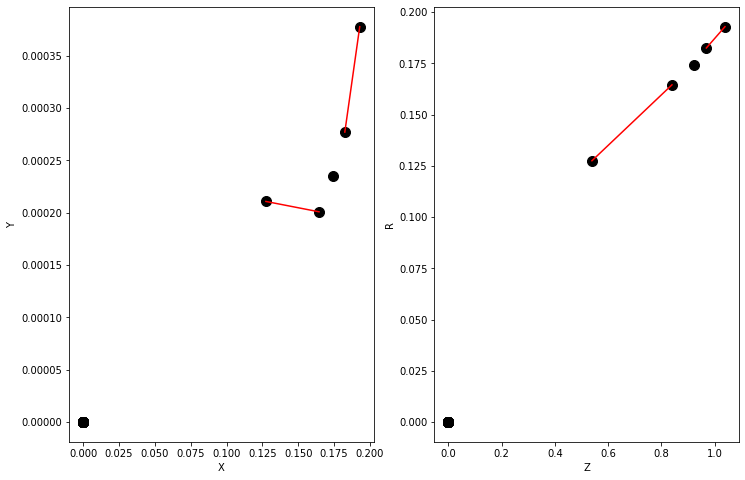

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.3618219e-05 8.1766673e-05 3.8304395e-05 3.4506076e-05 3.2034768e-05
 2.9827366e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

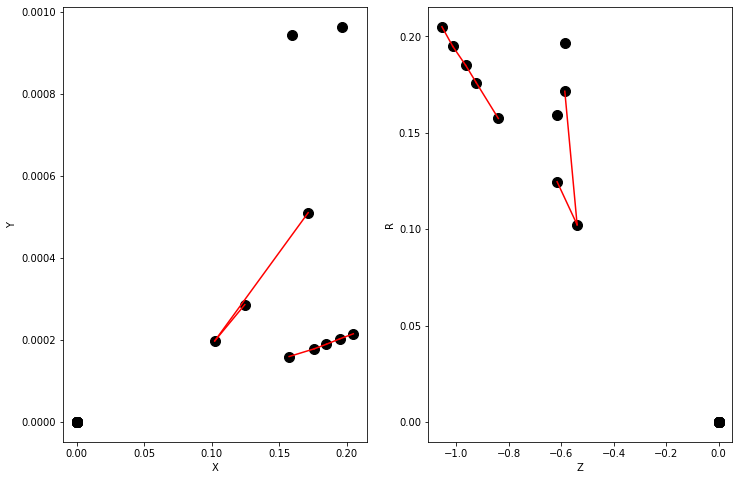

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.9491994e-05 8.9152389e-05 4.5577675e-05 4.9746595e-05 3.2062031e-05
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

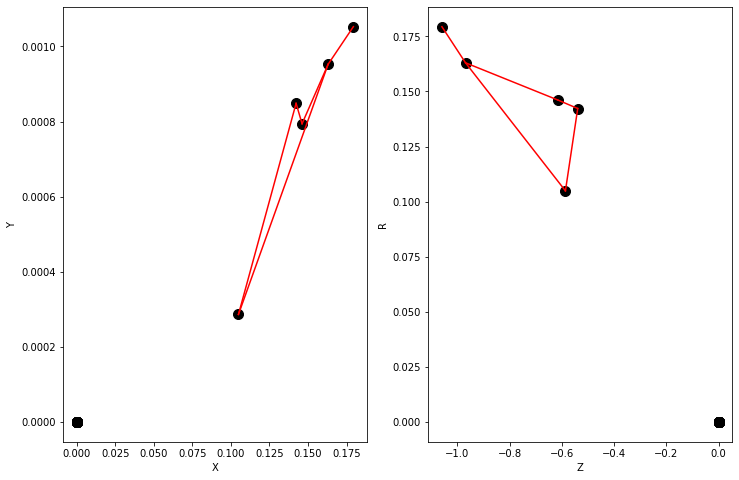

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.5861638e-05 5.4373511e-05 5.5447512e-05 5.3973650e-05 5.4369775e-05
 5.2932995e-05 4.0199364e-05 4.1223364e-05 3.9326267e-05 4.0319956e-05
 3.6174413e-05 3.0289324e-05 3.0880376e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

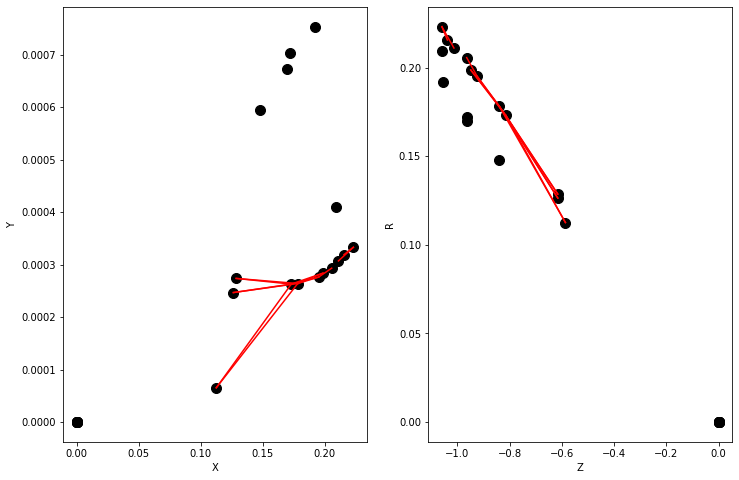

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.4365577e-05 5.3989457e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

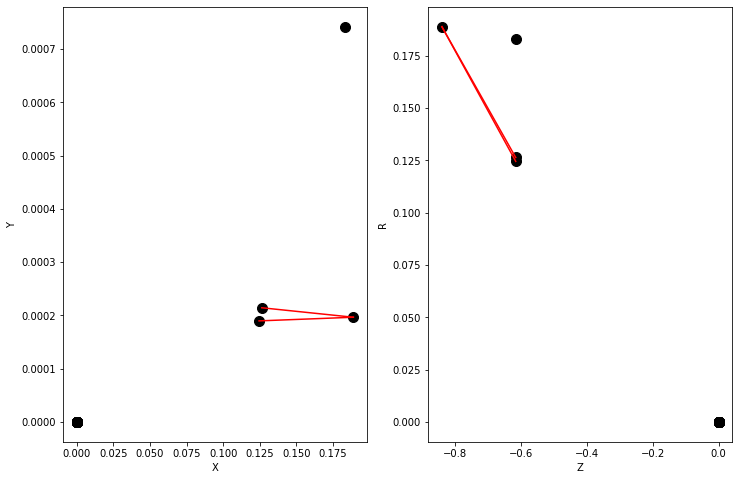

Y = [1. 0. 0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.14079188 0.15996997 0.14162986 0.02054839 0.0249853  0.02004842
 0.15048973 0.1497435  0.13747391 0.13070308 0.13566014 0.12677823
 0.13218491 0.12556785 0.13032636 0.12174146 0.28977185 0.2701073
 0.26806557 0.25980845 0.3824671  0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.893, precision 0.000, recall 0.000


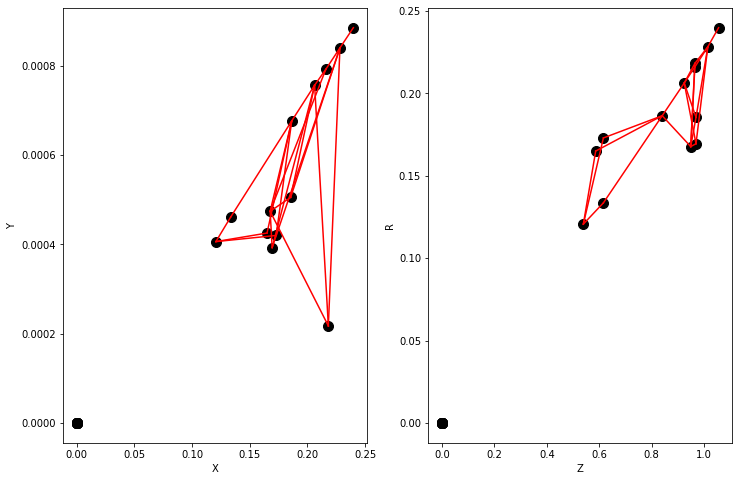

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.3986019e-05 7.1989758e-05 4.7808815e-05 5.2892578e-05 3.4646211e-05
 3.2187669e-05 2.9908257e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

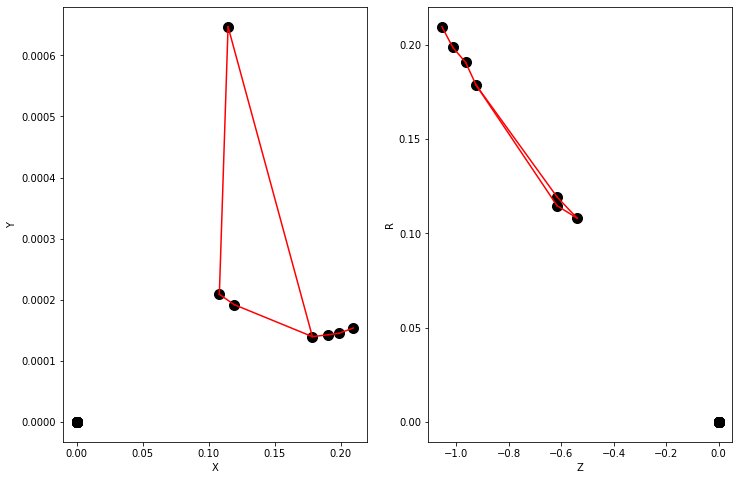

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.5600886e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

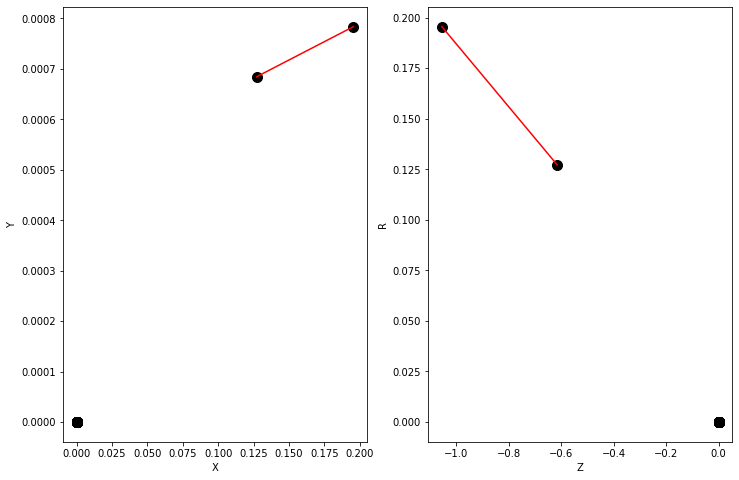

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.08065157 0.08154775 0.30059966 0.46397445 0.41984823 0.35316226
 0.34799457 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


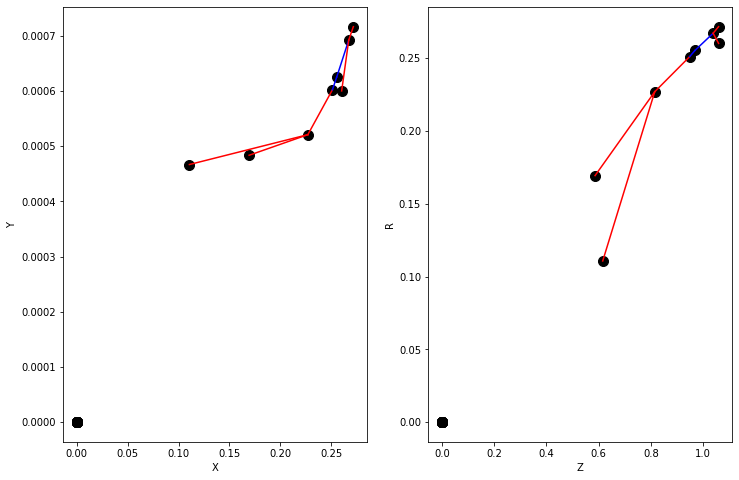

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.575594e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

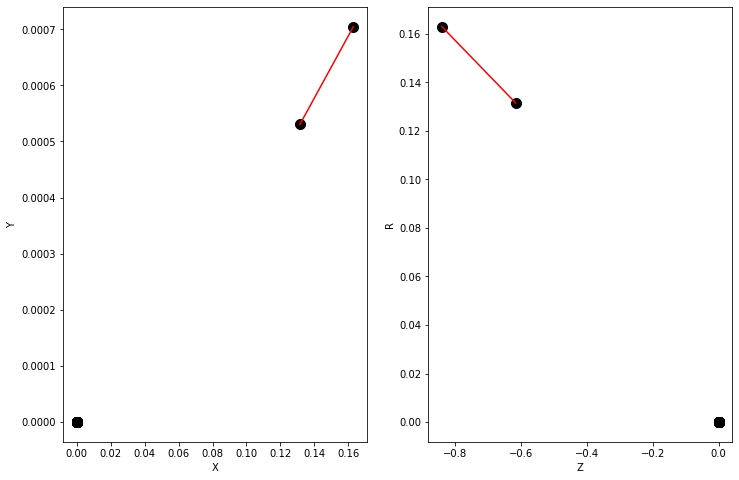

Y = [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.16157514 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


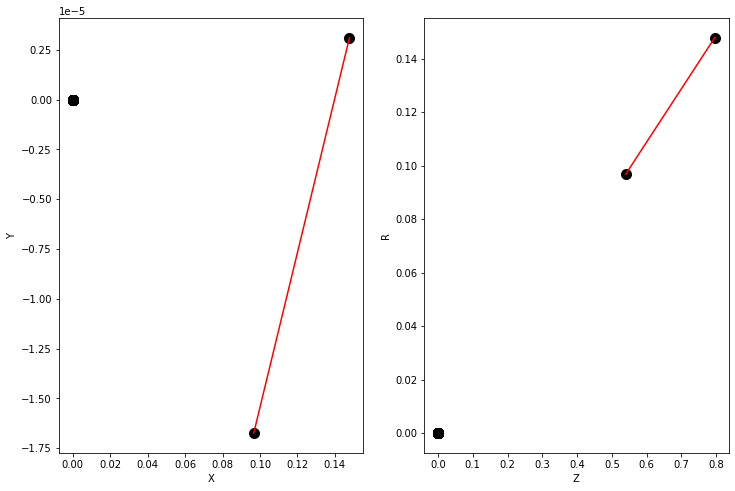

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.48046944 0.57404    0.5060827  0.5085938  0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.929, precision 0.000, recall 0.000


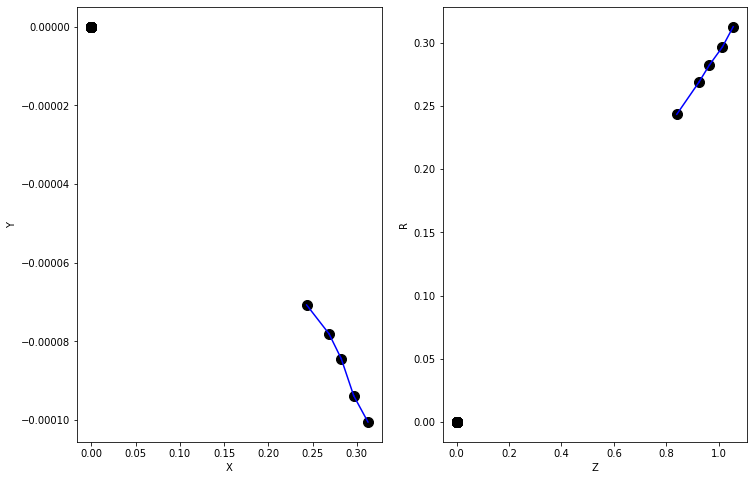

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.3669912e-05 5.3643605e-05 4.1364223e-05 4.0283943e-05 4.1424501e-05
 4.2098851e-05 4.0992894e-05 4.2153242e-05 3.6368081e-05 3.7389644e-05
 3.5562356e-05 3.6553127e-05 3.2864118e-05 3.3757209e-05 3.3597818e-05
 3.5670128e-05 3.3637283e-05 3.5715500e-05 3.0972689e-05 3.2271084e-05
 3.2292603e-05 3.3672972e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

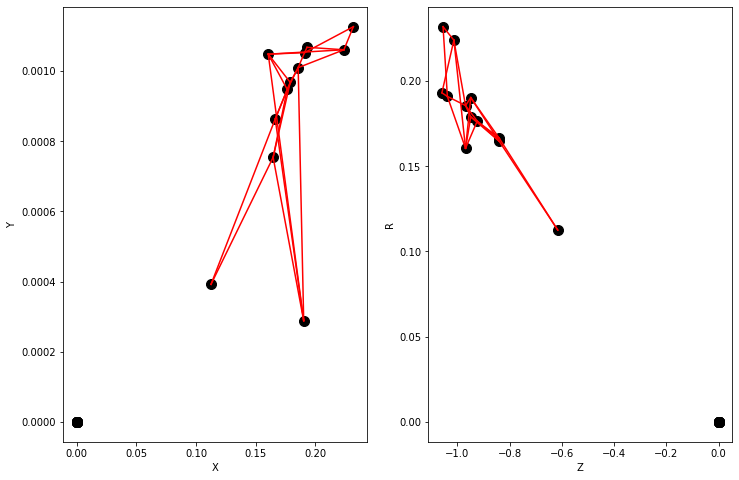

Y = [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.6152663  0.6933546  0.62803507 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 1.000, recall 1.000


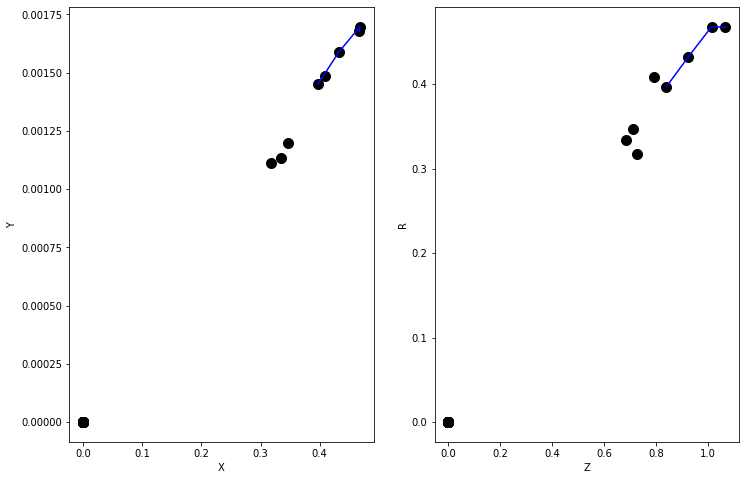

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.13952357 0.12595788 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


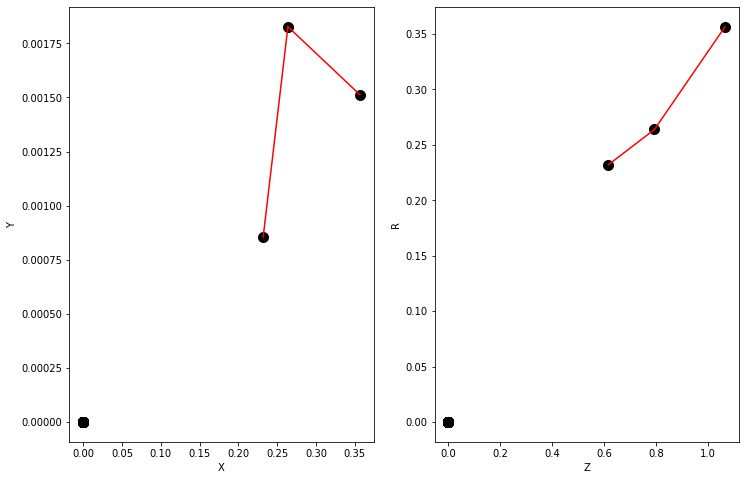

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.48771328 0.6541666  0.49593073 0.41134784 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.929, precision 0.000, recall 0.000


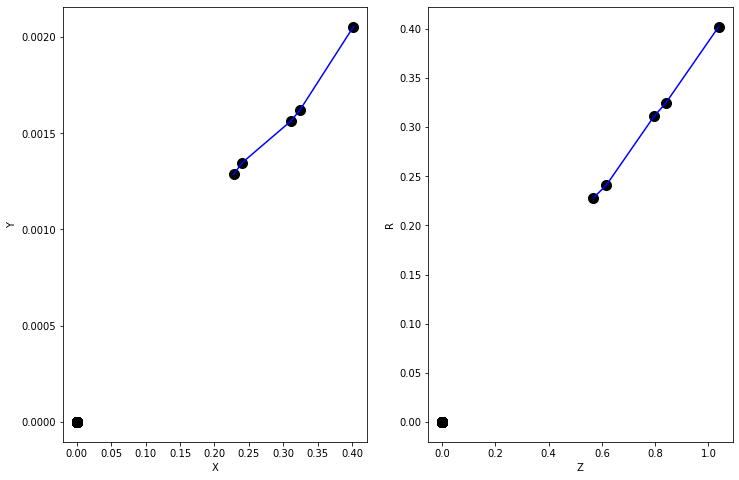

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.1481718  0.18536729 0.41387495 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


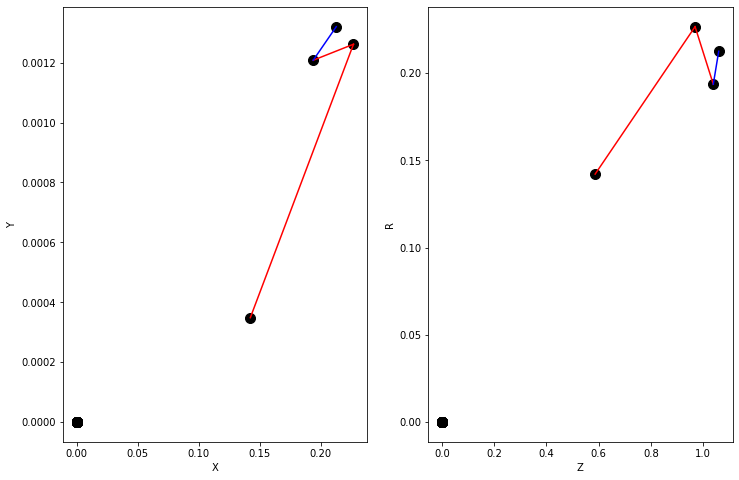

Y = [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.70405096 0.7740227  0.7247904  0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 1.000, recall 1.000


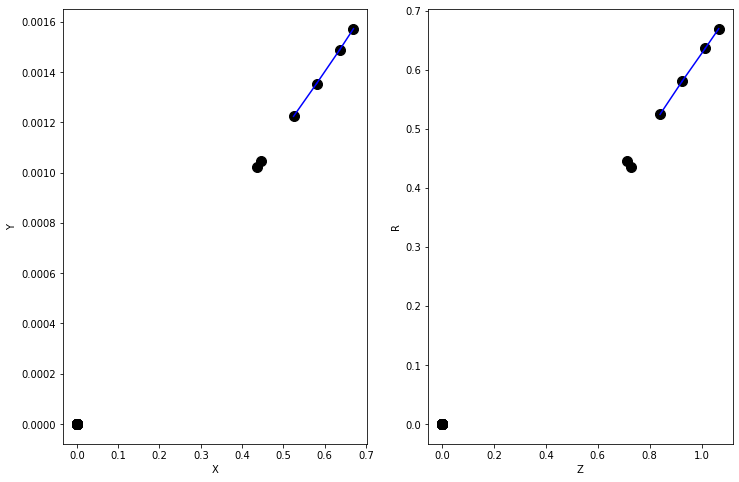

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.20220526 0.29033777 0.5339145  0.4495267  0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


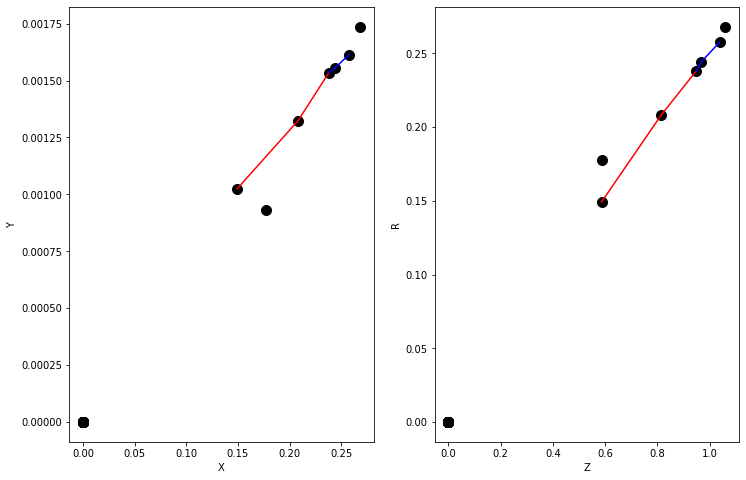

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.03164434 0.03855615 0.03610709 0.24827017 0.36339605 0.4468522
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


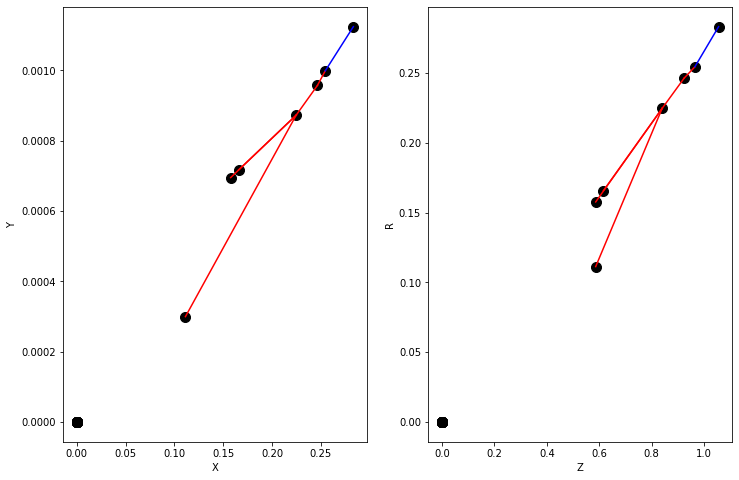

Y = [1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.32392466 0.28951743 0.50058424 0.4499327  0.7321728  0.57615364
 0.5609321  0.5341229  0.5269394  0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 1.000, recall 0.778


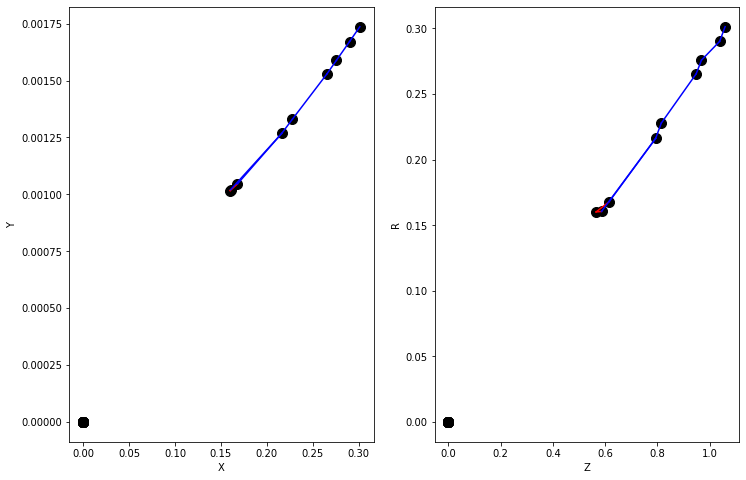

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.176953e-05 5.843703e-05 5.534460e-05 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

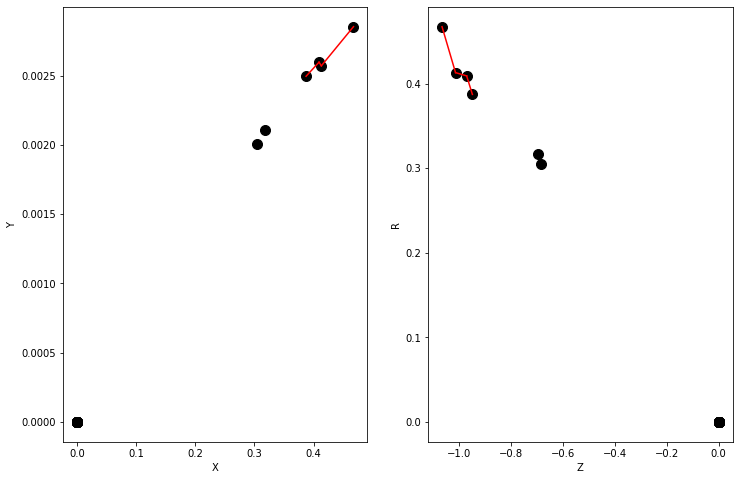

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.02926388 0.02953743 0.07753862 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


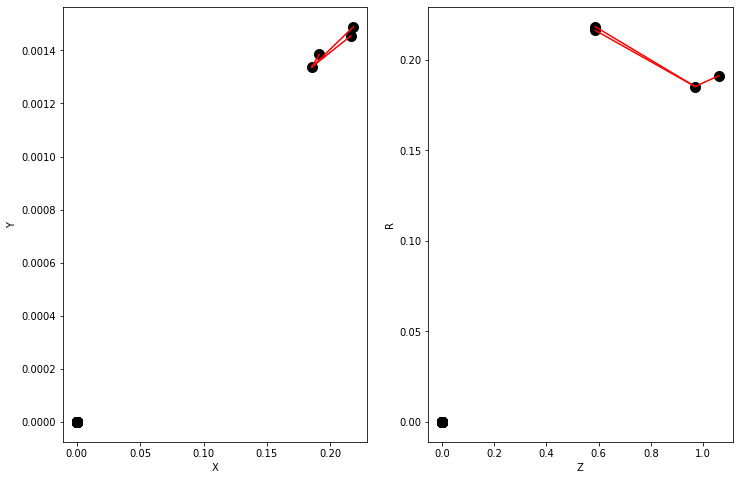

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.9657188e-05 4.1514191e-05 3.6267953e-05 3.3549855e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

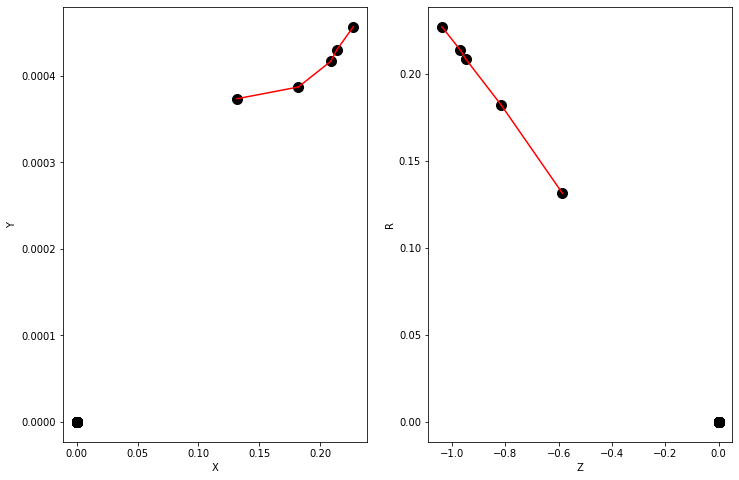

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.9657188e-05 4.1514191e-05 3.6267953e-05 3.3549855e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

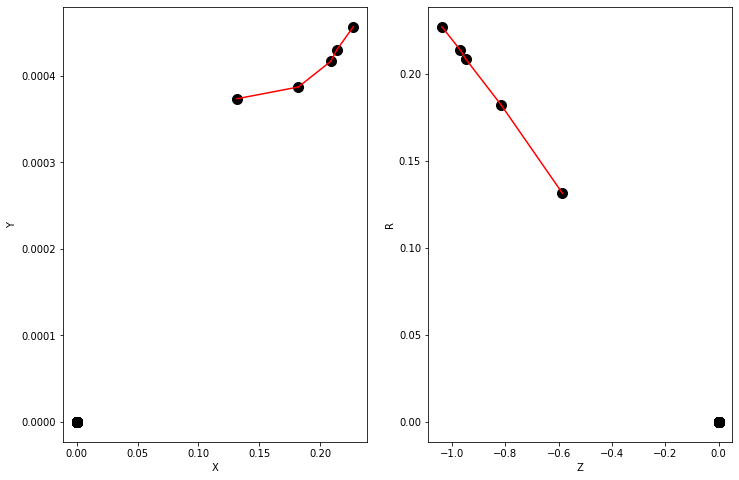

Y = [1. 0. 1. 0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.27303228 0.36381373 0.18735354 0.19746259 0.20526722 0.2040988
 0.56495196 0.48624712 0.43728688 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.929, precision 1.000, recall 0.429


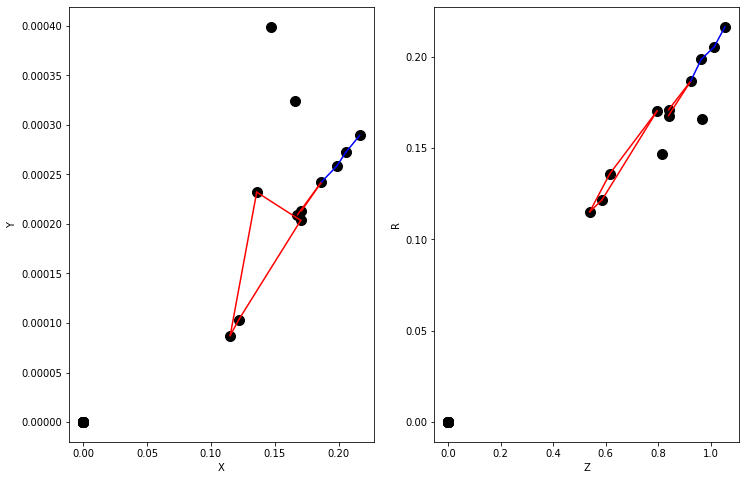

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [3.8194932e-05 3.3216667e-05 3.0270090e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

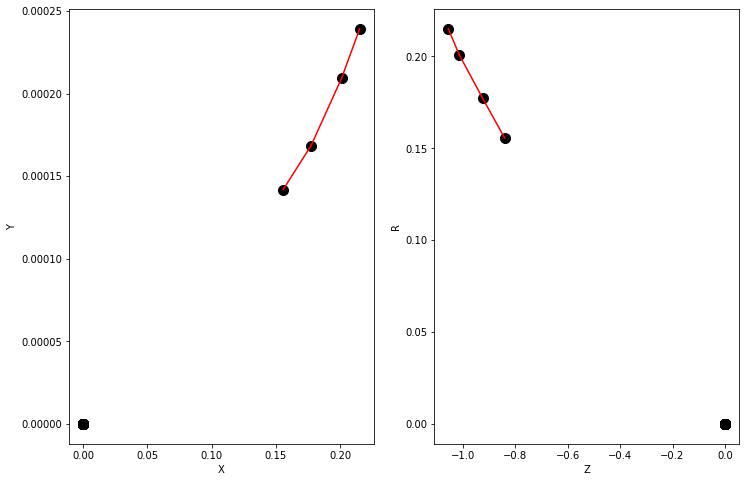

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.25987792 0.38844994 0.5401039  0.57895744 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


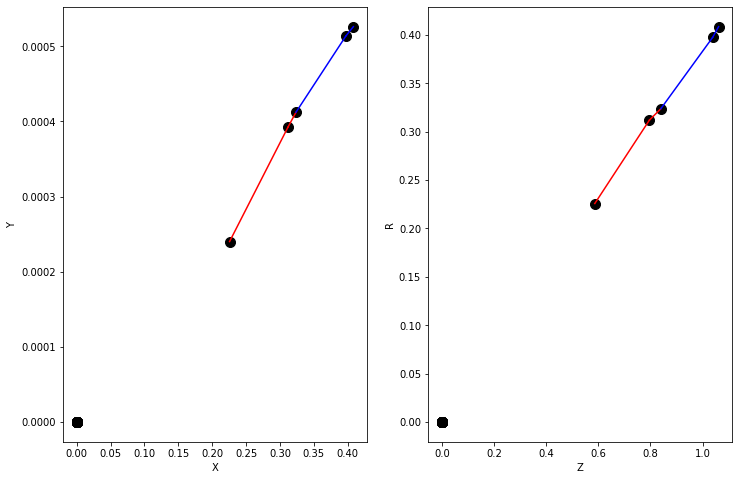

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.9841859e-05 6.2668172e-05 5.8878653e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

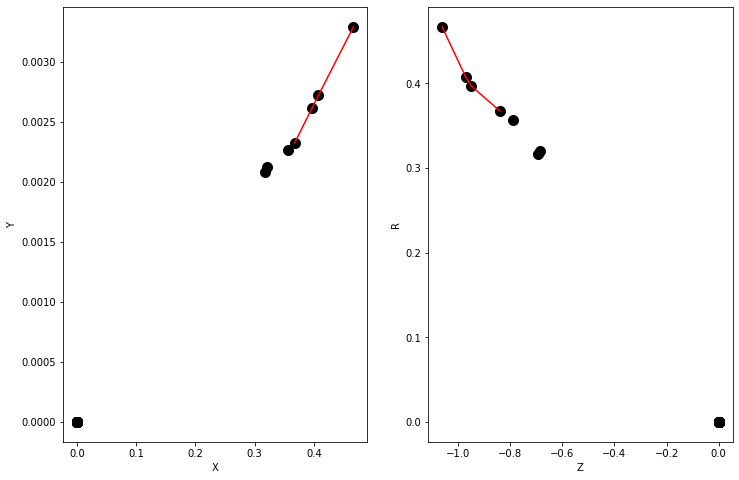

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [3.7487327e-05 3.3508382e-05 3.1568285e-05 2.9693918e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

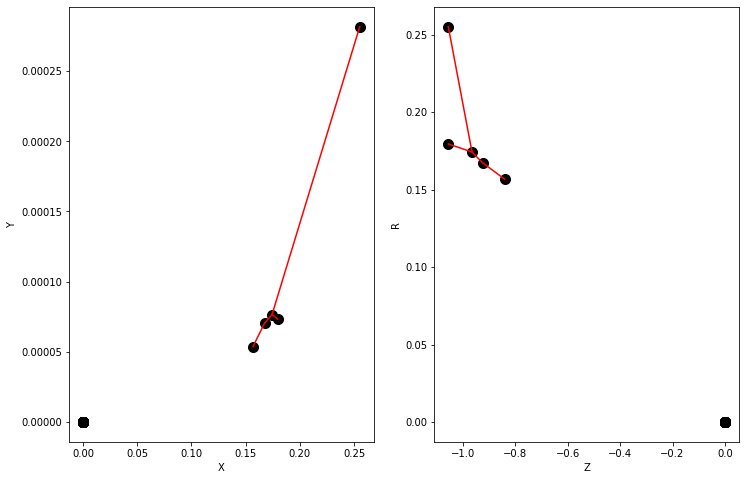

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.7550234e-05 7.8070378e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

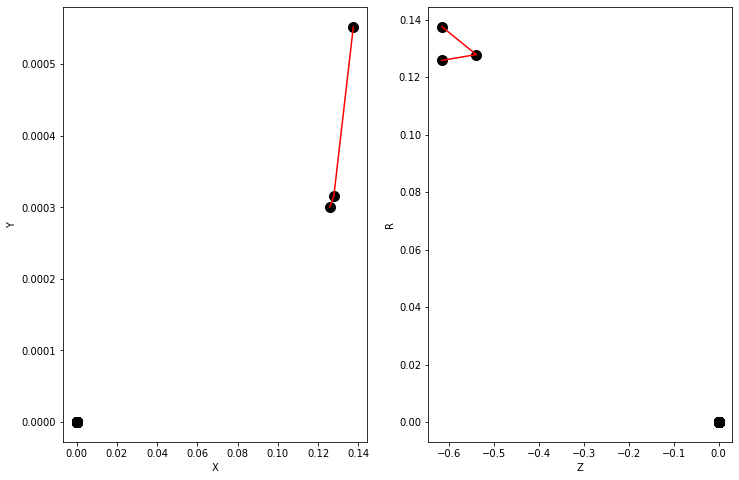

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.04605176 0.04767466 0.04850414 0.2395783  0.27627712 0.24125683
 0.28961435 0.25593257 0.33564302 0.35182154 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


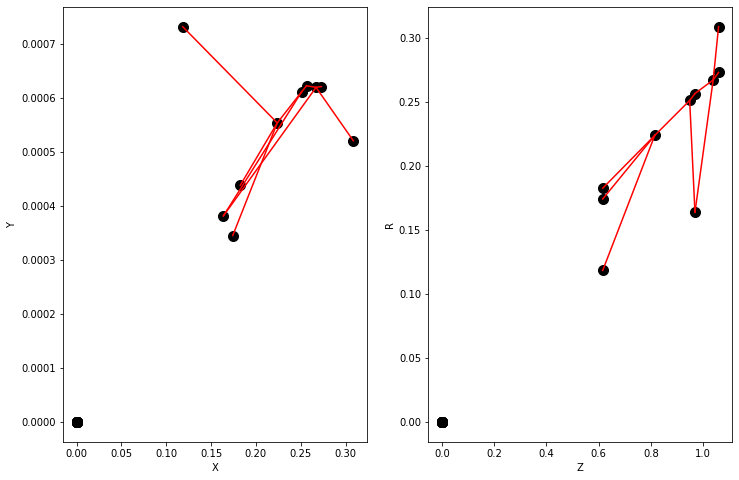

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.37149674 0.28531918 0.25146085 0.24280433 0.22904919 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


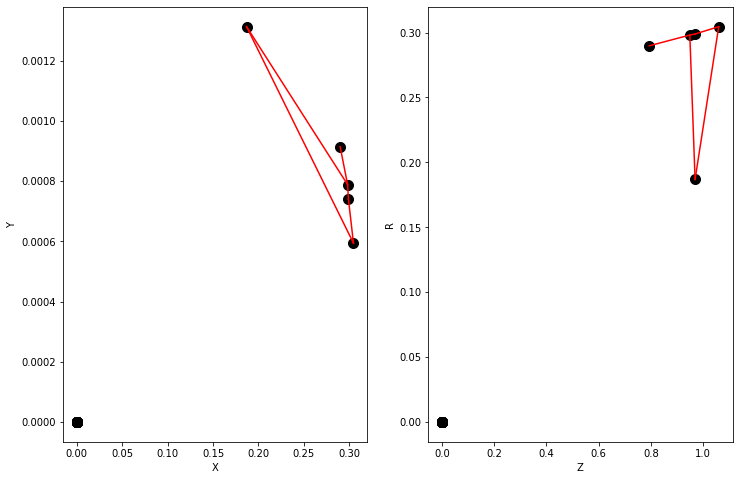

Y = [0. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.334587   0.6073608  0.70055157 0.58069736 0.50110275 0.48677522
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 1.000, recall 1.000


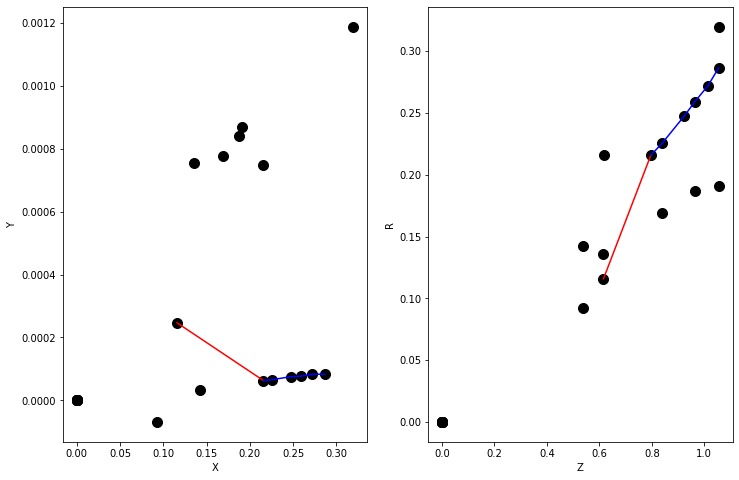

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.6606277e-05 5.5029523e-05 6.4152984e-05 6.2386134e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

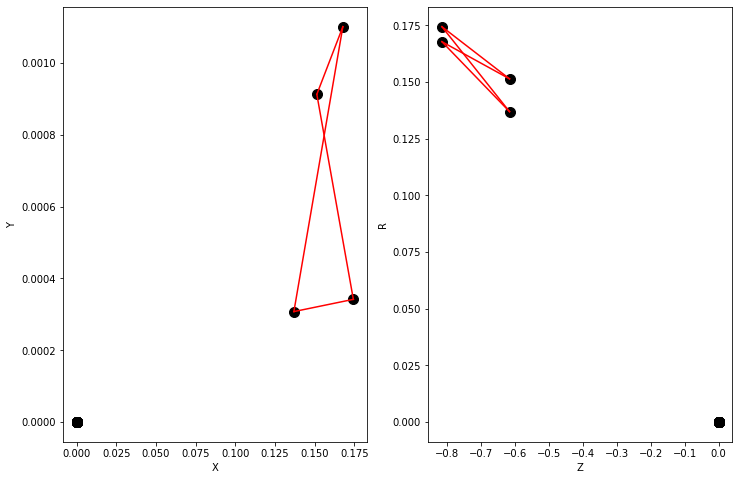

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.7131154e-05 4.7218160e-05 4.4384818e-05 4.4455985e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

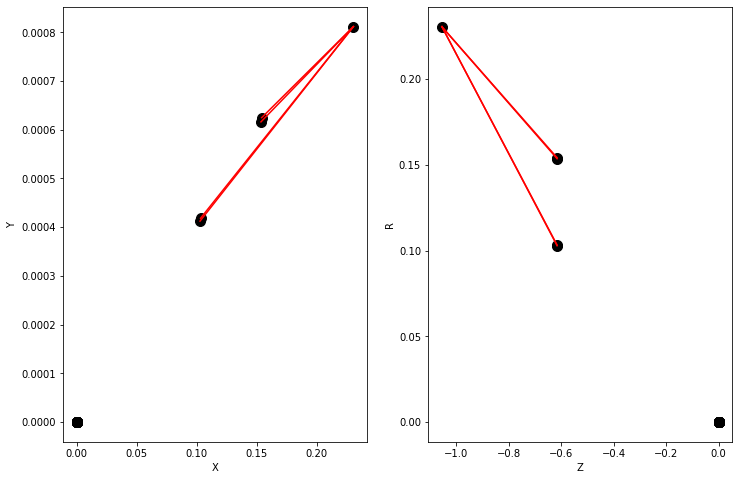

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.0632681  0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


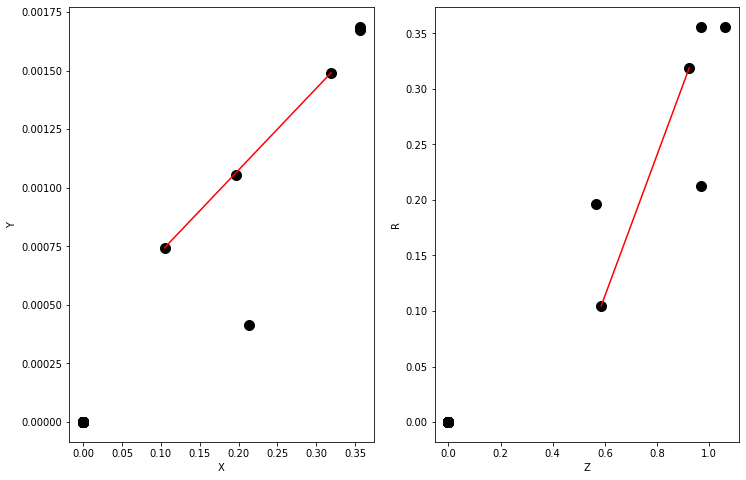

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.8516667e-05 4.3264543e-05 4.0931762e-05 3.8514791e-05 3.7335059e-05
 3.8311664e-05 3.7146725e-05 3.3762262e-05 3.4474699e-05 3.3944380e-05
 3.1895917e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

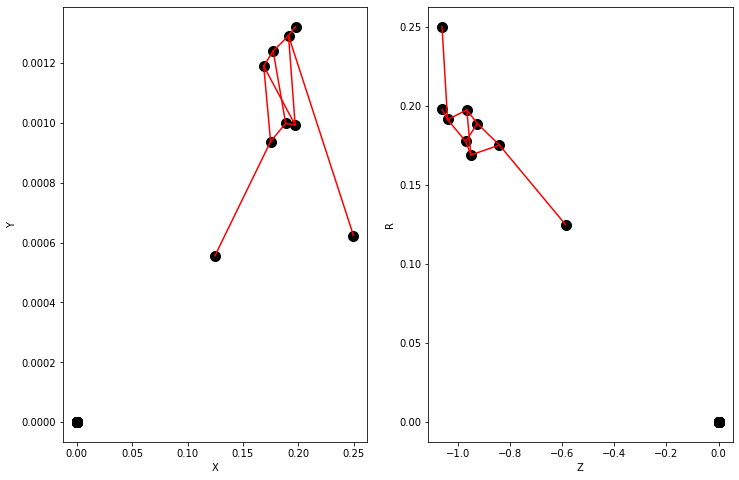

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.10820733 0.10683192 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


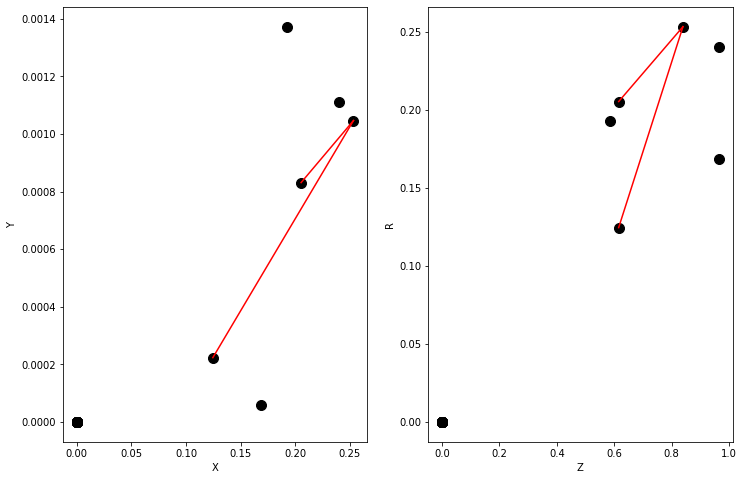

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.8604346e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

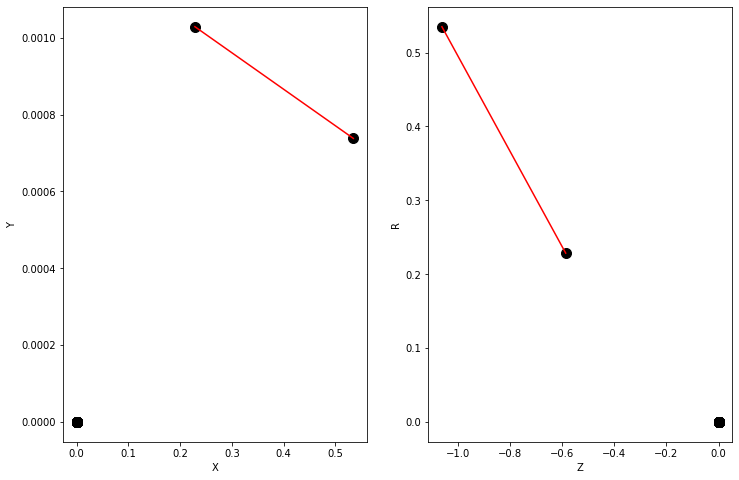

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.07787285 0.01872393 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


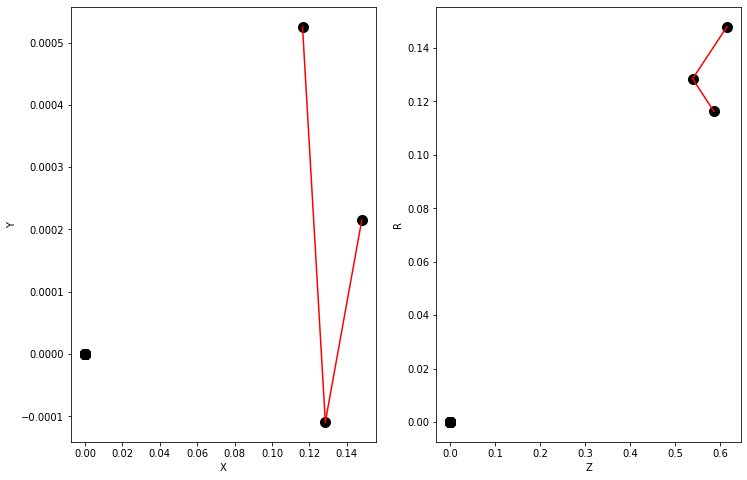

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.211865e-05 5.052696e-05 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

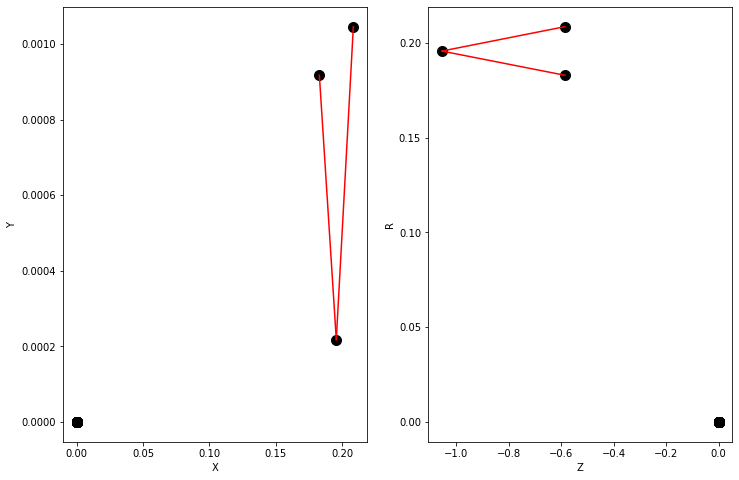

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.32627437 0.2895799  0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


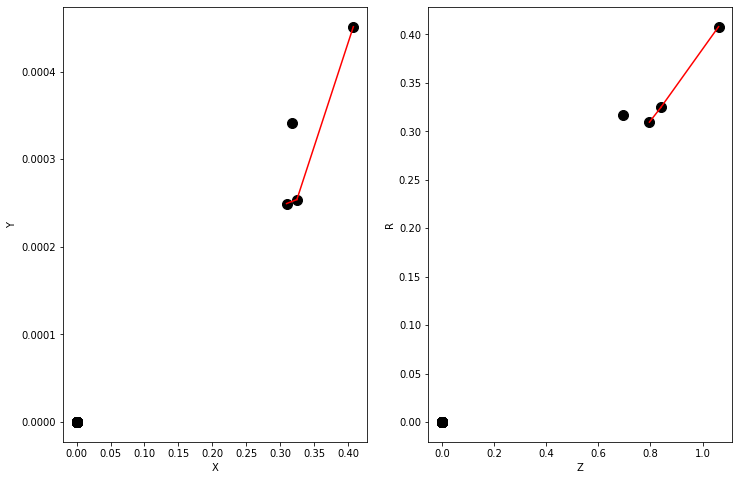

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.1614446e-05 8.6722146e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

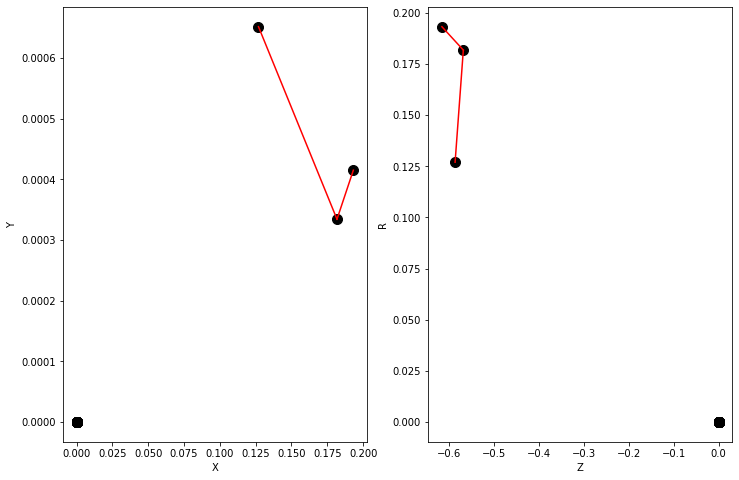

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.08597321 0.03888197 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


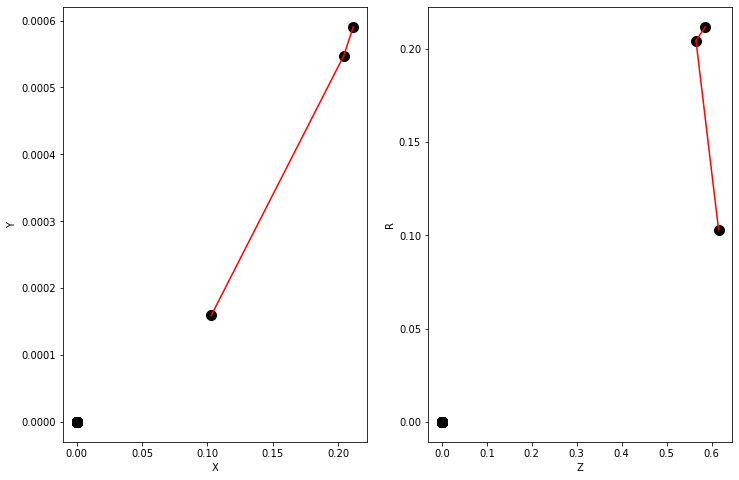

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.44034427 0.1458406  0.07040173 0.35358688 0.38567486 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


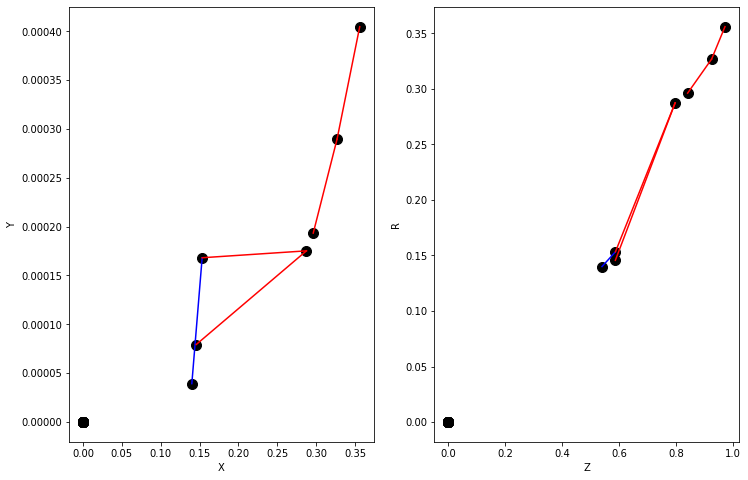

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.186013e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

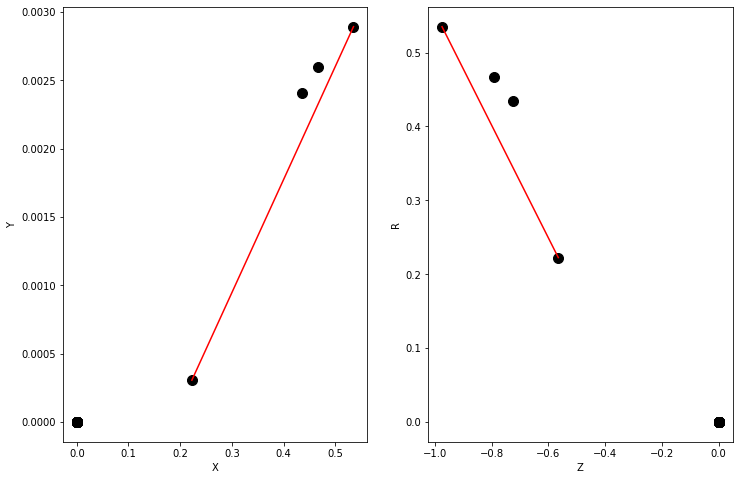

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.1814906e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

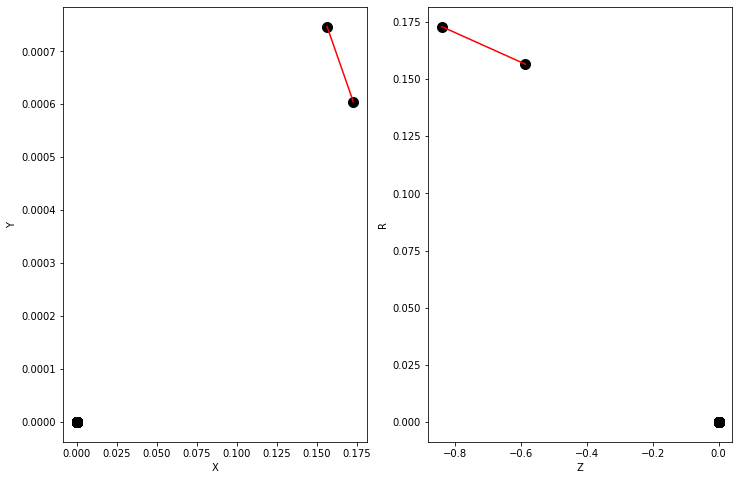

Y = [1. 0. 0. 0. 1. 0. 1. 1. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [1.78526595e-01 2.11503416e-01 1.75418139e-01 2.07789958e-01
 8.69156897e-01 8.95535946e-01 8.98969412e-01 2.35019311e-01
 2.31464431e-01 1.13945268e-01 1.11888066e-01 1.11599840e-01
 1.14958599e-01 1.12872861e-01 1.12581782e-01 1.89804554e-01
 1.87527403e-01 1.91757530e-01 1.89447537e-01 1.90714344e-01
 1.88415468e-01 1.09348215e-01 1.07826814e-01 1.08544037e-01
 1.09826639e-01 1.08294055e-01 1.09037340e-01 8.12366197e-04
 8.12366197e-04 8.12366197e-04 8.12366197e-04 8.12366197e-04
 8.12366197e-04 8.12366197e-04 8.12366197e-04 8.12366197e-04
 8.12366197e-04 8.12366197e-04 8.12366197e-04 8.12366197e-04
 8.12366197e-04 8.12366197e-04 8.12366197e-04 8.12366197e-04
 8.12366197e-04 8.12366197e-04 8.12366197e-04 8.12366197e-04
 8.12366197e-04 8.12366197e-04 8.12366197e-04 8.12366197e-04
 8.12366197e-04 8.123661

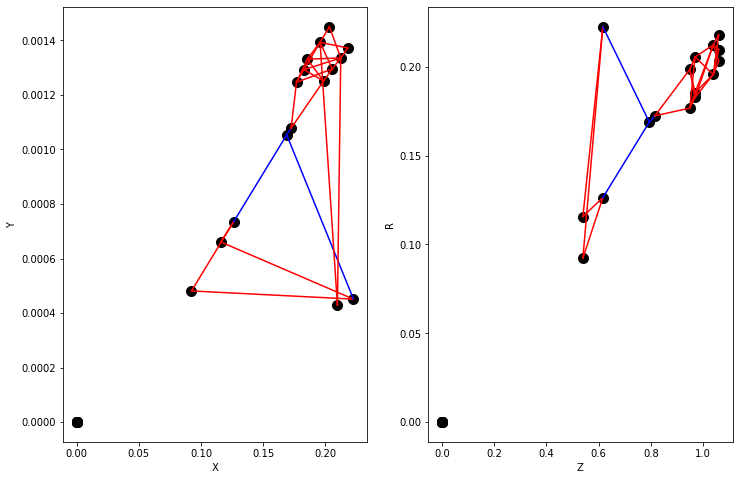

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.20999618 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


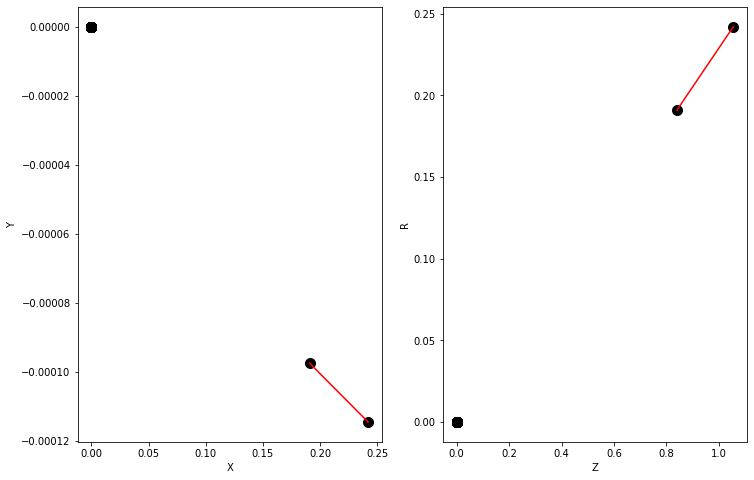

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.13266356 0.01659988 0.0535245  0.02454256 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


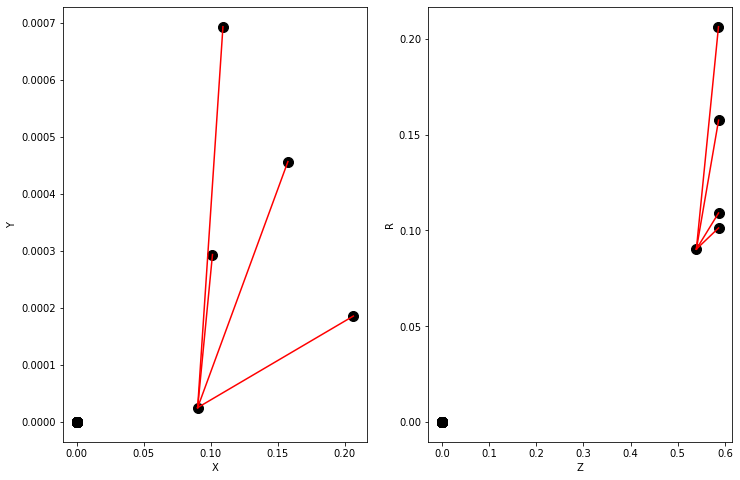

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.0165785e-05 5.7948797e-05 5.8591373e-05 6.8469737e-05 5.6262284e-05
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

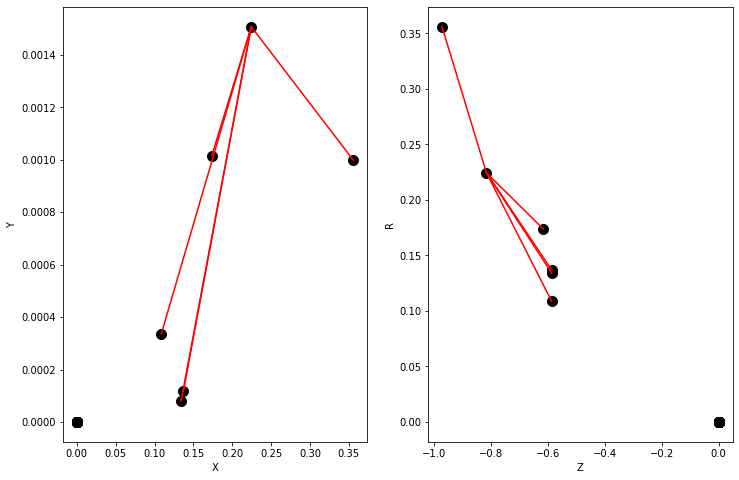

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.0446271  0.04456355 0.04539837 0.04533205 0.04269048 0.04263078
 0.04342634 0.04336401 0.01714739 0.01759878 0.01640529 0.01683094
 0.4016154  0.45271197 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


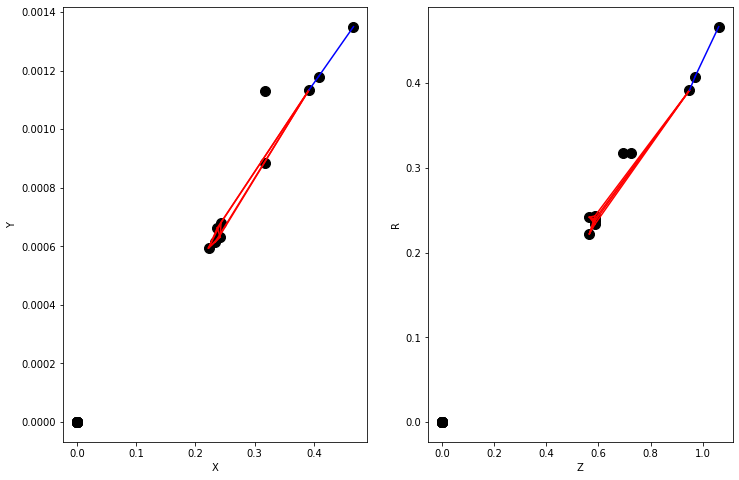

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.26238254 0.34361678 0.6181354  0.53021175 0.55565447 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.946, precision 0.000, recall 0.000


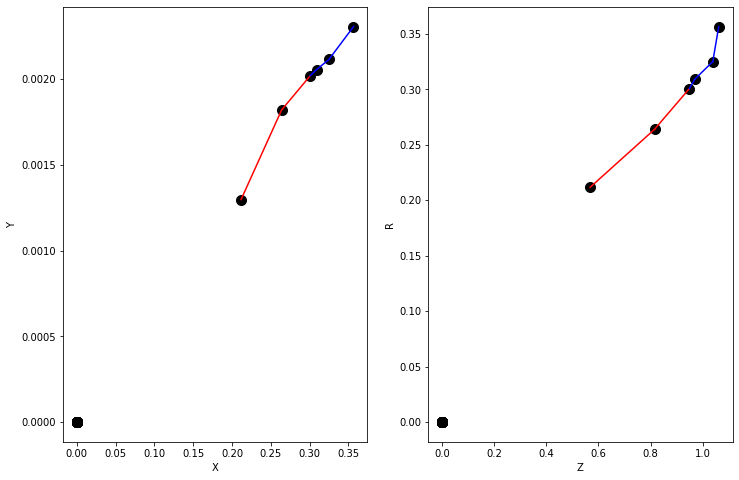

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.39764458 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


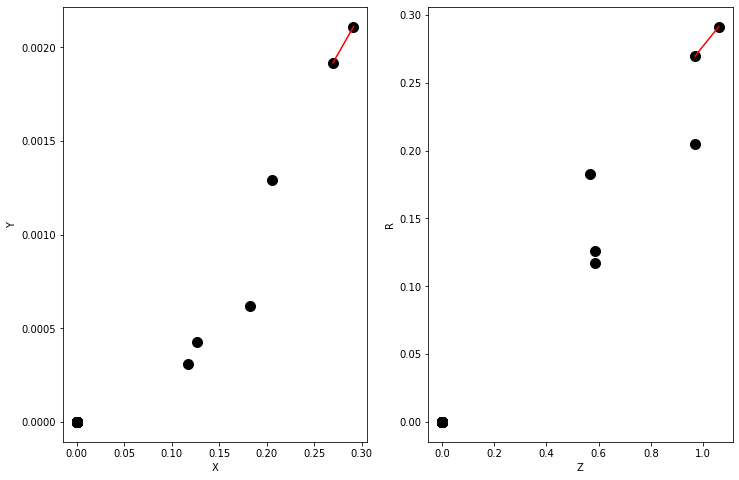

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.216365e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

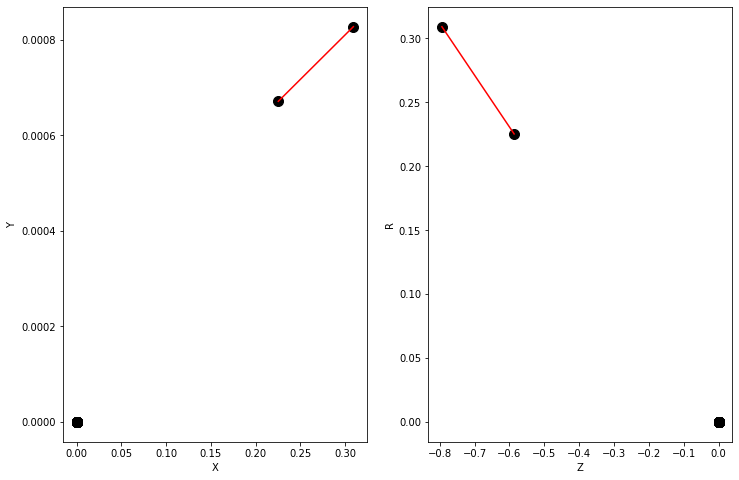

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.22507282 0.36866143 0.62007165 0.4897357  0.46833393 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.946, precision 0.000, recall 0.000


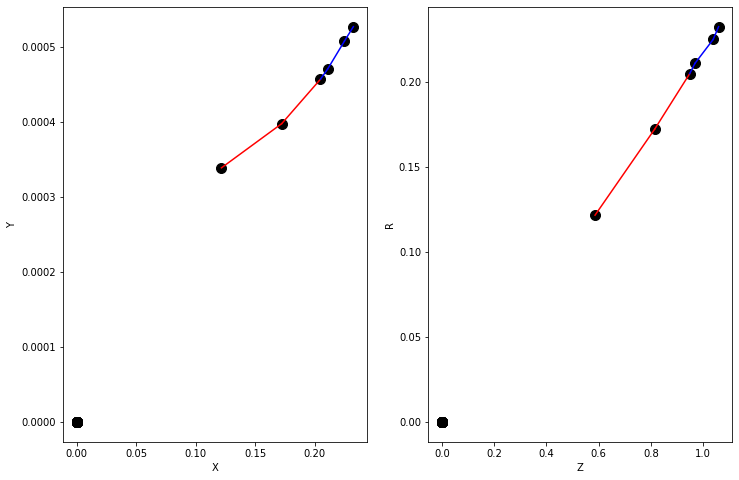

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.760993e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

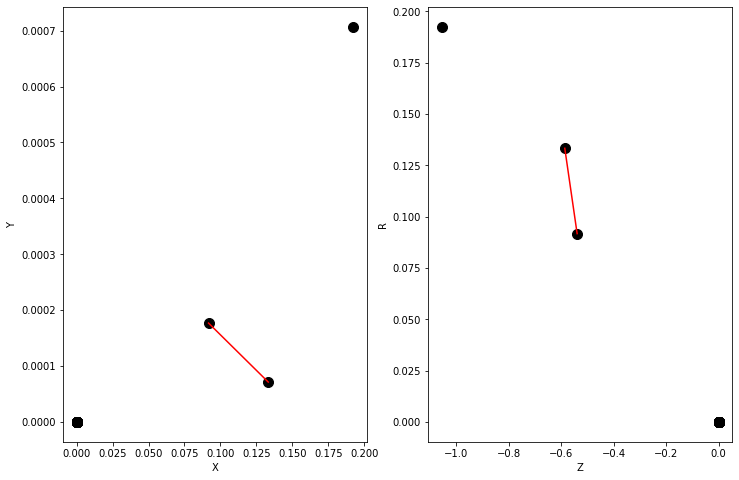

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.20729503 0.25742912 0.2173907  0.21362555 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


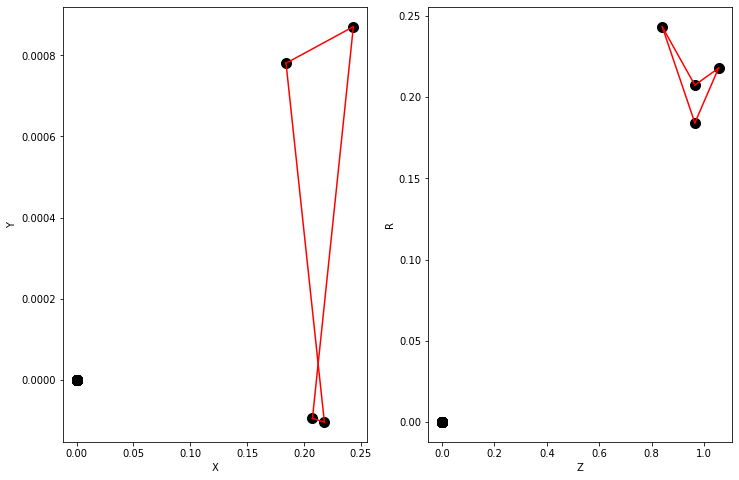

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.408719e-05 7.698377e-05 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

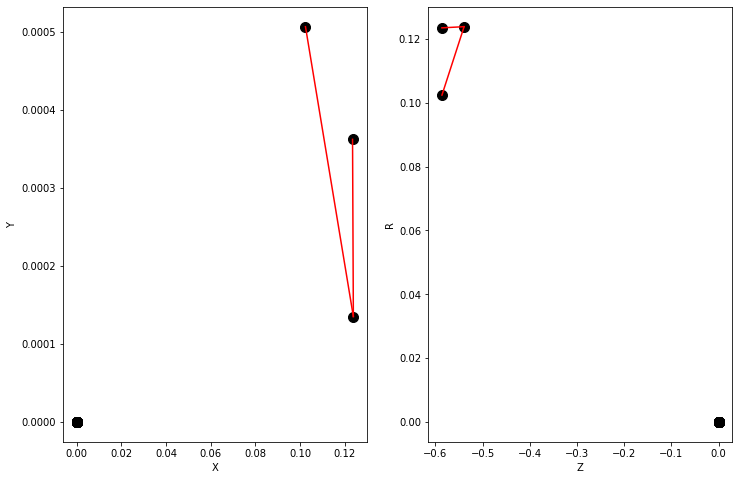

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.636309e-05 4.855050e-05 4.242020e-05 3.914913e-05 3.628608e-05
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

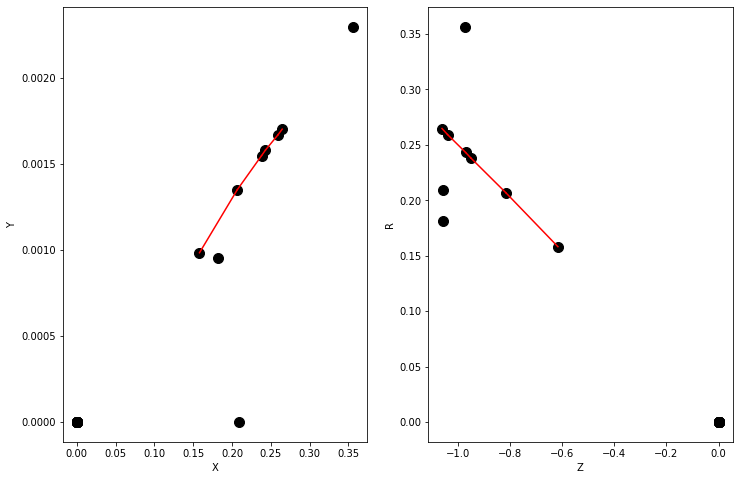

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.396310e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

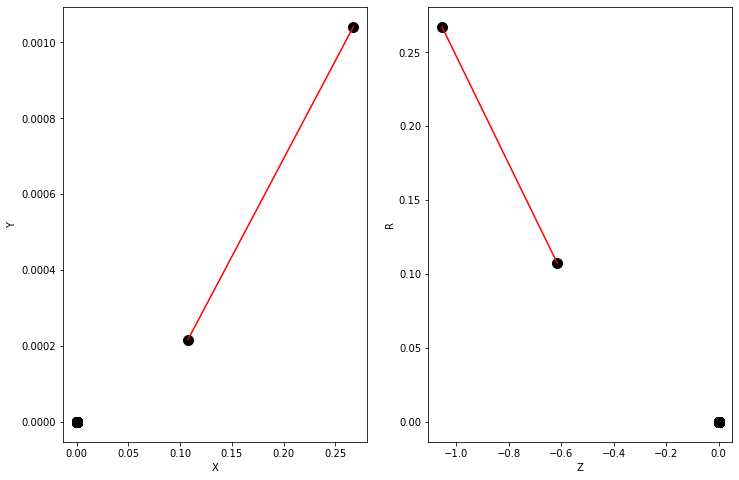

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.5039253e-05 8.4783387e-05 9.2030299e-05 9.4805808e-05 9.5093914e-05
 6.9627065e-05 6.8969806e-05 7.6540768e-05 7.2366114e-05 7.2972609e-05
 5.7913054e-05 5.8176927e-05 4.5312230e-05 4.5517903e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

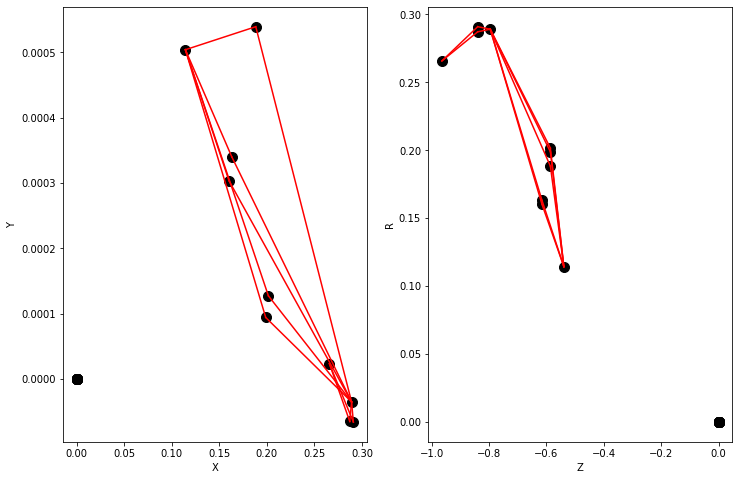

Y = [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.41888854 0.61025786 0.7759776  0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 1.000, recall 1.000


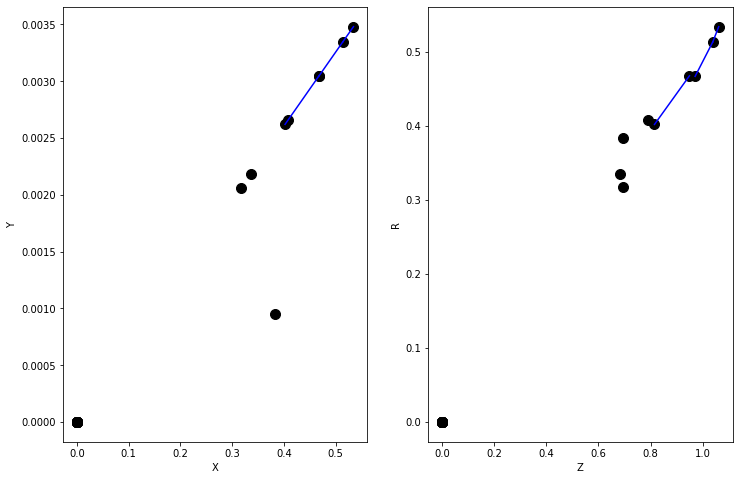

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.0678053e-05 3.2751235e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

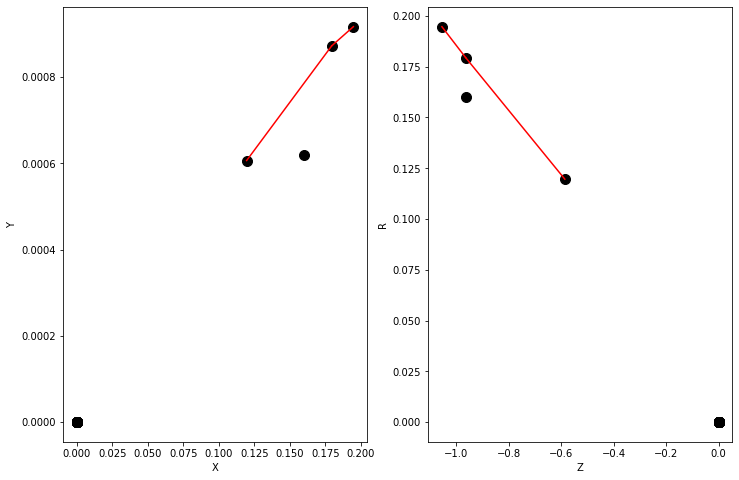

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.3786969  0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


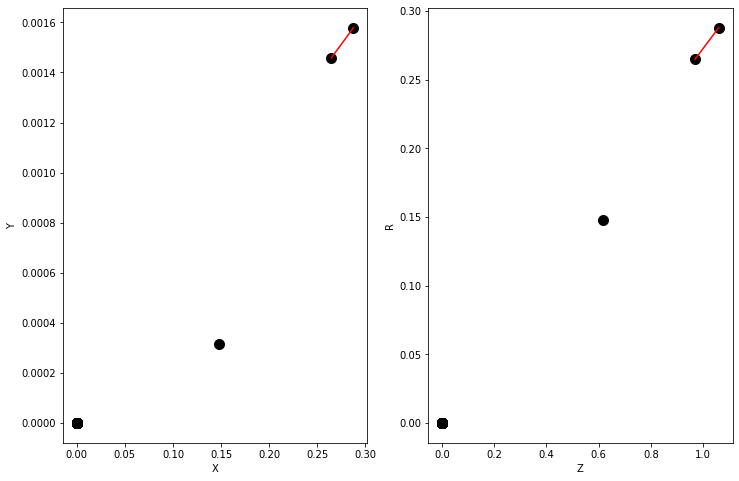

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.5908215e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

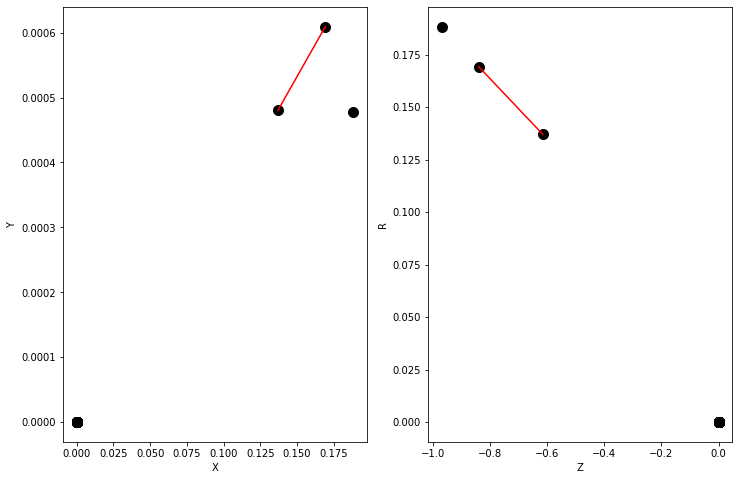

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.2441075e-05 6.4424392e-05 4.3441574e-05 3.2973301e-05 3.0200659e-05
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

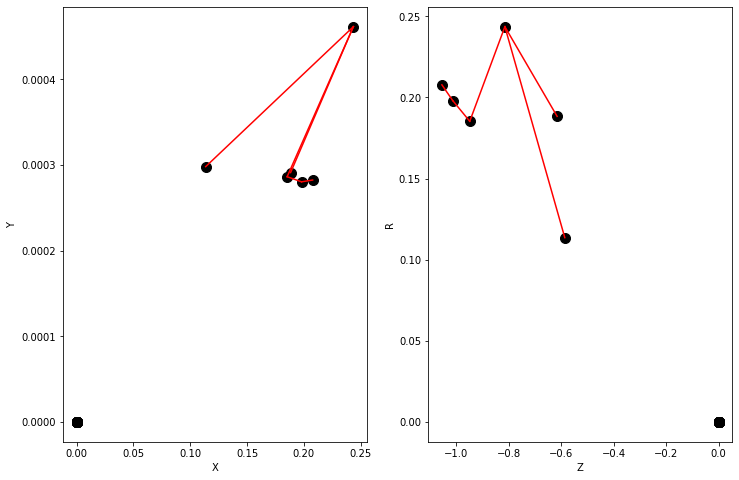

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.5439577e-05 7.9548205e-05 7.9316800e-05 8.1617101e-05 8.1304199e-05
 8.4247680e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

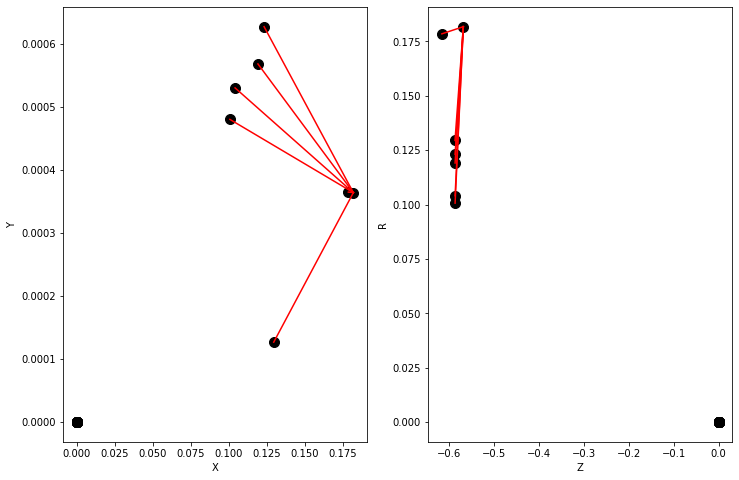

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.3084879  0.24611214 0.3756365  0.28838313 0.51277095 0.50232565
 0.48379743 0.47021842 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.929, precision 0.000, recall 0.000


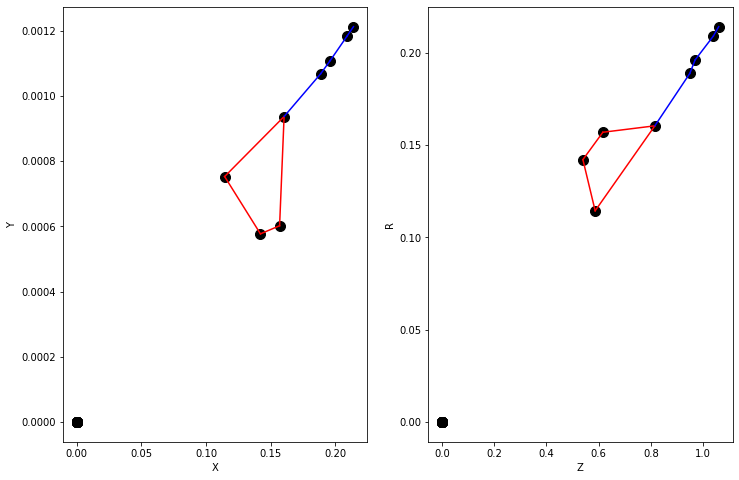

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.27794263 0.27864742 0.36900115 0.38317615 0.6392874  0.3878053
 0.24147011 0.24103428 0.13014393 0.12973358 0.1296204  0.12921095
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


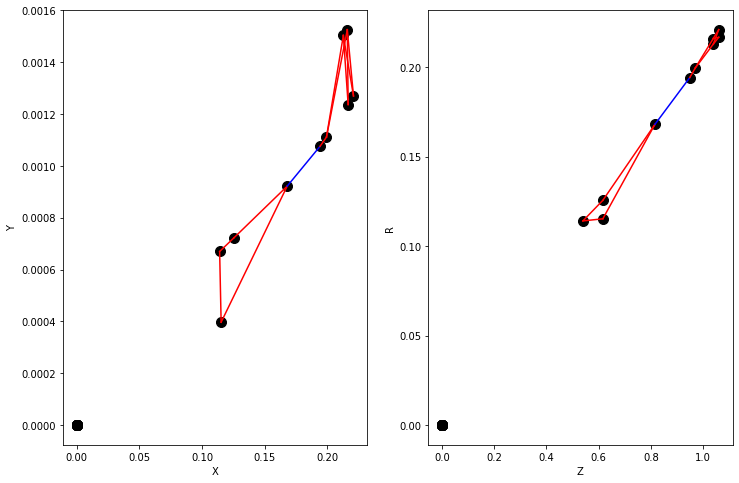

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.3329003e-05 8.3133200e-05 7.9444420e-05 7.9270219e-05 5.1812098e-05
 5.1180770e-05 3.7861511e-05 3.3862707e-05 3.6591457e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

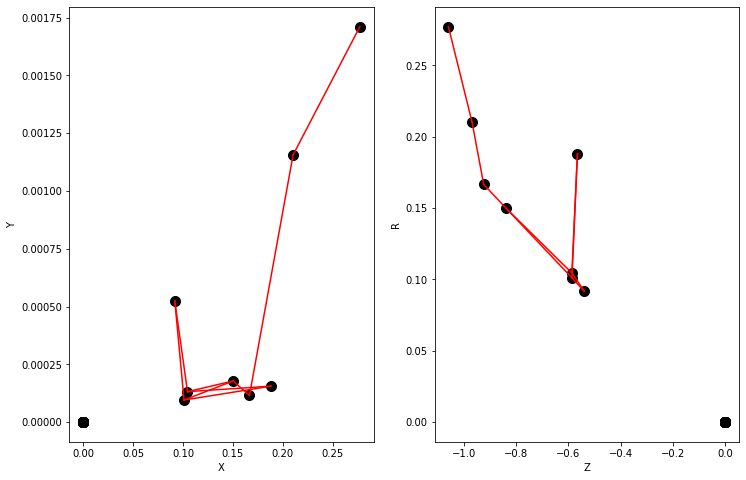

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.32722303 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


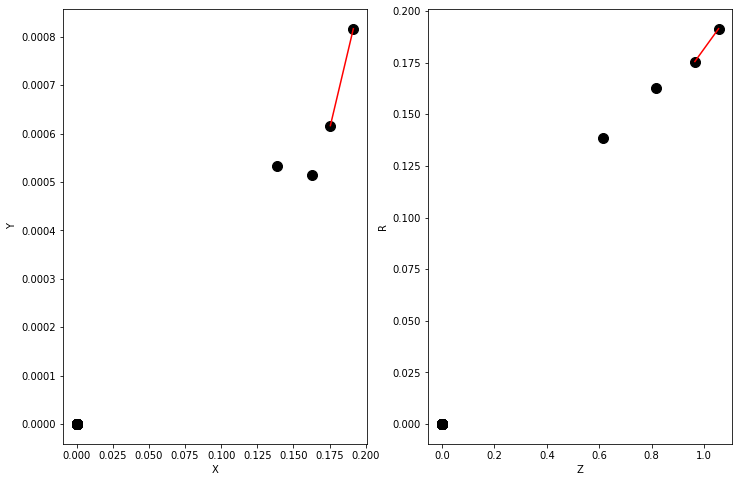

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.6440800e-05 5.8479400e-05 6.1315761e-05 4.1280837e-05 4.0832772e-05
 3.6758076e-05 3.5965586e-05 3.7670452e-05 3.5851383e-05 3.3957134e-05
 3.2380769e-05 3.6593970e-05 3.4877467e-05 3.1669537e-05 3.0771960e-05
 3.3163680e-05 3.2230793e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

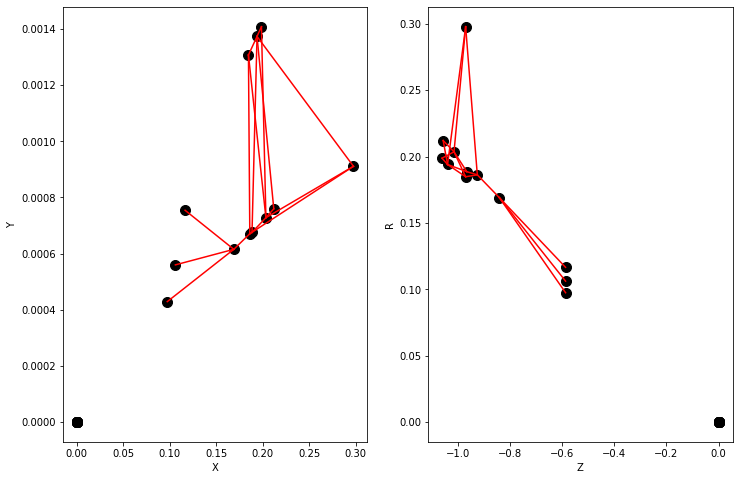

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [9.2631301e-05 5.8585567e-05 5.7408397e-05 4.1236064e-05 3.5138906e-05
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

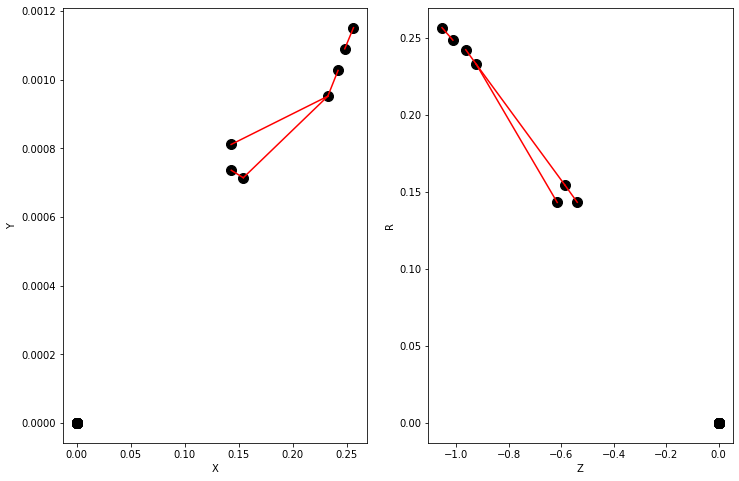

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.103527e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

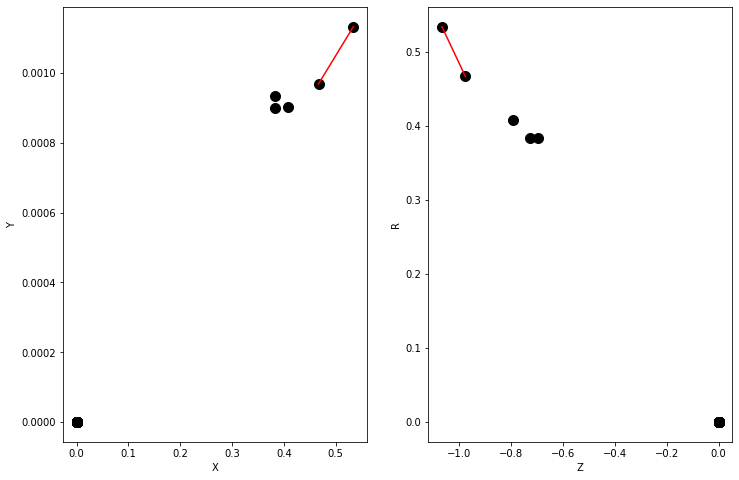

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.749492e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

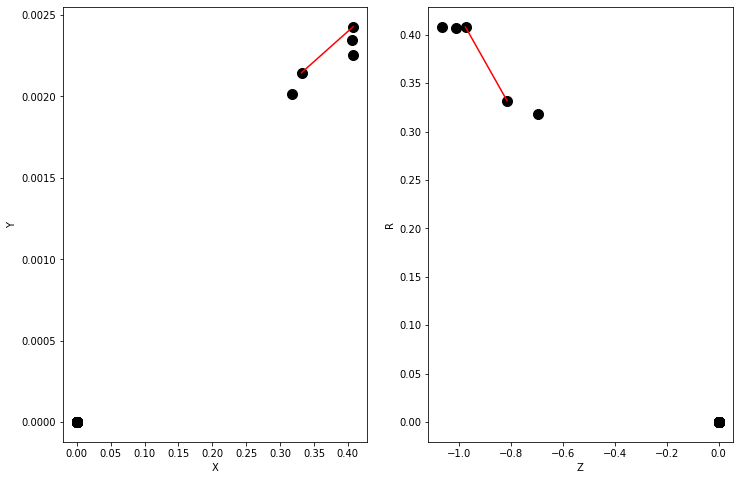

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.847313e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

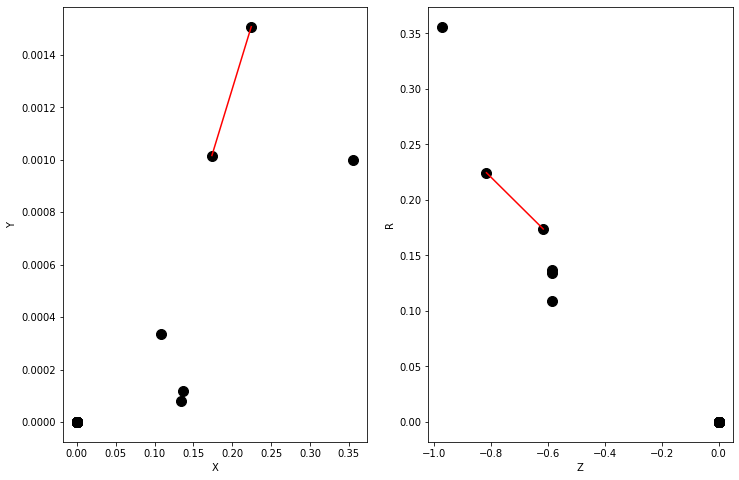

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.702158e-05 6.703936e-05 7.445641e-05 7.447643e-05 4.787077e-05
 4.785215e-05 3.818222e-05 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

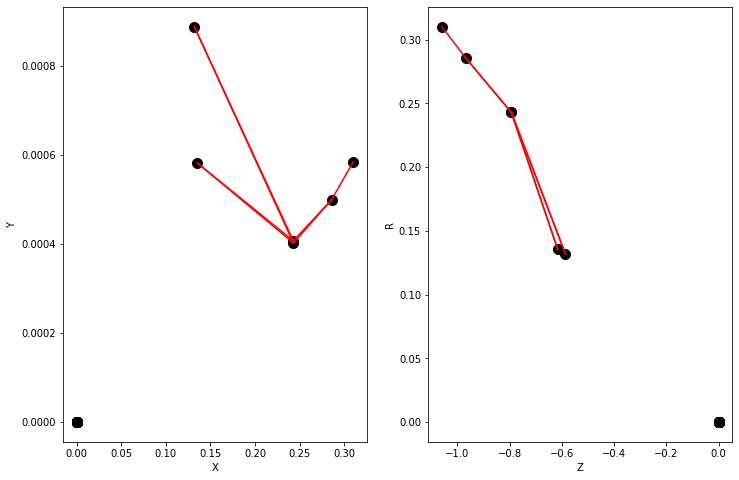

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.06226774 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


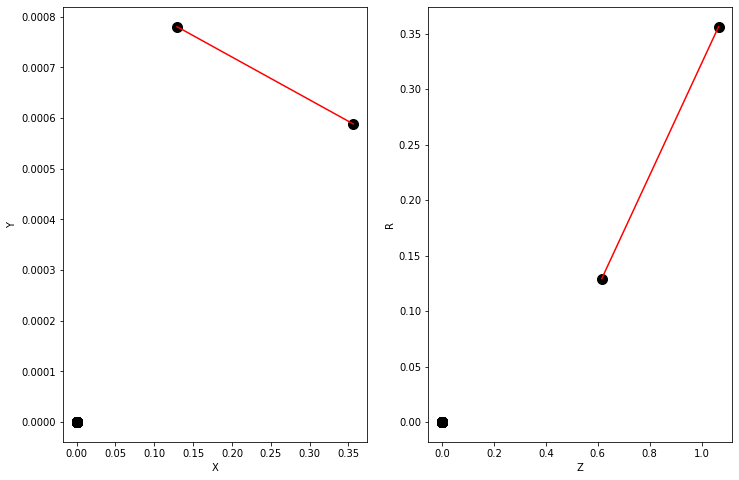

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.0924784e-05 5.2872707e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

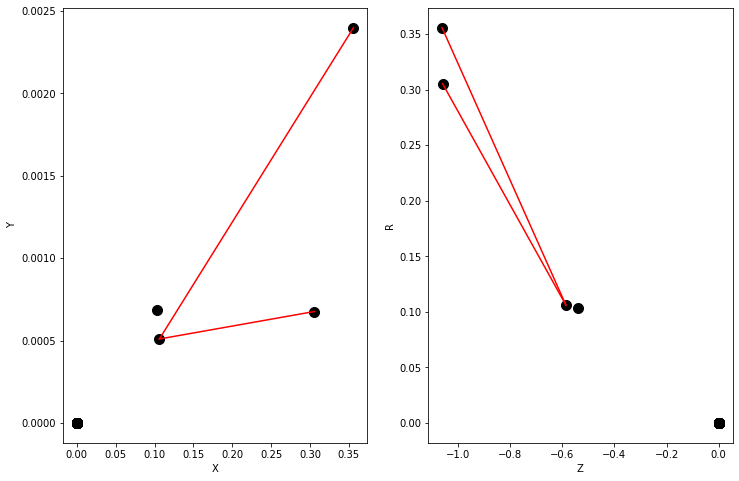

Y = [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.6323208  0.7114722  0.5912886  0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 1.000, recall 1.000


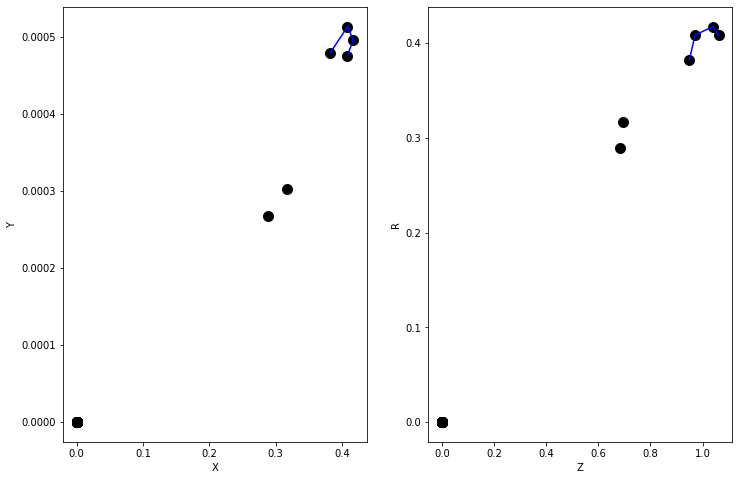

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.15648359 0.13428031 0.09550627 0.09455711 0.07250931 0.05859522
 0.0412343  0.04092254 0.1722717  0.23857255 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


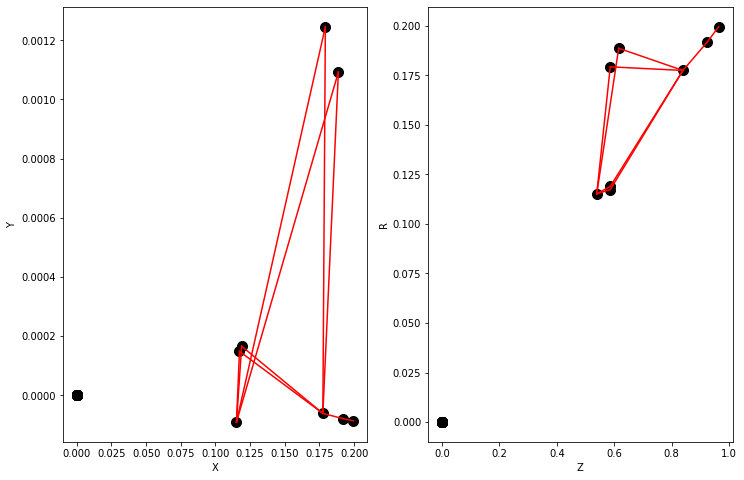

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.6604553e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

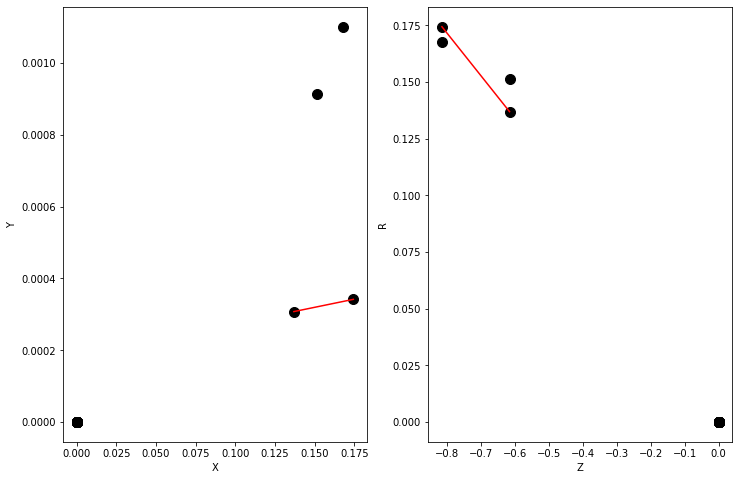

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.09583703 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


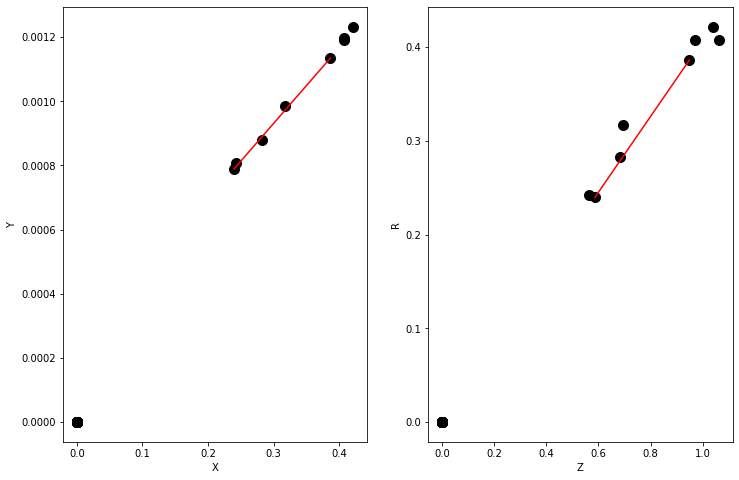

Y = [1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.65088546 0.8111239  0.58003813 0.63622284 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 1.000, recall 1.000


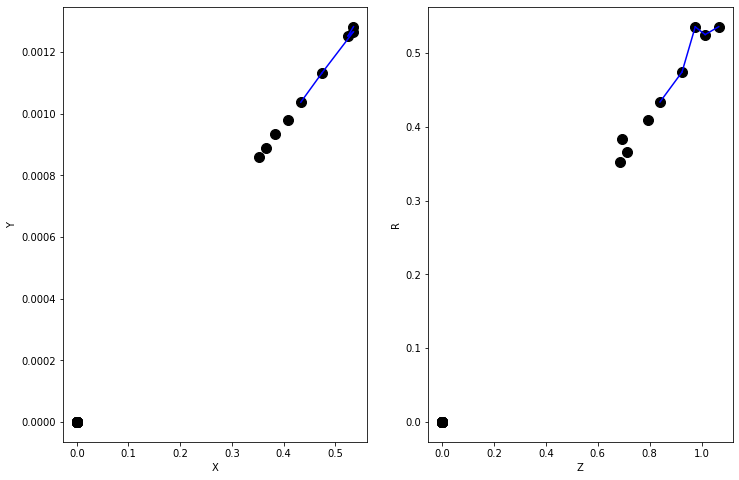

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.4376414e-05 6.2675703e-05 4.3282947e-05 3.7841441e-05 3.4638877e-05
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

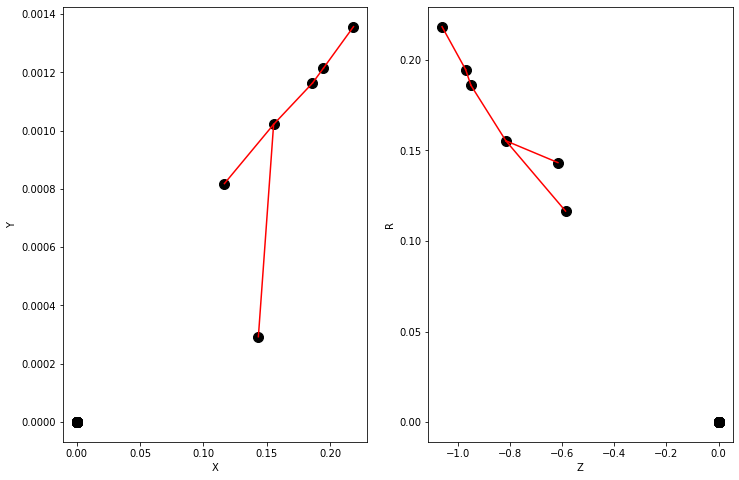

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [9.9577504e-05 7.7854107e-05 5.4531418e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

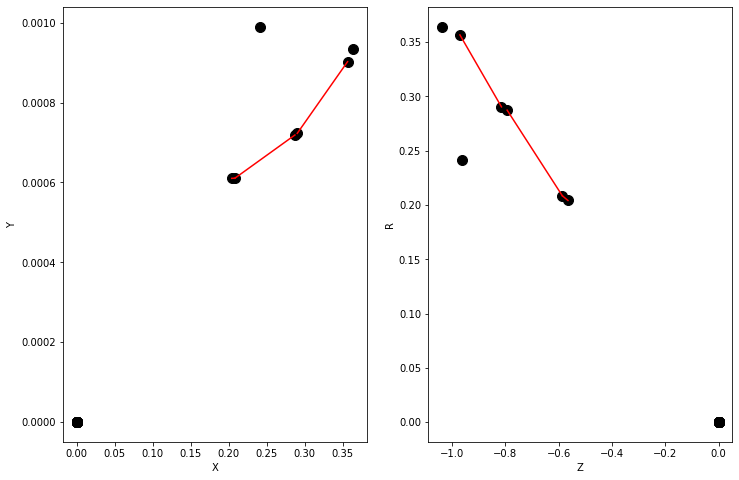

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.8312551e-05 7.4866424e-05 5.6311717e-05 5.9578735e-05 3.8768543e-05
 3.4052573e-05 3.0952047e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

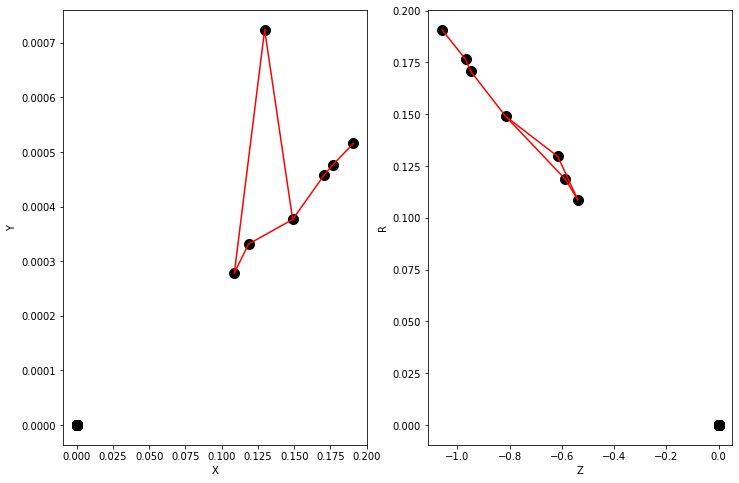

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.01689192 0.01668851 0.06520445 0.06440064 0.02635425 0.02603188
 0.10498753 0.10653141 0.1047788  0.10631815 0.0305836  0.03114177
 0.03046124 0.0310169  0.34495774 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


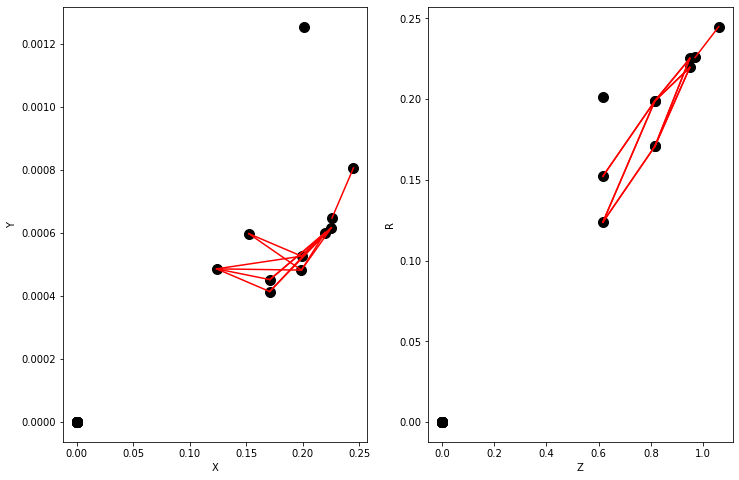

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.3989610e-05 4.7701975e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

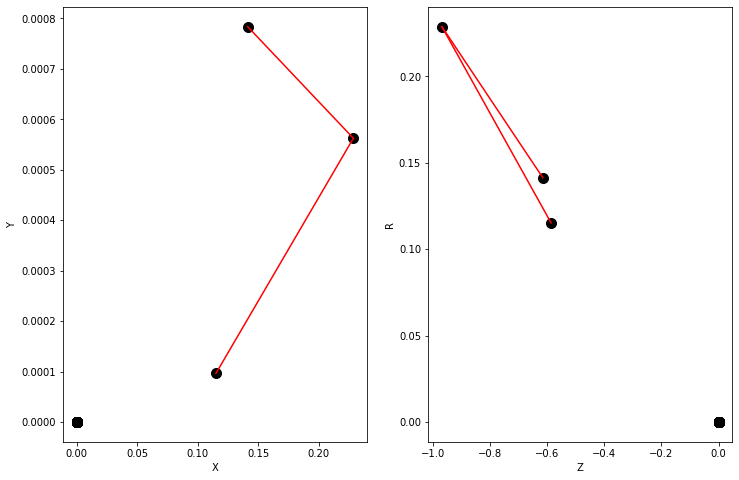

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.9999377e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

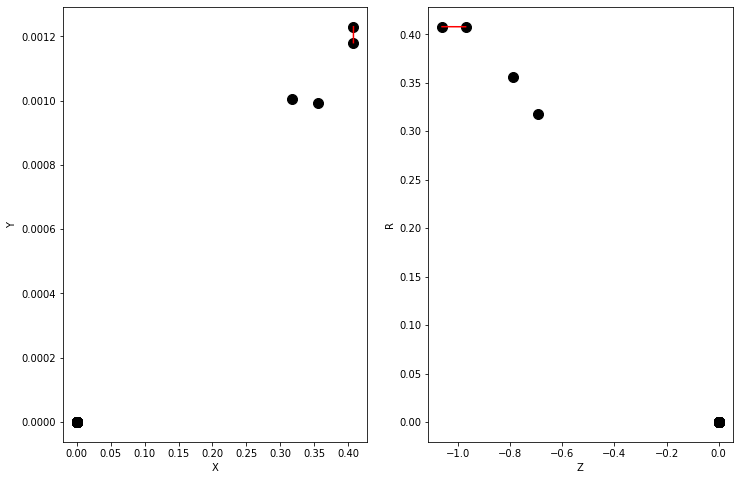

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.8146197e-05 4.1431376e-05 3.6864654e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

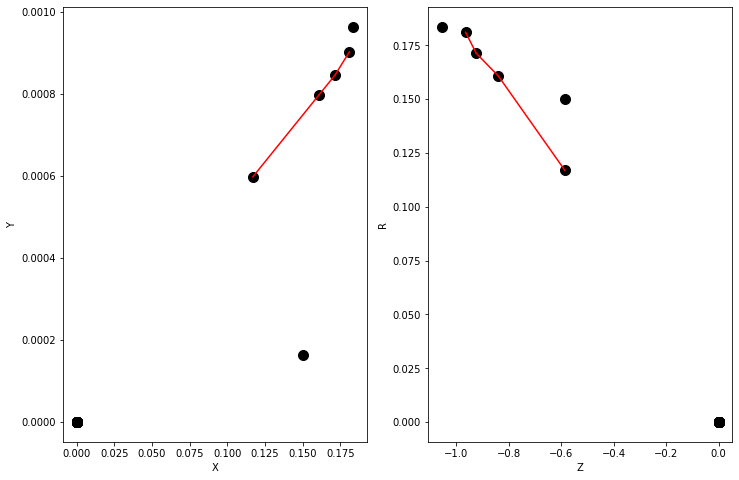

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.729972e-05 8.764772e-05 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

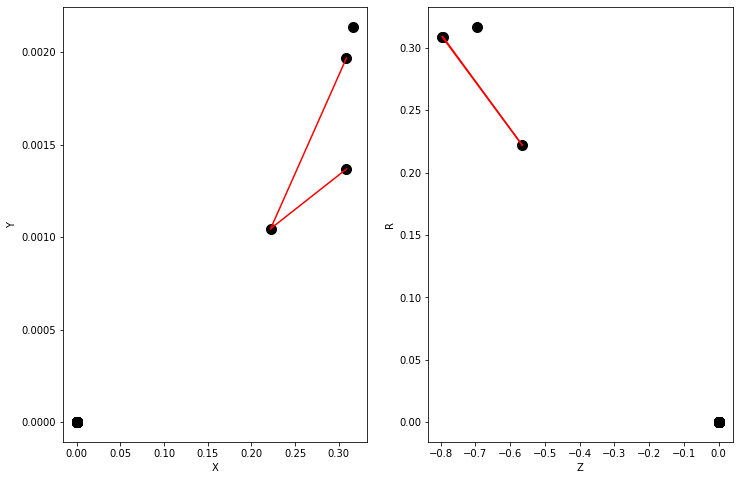

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.0888582  0.22325185 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


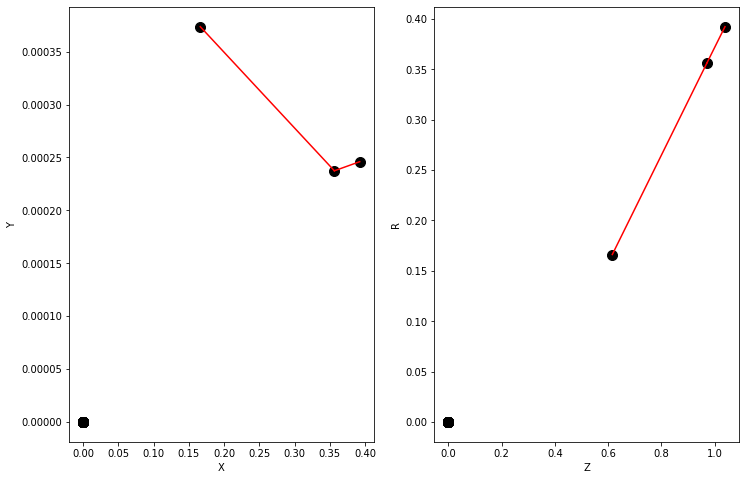

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.16805385 0.20144482 0.0450049  0.0600007  0.0655922  0.06265534
 0.17671078 0.17213522 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


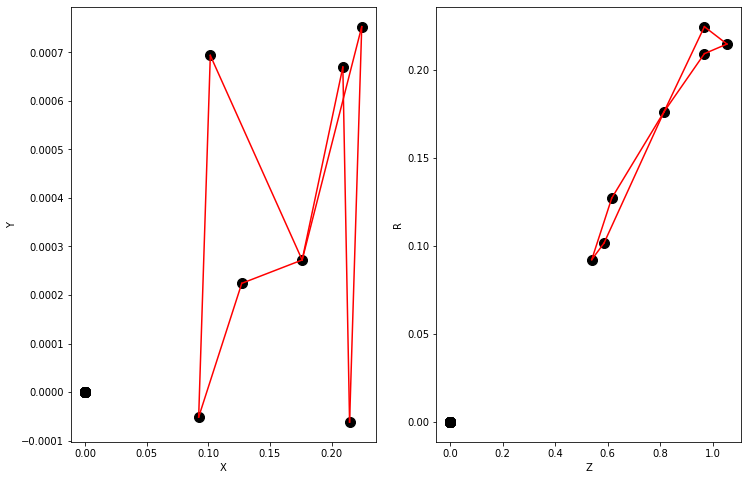

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.8263977e-05 5.7196645e-05 5.9279217e-05 5.8187794e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

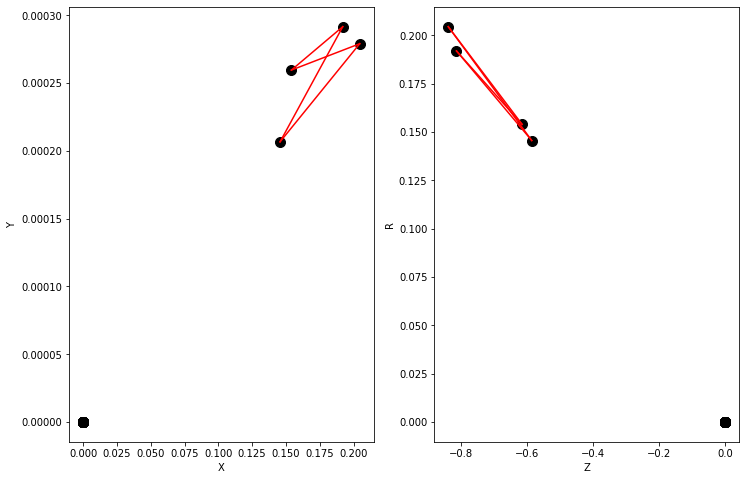

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.2576812e-05 4.4428860e-05 3.6957015e-05 3.4352255e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

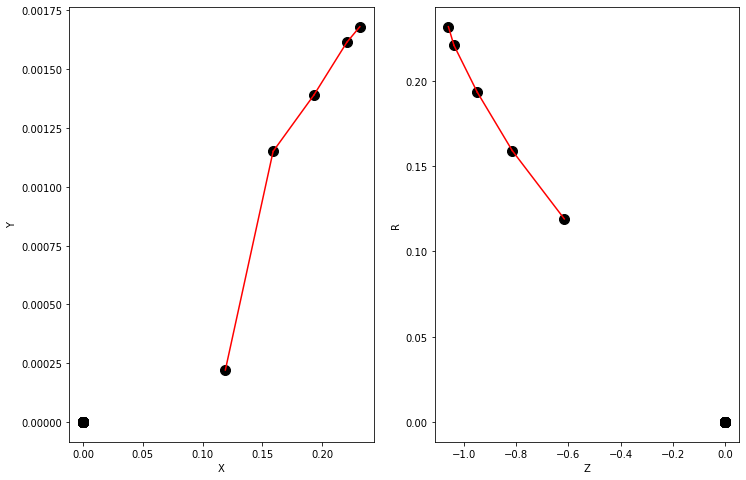

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.4245796e-05 6.4738597e-05 7.1930197e-05 7.2538365e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

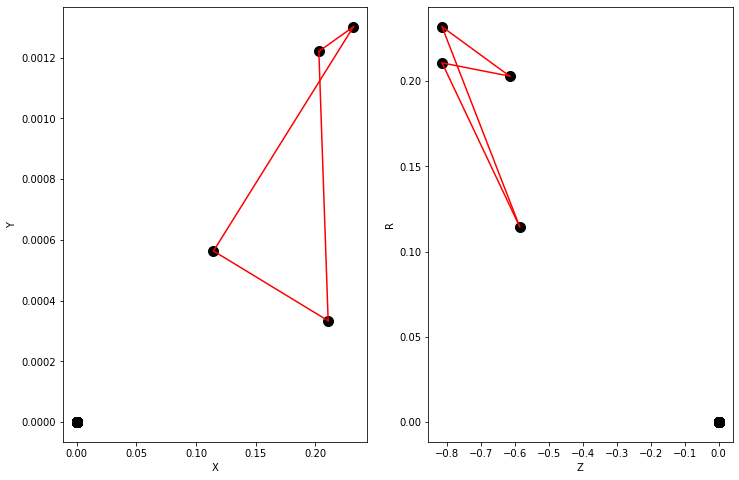

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.2601820e-05 3.8300816e-05 3.2520707e-05 3.2412005e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

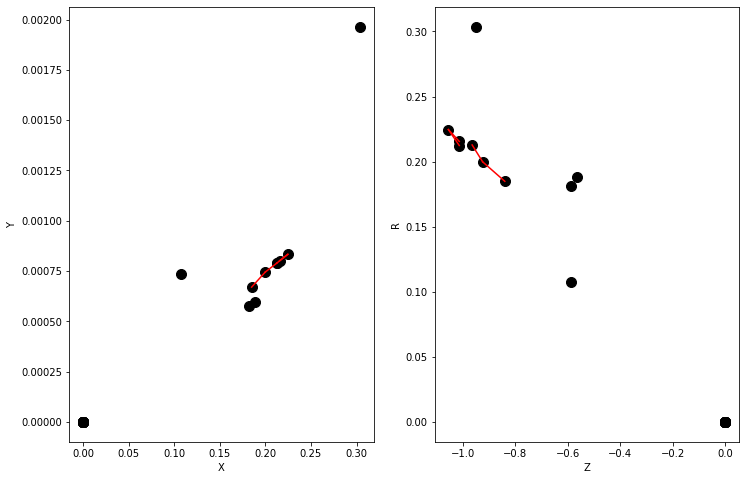

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.9887632e-05 6.7744986e-05 6.9595932e-05 6.7464549e-05 6.9607682e-05
 6.7475936e-05 5.3725416e-05 5.2472227e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

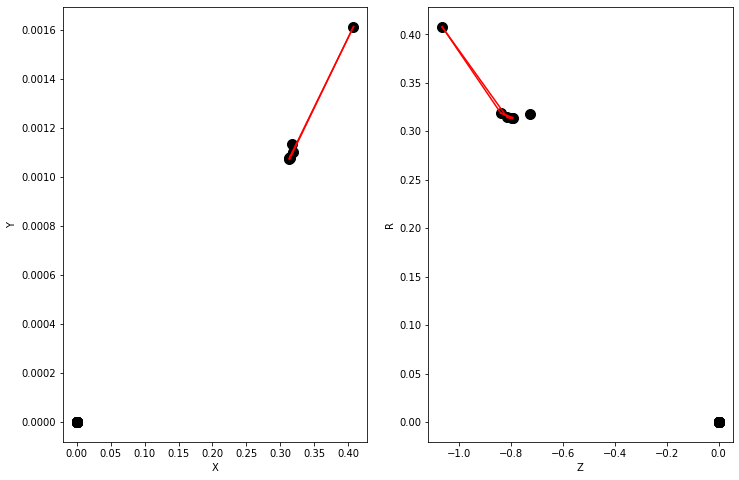

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.05312901 0.05214557 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


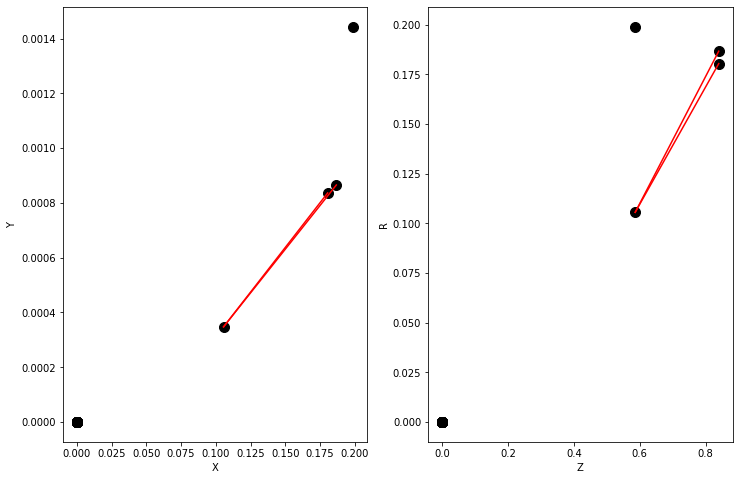

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.09991334 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


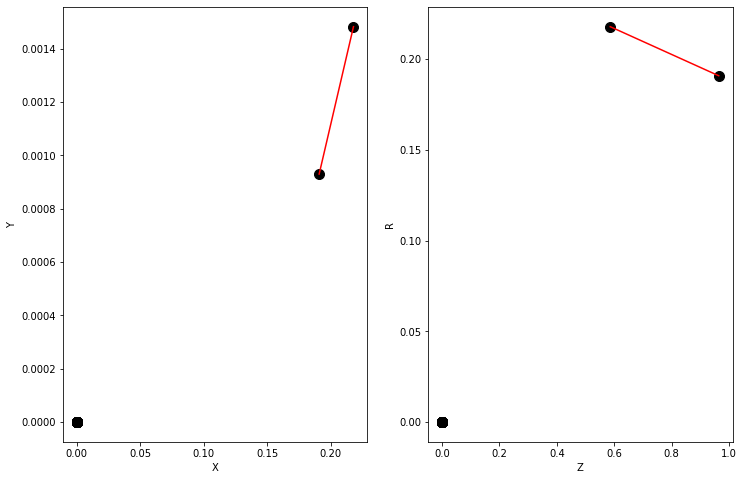

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.408719e-05 7.698377e-05 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

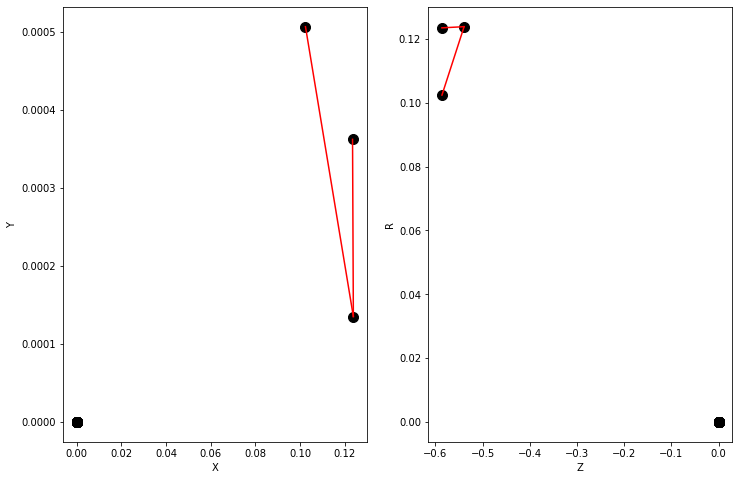

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.1460862e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

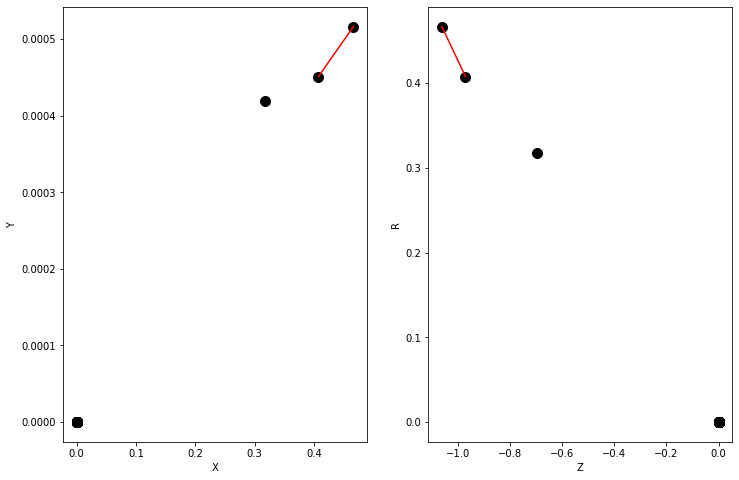

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.3301532  0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


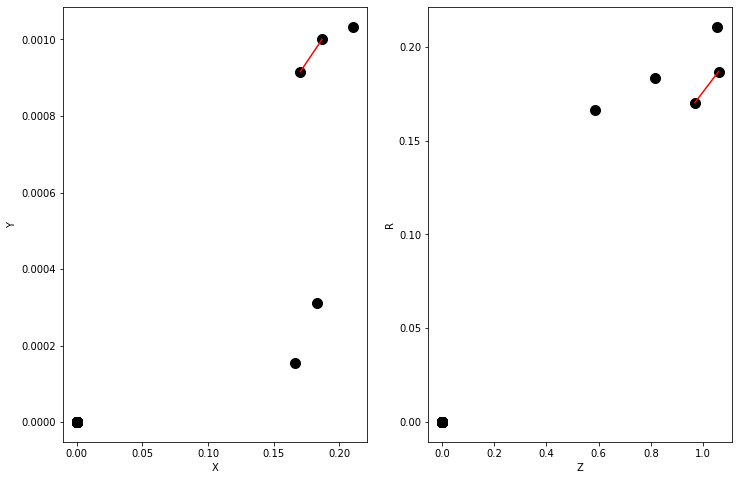

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [2.9981878e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

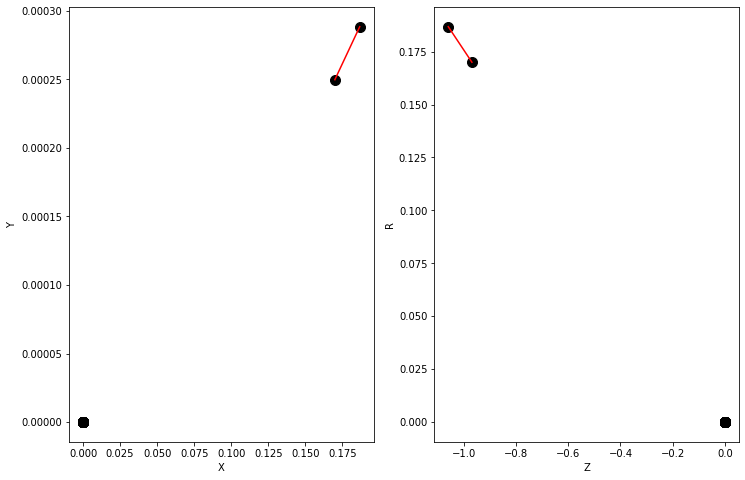

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.2676583  0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


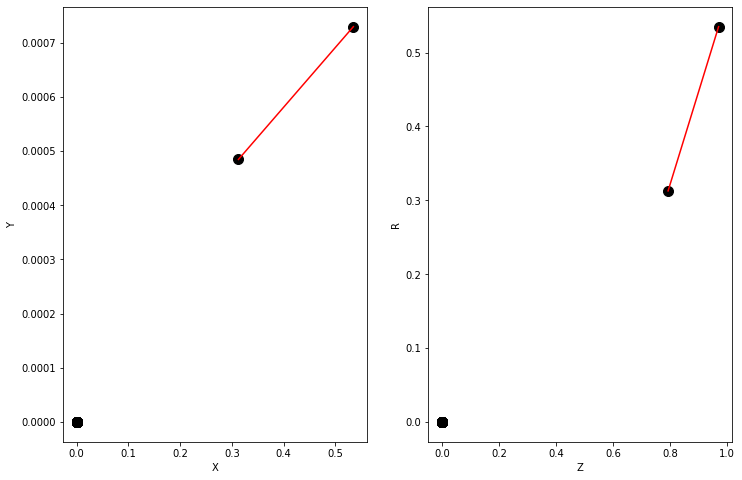

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.9774502e-05 5.7289333e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

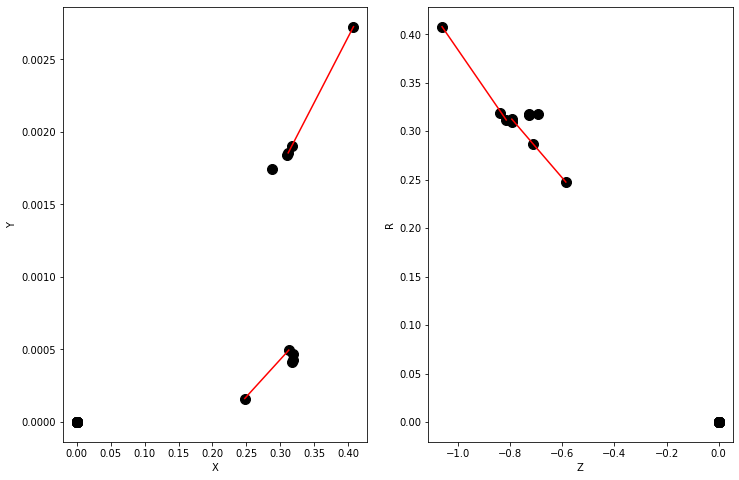

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.01034274 0.01324255 0.00937526 0.01195514 0.00830983 0.01058115
 0.09919995 0.09318677 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


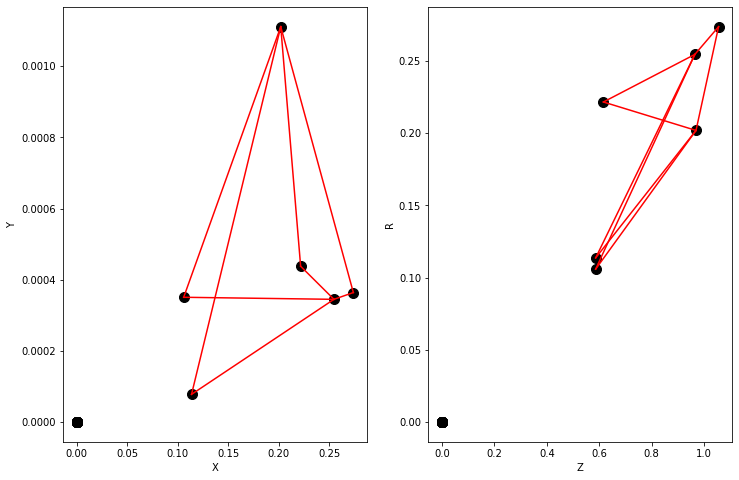

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.0475832e-05 5.6274090e-05 3.7540416e-05 3.3704713e-05 3.2891519e-05
 3.2701737e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

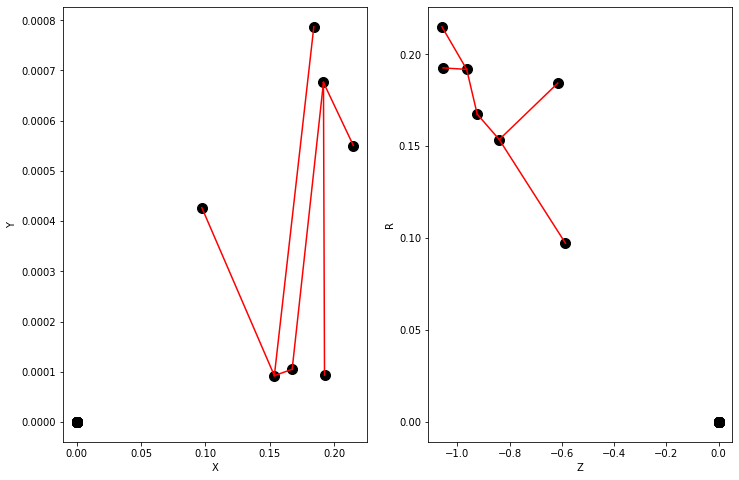

Y = [0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.54485464 0.46289963 0.48700786 0.38165504 0.35362637 0.2537812
 0.3828355  0.24485973 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.946, precision 0.333, recall 0.500


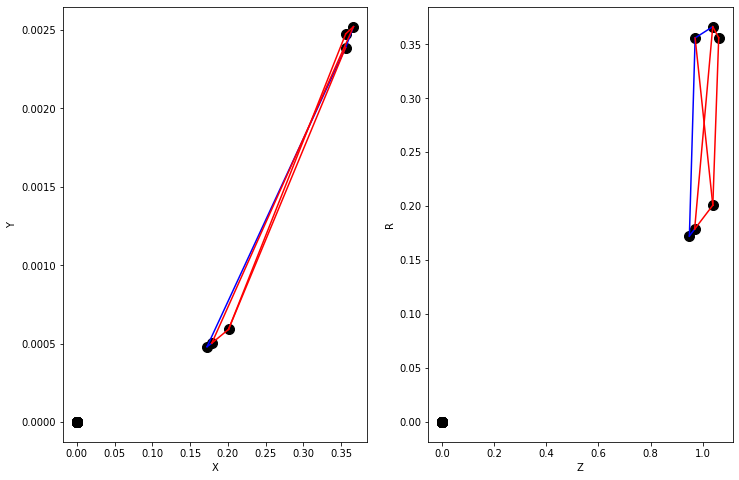

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.06957263 0.05867546 0.09611301 0.09928316 0.2265382  0.19215001
 0.35710227 0.47139367 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


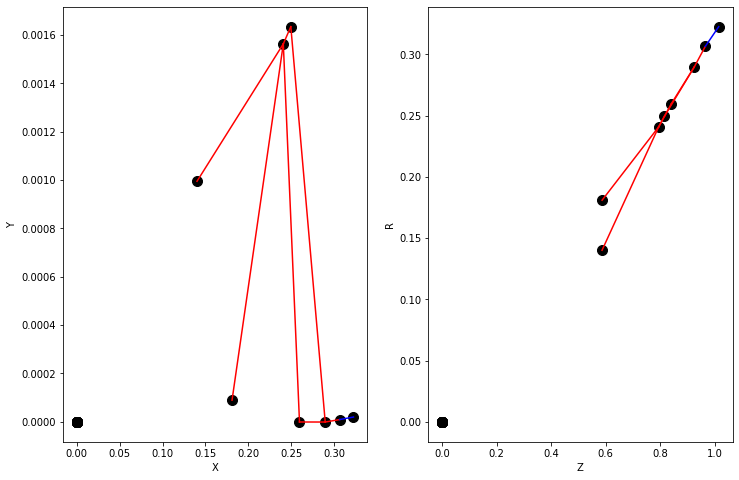

Y = [1. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.65480024 0.6584543  0.6479624  0.6290891  0.60942566 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.600, recall 1.000


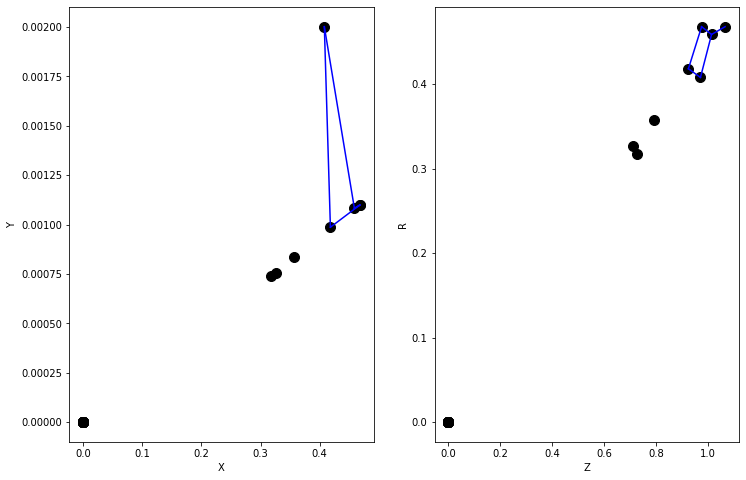

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.01611365 0.03630403 0.01924104 0.12366651 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


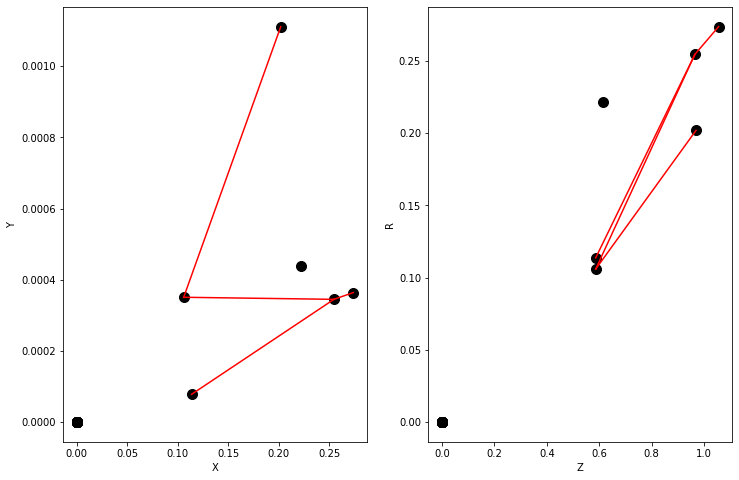

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.5441222e-05 5.7387373e-05 5.9868169e-05 5.6089408e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

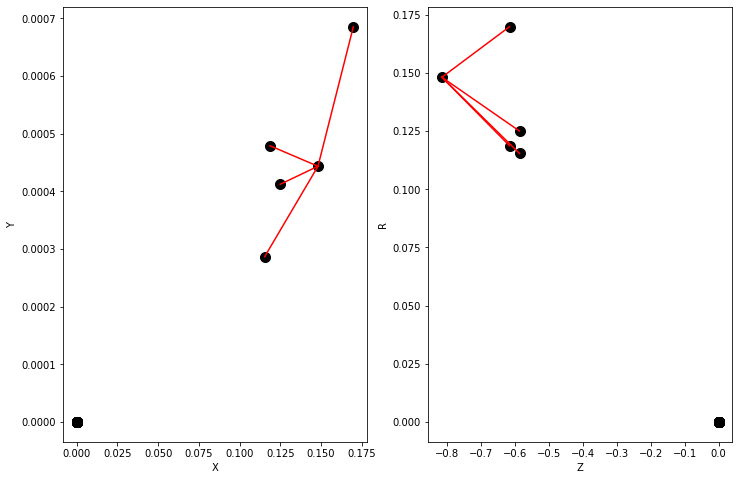

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.18629164 0.1944522  0.531306   0.48561627 0.4664898  0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.946, precision 0.000, recall 0.000


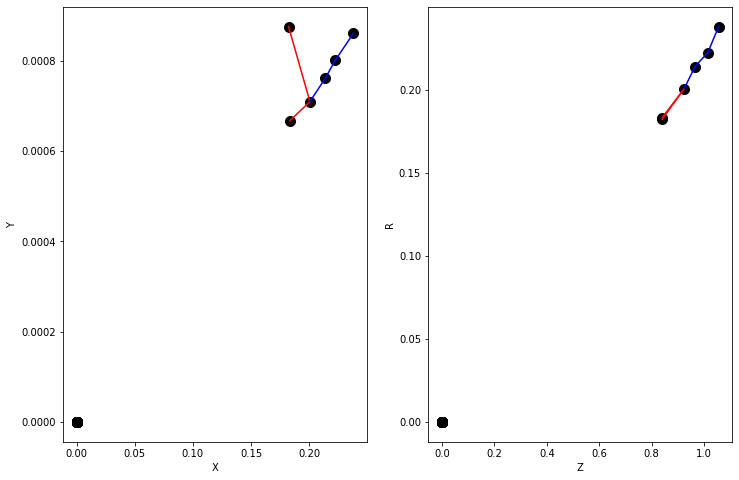

Y = [1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.6413287e-01 5.4100722e-01 8.7087983e-01 8.1856120e-01 7.0322520e-01
 5.8633184e-01 5.0227493e-01 4.8646578e-01 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

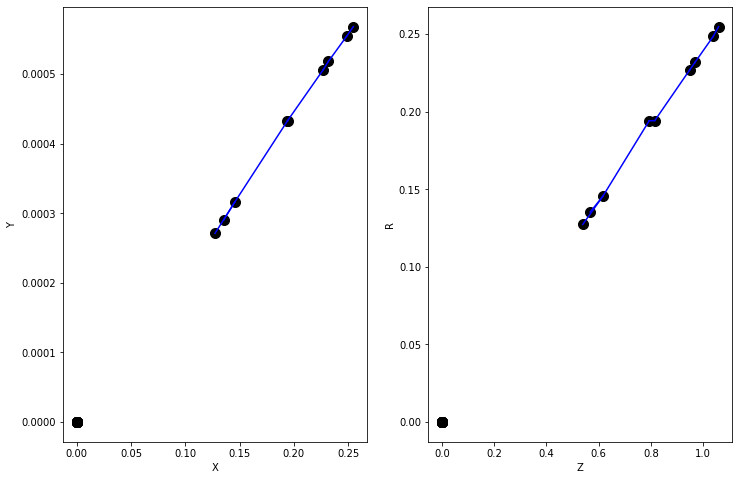

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.06129738 0.07822807 0.11894591 0.11754945 0.2594479  0.25795725
 0.4274333  0.48644483 0.4826224  0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.946, precision 0.000, recall 0.000


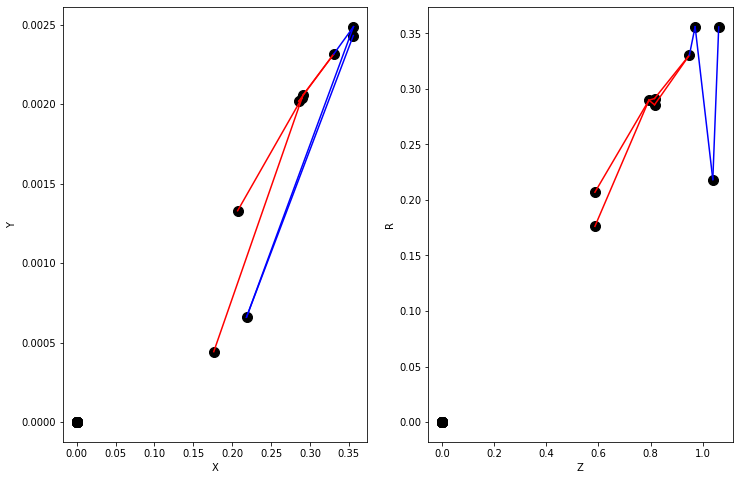

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.02275037 0.01863587 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


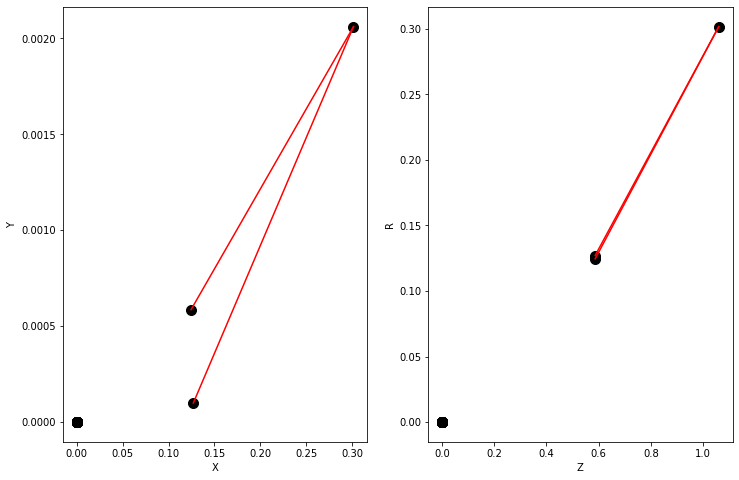

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.04997277 0.0449224  0.15499105 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


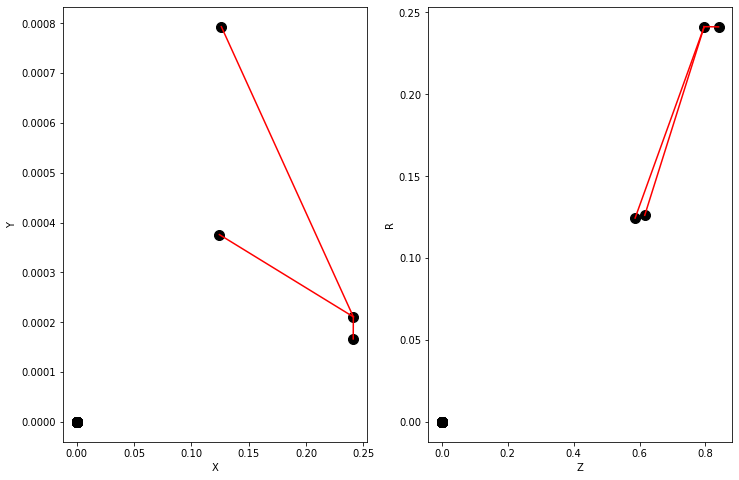

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.4718543  0.51529545 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


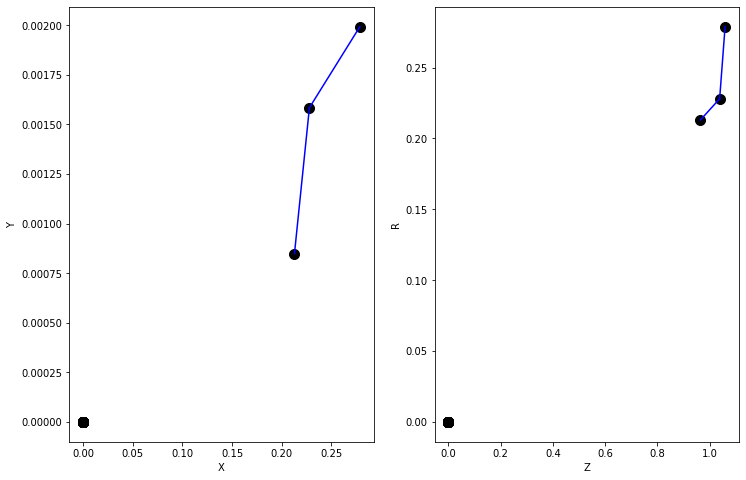

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.25634146 0.22238001 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


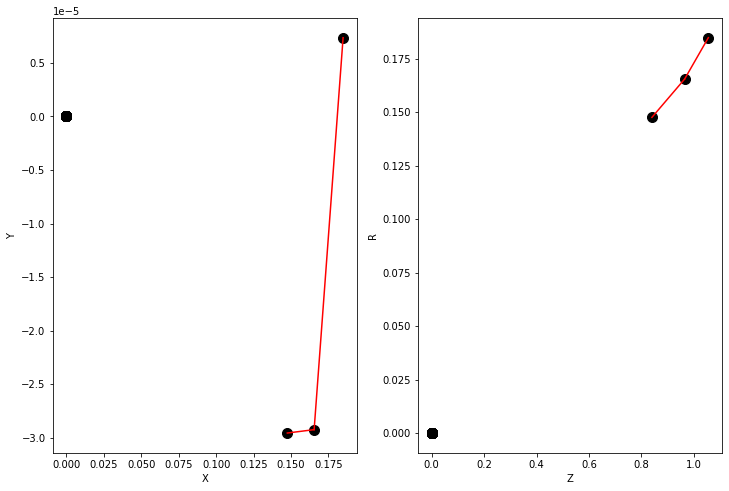

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [3.8819224e-05 3.8906837e-05 3.6255780e-05 3.6417467e-05 3.4254801e-05
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

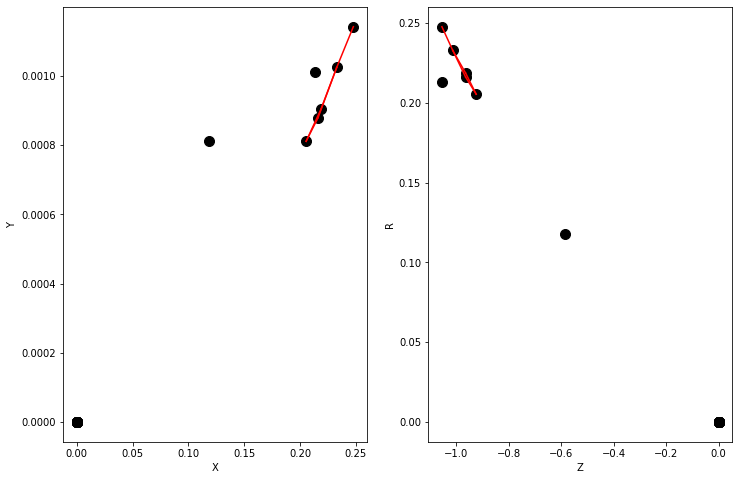

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.6921275e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

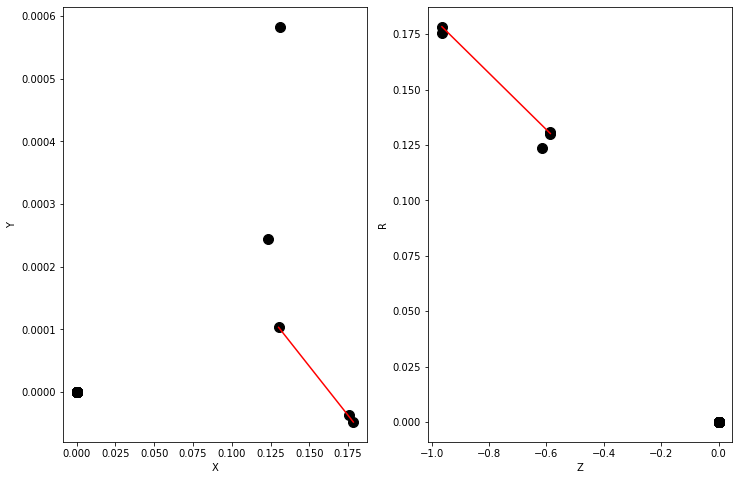

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.0001063  0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


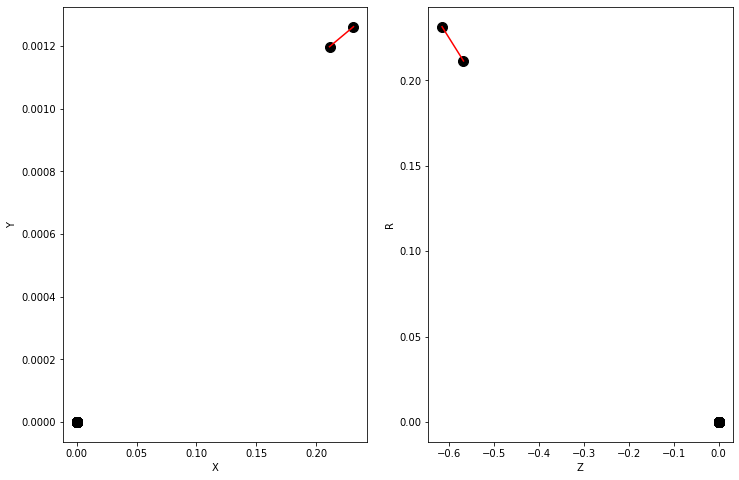

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [3.5391167e-05 3.2811946e-05 3.0523268e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

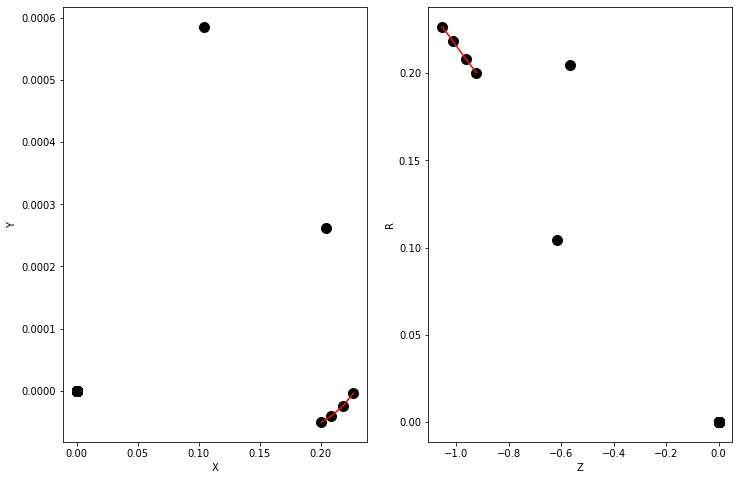

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.08514916 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


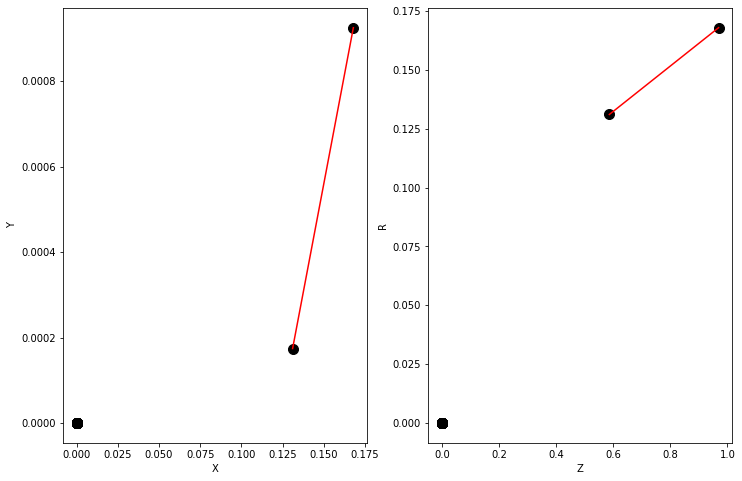

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.14298692 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


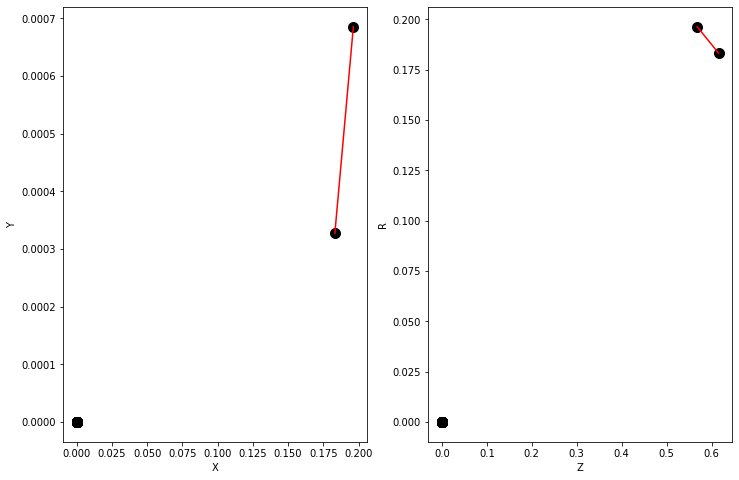

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.207172e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

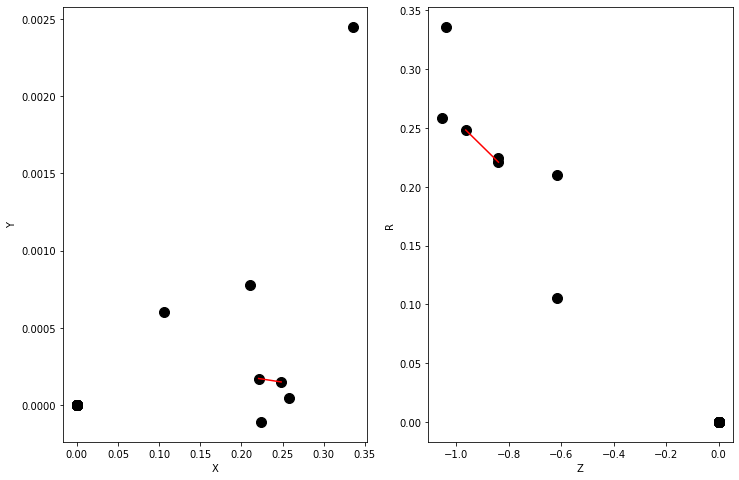

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.7766672e-05 5.7910849e-05 5.5878474e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

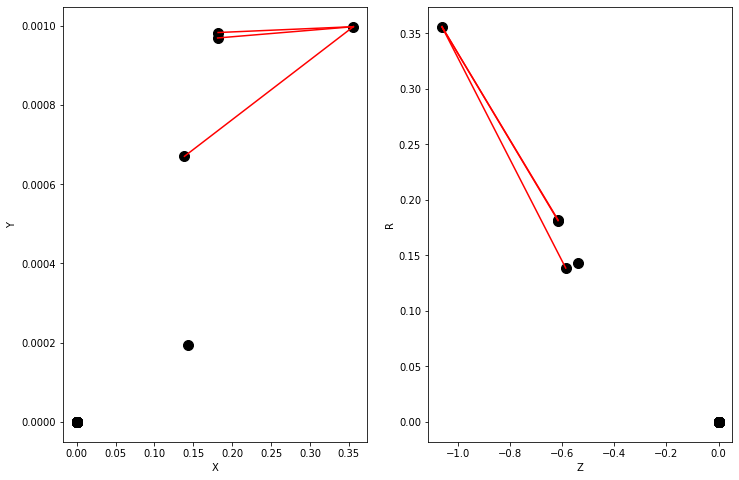

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.03827054 0.11639182 0.0664764  0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


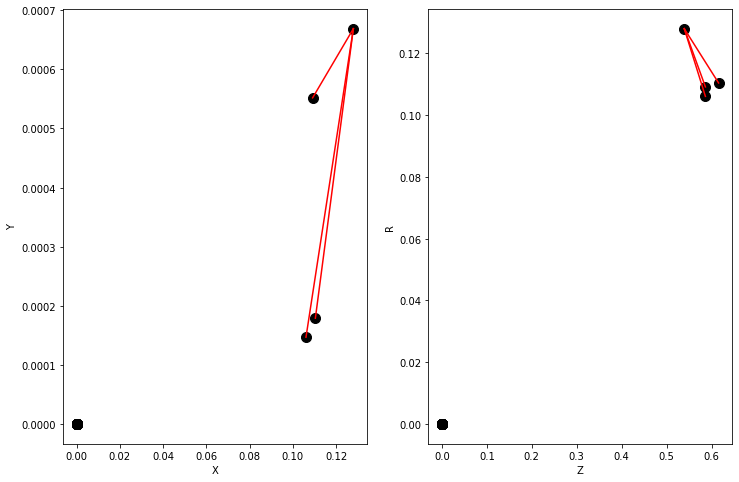

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [3.8819224e-05 3.8906837e-05 3.6255780e-05 3.6417467e-05 3.4254801e-05
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

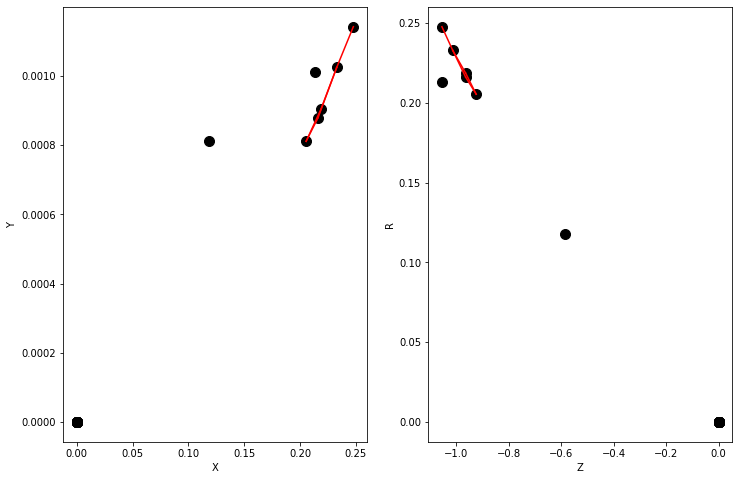

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.11698113 0.46433118 0.4897962  0.4980743  0.44192207 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.929, precision 0.000, recall 0.000


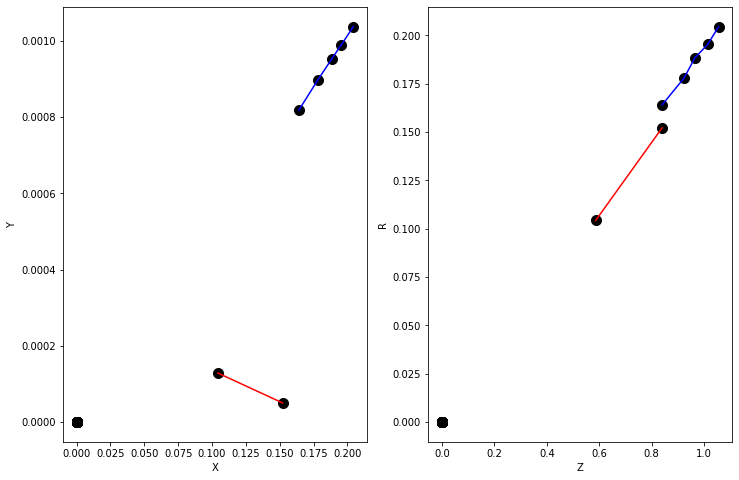

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.5275126e-05 4.5998029e-05 5.1432453e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

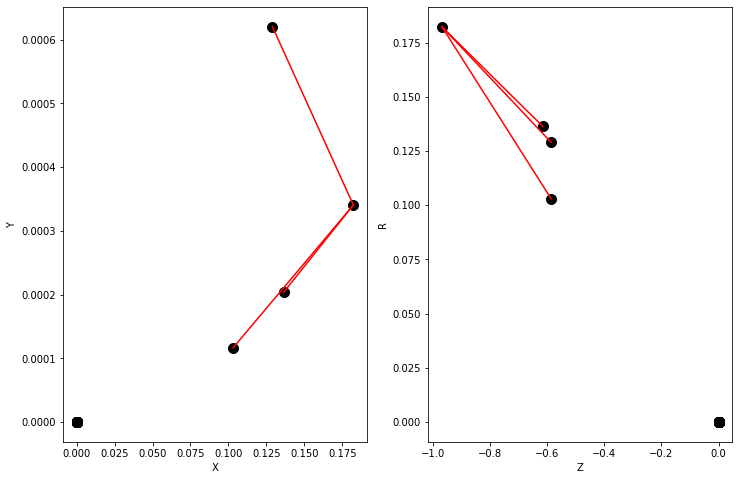

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.37449655 0.23034605 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


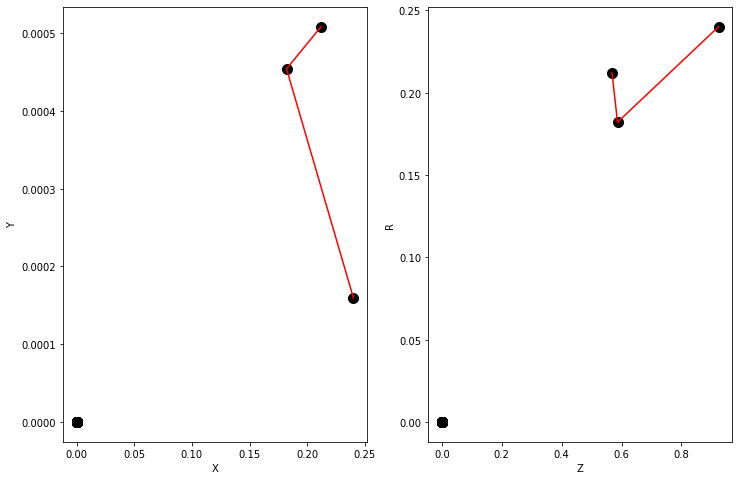

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.24232295 0.237266   0.22908132 0.22041239 0.4096487  0.38379884
 0.43266636 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


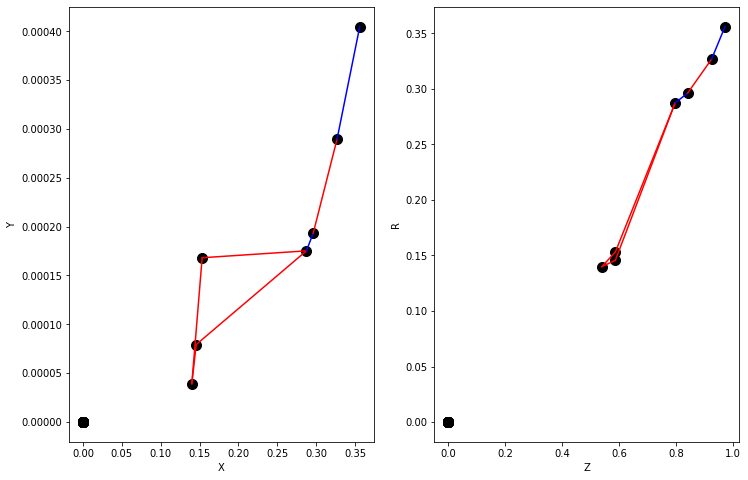

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.07822099 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


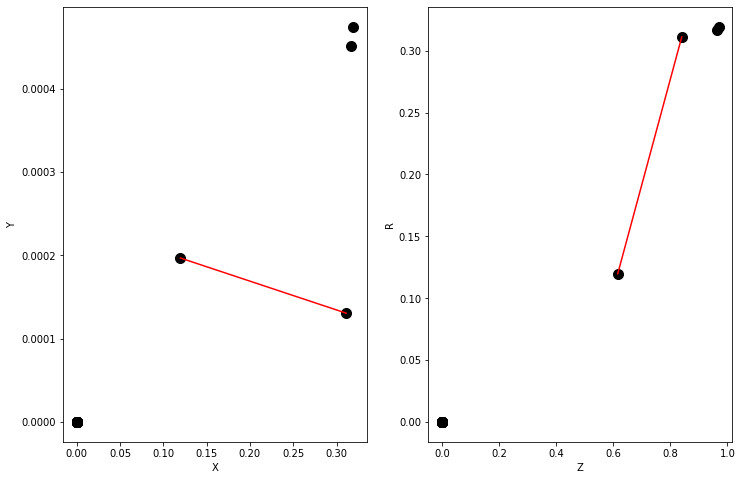

Y = [1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.8652582e-01 8.3576012e-01 5.8193994e-01 6.6741842e-01 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

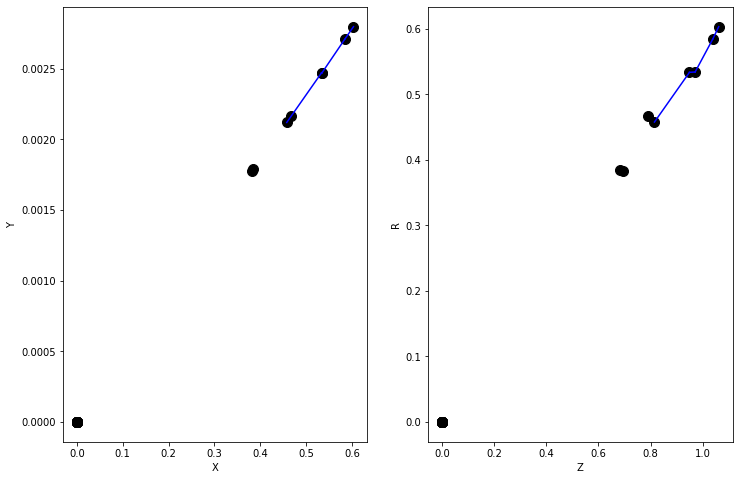

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.08816589 0.0916293  0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


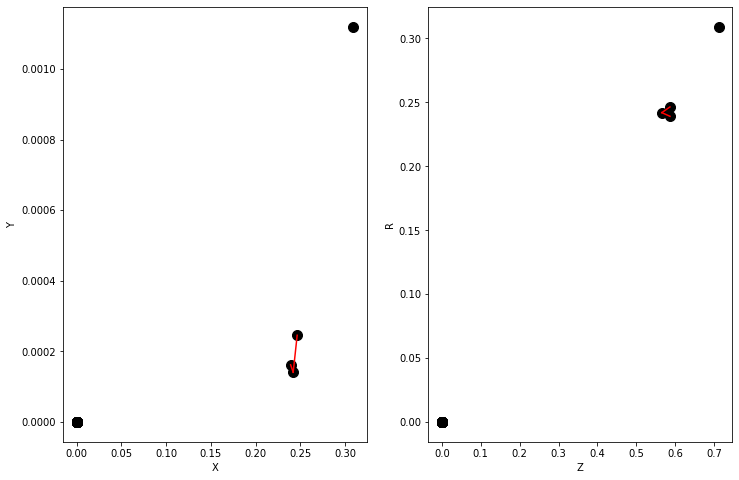

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.255780e-05 4.762362e-05 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

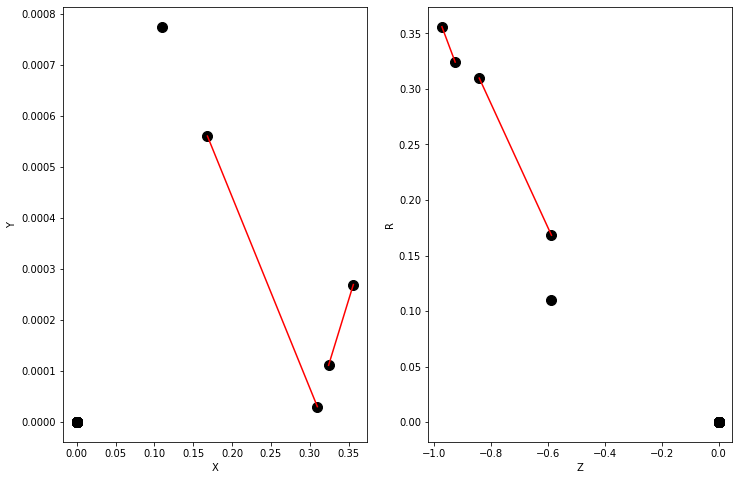

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [9.441525e-05 9.610397e-05 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

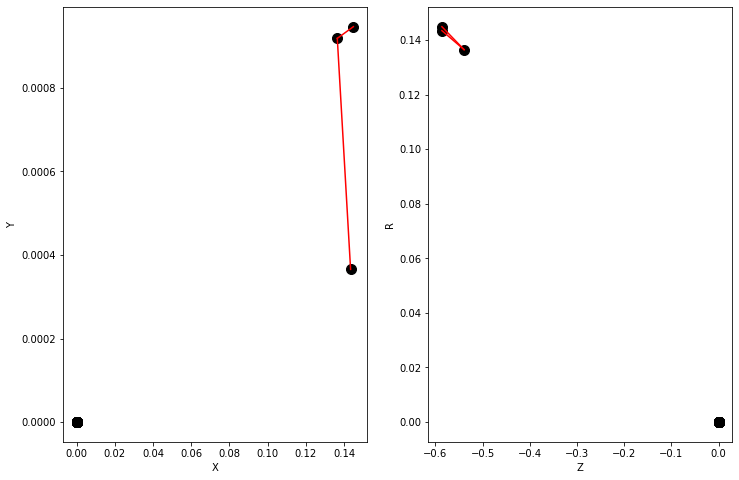

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.04371464 0.03624912 0.09469321 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


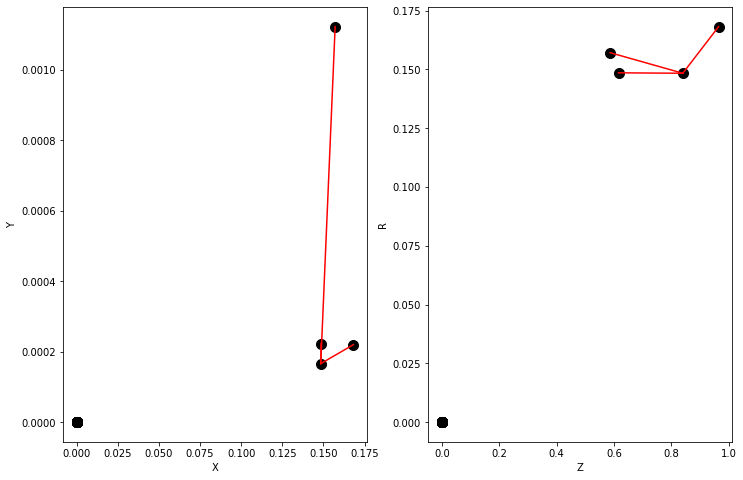

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.15610835 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


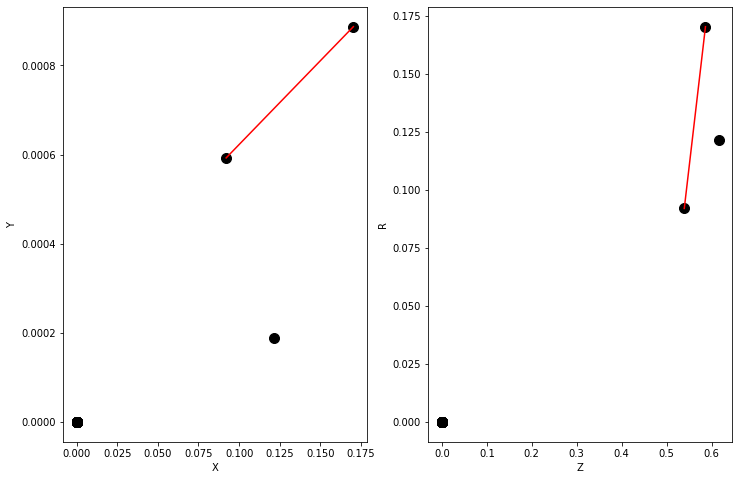

Y = [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.1362688e-01 4.1371453e-01 4.1353789e-01 4.1391879e-01 3.9562815e-01
 9.4370151e-01 8.6064363e-01 6.6555792e-01 5.8191293e-01 5.1621461e-01
 5.1218122e-01 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

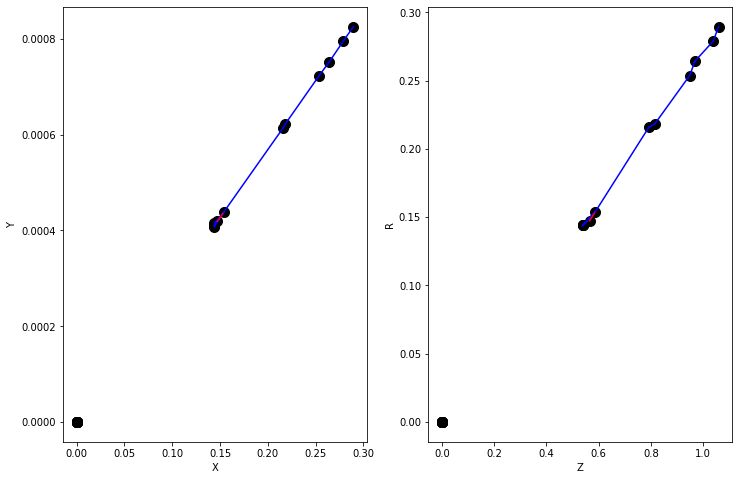

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [3.2942877e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

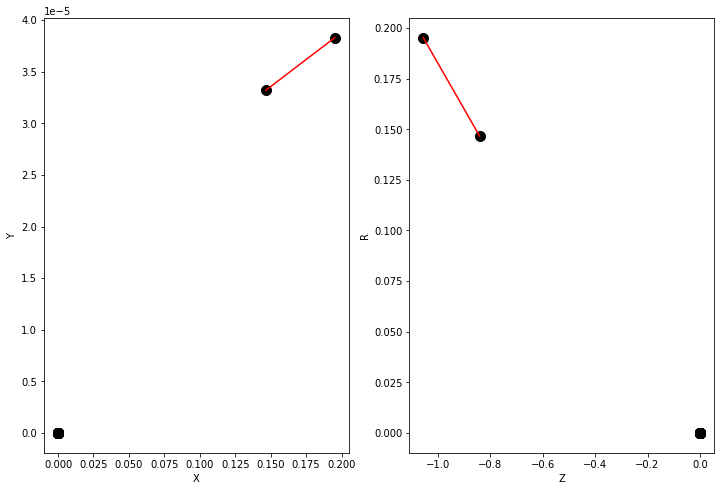

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.359238e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

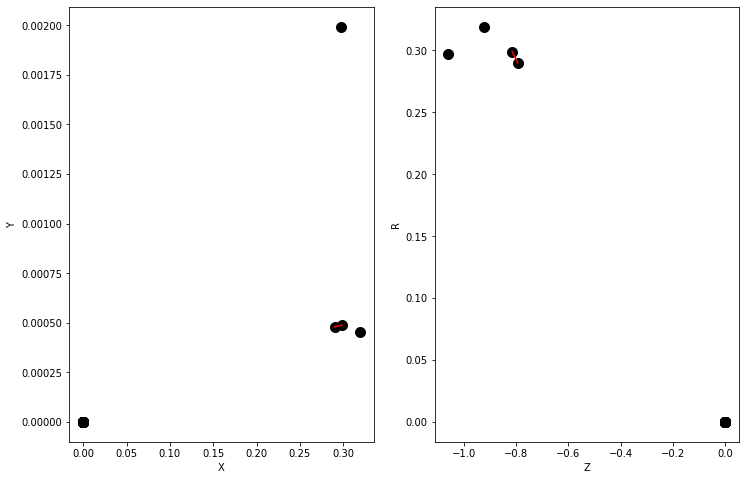

Y = [1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.4381633e-01 5.2519375e-01 8.8396627e-01 8.2293457e-01 7.0299578e-01
 5.8761233e-01 5.0969970e-01 4.7634301e-01 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

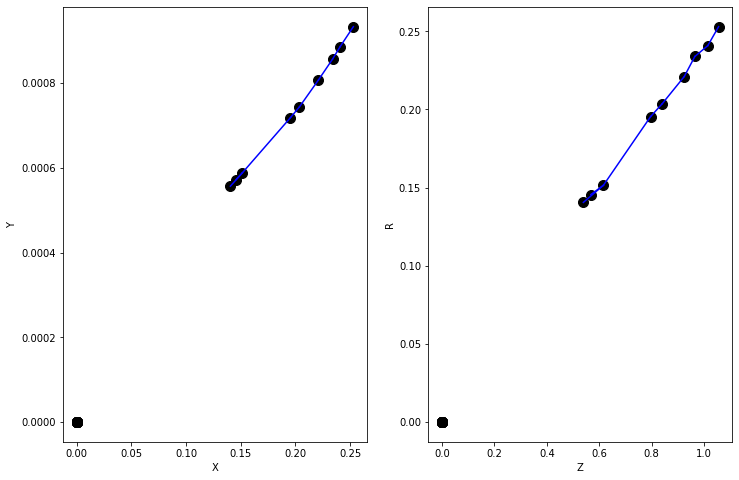

Y = [1. 0. 1. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.30566254 0.26195428 0.31951746 0.27756414 0.57392144 0.49024656
 0.4882548  0.5017926  0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 1.000, recall 0.667


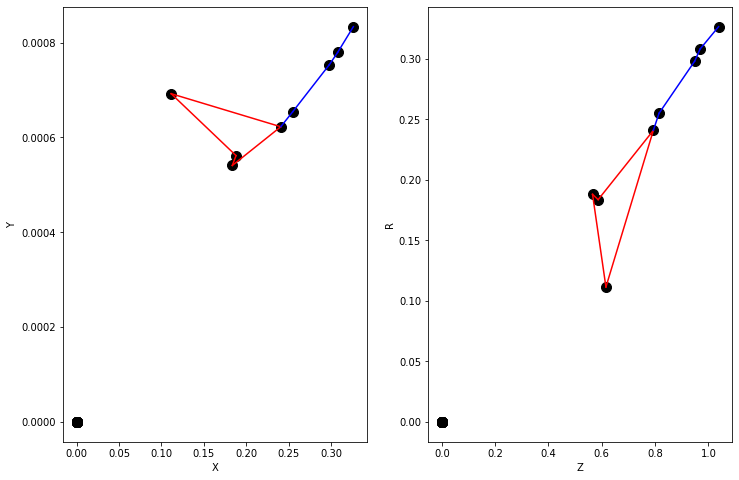

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.38897648 0.20584269 0.17426093 0.07286179 0.07932717 0.28107905
 0.2111856  0.23737389 0.21265317 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


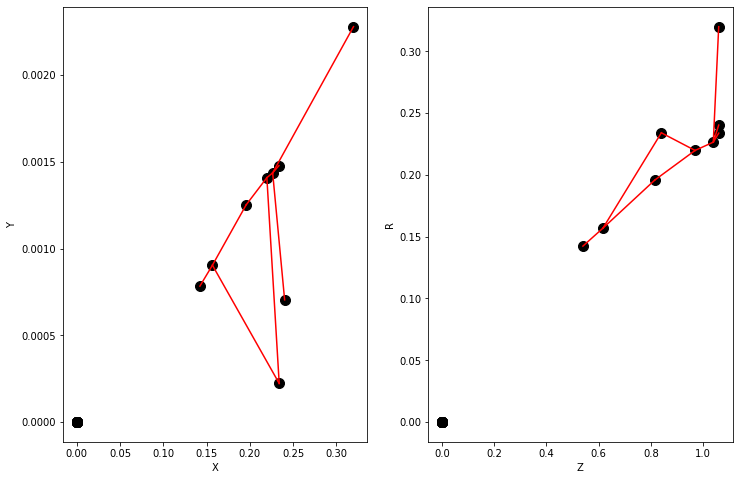

Y = [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.12120915 0.11243816 0.11117741 0.10691462 0.10578523 0.03108091
 0.02916575 0.02843475 0.02686298 0.02625593 0.30221528 0.32039094
 0.11144134 0.11980136 0.13135484 0.14049642 0.32686418 0.36519134
 0.48207682 0.5048309  0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.946, precision 1.000, recall 0.400


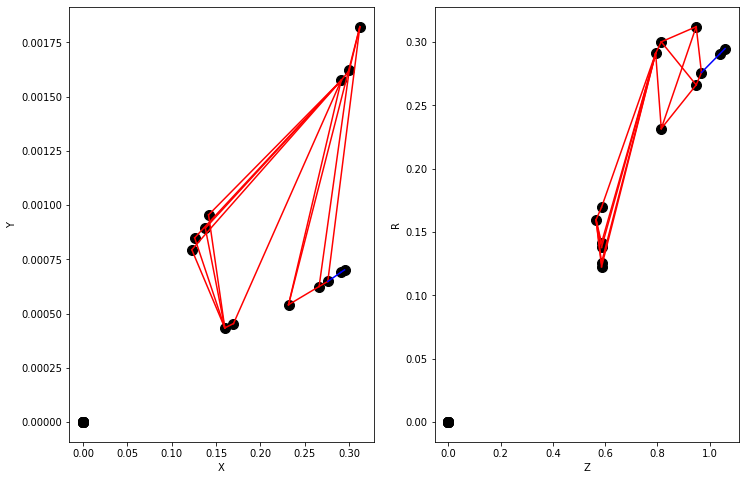

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.14306203 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


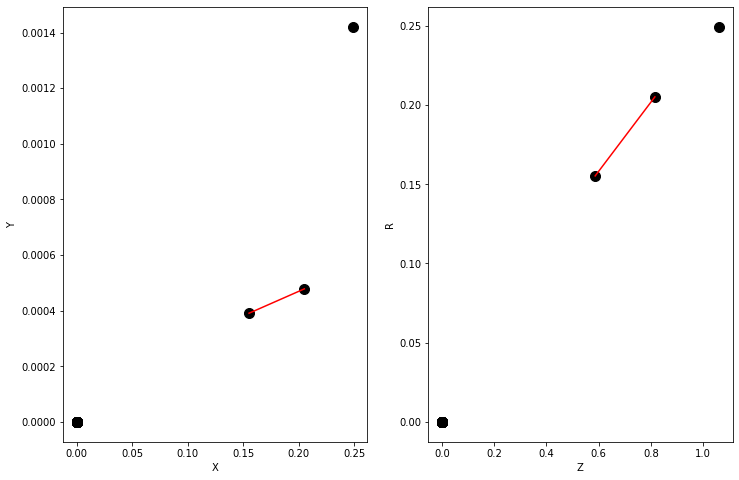

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.0197348e-05 5.3553242e-05 4.6603411e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

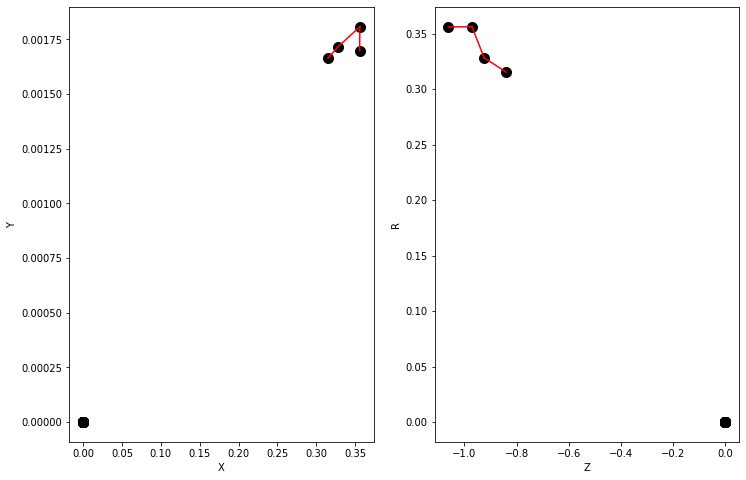

Y = [1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.6323957e-01 5.4476249e-01 8.4752530e-01 7.7733094e-01 6.6246444e-01
 5.0558734e-01 4.5259786e-01 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

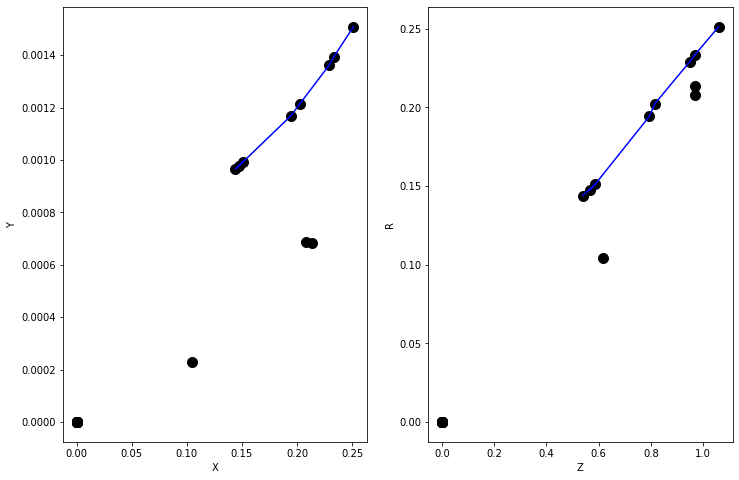

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.1889898  0.2687549  0.5281071  0.49792066 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


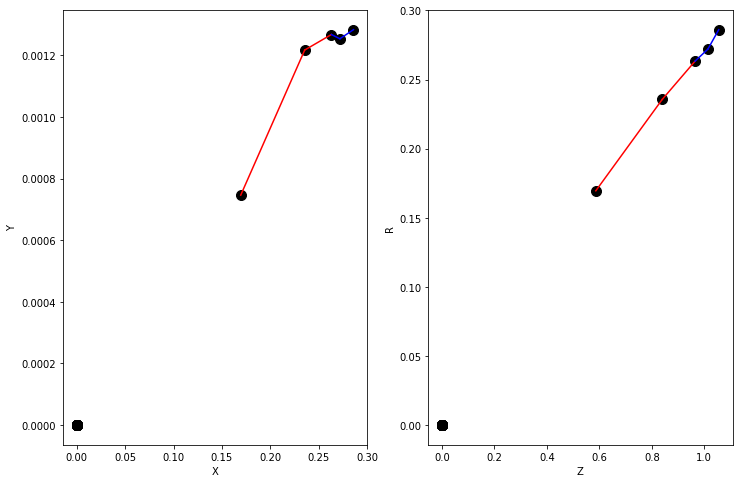

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.28230804 0.19339138 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


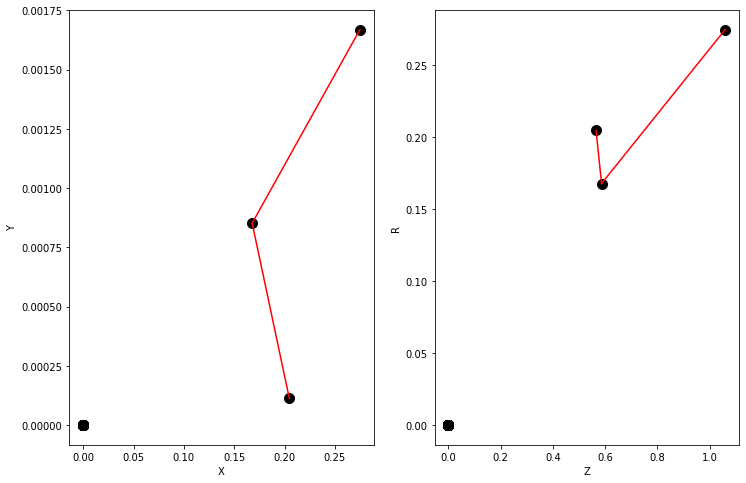

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.0145256e-05 5.5209712e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

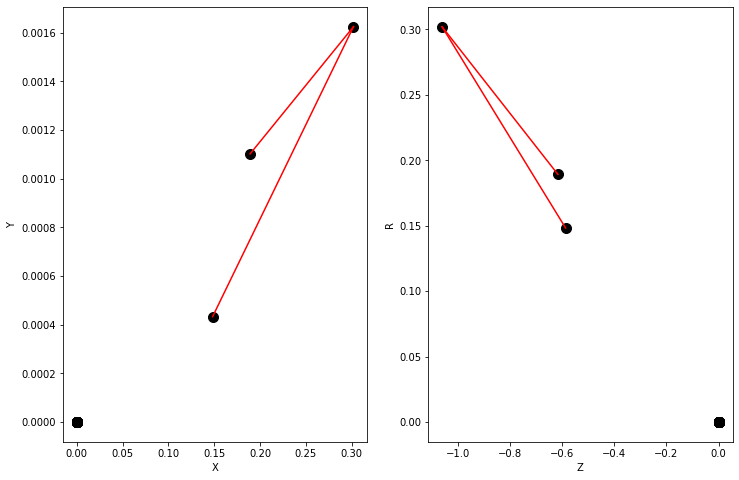

Y = [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.57471746 0.6494113  0.62040395 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 1.000, recall 1.000


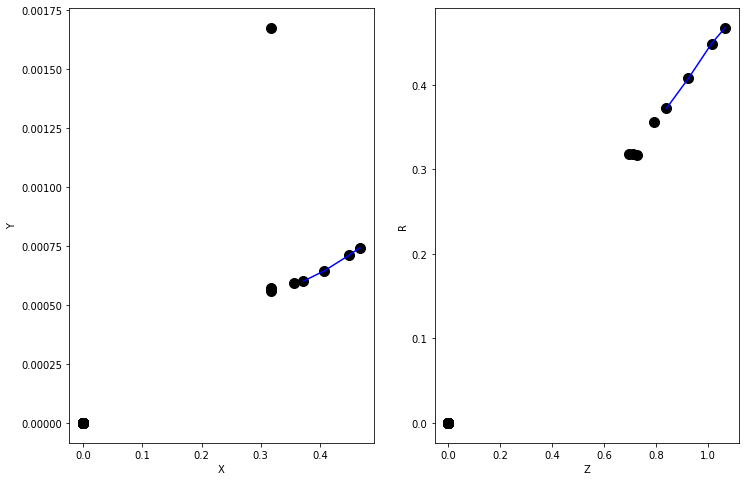

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.3671240e-05 4.1364812e-05 4.0284558e-05 3.7392107e-05 3.6555532e-05
 3.3673678e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

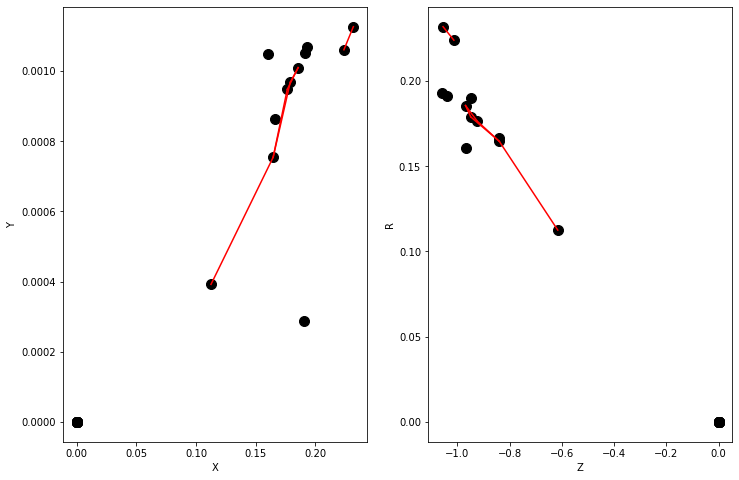

Y = [1. 0. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.5502439  0.13492022 0.5000196  0.23983552 0.23944296 0.24865384
 0.24768753 0.28995055 0.37592298 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.893, precision 1.000, recall 0.250


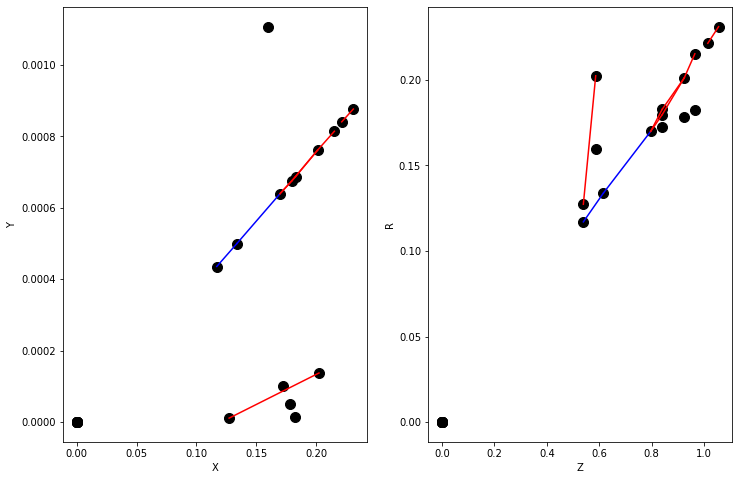

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.0807163  0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


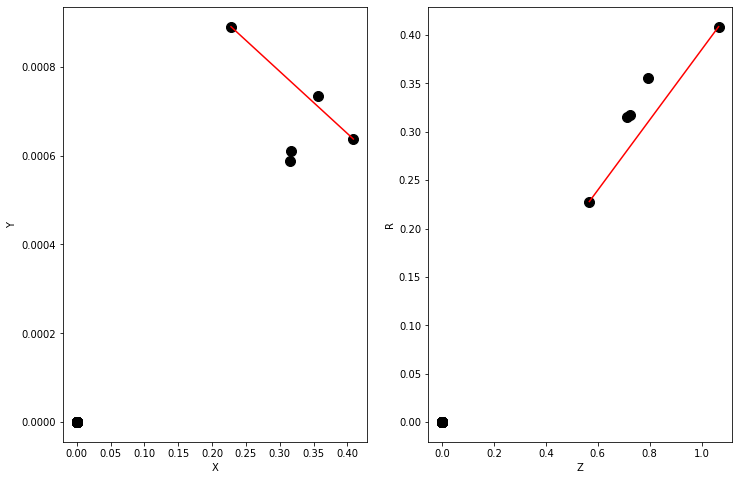

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.8012024e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

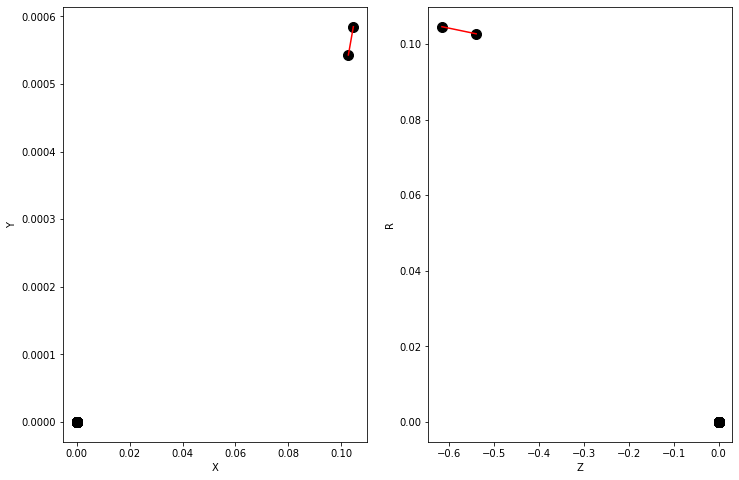

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.09849977 0.18135406 0.38369793 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


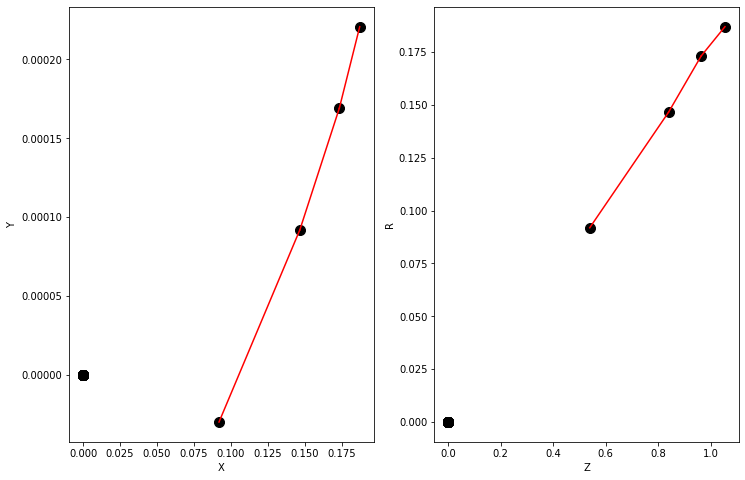

Y = [1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.42964354 0.4542434  0.44807637 0.41279984 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 1.000, recall 1.000


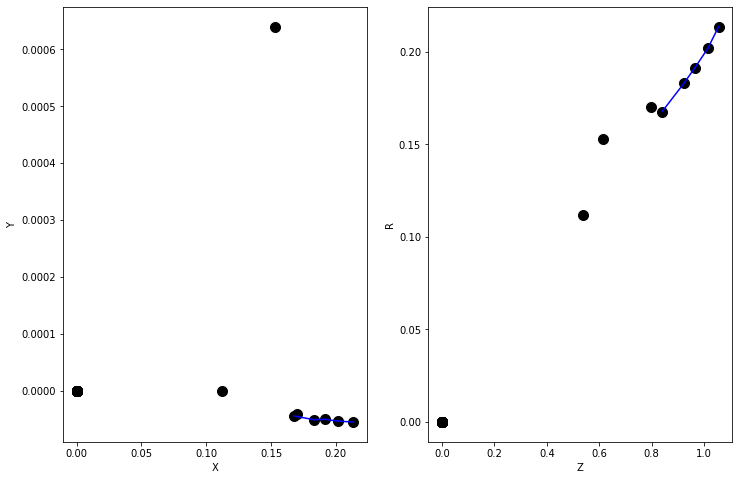

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.00634752 0.00633475 0.00595604 0.00609791 0.00596226 0.08312348
 0.06374696 0.150719   0.12245765 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


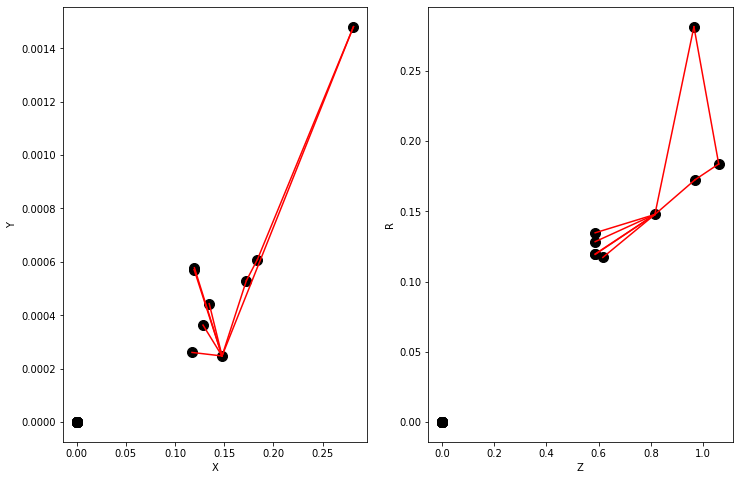

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [9.071922e-05 8.448759e-05 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

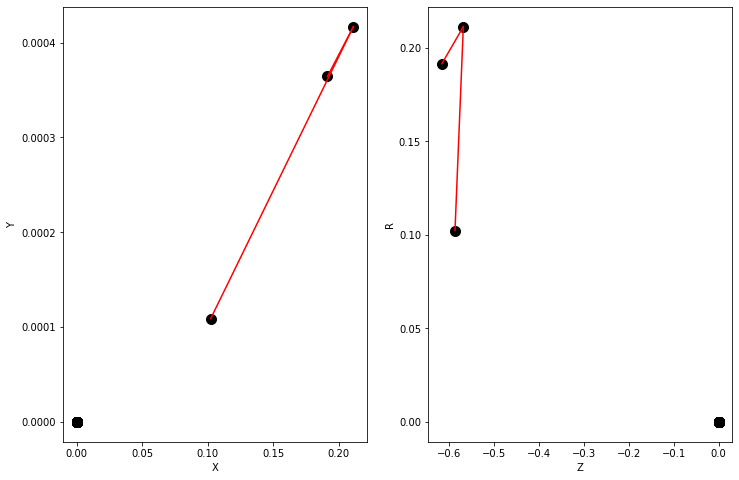

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.01423267 0.01674521 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


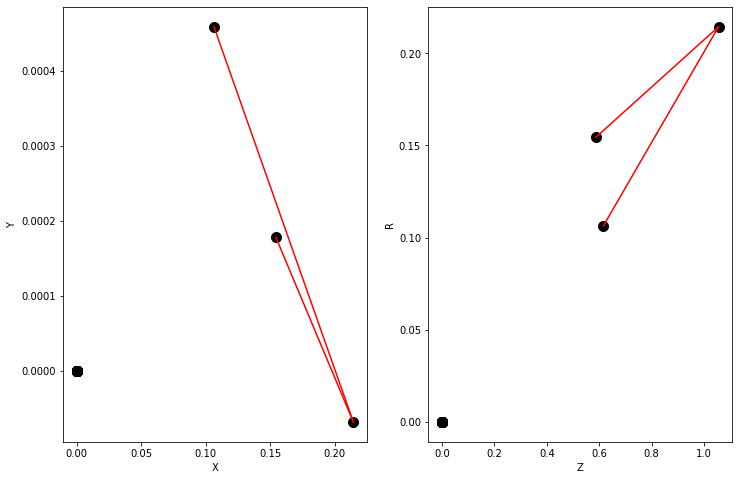

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.43438786 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


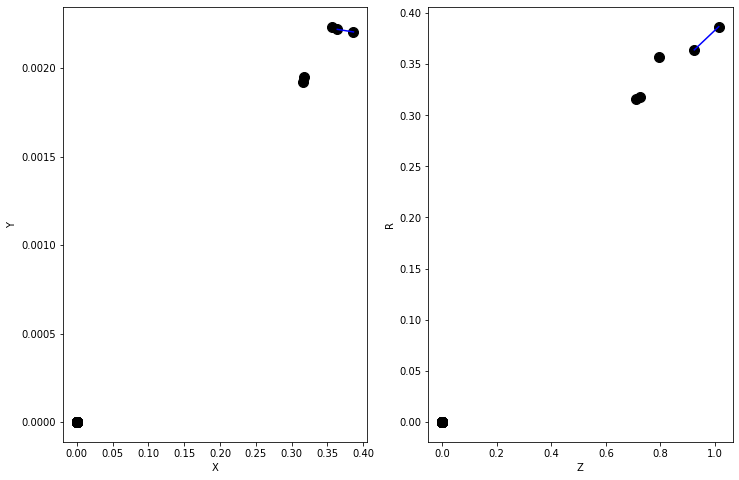

Y = [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.5715728  0.6285532  0.45806238 0.3976631  0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 1.000, recall 1.000


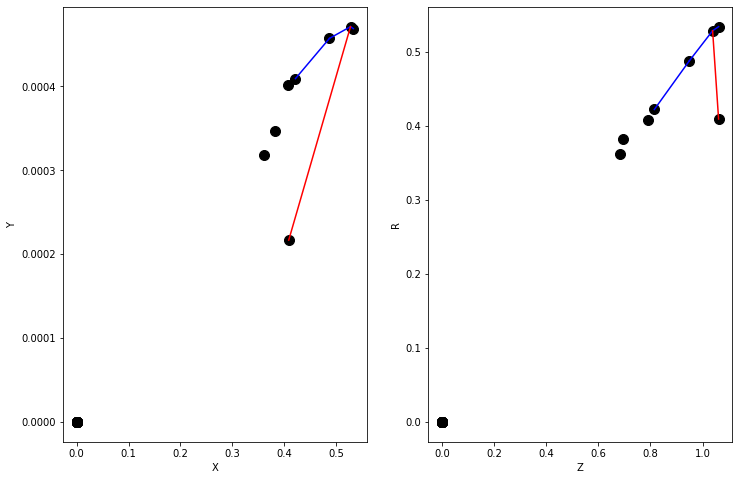

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.1121700e-05 4.9630977e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

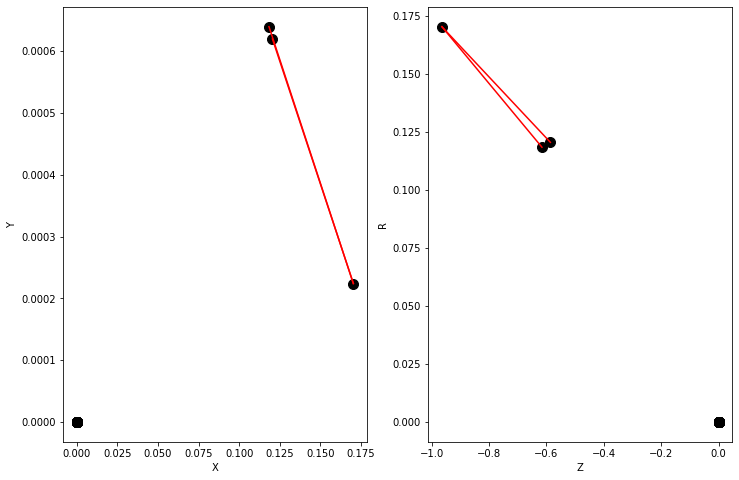

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.949287e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

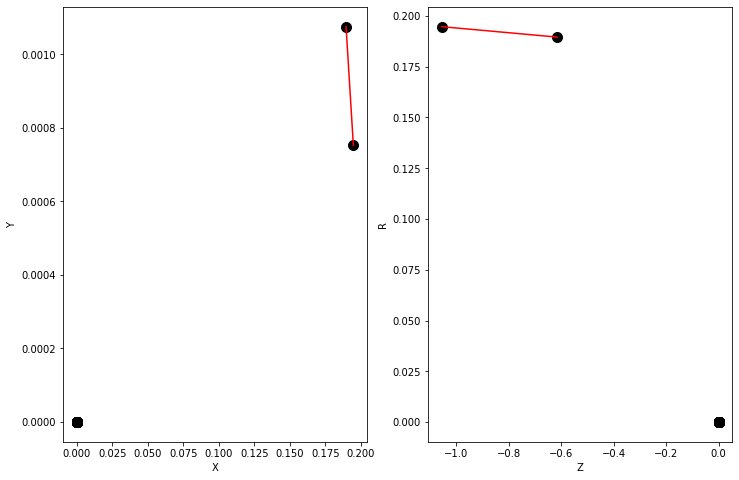

Y = [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.23526046 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


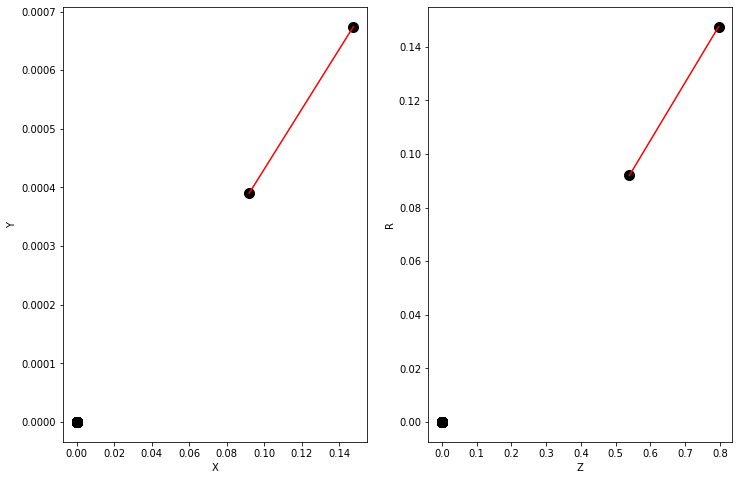

Y = [0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 1. 0. 0. 0. 1. 0. 0. 0. 1. 0.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.11012026 0.12406347 0.12826194 0.1062099  0.10715894 0.10096578
 0.03013382 0.03882446 0.0439233  0.0299705  0.02926432 0.0265395
 0.25529316 0.25125077 0.1817716  0.17655271 0.1689584  0.16374701
 0.35658926 0.34460908 0.3306099  0.31817496 0.32839423 0.29828346
 0.41875494 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.893, precision 1.000, recall 0.143


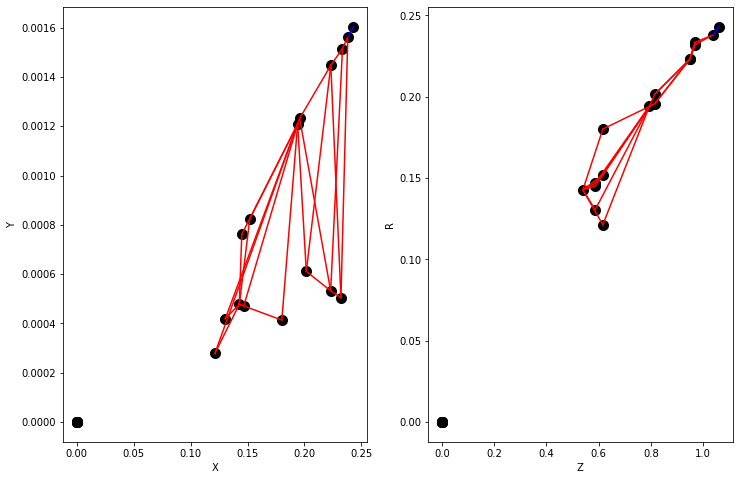

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.0493436e-05 5.0480146e-05 6.3265143e-05 3.2829976e-05 3.2974371e-05
 3.6747279e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

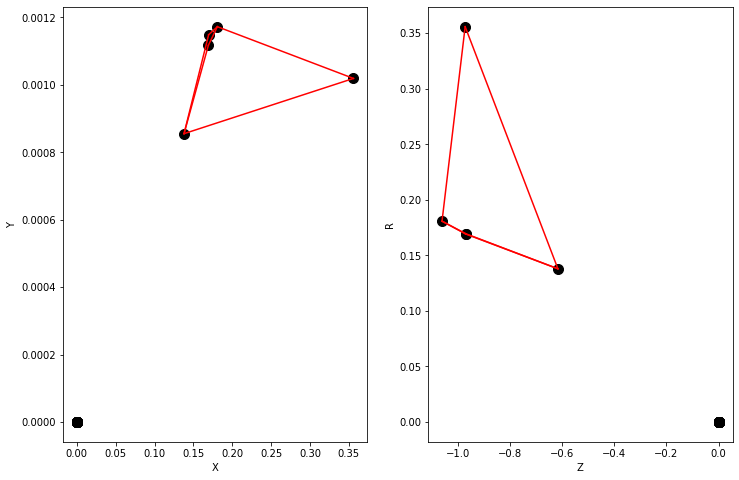

Y = [1. 0. 1. 0. 1. 0. 1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.34342697 0.33140633 0.29458356 0.28048003 0.28446773 0.2909829
 0.24391042 0.24267435 0.36768016 0.41275838 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.911, precision 1.000, recall 0.167


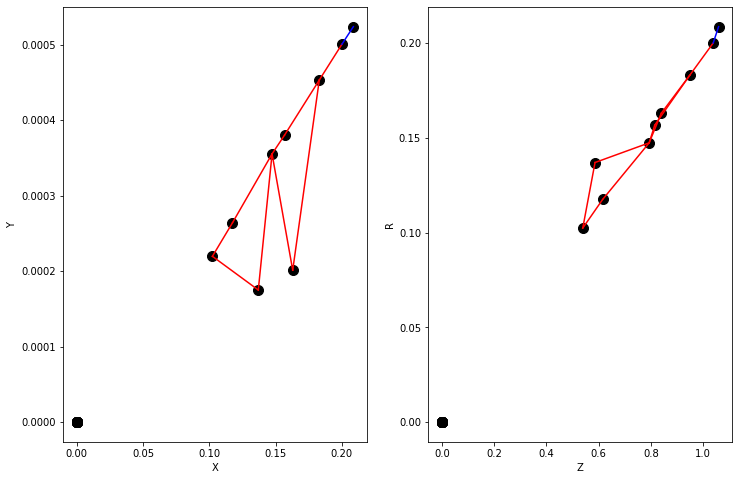

Y = [1. 0. 0. 1. 0. 0. 1. 1. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.21076049 0.21980283 0.18448344 0.10197621 0.09405109 0.07530786
 0.43773142 0.29616404 0.2605904  0.32233116 0.27110982 0.44455543
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.929, precision 1.000, recall 0.333


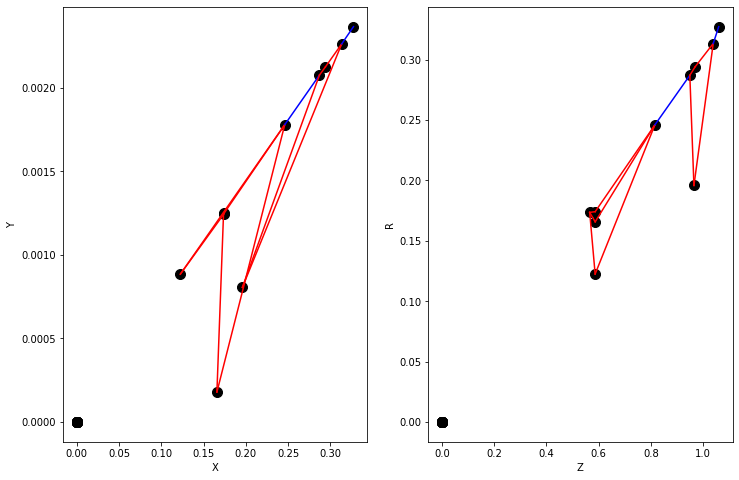

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.9408081e-05 5.1968815e-05 4.5633165e-05 4.7943271e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

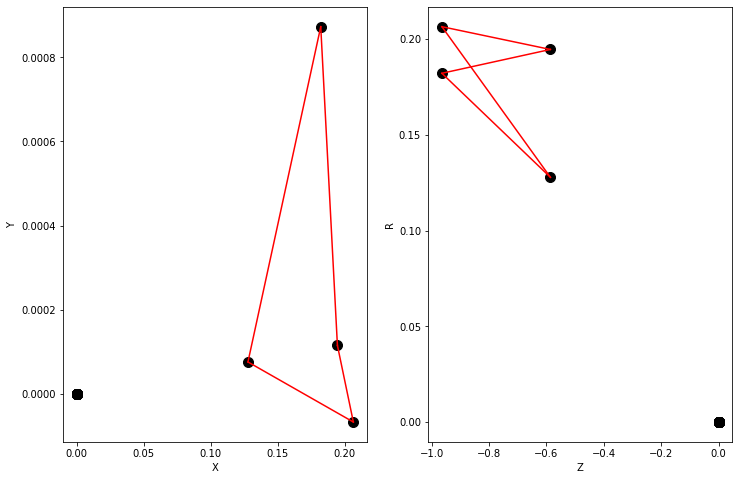

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.18053292 0.16073306 0.03736254 0.03511082 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


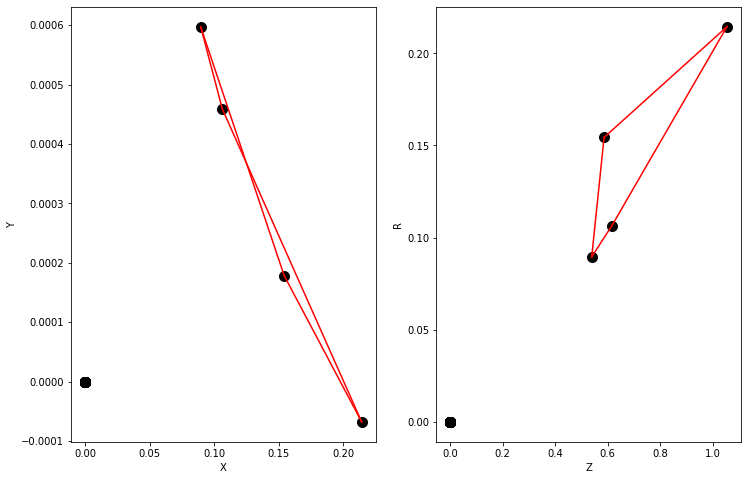

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.02046858 0.01918608 0.02319152 0.02172362 0.0200348  0.01895915
 0.02241623 0.02123318 0.14155075 0.13679114 0.16552322 0.21056832
 0.1725747  0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


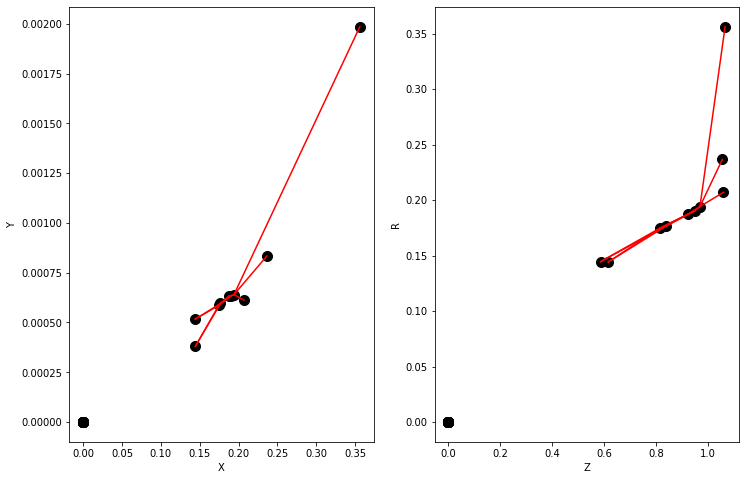

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.06677295 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


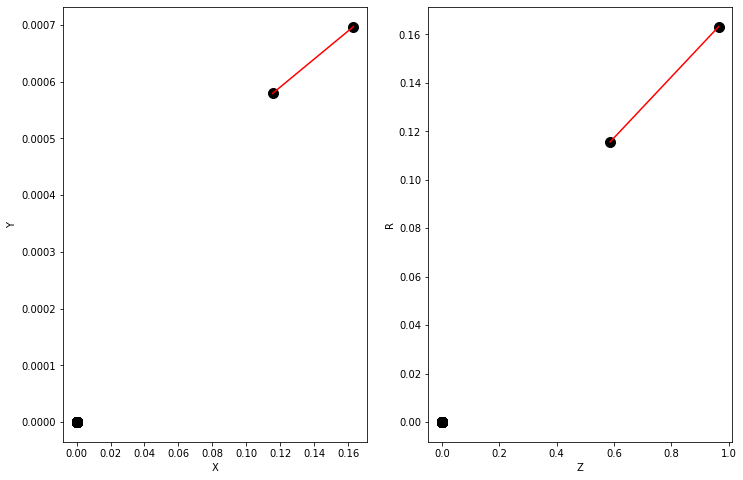

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.2873721  0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


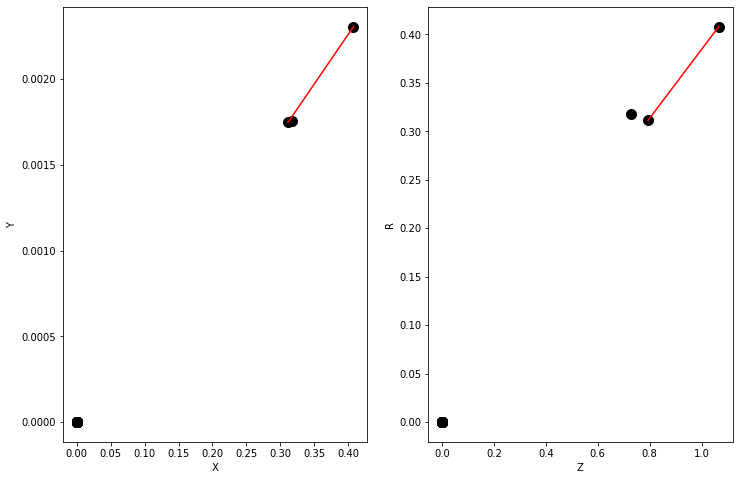

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.15879911 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


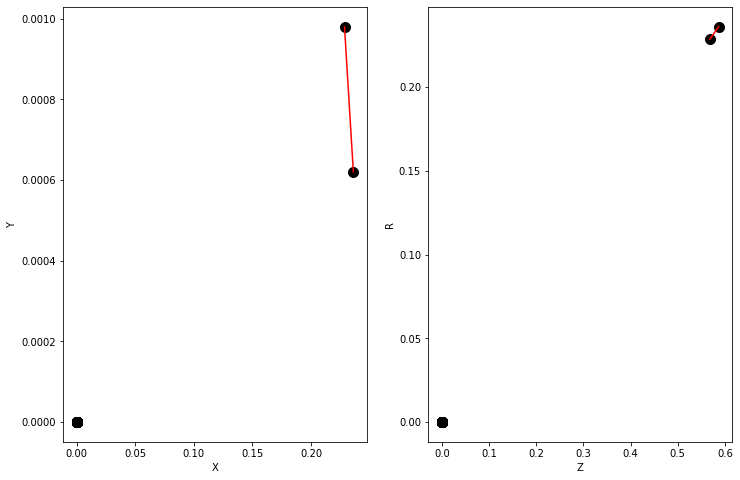

Y = [1. 0. 1. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.32825384 0.25501576 0.44515643 0.31799862 0.6626836  0.5246725
 0.47937033 0.4642824  0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 1.000, recall 0.833


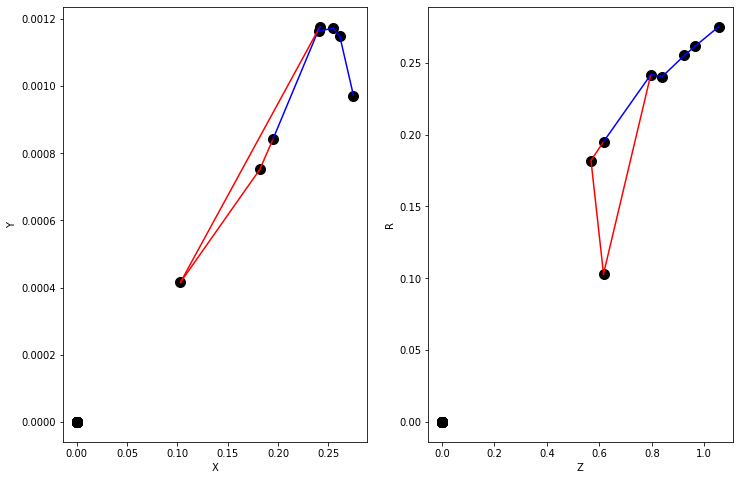

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.02982463 0.01993867 0.02125345 0.02508075 0.03451985 0.0477853
 0.05269023 0.04571007 0.34357822 0.41884068 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


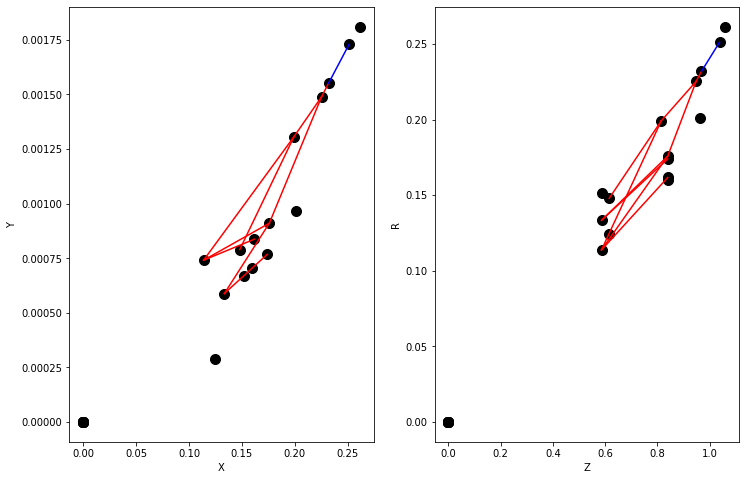

Y = [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.13778776 0.07624773 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


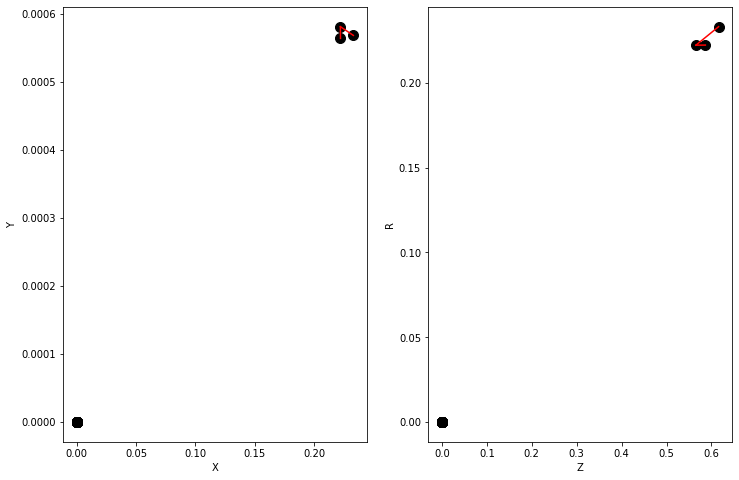

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.3540272e-05 5.4042357e-05 4.9130311e-05 3.3681707e-05 3.5445173e-05
 3.3804790e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

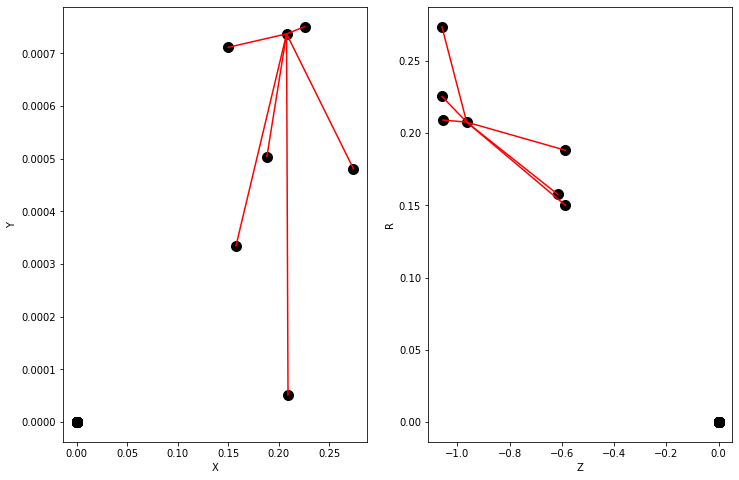

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.8557666e-05 8.6181266e-05 7.0244554e-05 6.8418107e-05 5.7216446e-05
 5.5809774e-05 4.1251169e-05 4.0478335e-05 3.4699216e-05 3.1963973e-05
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

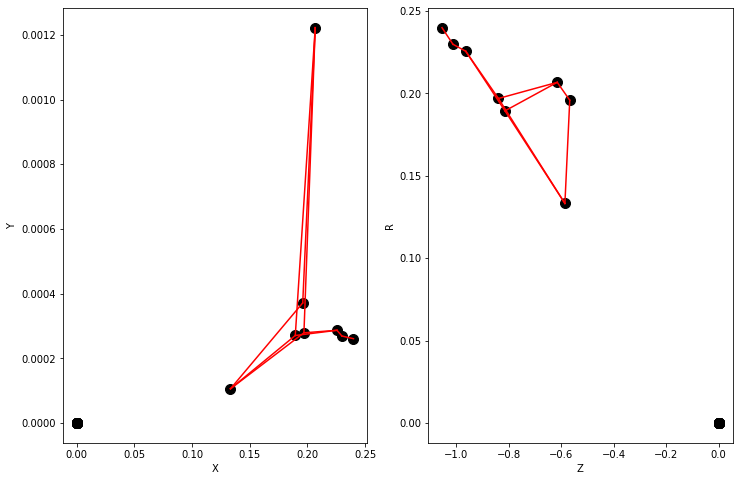

Y = [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.27566725 0.47867548 0.4928744  0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 1.000, recall 0.667


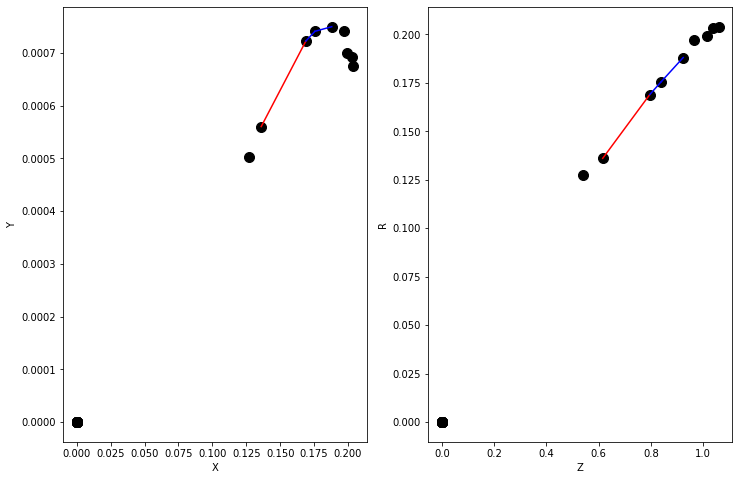

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.39022174 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


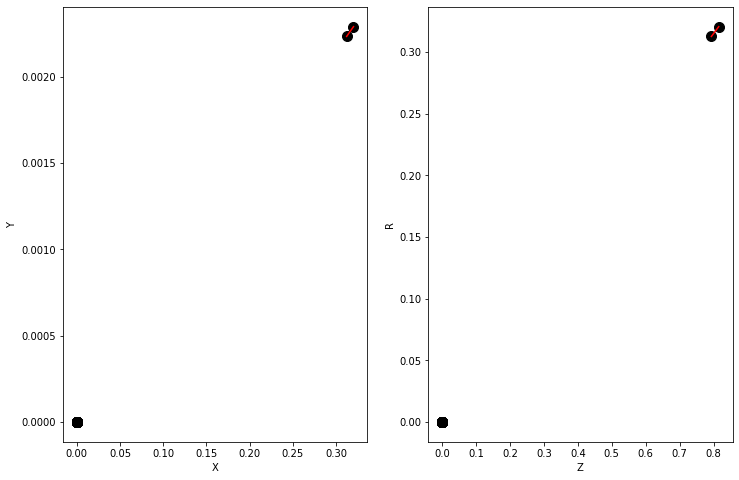

Y = [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.35323152 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


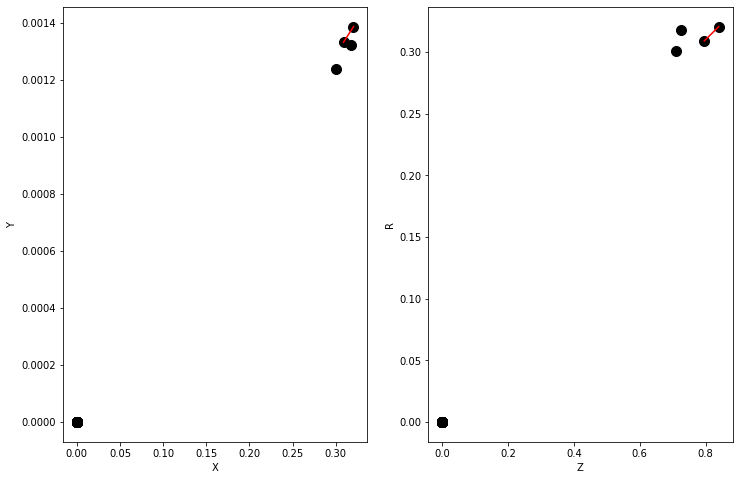

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [1.0272910e-04 9.5457690e-05 9.0713169e-05 9.9441910e-05 8.6453714e-05
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

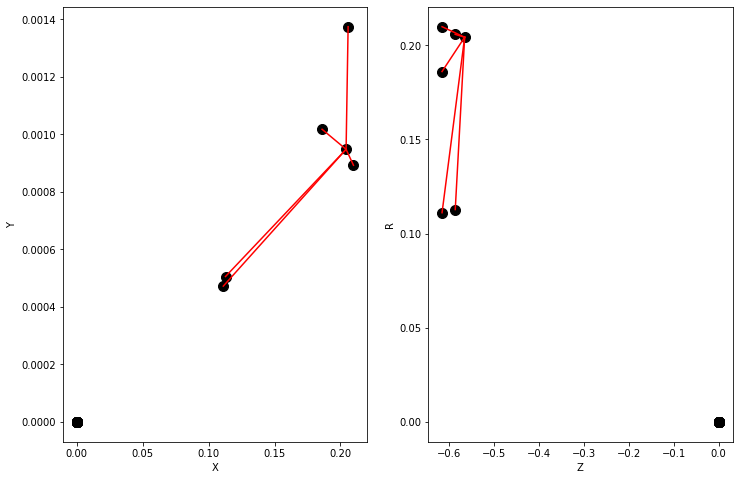

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.18114789 0.02340188 0.276596   0.5836986  0.50577974 0.48762625
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.946, precision 0.000, recall 0.000


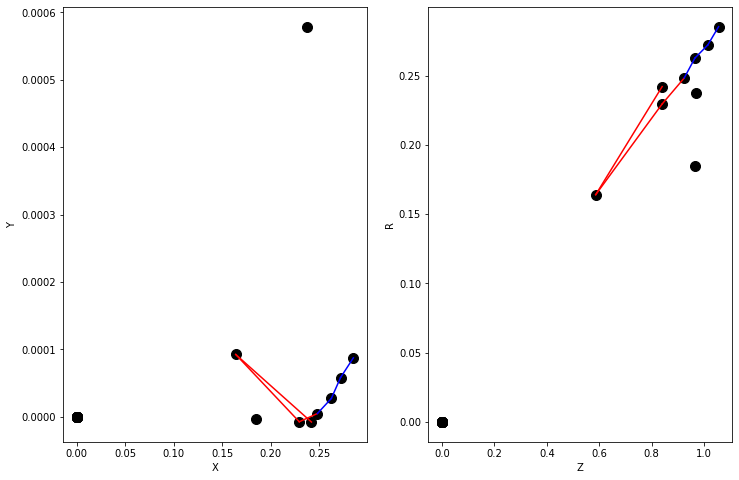

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.113144e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

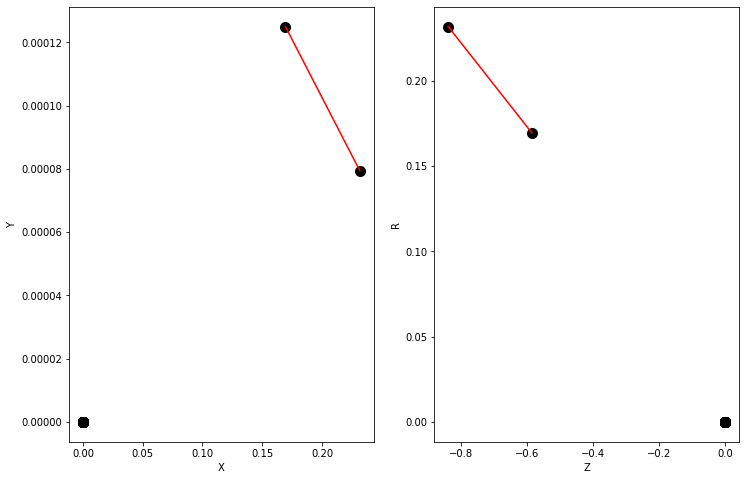

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.1482914  0.14629464 0.39985606 0.436192   0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


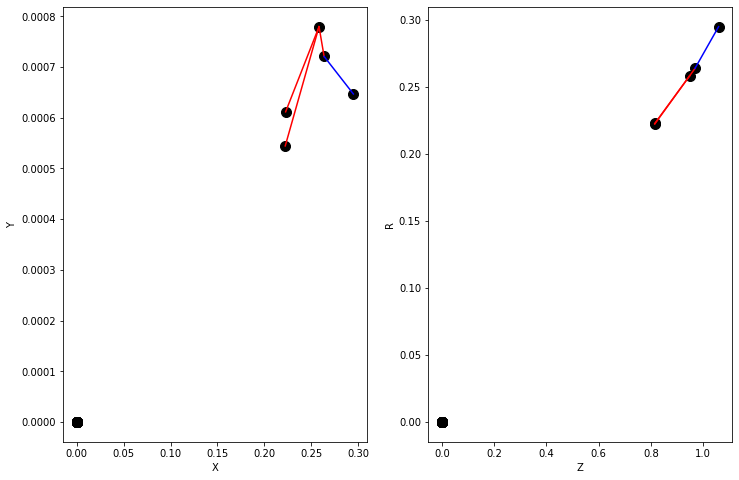

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.4325203e-05 5.3642583e-05 5.7887108e-05 5.7146379e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

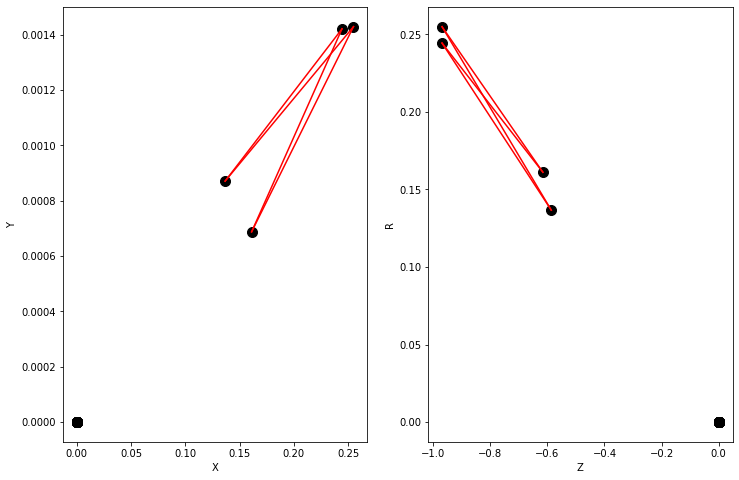

Y = [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.42621285 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 1.000, recall 1.000


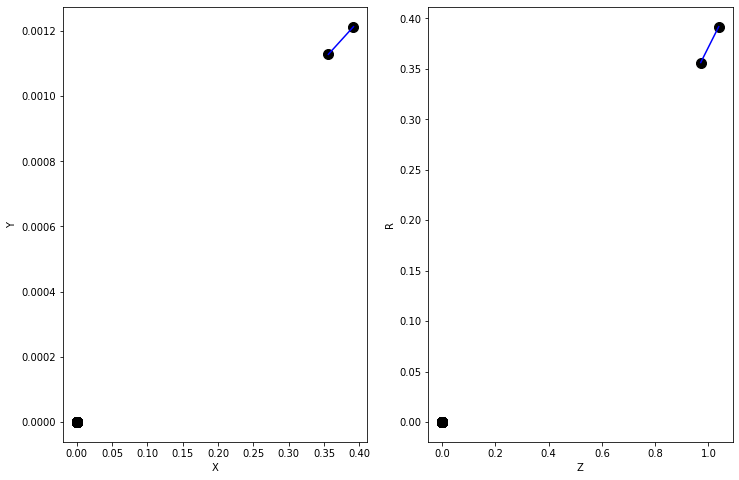

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.22853795 0.3056238  0.50556266 0.41619784 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


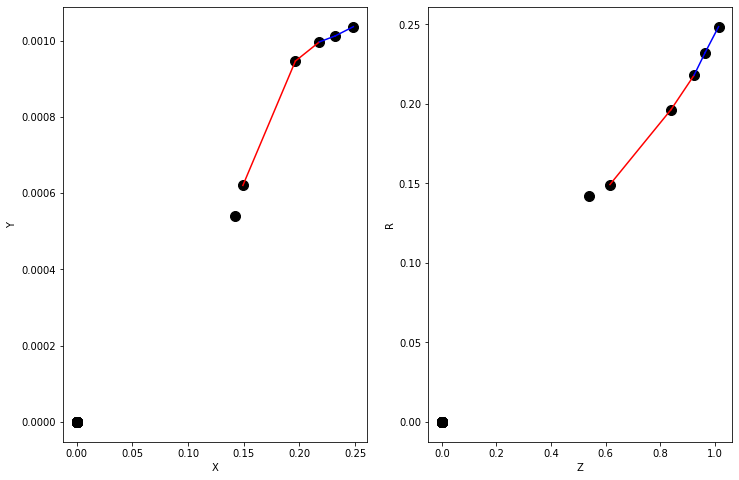

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.03804247 0.03800091 0.05967096 0.05966603 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


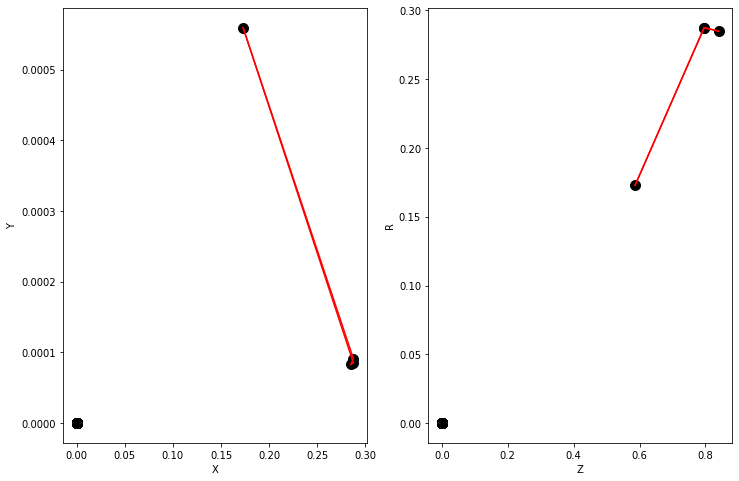

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.3695403e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

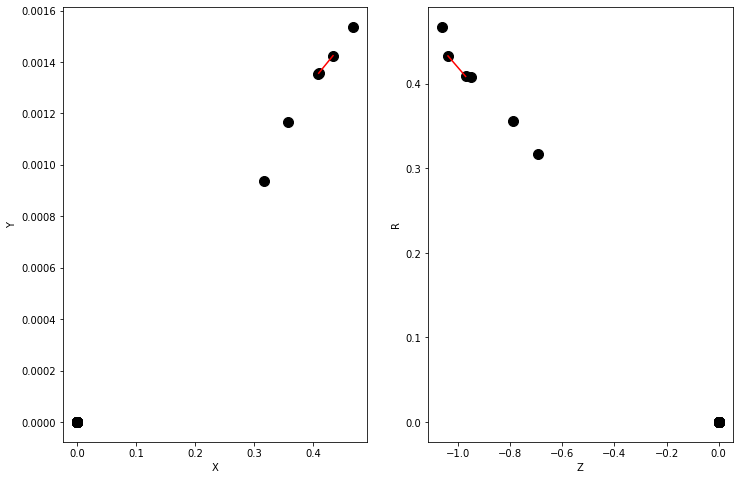

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.1467173  0.35848925 0.44974133 0.4388245  0.397578   0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


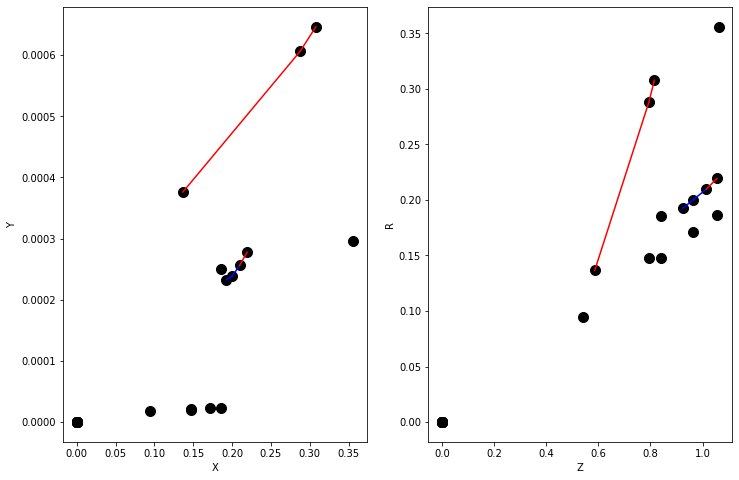

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.05478538 0.05992948 0.06742721 0.05162811 0.05647664 0.06357923
 0.04627461 0.04379864 0.03888553 0.07097679 0.04403232 0.04166562
 0.03694844 0.06787995 0.07178548 0.06825663 0.06103202 0.1072952
 0.05862706 0.05453726 0.04979433 0.07480713 0.217421   0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


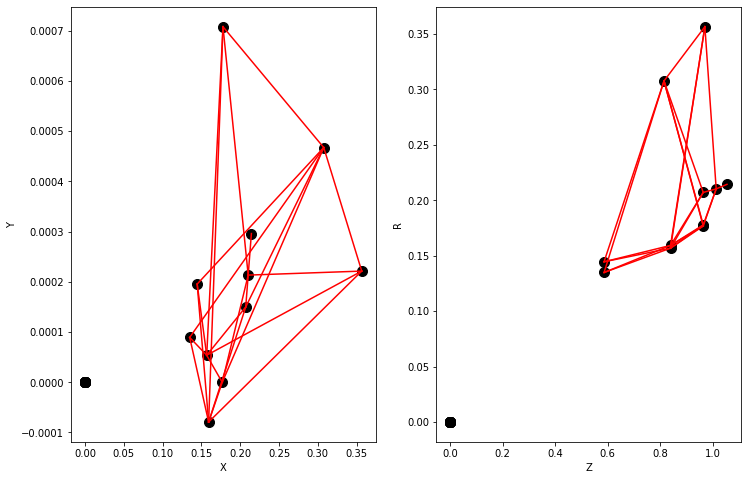

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.03855911 0.03797736 0.04141056 0.04078054 0.04380471 0.04314287
 0.03704203 0.03649867 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


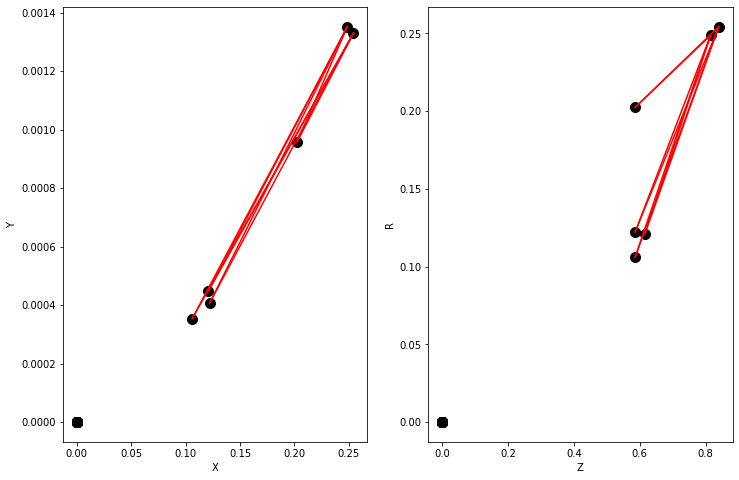

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.01423267 0.01674521 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


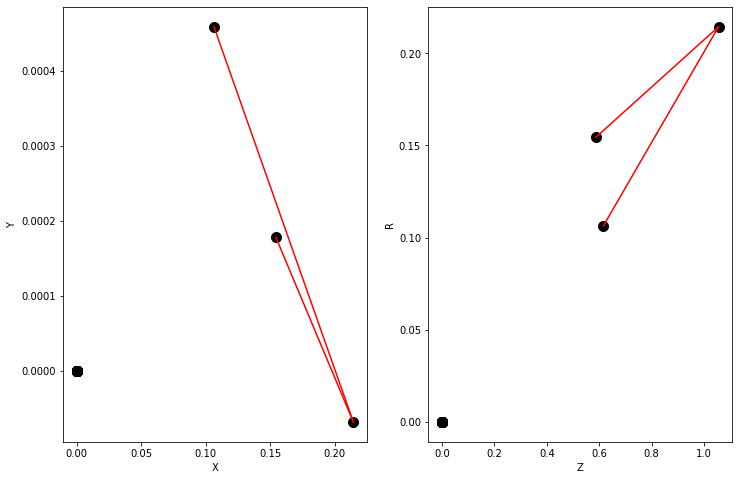

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.365901   0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


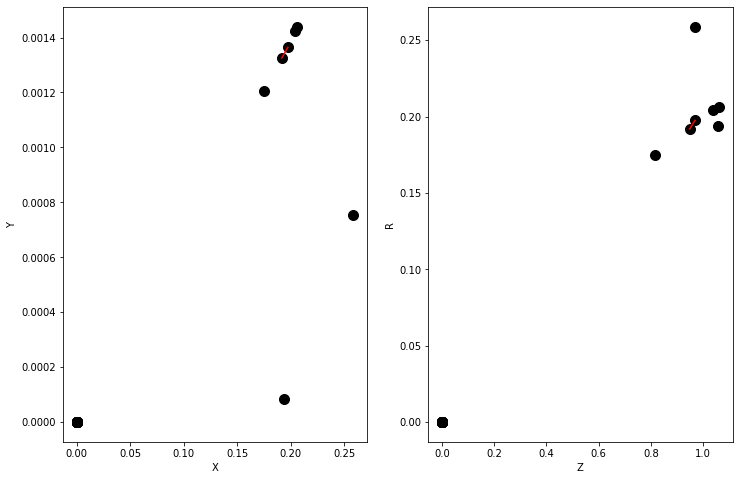

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.4429878e-05 3.6958005e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

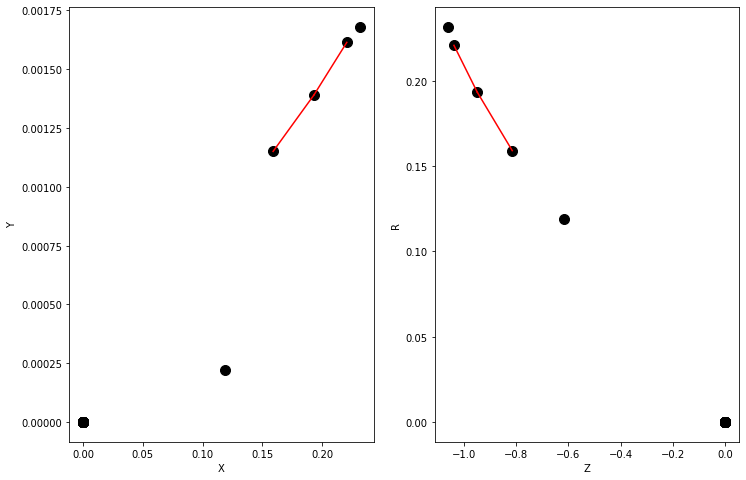

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.48435375 0.36533558 0.24284622 0.34798884 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


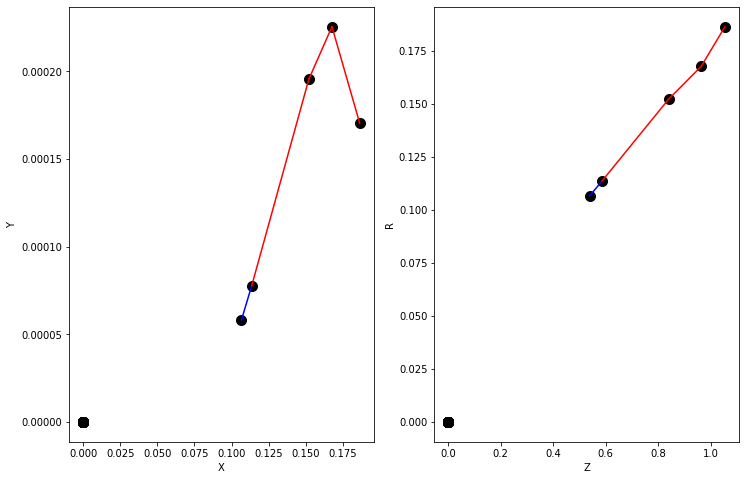

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.8025046e-05 4.6976347e-05 4.7721998e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

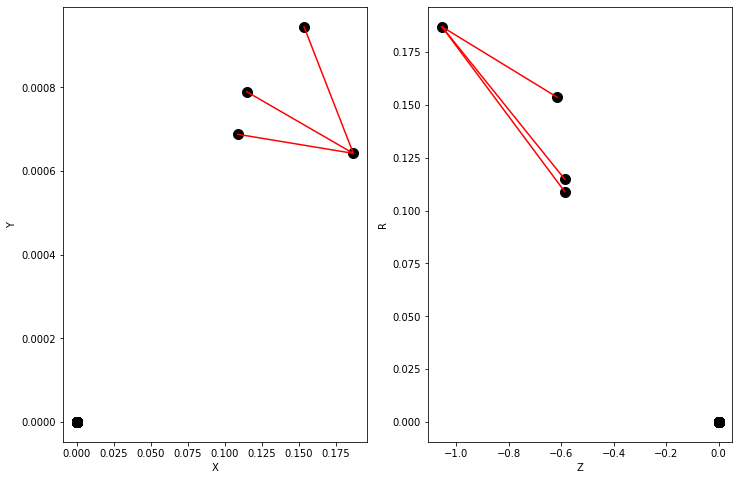

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.31620505 0.4676541  0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


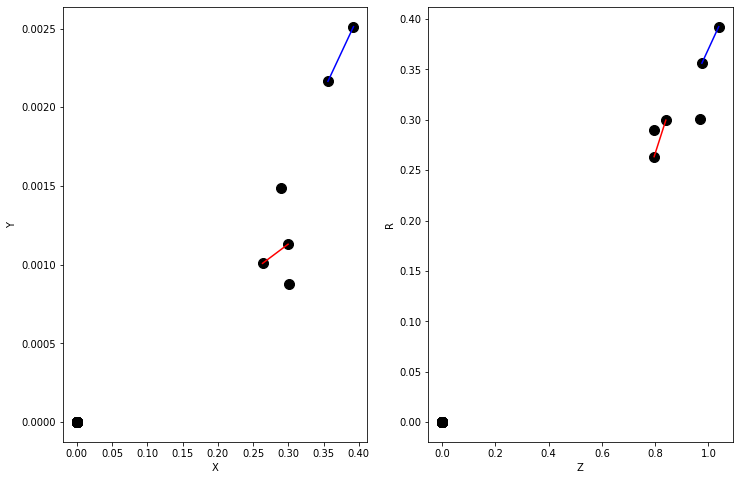

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.42994276 0.24625593 0.2336833  0.21405675 0.2175983  0.29947355
 0.307876   0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


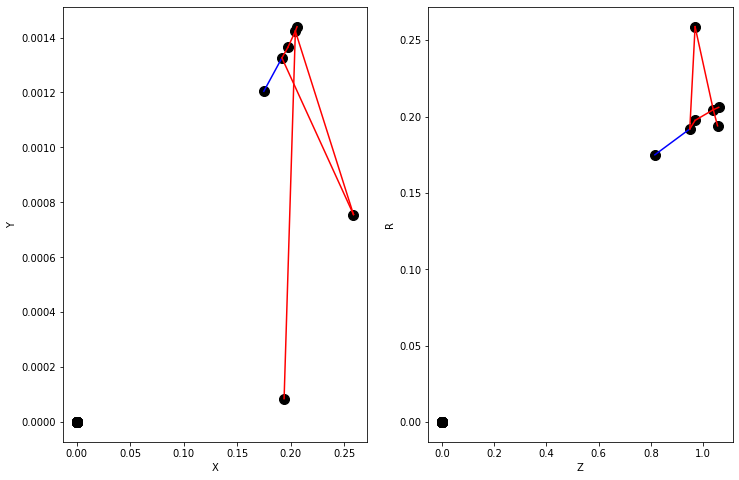

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.8409361e-05 7.1662769e-05 3.9487564e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

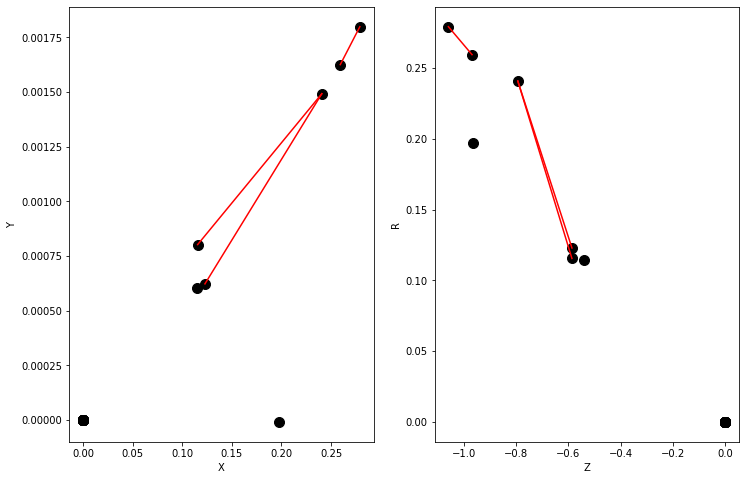

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.229938e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

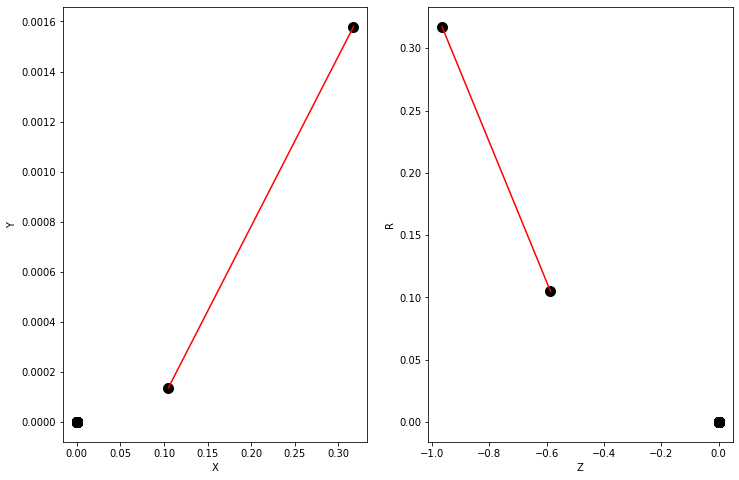

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.874668e-05 6.244566e-05 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

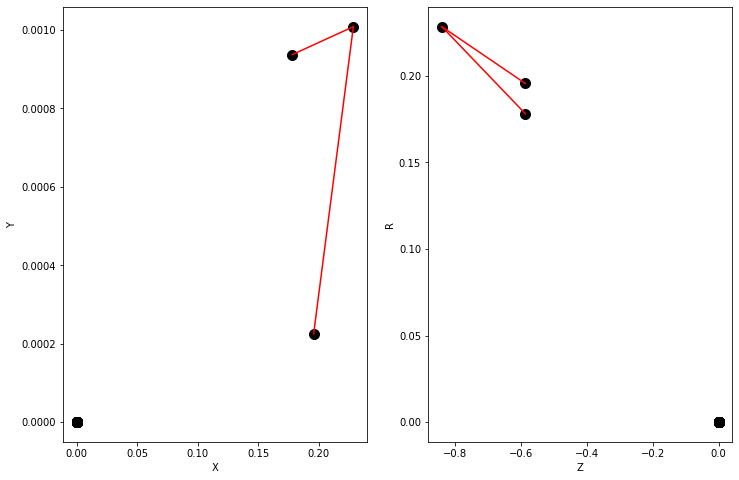

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.35605884 0.33071348 0.16935885 0.22682607 0.18044046 0.24342227
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


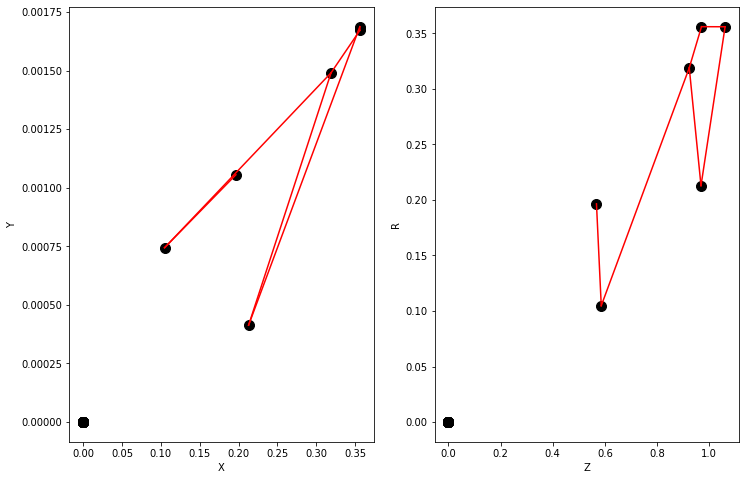

Y = [1. 0. 1. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.2785262  0.26966408 0.3546258  0.33898166 0.5194016  0.48551586
 0.49279553 0.48804027 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 1.000, recall 0.667


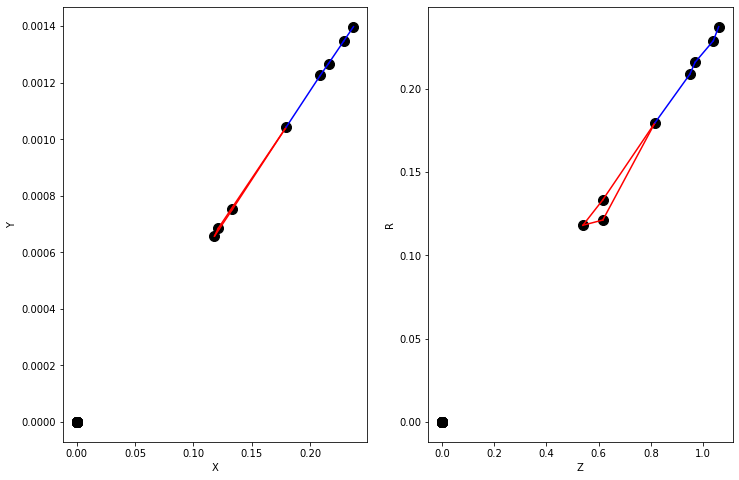

Y = [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.26355577 0.23935984 0.44849005 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 1.000, recall 0.333


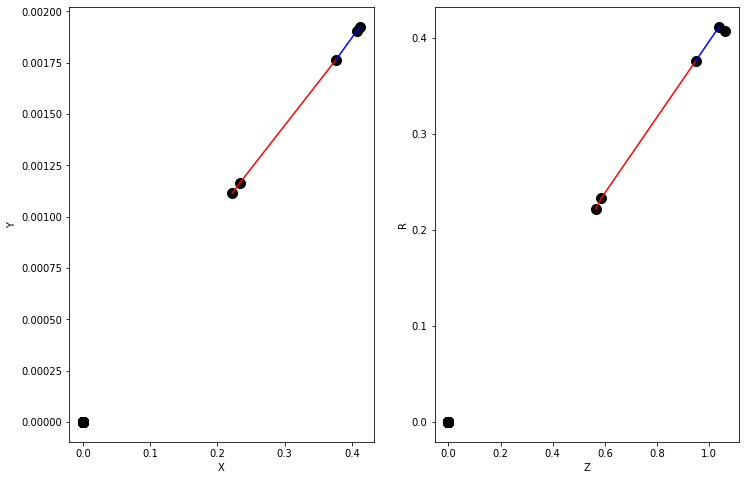

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.7891801e-05 5.3817257e-05 5.3183809e-05 5.3136358e-05 4.0531719e-05
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

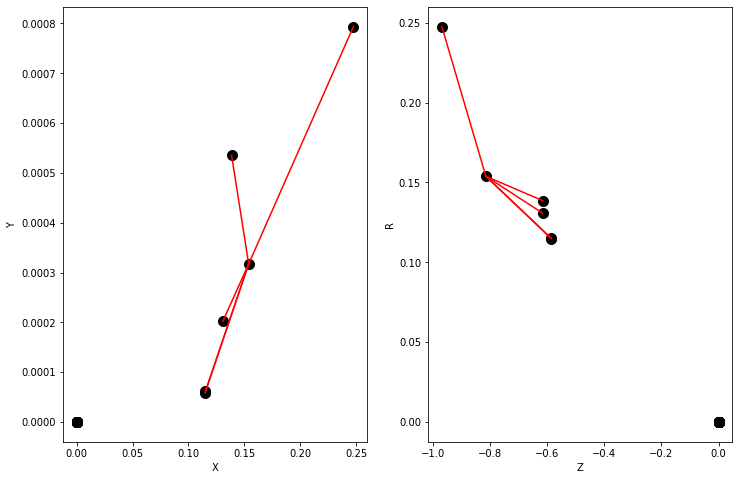

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.7701797e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

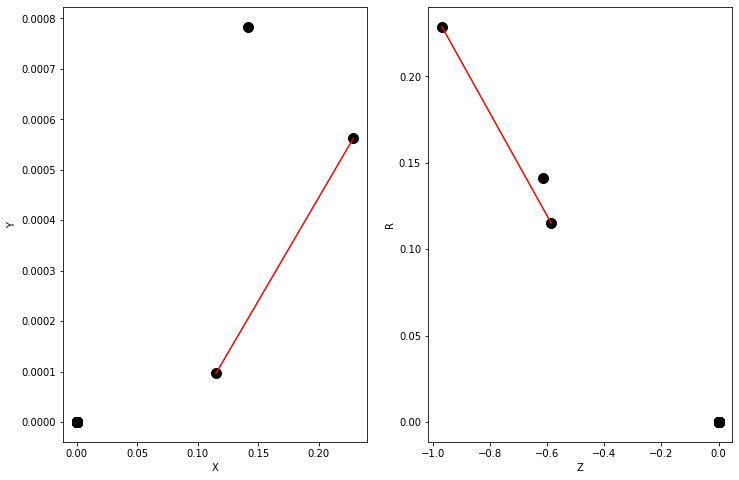

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.1116778e-05 5.6746259e-05 5.7995461e-05 3.7880942e-05 3.6112924e-05
 3.4943117e-05 3.4432804e-05 3.2163029e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

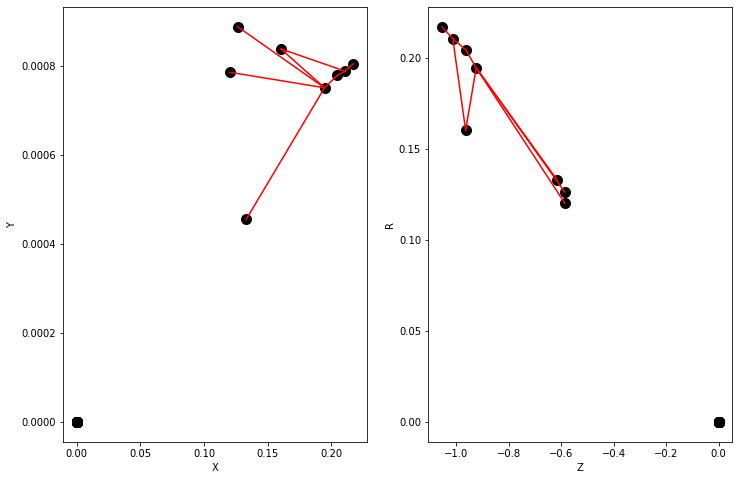

Y = [1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.6021783  0.7172757  0.7527203  0.7032707  0.5931347  0.539777
 0.53084636 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 1.000, recall 1.000


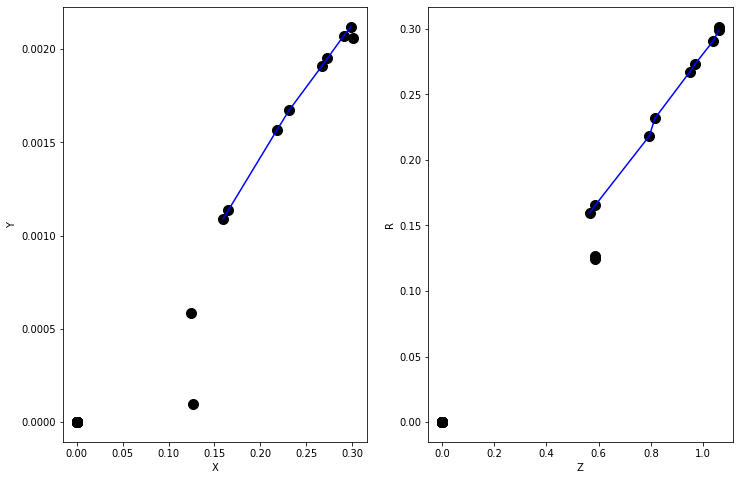

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.03900728 0.04058747 0.14273448 0.41691452 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


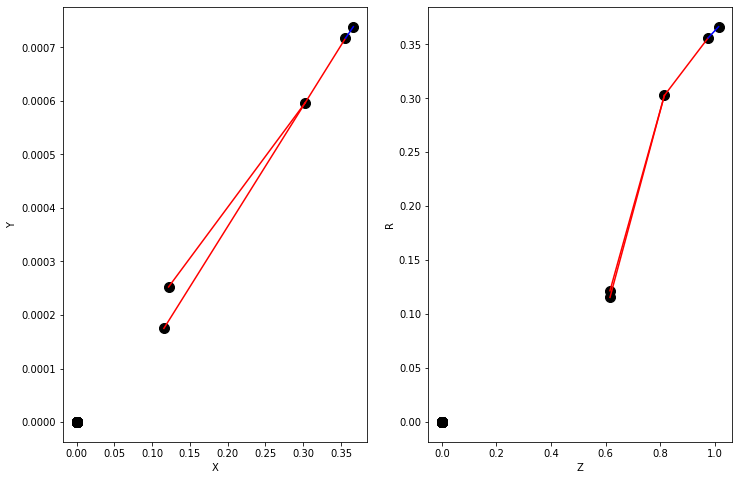

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.2294690e-05 5.3355965e-05 5.1163010e-05 5.7262463e-05 3.7254289e-05
 3.4251010e-05 3.1587977e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

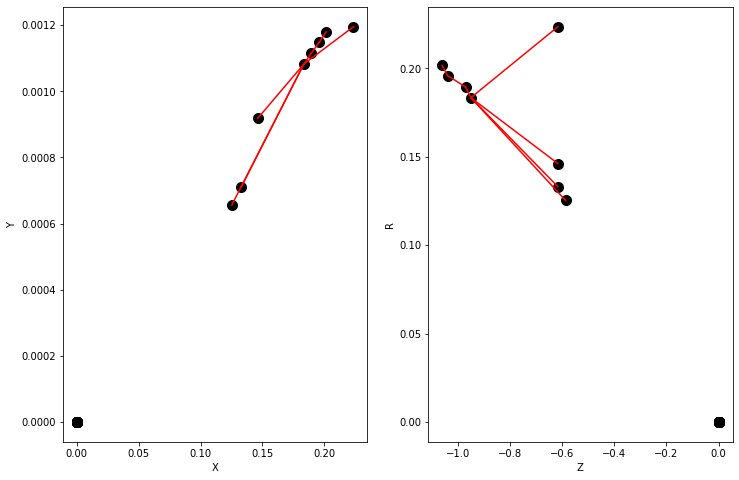

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.02638189 0.03250897 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


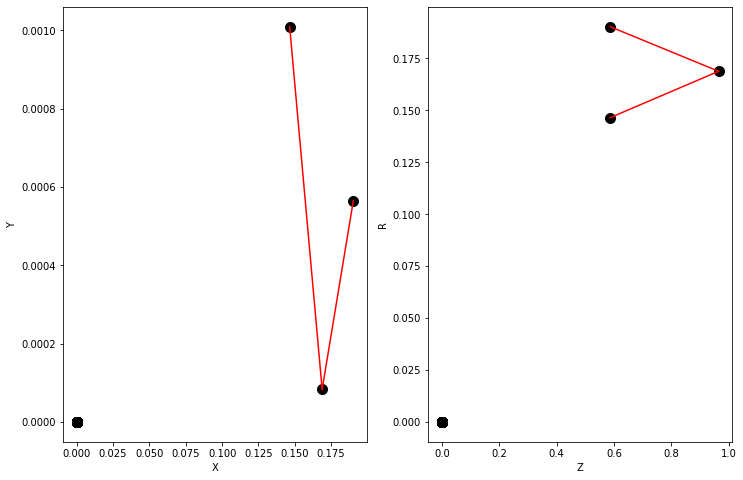

Y = [1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.6579537  0.5718094  0.6338334  0.49800065 0.35917616 0.36430103
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 1.000, recall 0.667


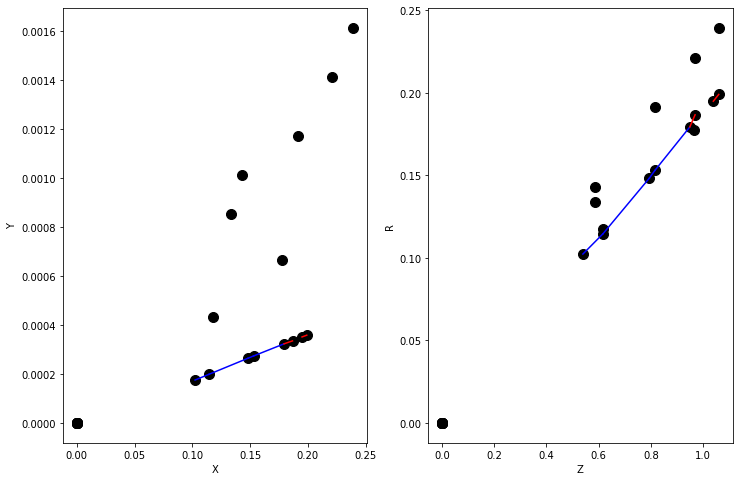

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.995858e-05 6.606997e-05 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

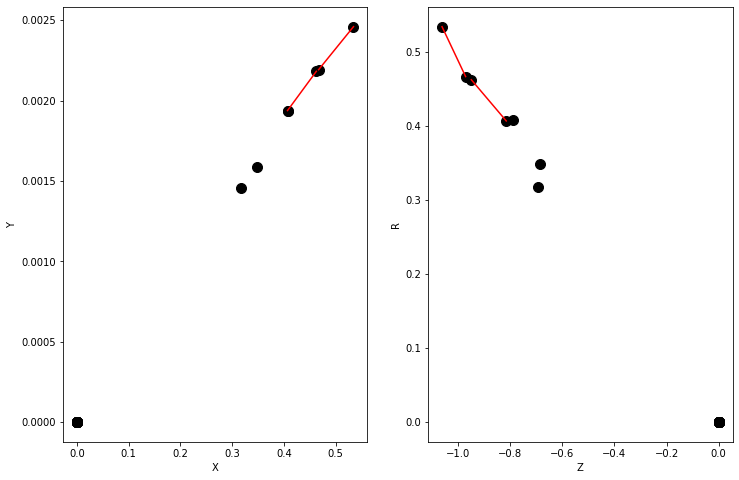

Y = [1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.5040766  0.33321252 0.31197733 0.43989456 0.45796666 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 1.000, recall 0.600


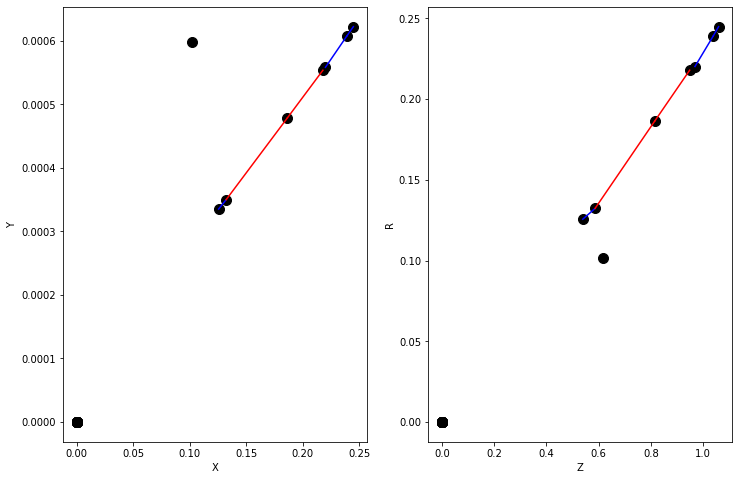

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.8182526e-05 6.8158013e-05 5.3761803e-05 5.6250854e-05 4.0143586e-05
 3.4288365e-05 3.4675100e-05 3.1884694e-05 3.2862583e-05 2.9530609e-05
 2.9923780e-05 2.9907318e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

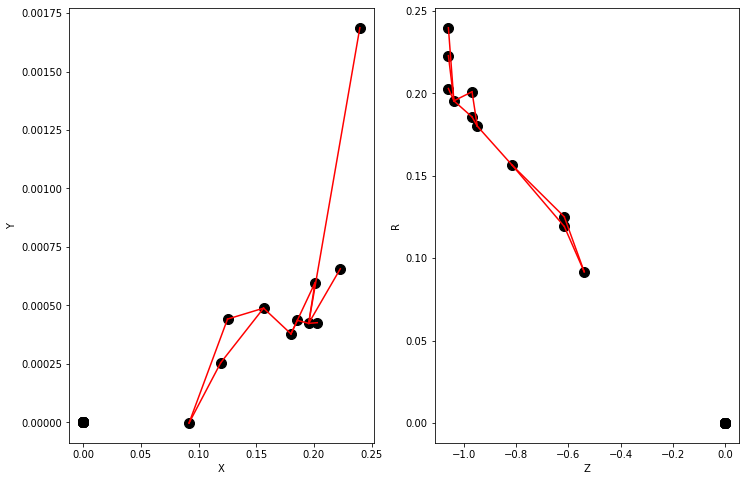

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.590411e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

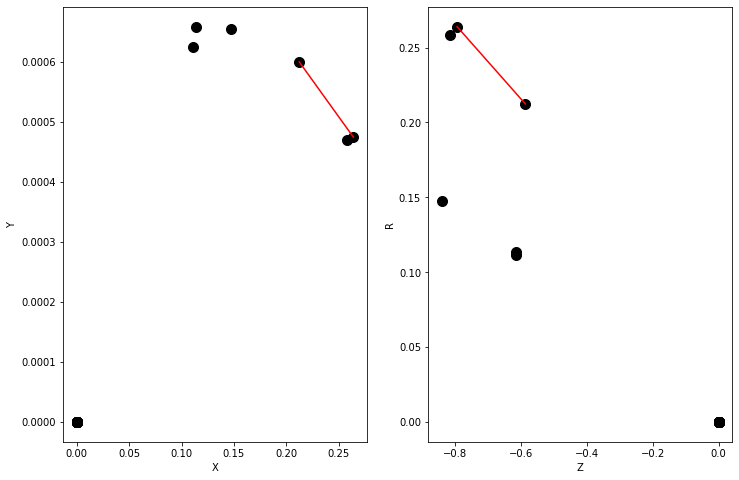

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.4648059  0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


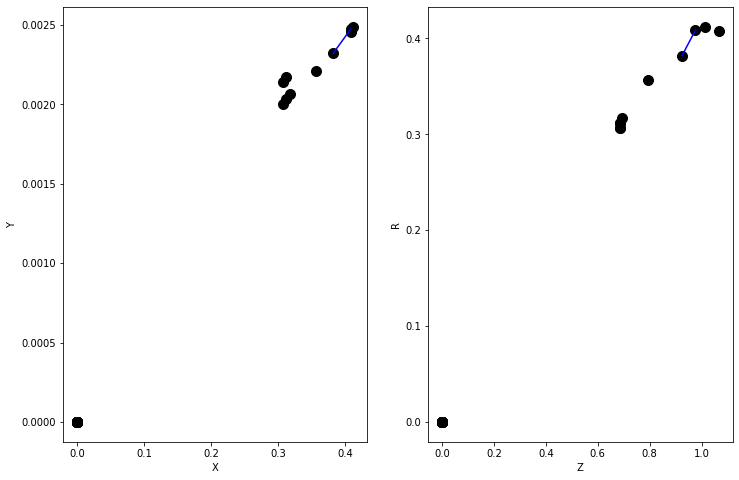

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.05421156 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


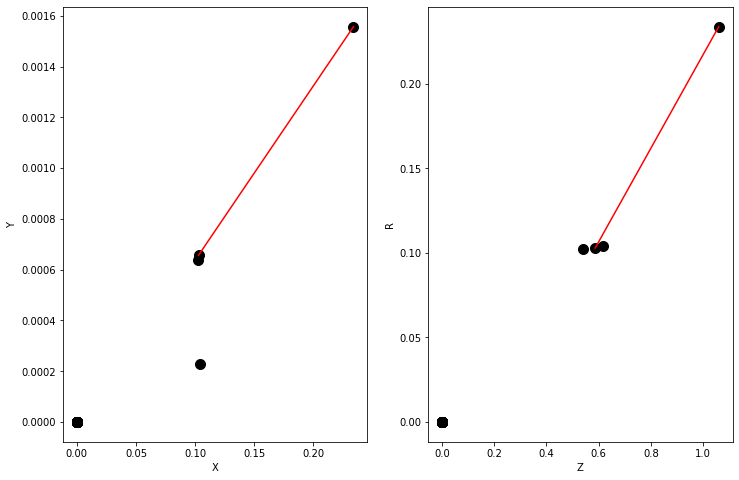

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.03503606 0.03476106 0.03487444 0.03461132 0.02962006 0.3665116
 0.38441312 0.45601764 0.46343493 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


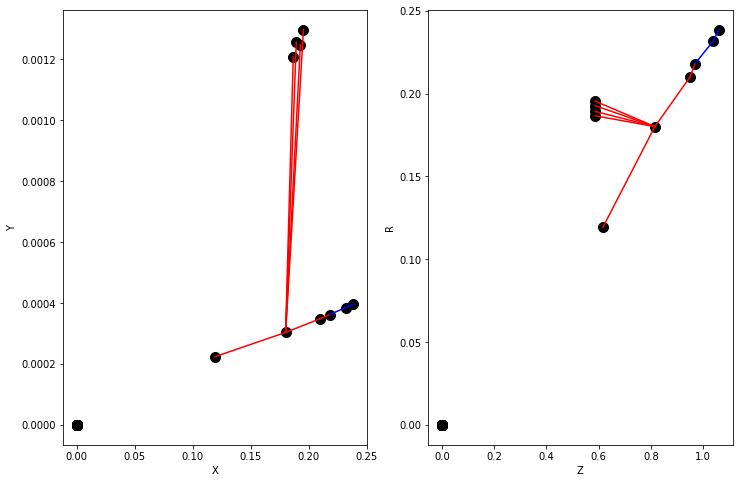

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.5804667e-05 4.2383163e-05 3.8492872e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

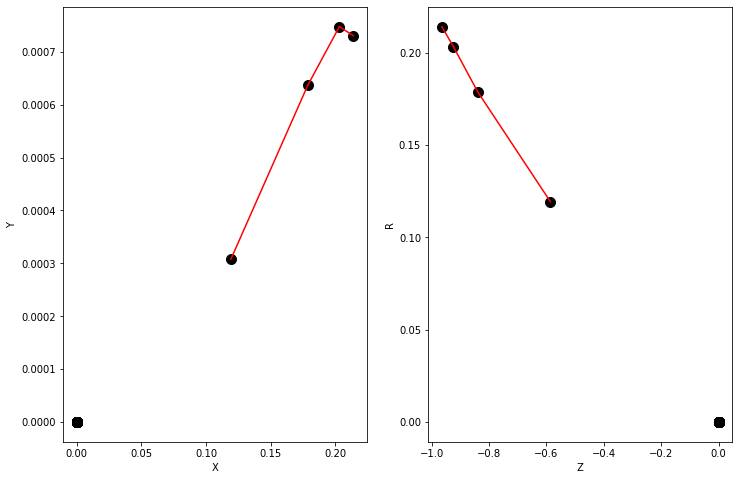

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.02419981 0.02545937 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


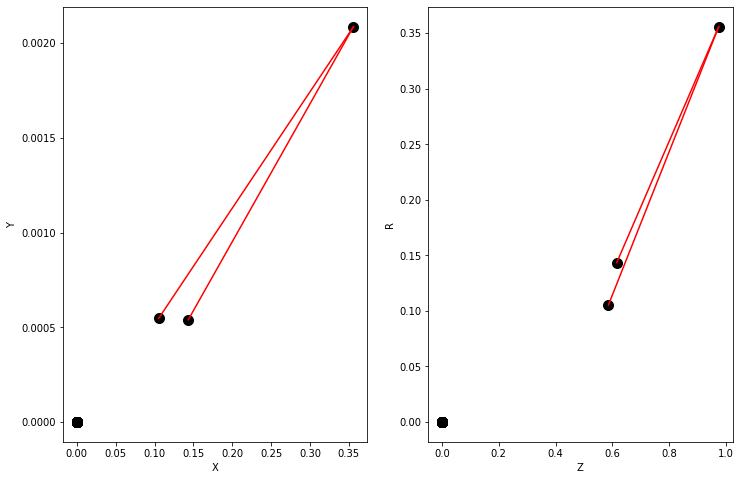

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.26238254 0.34361678 0.6181354  0.53021175 0.55565447 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.946, precision 0.000, recall 0.000


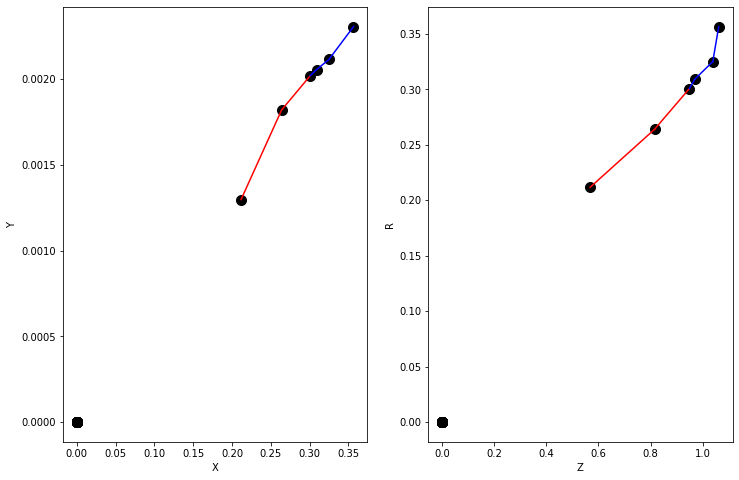

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.4123156e-05 5.7892685e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

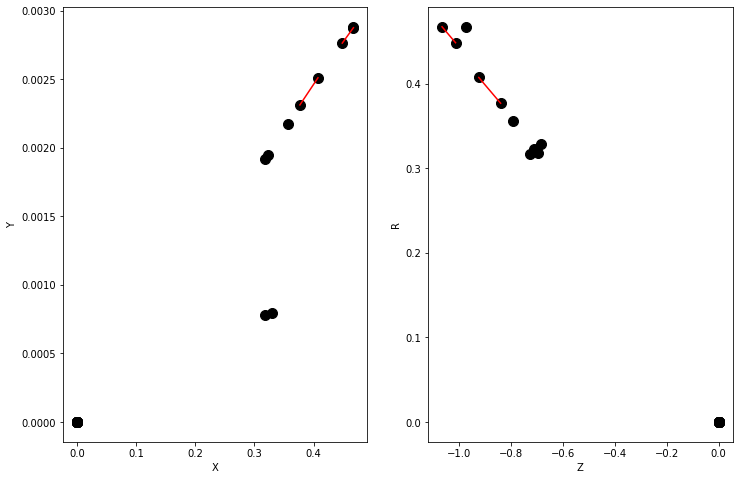

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.6160879e-05 5.4467495e-05 4.6485700e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

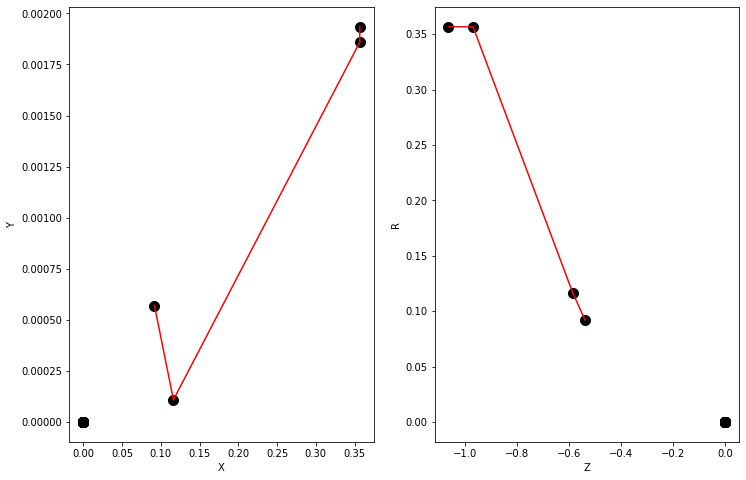

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.7361060e-05 5.6058820e-05 5.0518582e-05 4.9659666e-05 4.6346933e-05
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

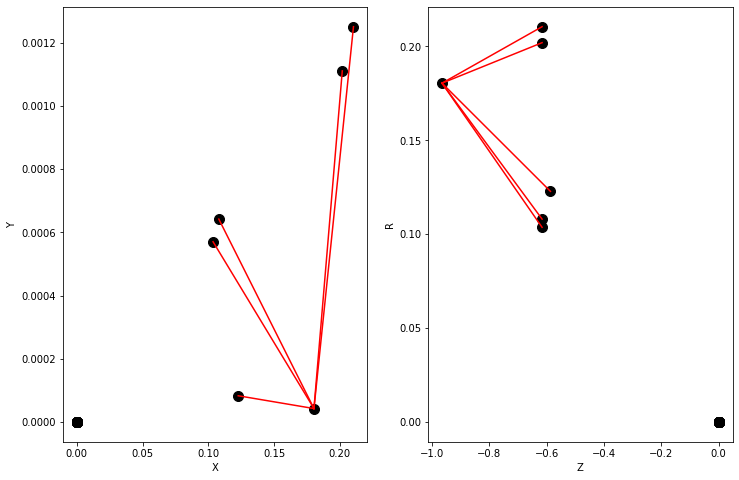

Y = [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.2049274  0.20018488 0.04678686 0.2832588  0.28053352 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


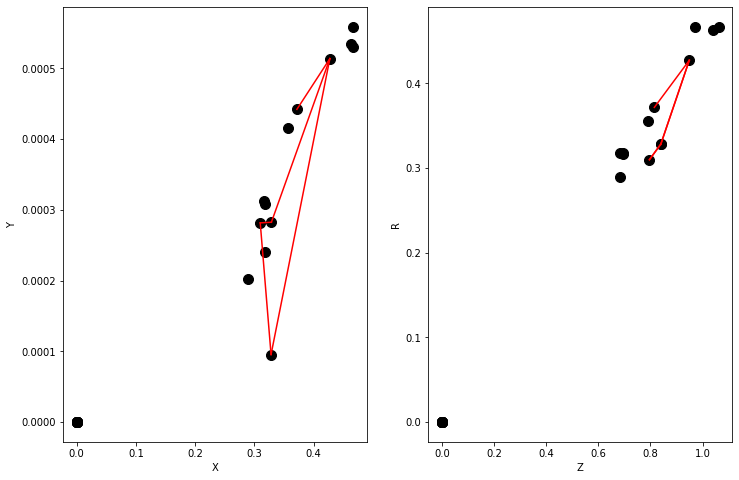

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.8482182e-05 8.1754974e-05 8.1520804e-05 4.9470553e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

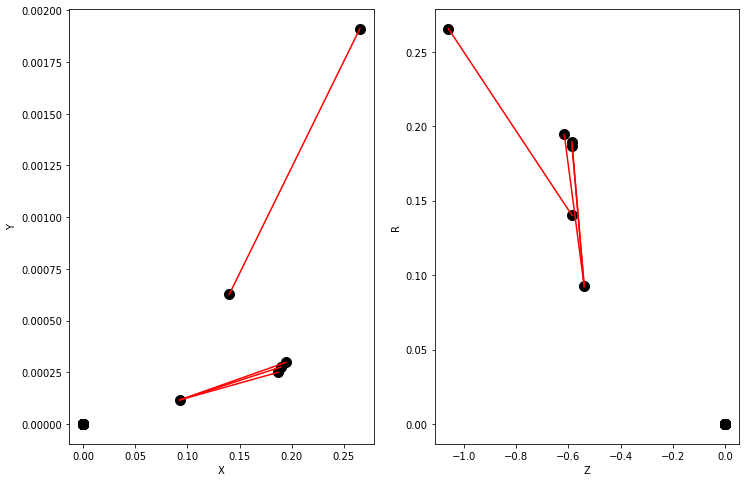

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.6887297e-05 5.8101024e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

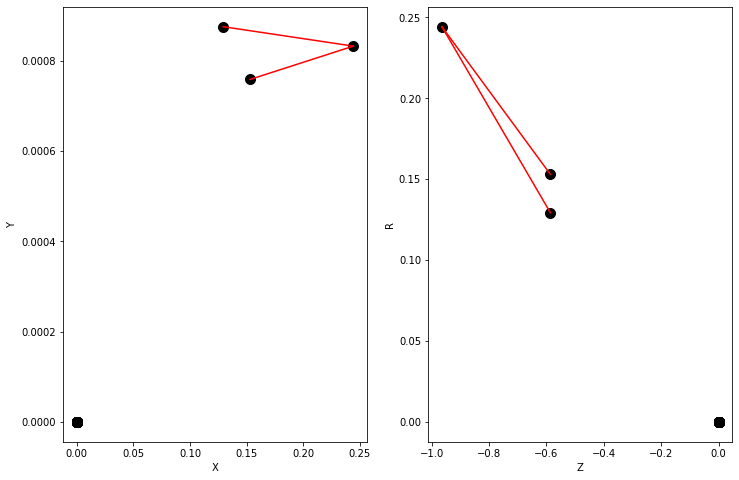

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.04707117 0.04709227 0.01325354 0.02107793 0.00979298 0.02705831
 0.01323174 0.02104547 0.00977802 0.02701521 0.03689671 0.04259582
 0.04262248 0.23579608 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


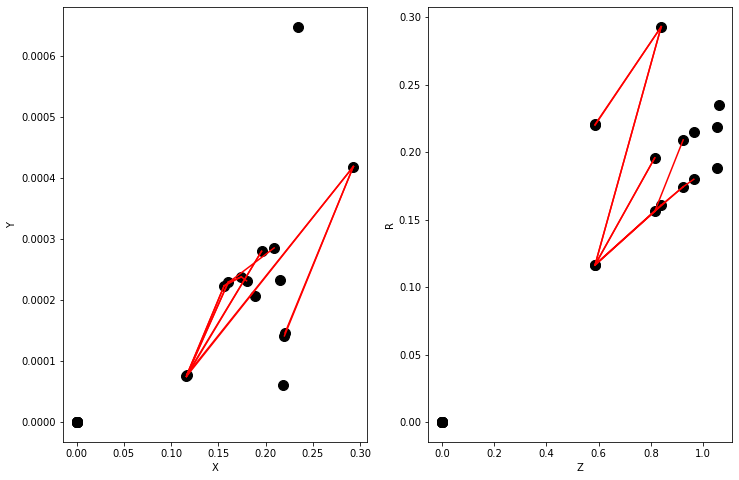

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.4677843e-05 3.9610964e-05 3.5040961e-05 3.0937117e-05 3.2654527e-05
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

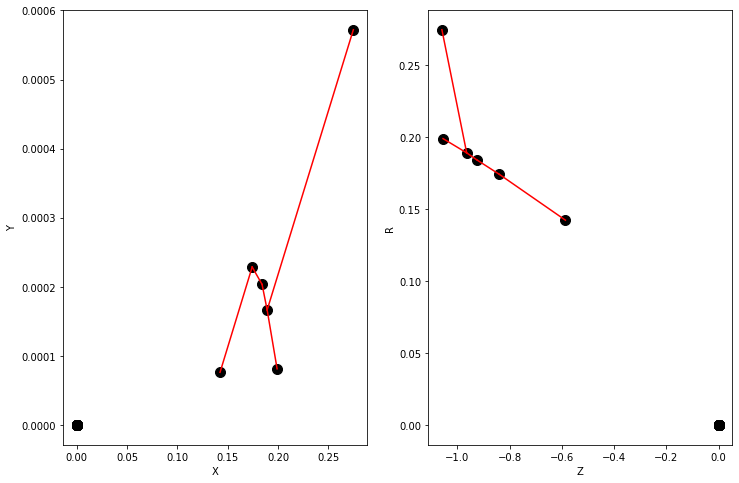

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.04359708 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


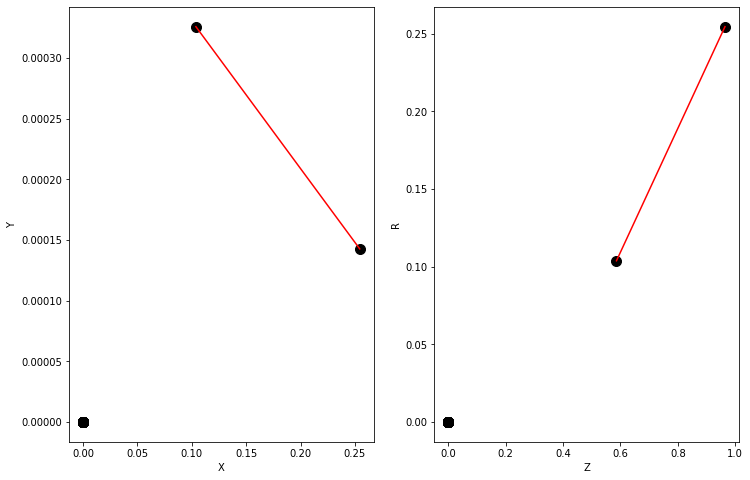

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.07178275 0.08104843 0.1943325  0.21448097 0.22453986 0.2649297
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


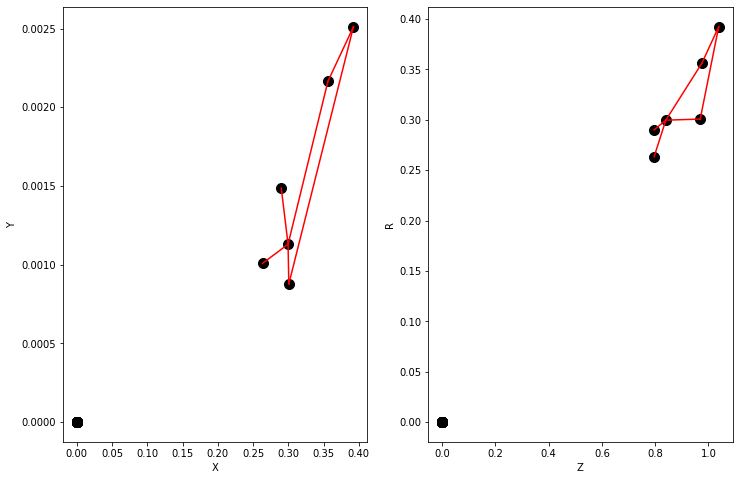

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.7103837e-05 3.4458790e-05 3.1819083e-05 2.9699100e-05 2.9498608e-05
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

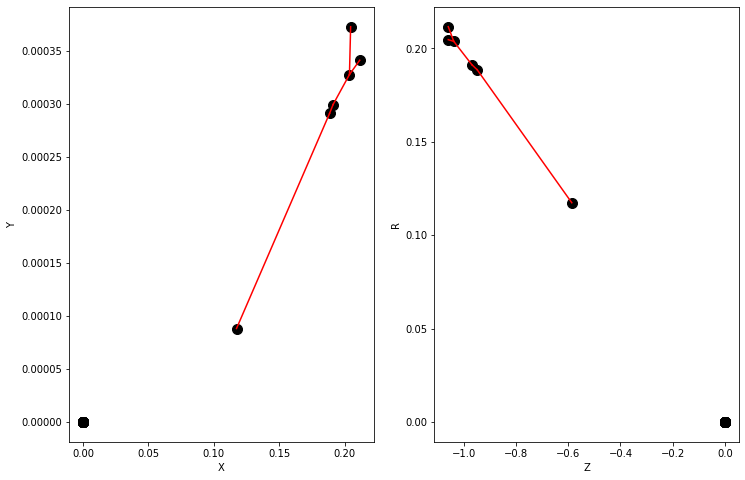

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.425303e-05 4.503068e-05 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

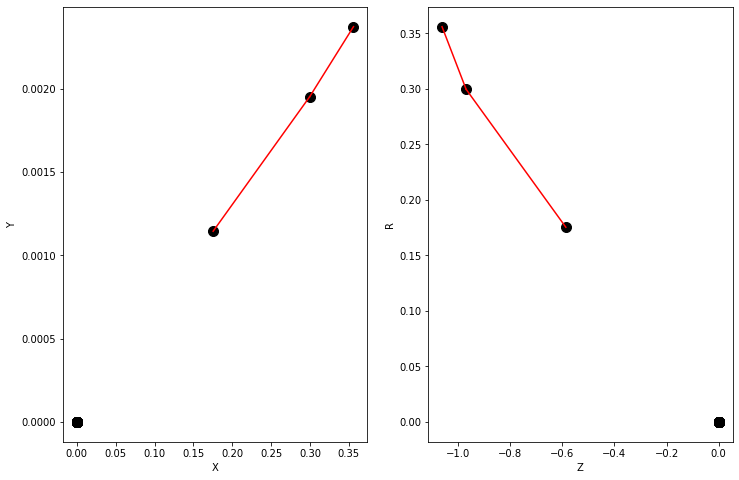

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.04695751 0.0448091  0.12895867 0.47418624 0.50140405 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


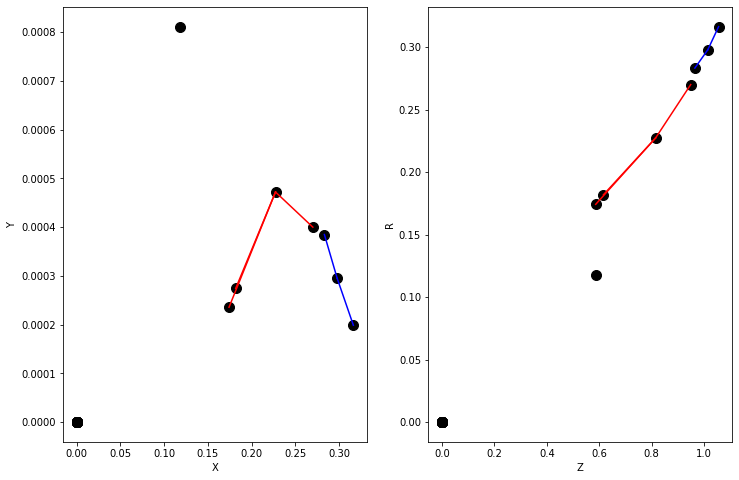

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.1779243e-05 7.4570591e-05 8.0627549e-05 7.6238015e-05 4.9218943e-05
 5.0838706e-05 4.6011981e-05 4.6308014e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

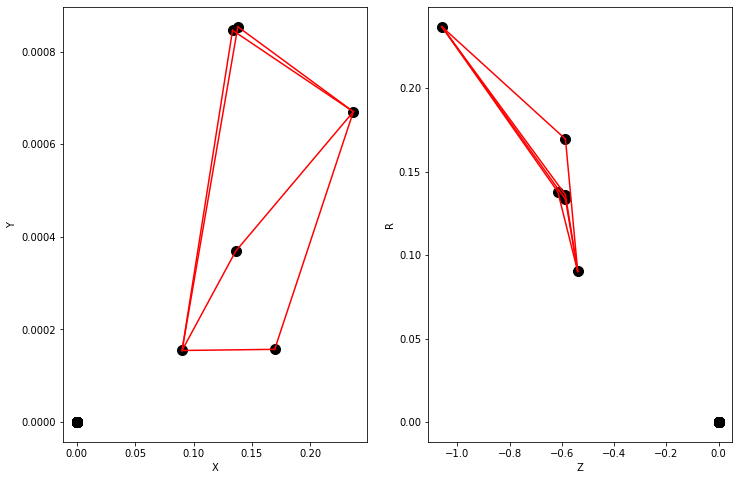

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.9004509e-05 7.7112272e-05 3.1239186e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

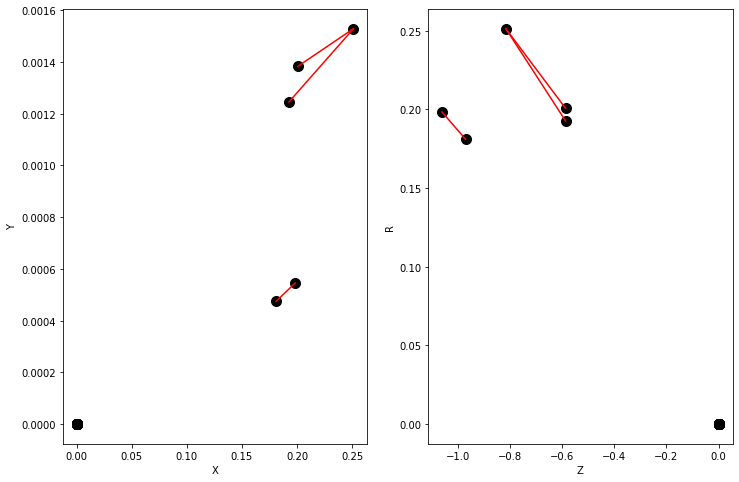

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.06847574 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


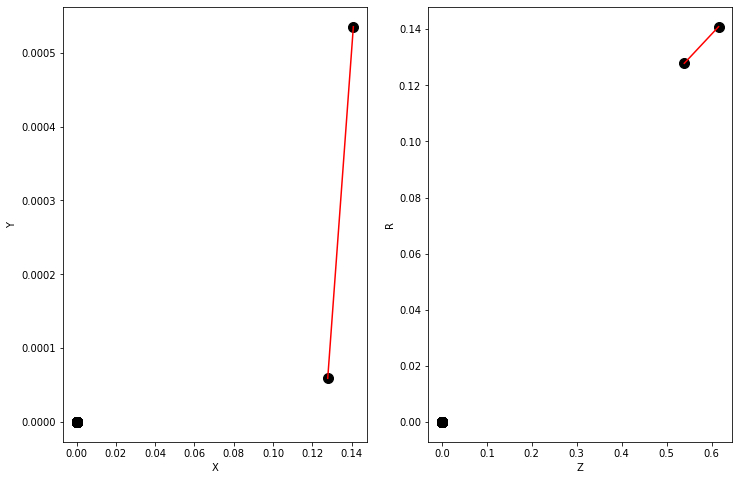

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.606295e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

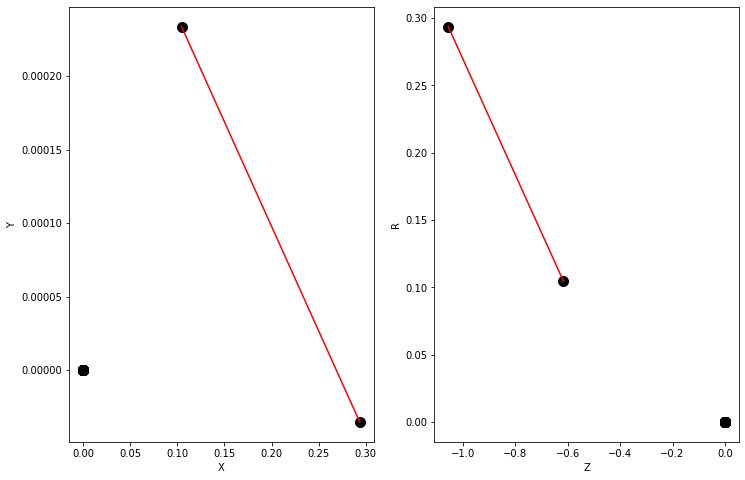

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.04840597 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


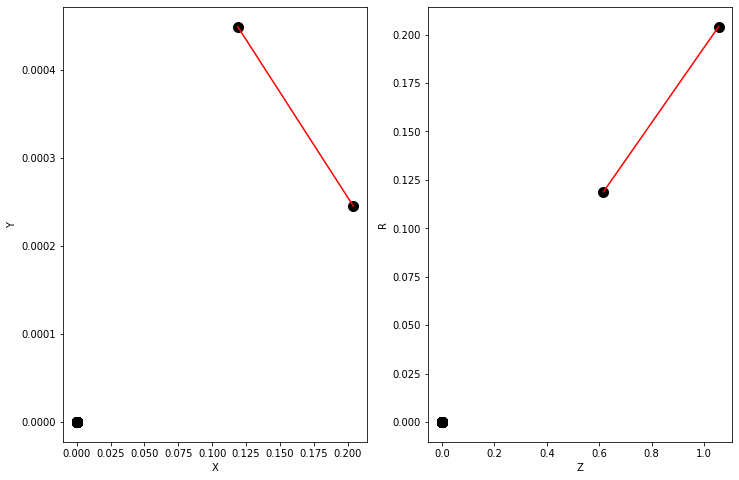

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.14865775 0.11870096 0.11203565 0.11770906 0.07399207 0.06212609
 0.23926558 0.23140942 0.19325814 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


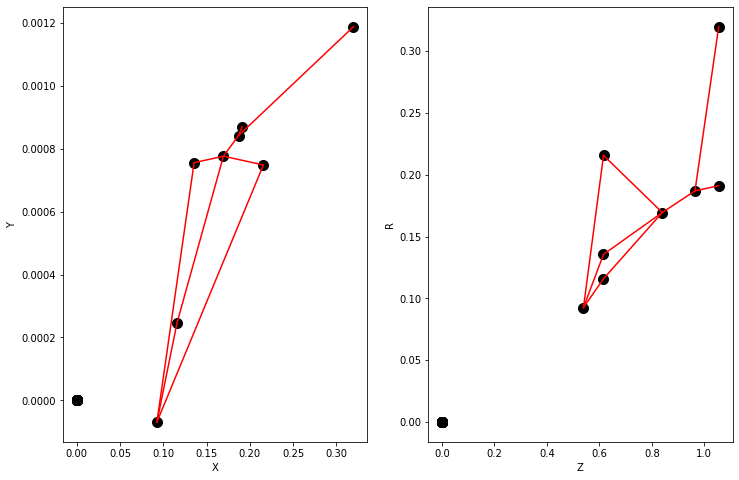

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [9.3773968e-05 5.1612966e-05 5.9058209e-05 6.2974301e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

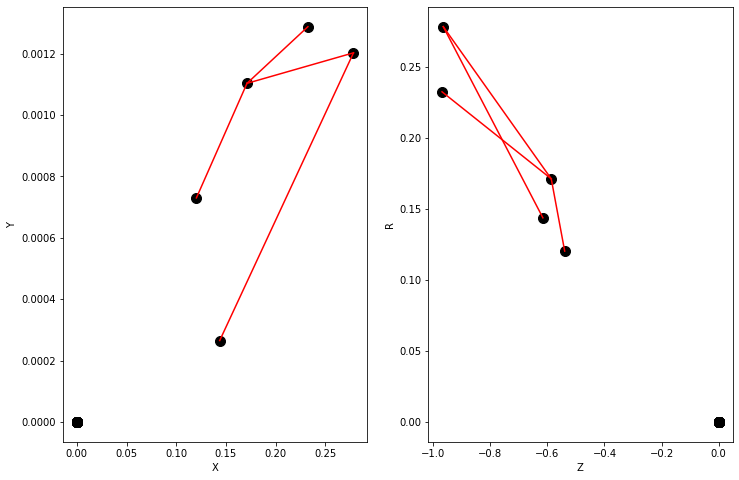

Y = [1. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.
 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.1182227  0.12772982 0.12803556 0.12853138 0.13873701 0.13905743
 0.03998448 0.03713875 0.04983257 0.04646632 0.05198868 0.04851887
 0.20971824 0.229339   0.18106857 0.1974494  0.16609128 0.16792415
 0.14632638 0.14864592 0.15036348 0.14026684 0.17306828 0.16268846
 0.30481276 0.26568022 0.27682585 0.3125678  0.31434163 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.893, precision 0.000, recall 0.000


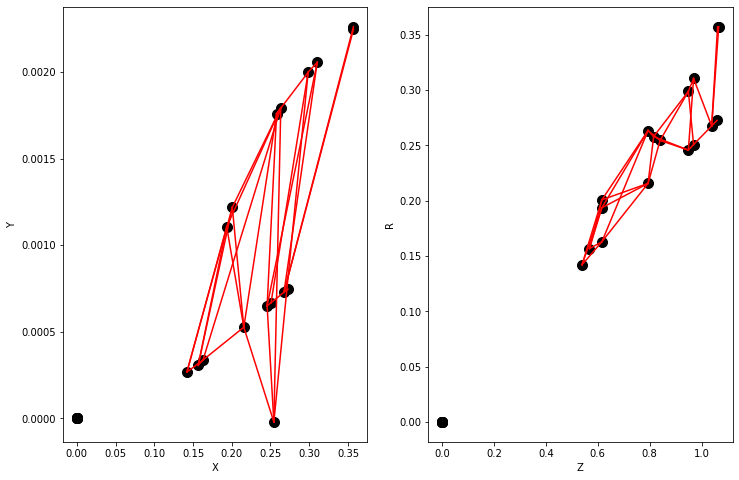

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.0468143  0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


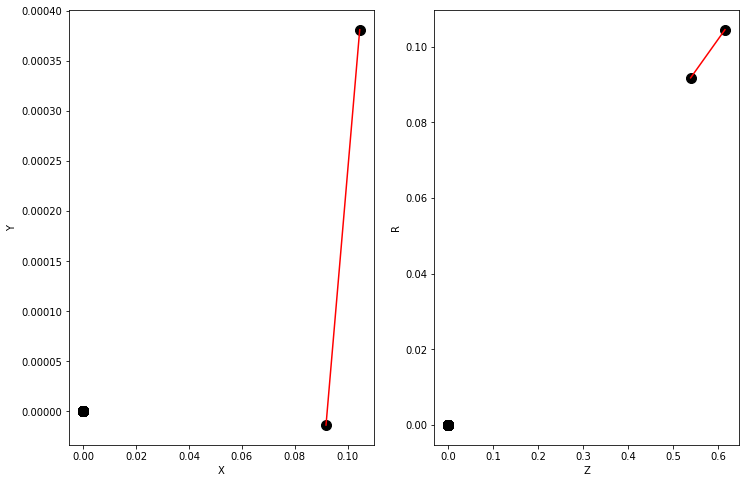

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.03172773 0.02316018 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


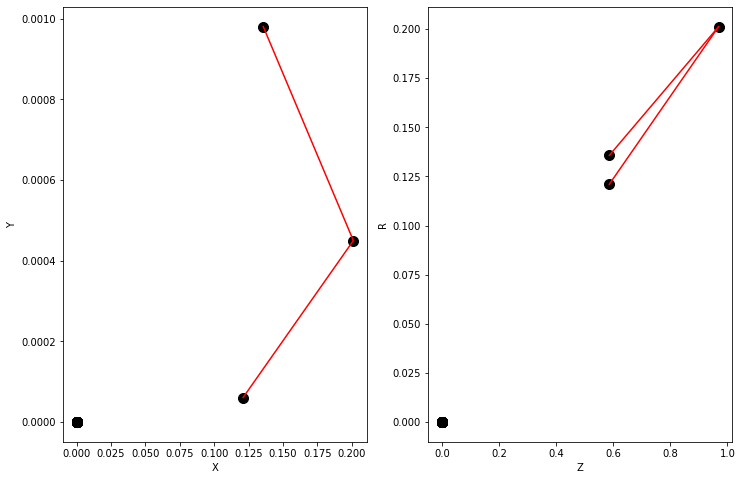

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.181635e-05 5.118497e-05 3.786256e-05 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

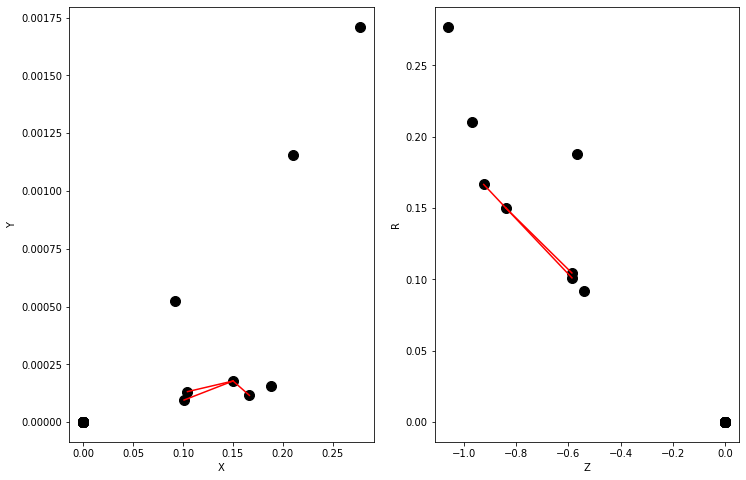

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.2477586e-05 5.7582034e-05 4.1810581e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

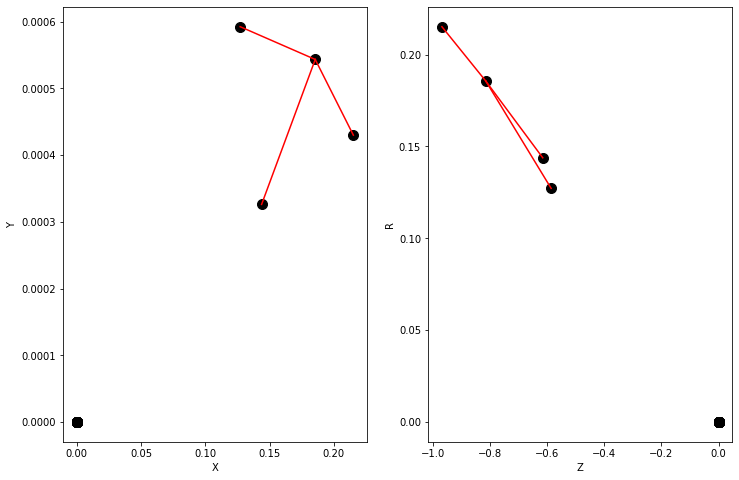

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.8410409e-05 6.3870546e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

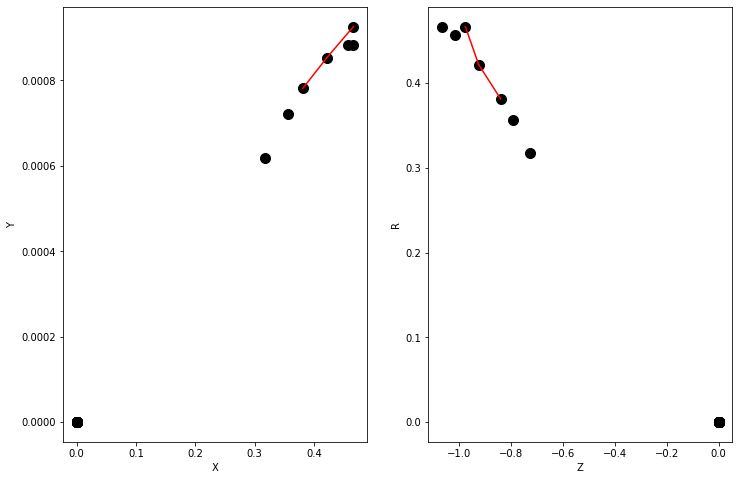

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [3.2942877e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

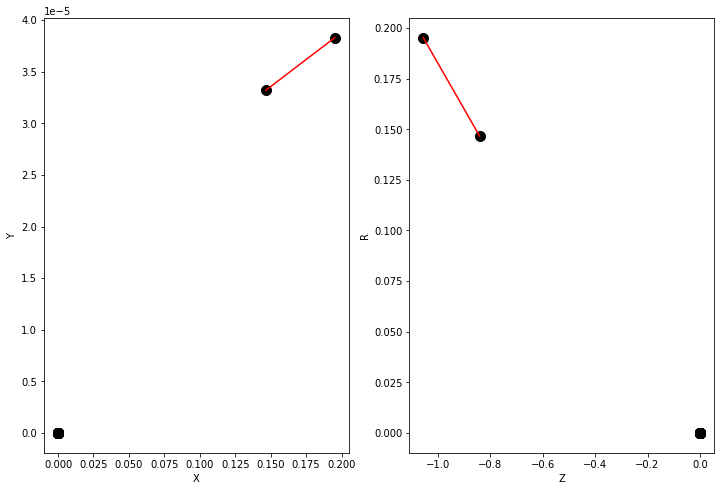

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.49911025 0.2740792  0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


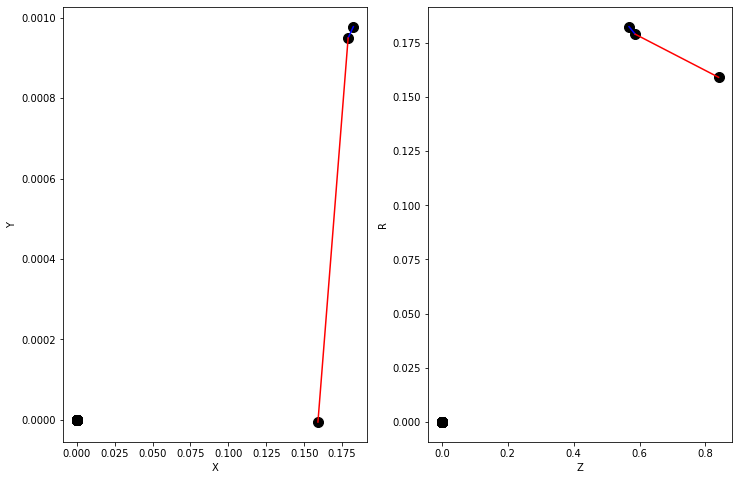

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.01974859 0.02460333 0.02596302 0.02394383 0.02257397 0.12865742
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


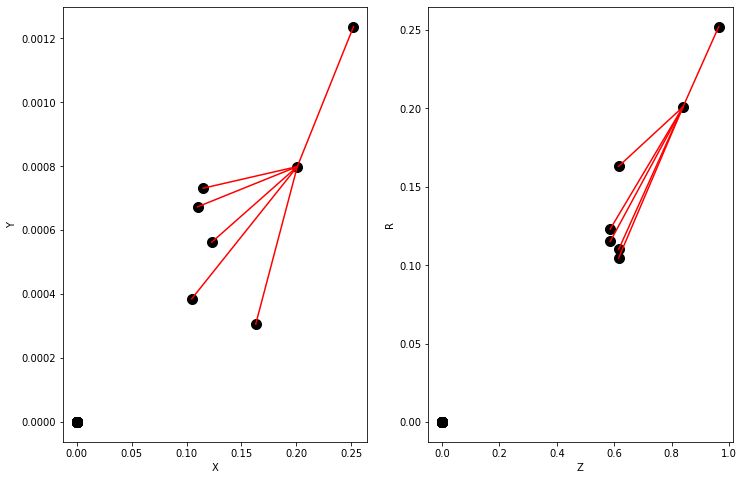

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.10914013 0.05329757 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


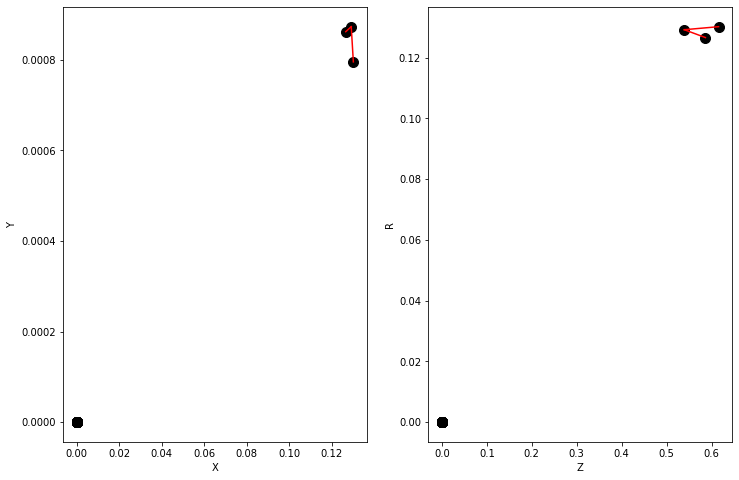

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.5243414e-05 5.1984229e-05 5.5056556e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

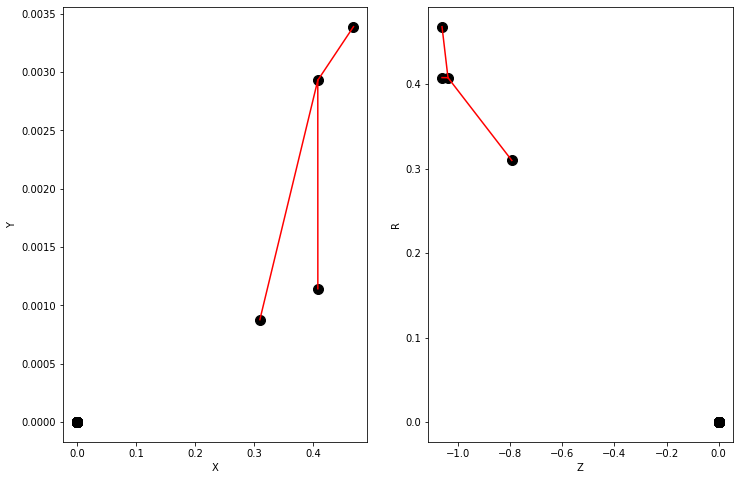

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.27664098 0.24067368 0.32655787 0.2751507  0.49898687 0.49467927
 0.46410608 0.43046317 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.929, precision 0.000, recall 0.000


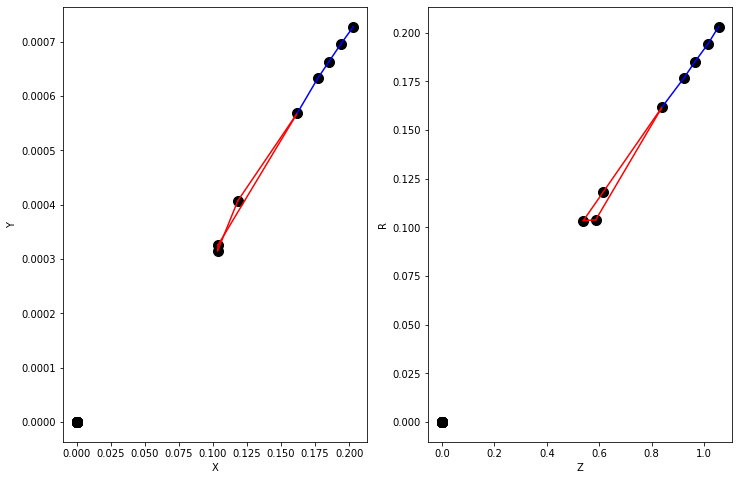

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [9.233612e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

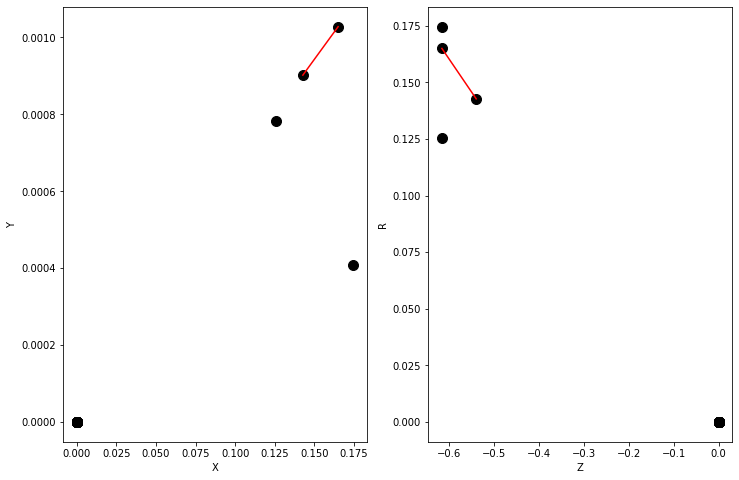

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.6624460e-05 5.7005574e-05 4.4001015e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

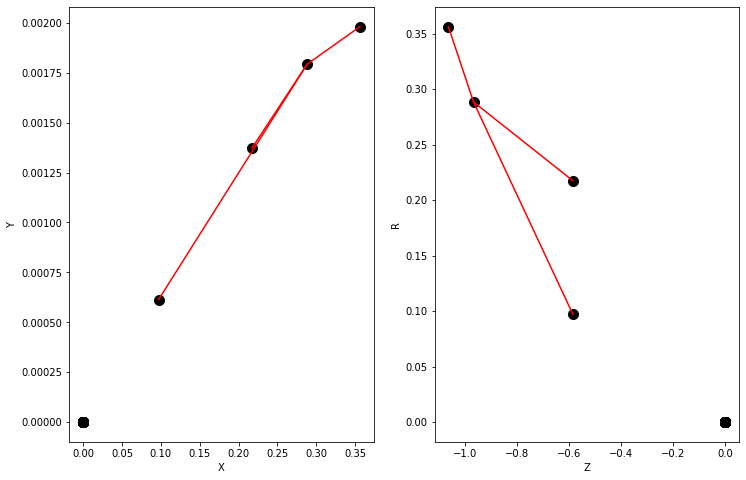

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.02224804 0.02331938 0.02748622 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


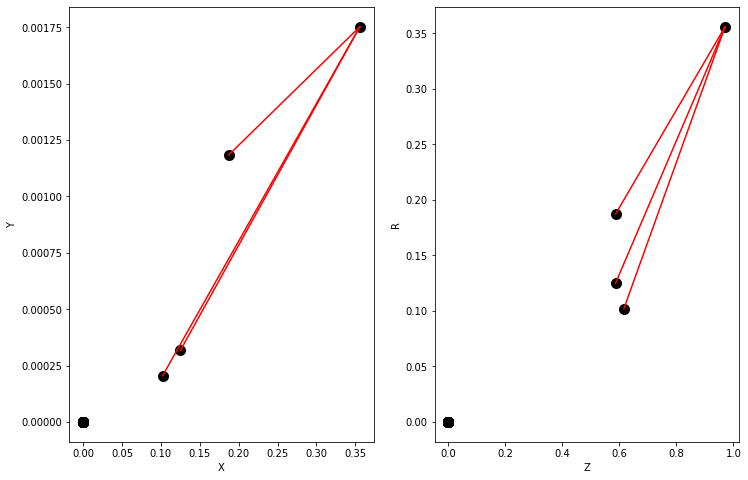

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.31773624 0.29605842 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


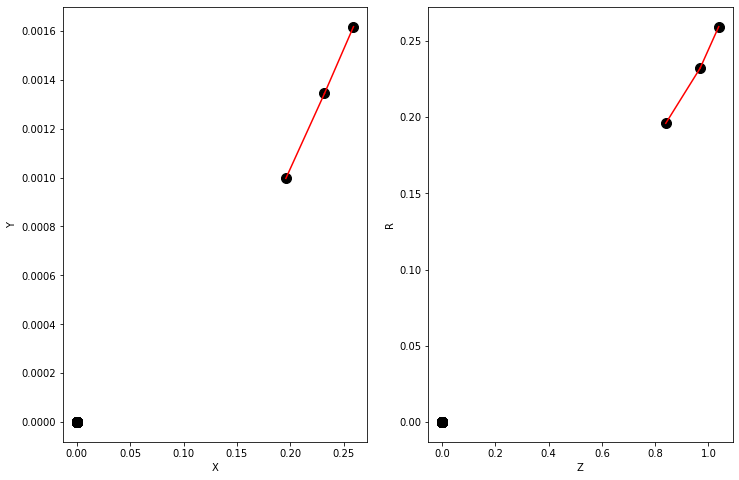

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.1368053  0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


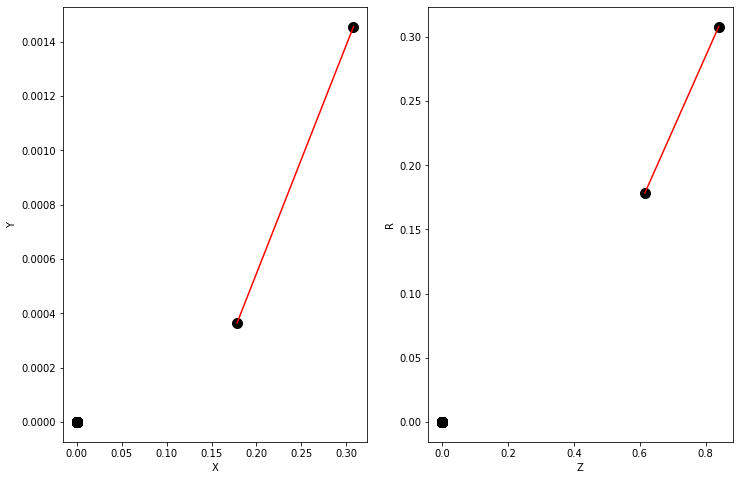

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.3540272e-05 5.4042357e-05 4.9130311e-05 3.3681707e-05 3.5445173e-05
 3.3804790e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

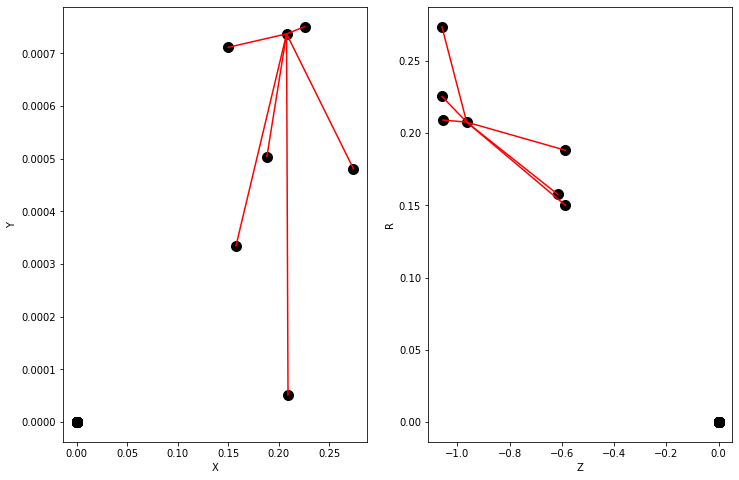

Y = [1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.4413795e-01 5.2549744e-01 8.3748817e-01 7.8051829e-01 6.9232780e-01
 5.8114886e-01 4.9882025e-01 4.8032510e-01 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

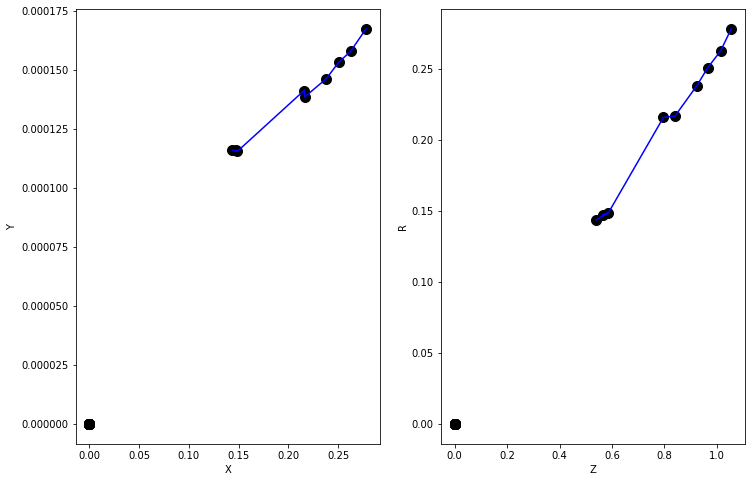

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.0001234  0.00012502 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


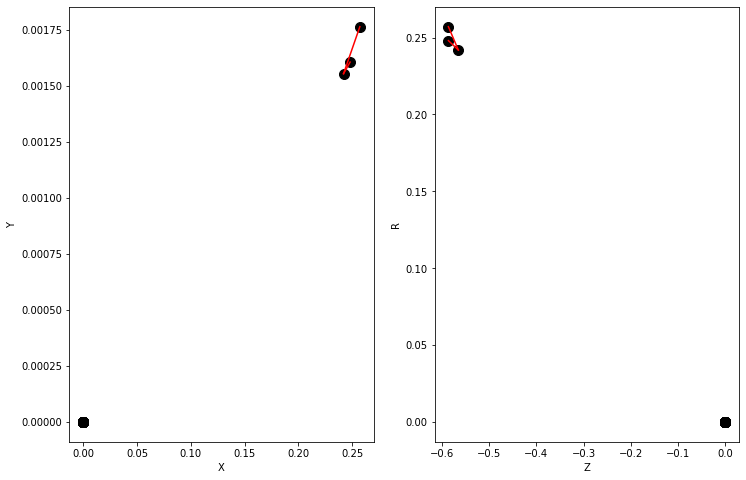

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.0214545e-05 3.4389392e-05 3.1342941e-05 3.1629486e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

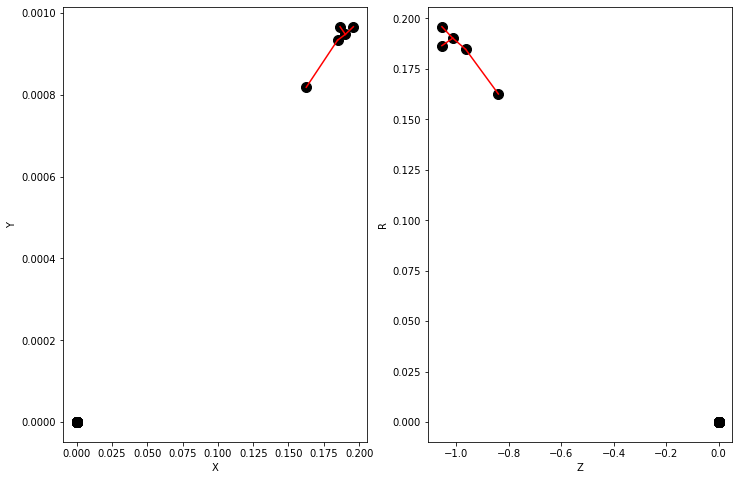

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.9775161e-05 6.2380903e-05 5.3130480e-05 5.0383580e-05 3.6816207e-05
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

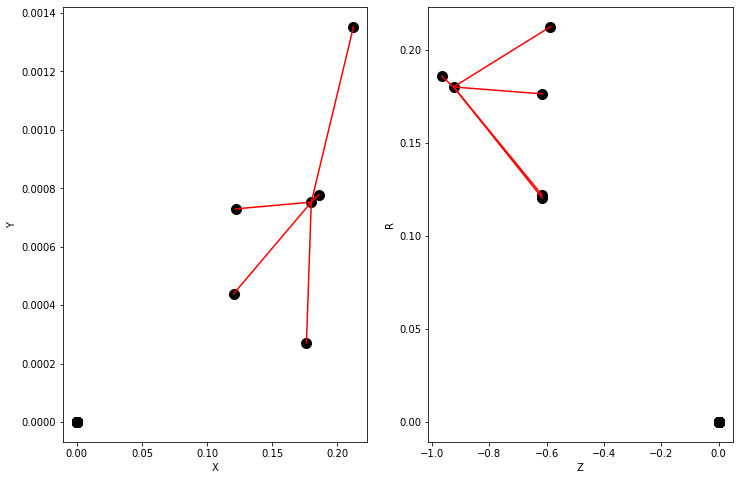

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.16698718 0.19747075 0.05755902 0.06790356 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


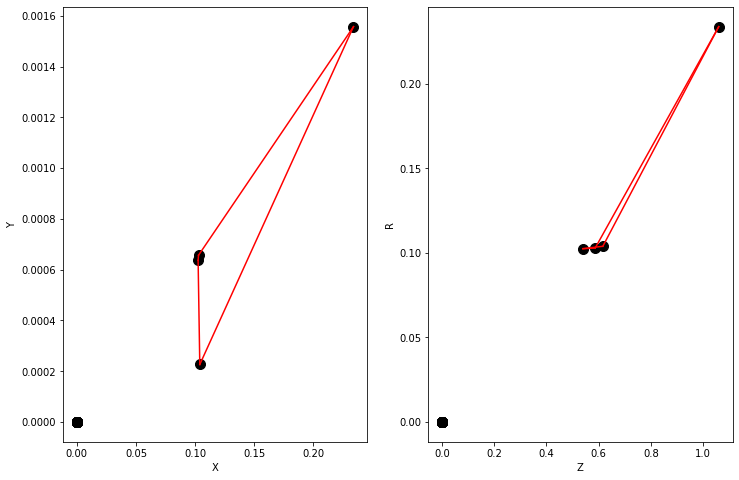

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.297118e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

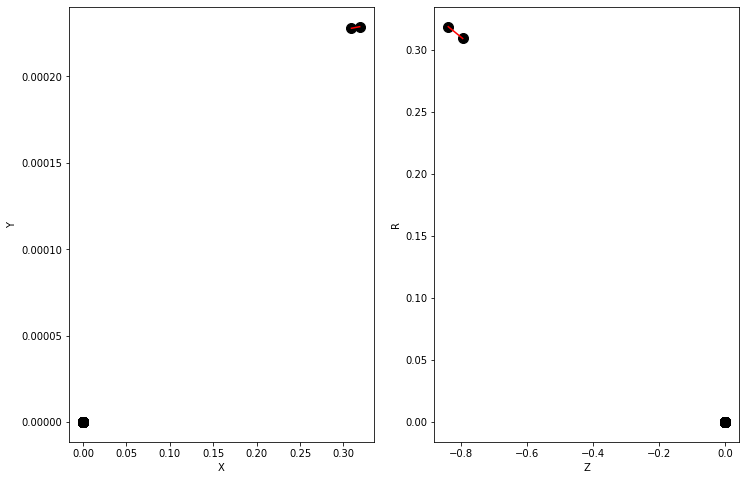

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.03687009 0.03643385 0.03845103 0.03799601 0.04071552 0.03850455
 0.04061006 0.03840399 0.18093872 0.16767907 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


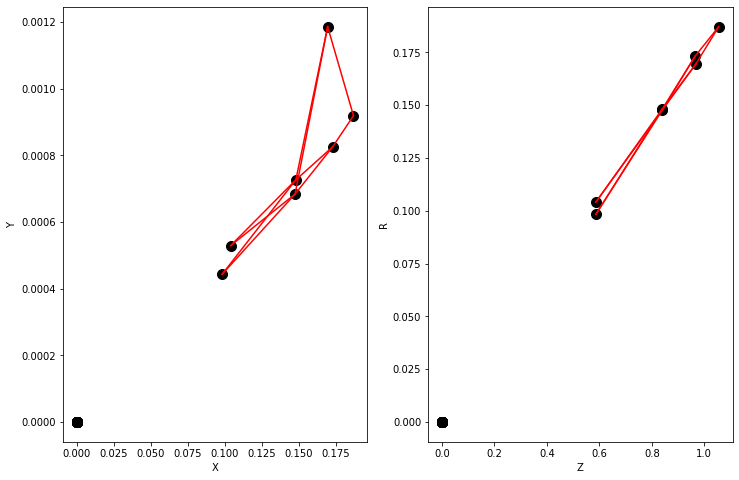

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.0350125  0.0400833  0.10917151 0.28535166 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


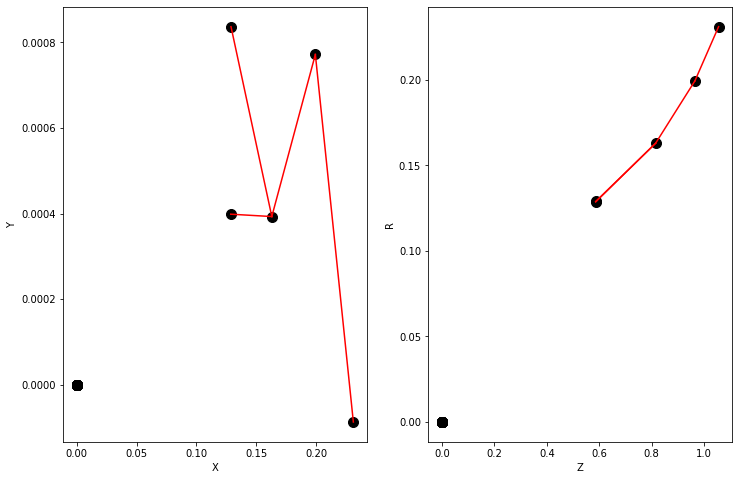

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.26026255 0.3703966  0.6137114  0.49373528 0.46636504 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.946, precision 0.000, recall 0.000


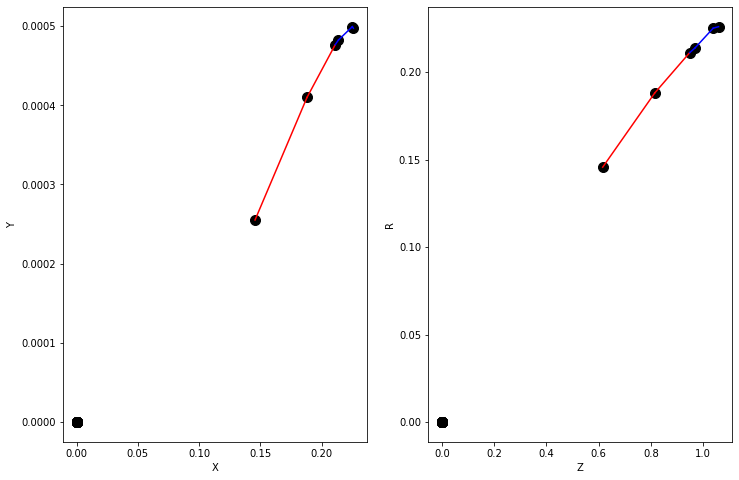

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [3.504450e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

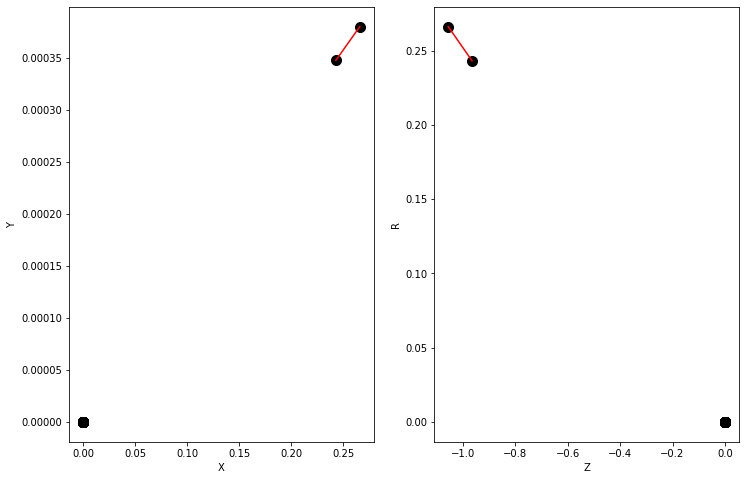

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.03662227 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


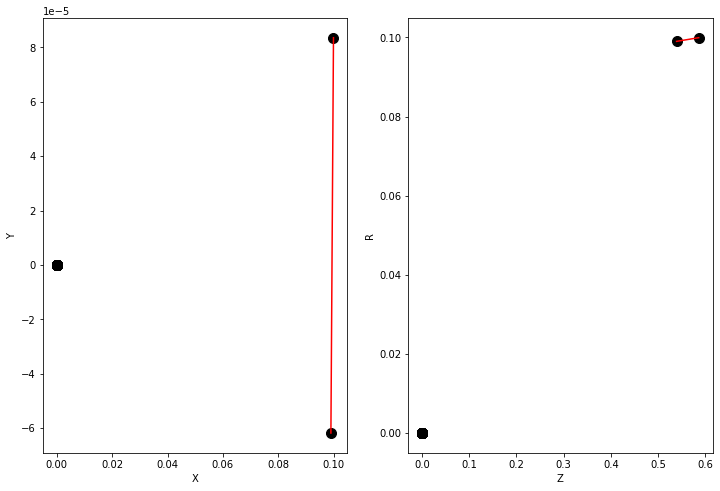

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [3.6268713e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

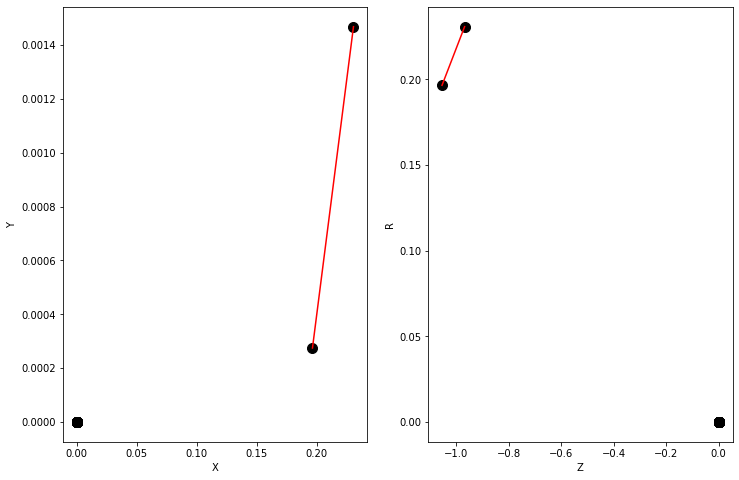

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.0019832e-05 7.6672695e-05 7.9022364e-05 8.3343148e-05 8.6996472e-05
 6.1508319e-05 5.8982845e-05 6.6459732e-05 7.2731404e-05 7.5952623e-05
 5.0392227e-05 4.3705517e-05 3.7712936e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

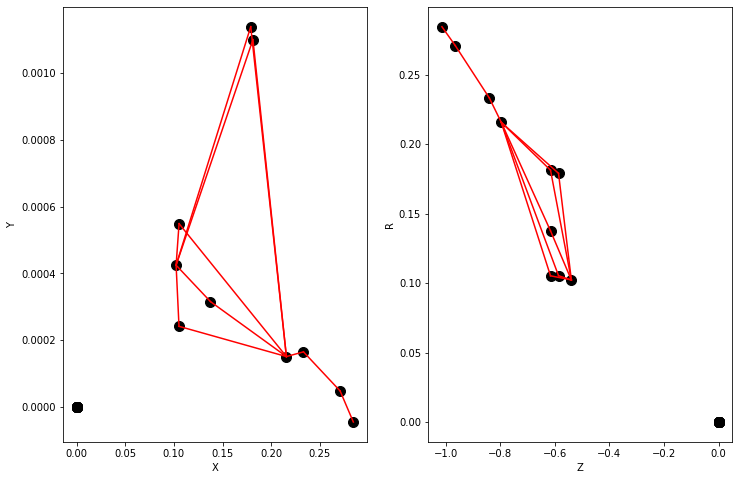

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.15037228 0.19097686 0.43762454 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


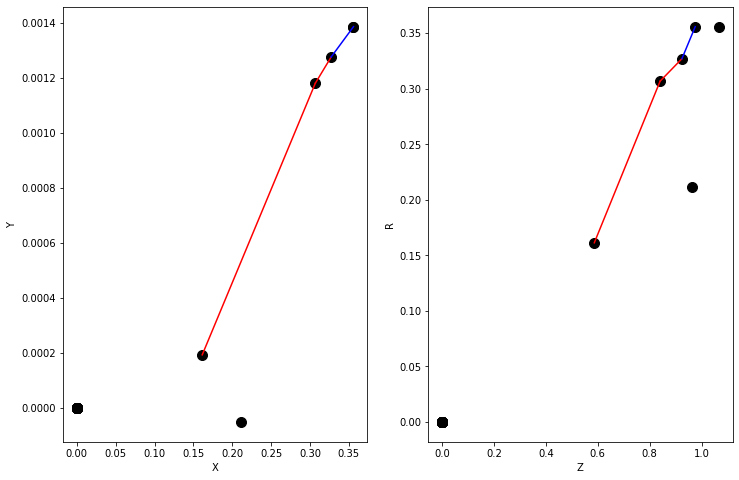

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [3.6252255e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

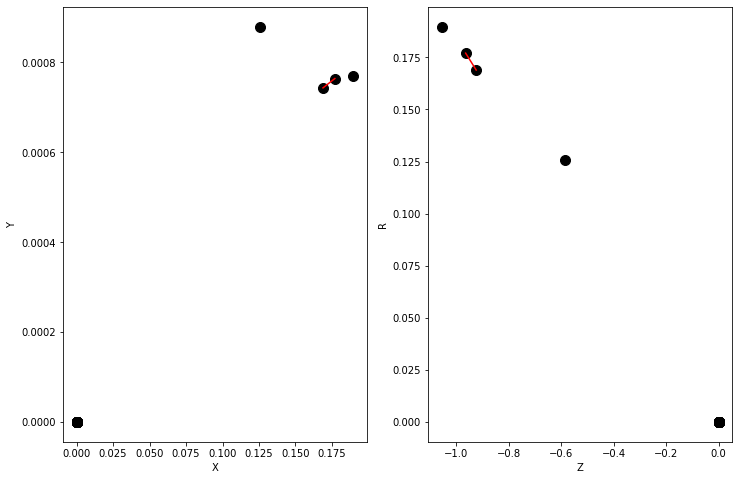

Y = [1. 0. 0. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.14499417 0.15906426 0.15830658 0.50571656 0.60369885 0.54275906
 0.531776   0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 1.000, recall 0.800


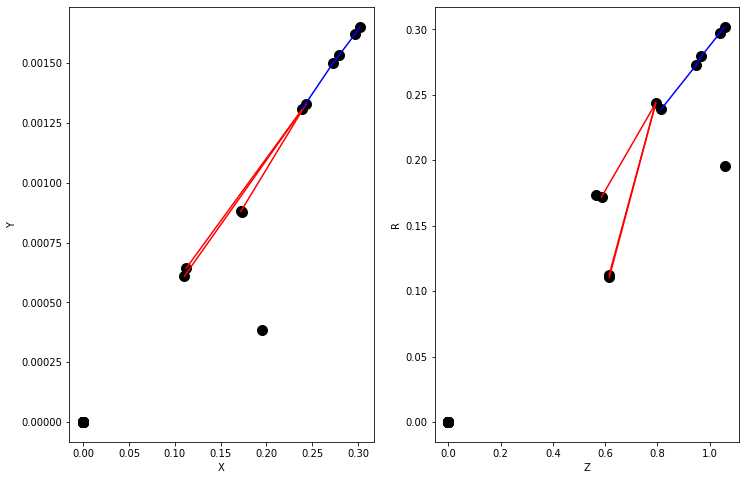

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.1757877e-05 2.9752337e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

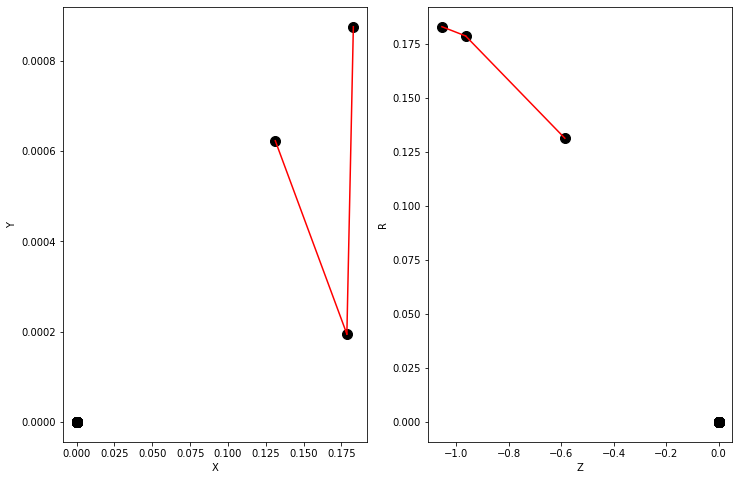

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.02644237 0.02621457 0.06201065 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


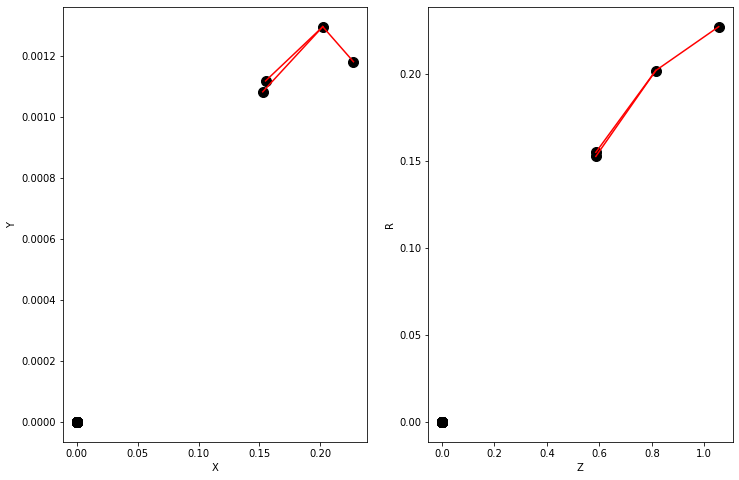

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.8104844e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

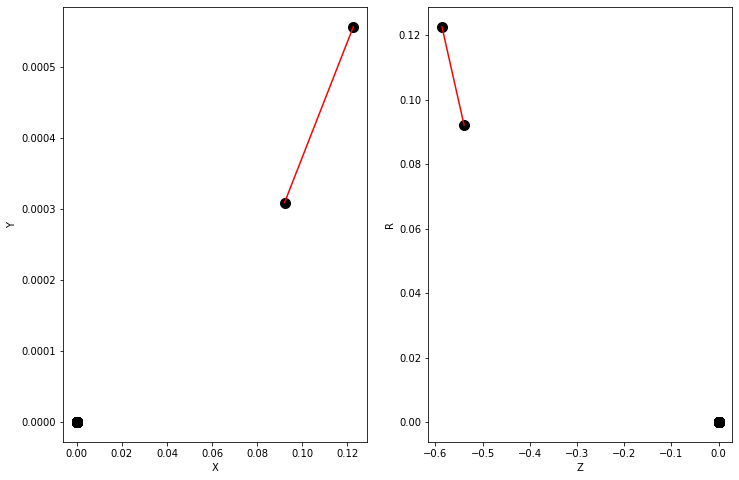

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.3557735e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

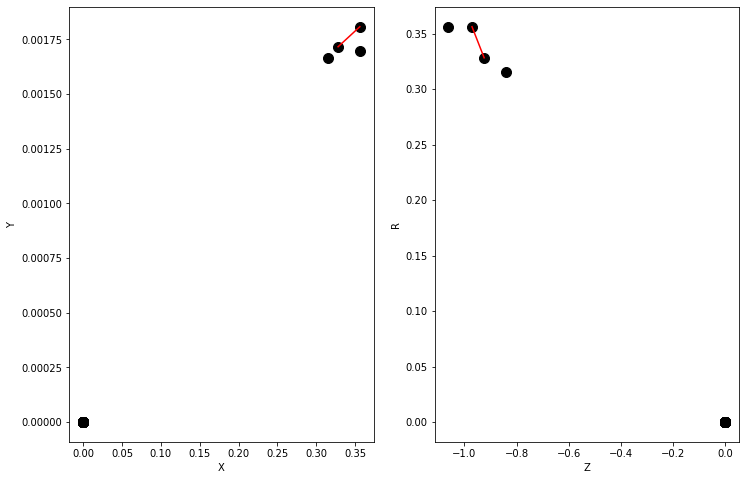

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.40747952 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


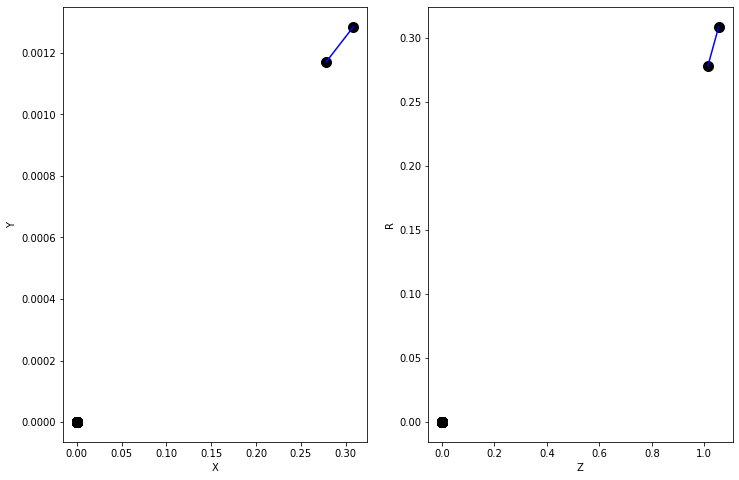

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.6641918e-05 6.3459585e-05 4.2724037e-05 3.8058621e-05 3.9301751e-05
 3.3660388e-05 3.3935317e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

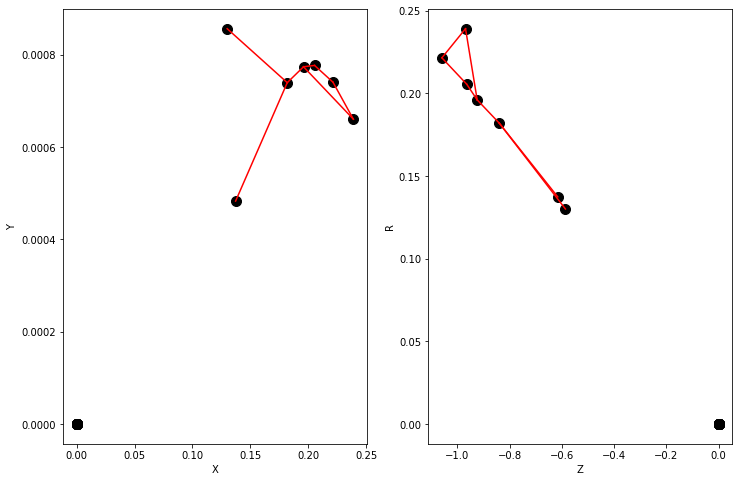

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.06479999 0.06840457 0.21114805 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


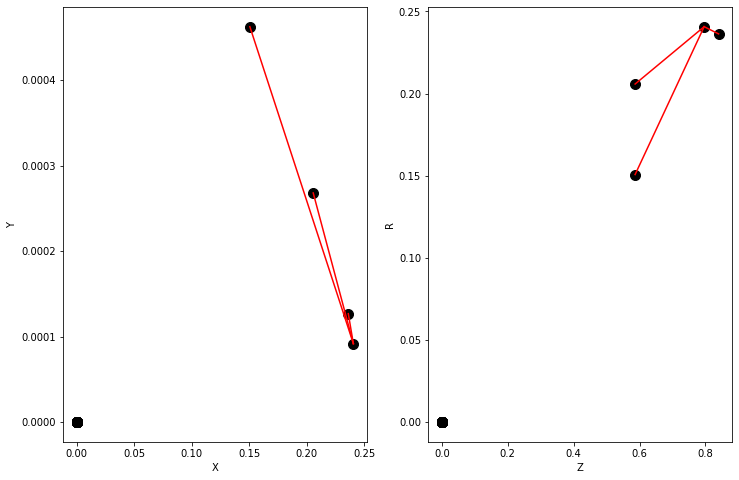

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.02075508 0.02100838 0.02589823 0.0776789  0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


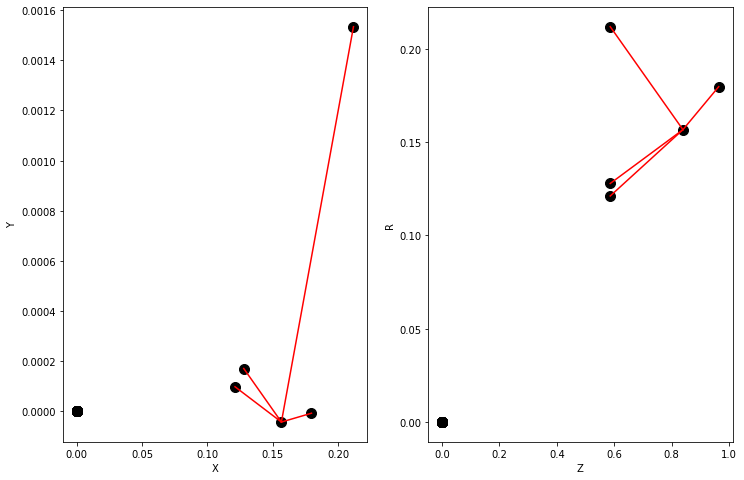

Y = [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.3939324  0.4471342  0.33650577 0.01726432 0.4287167  0.24590626
 0.3515183  0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.946, precision 0.000, recall 0.000


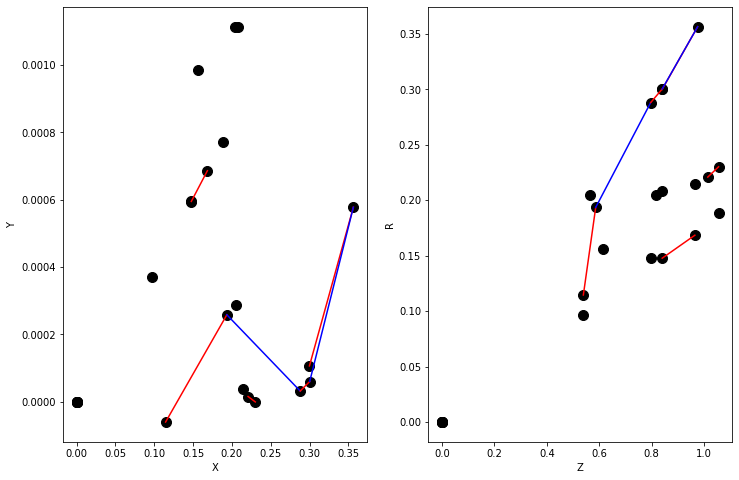

Y = [1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.3690611  0.7021915  0.6680489  0.45122987 0.35376325 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 1.000, recall 0.600


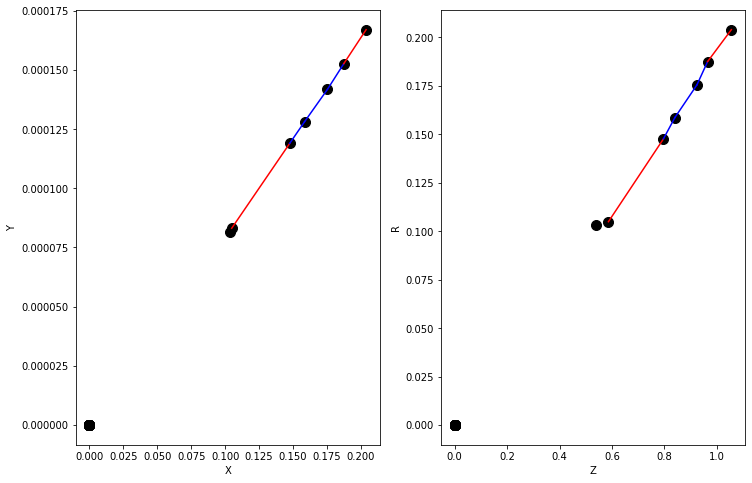

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.411022e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

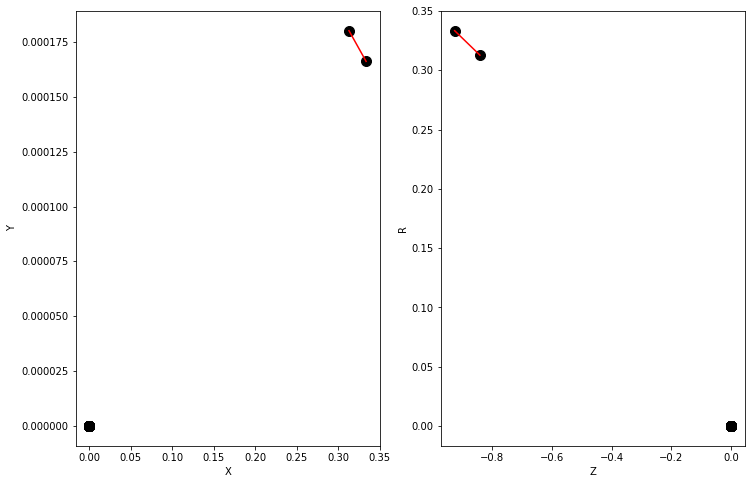

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.3202020e-05 3.8183458e-05 3.3980199e-05 3.4203549e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

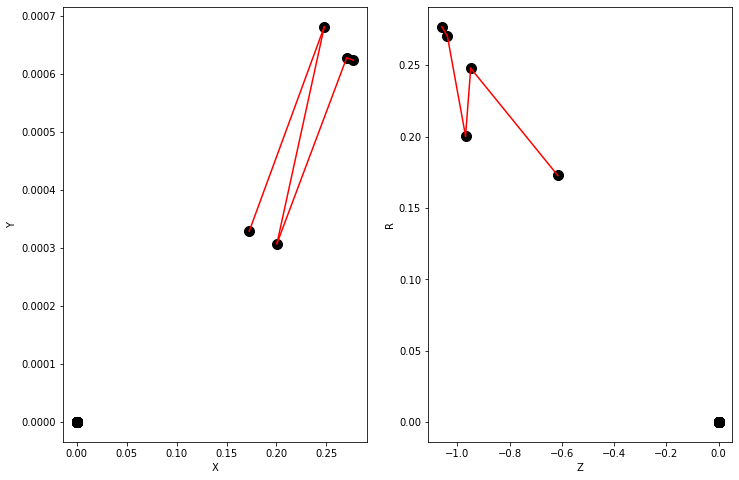

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.3737356  0.19645804 0.18883039 0.12090924 0.11753765 0.34641716
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


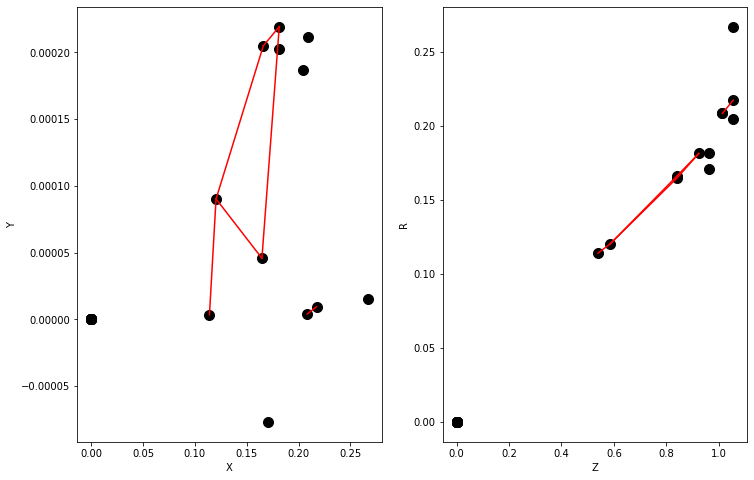

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.09454126 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


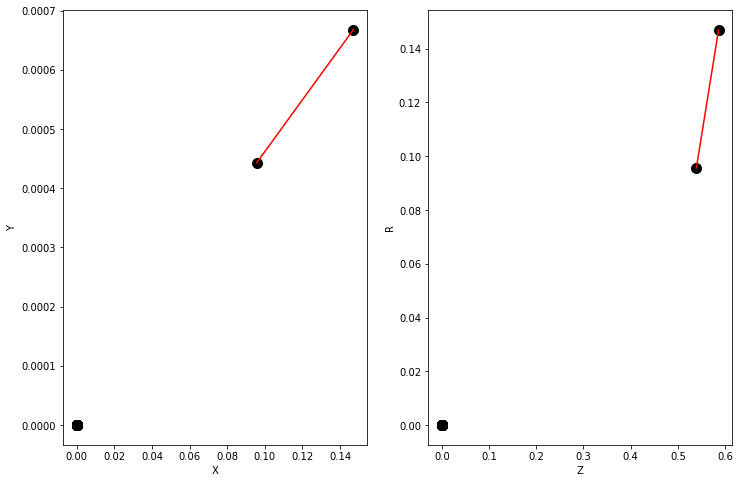

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.04898505 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


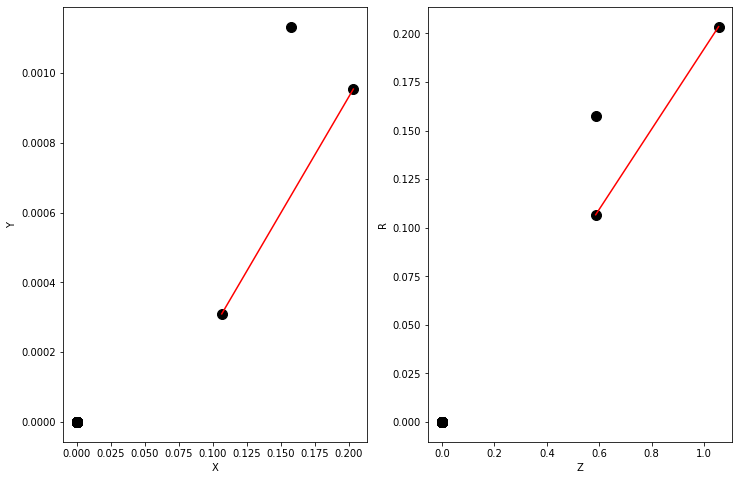

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.12800238 0.1745807  0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


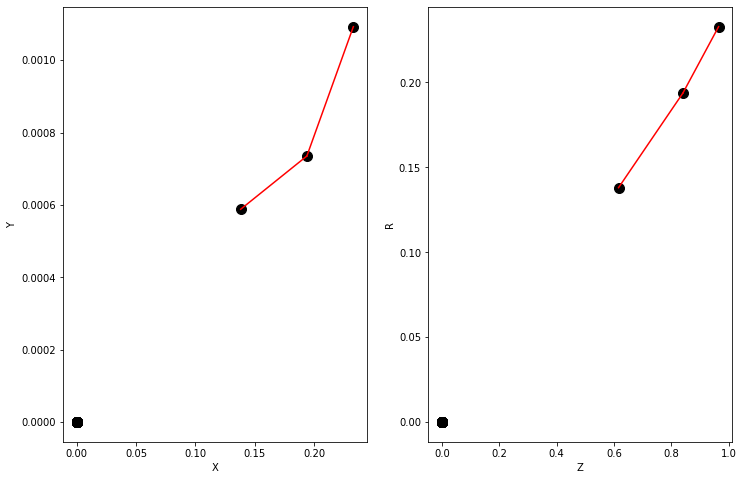

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.8634509e-05 4.9148493e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

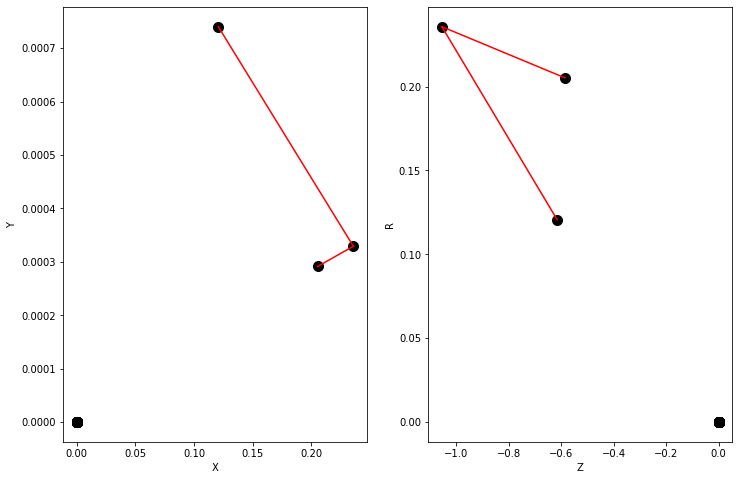

Y = [1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.5295631  0.74027574 0.7029046  0.59815884 0.5368225  0.5947174
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 1.000, recall 1.000


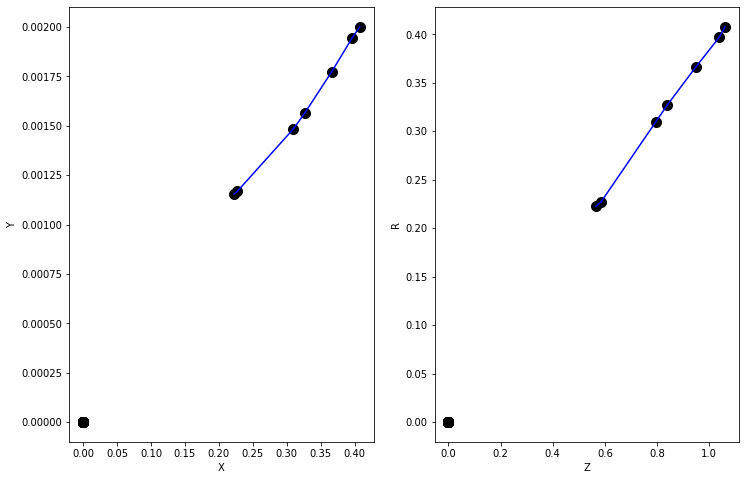

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.05225254 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


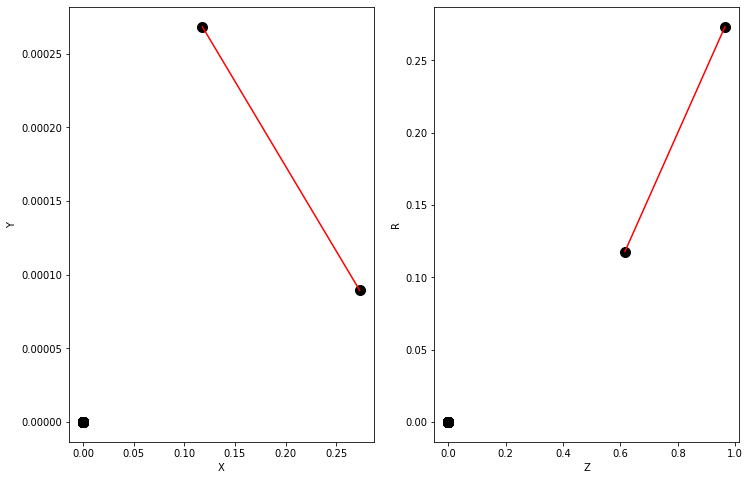

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.4472607e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

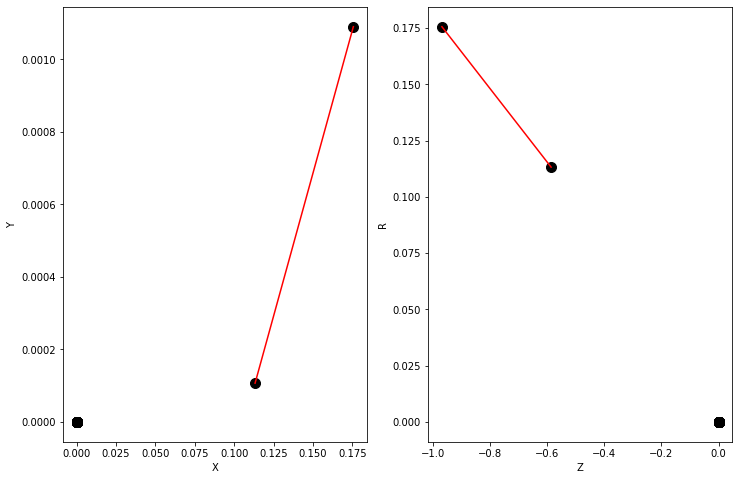

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.66123223 0.7357958  0.59103584 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.946, precision 0.000, recall 0.000


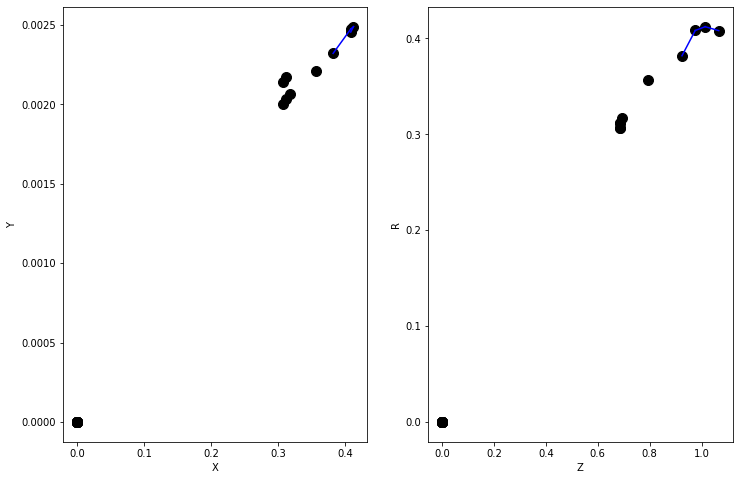

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.1697017e-05 6.3988875e-05 3.8707181e-05 3.4828445e-05 3.2375890e-05
 3.0214689e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

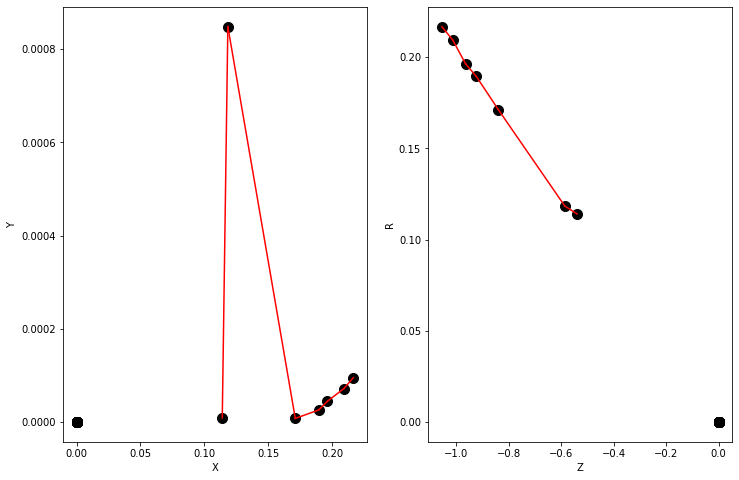

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.186013e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

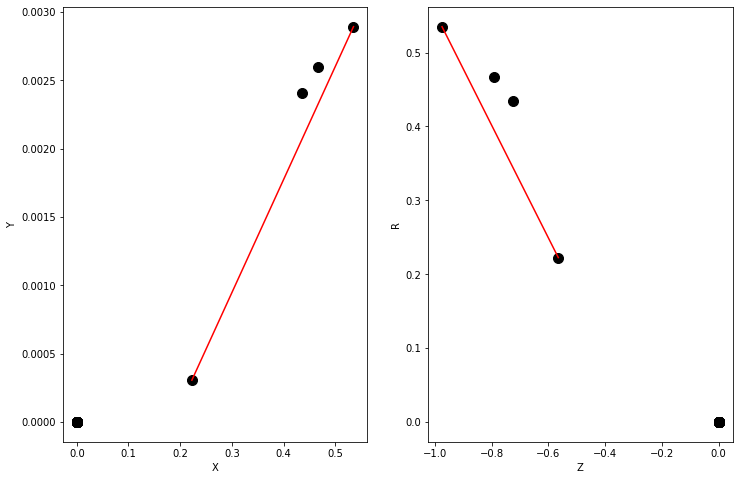

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.14672868 0.21305302 0.39192328 0.39828184 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


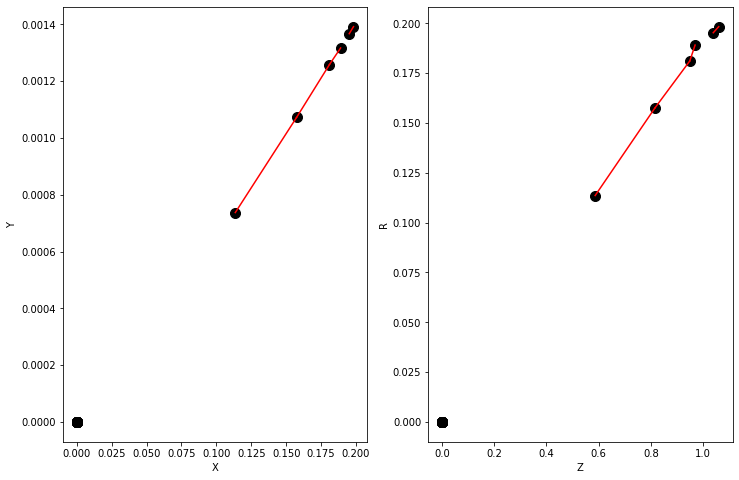

Y = [1. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.5816377  0.19536617 0.7332101  0.60822546 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 1.000, recall 1.000


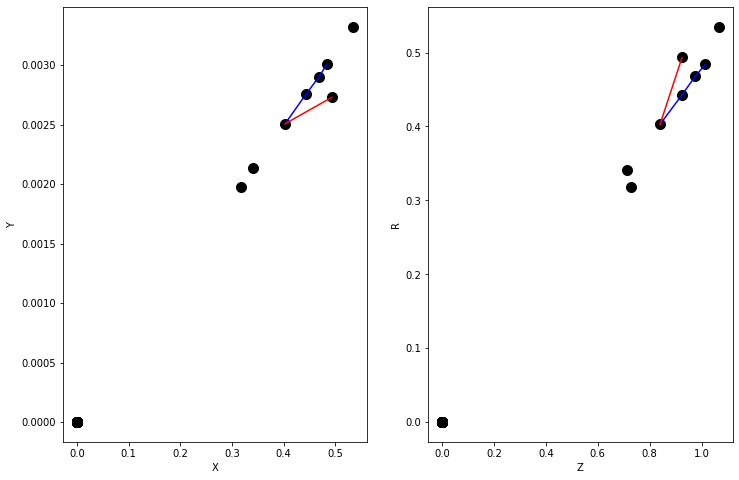

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [3.9526669e-05 3.5495203e-05 3.2884498e-05 3.0464060e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

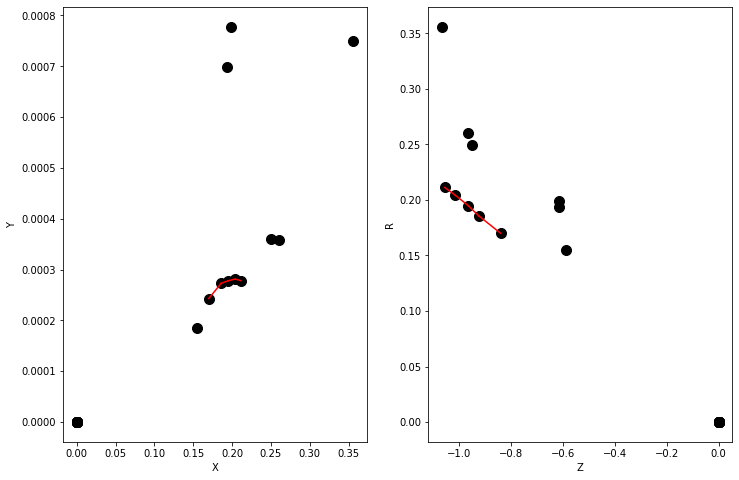

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.2592014  0.30114412 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


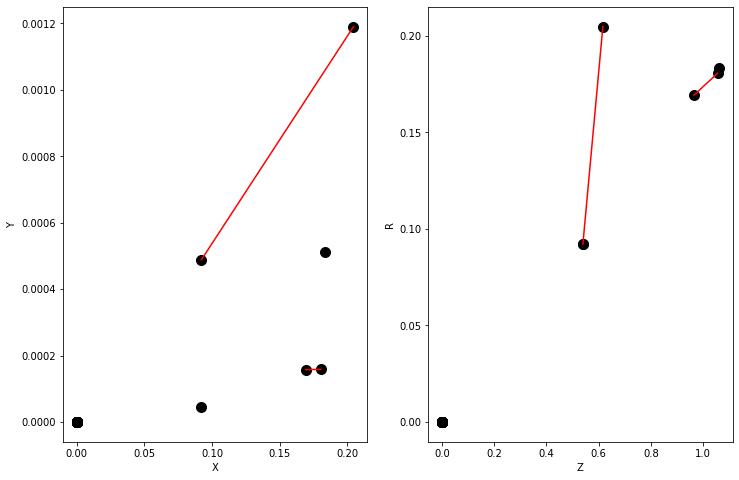

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.303445e-05 4.747226e-05 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

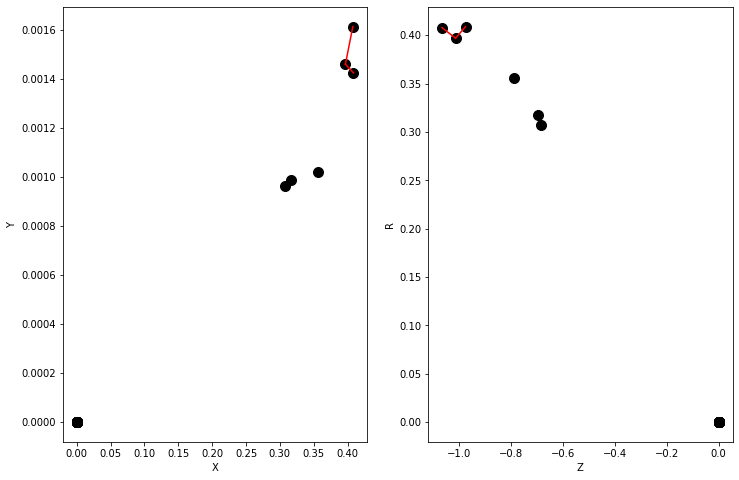

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.13035522 0.10184077 0.11501276 0.06600317 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


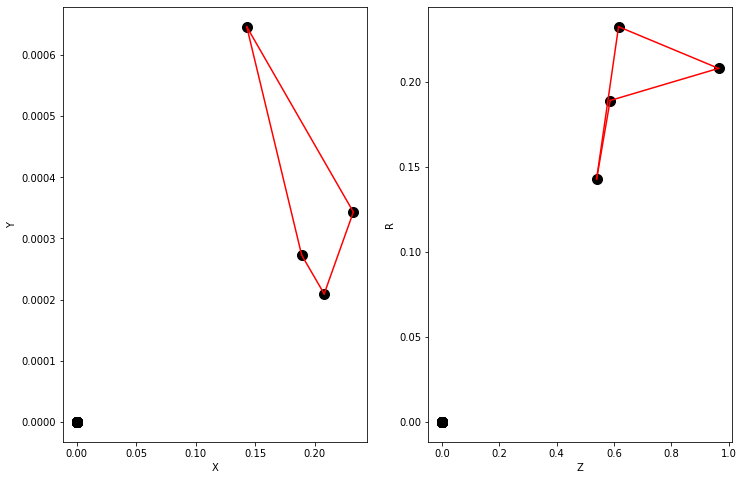

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.48046944 0.57404    0.5060827  0.5085938  0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.929, precision 0.000, recall 0.000


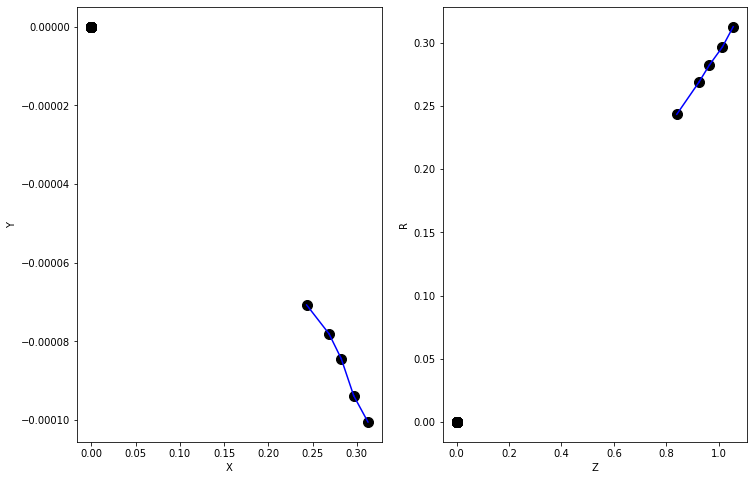

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.6541932e-05 5.6148707e-05 5.4011449e-05 4.8890081e-05 4.5306482e-05
 5.0900846e-05 4.1702191e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

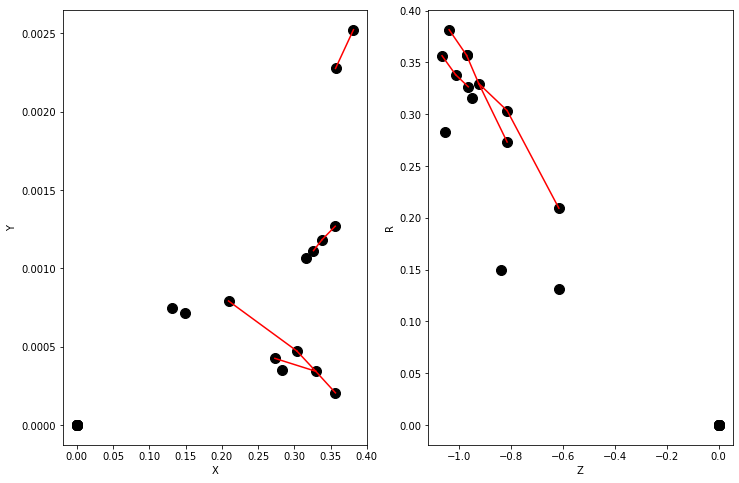

Y = [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.21112743 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


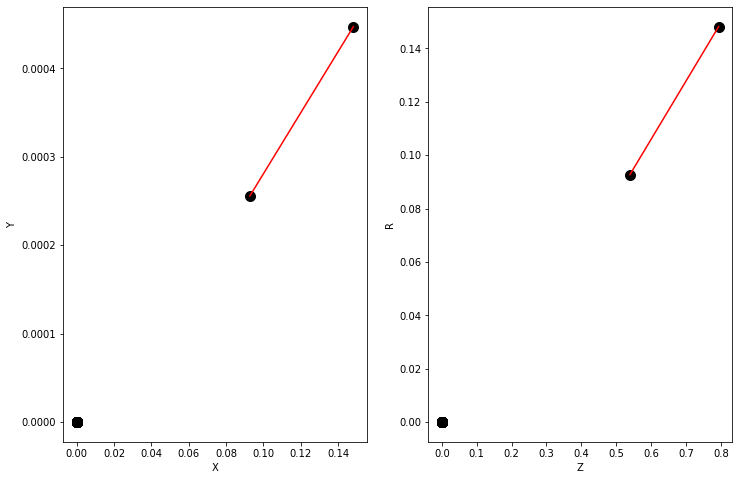

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.5870536e-05 8.1350270e-05 5.7249581e-05 5.6801269e-05 4.2033742e-05
 3.9077251e-05 3.6430771e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

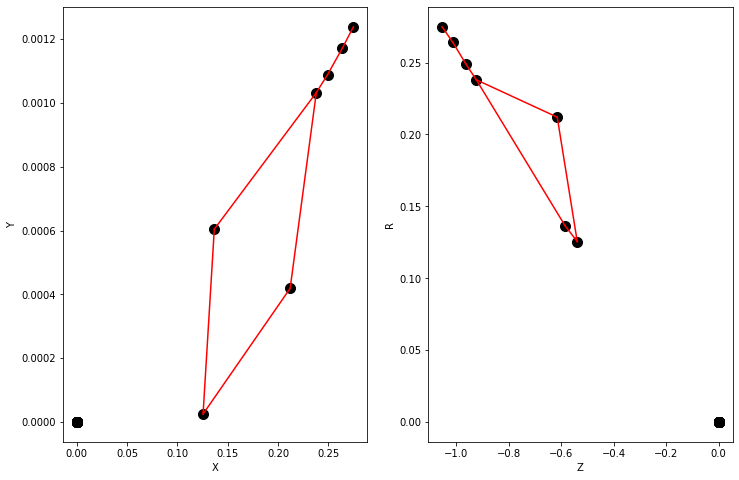

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.05959297 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


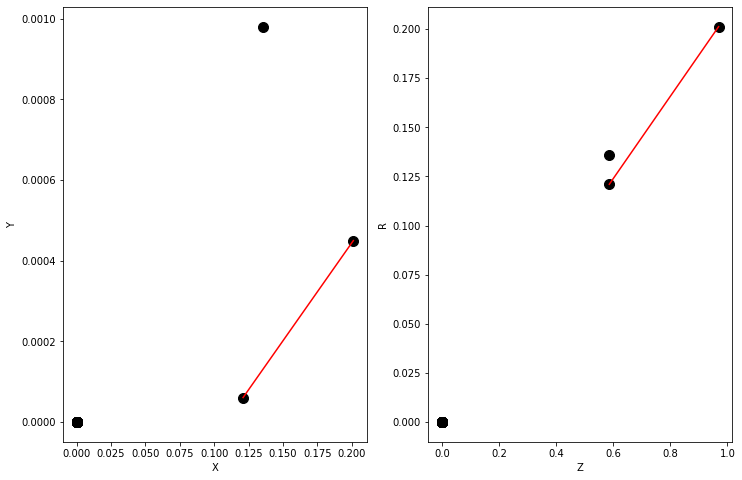

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [9.637709e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

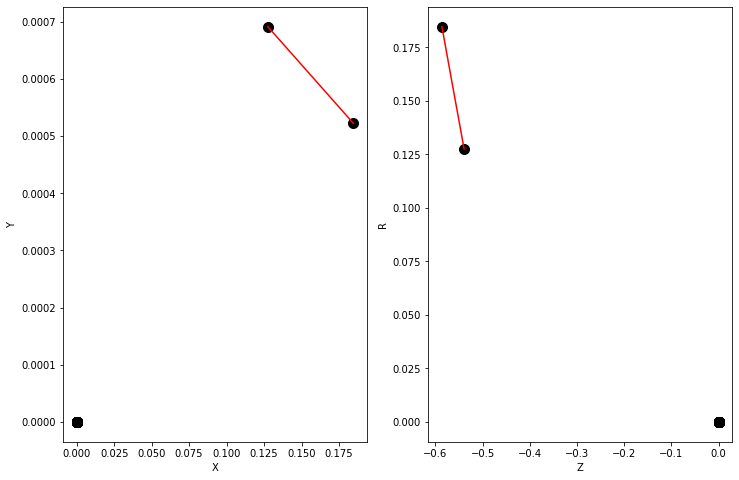

Y = [1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.3952021  0.39595756 0.33539194 0.3368544  0.5281034  0.5621913
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.929, precision 1.000, recall 0.333


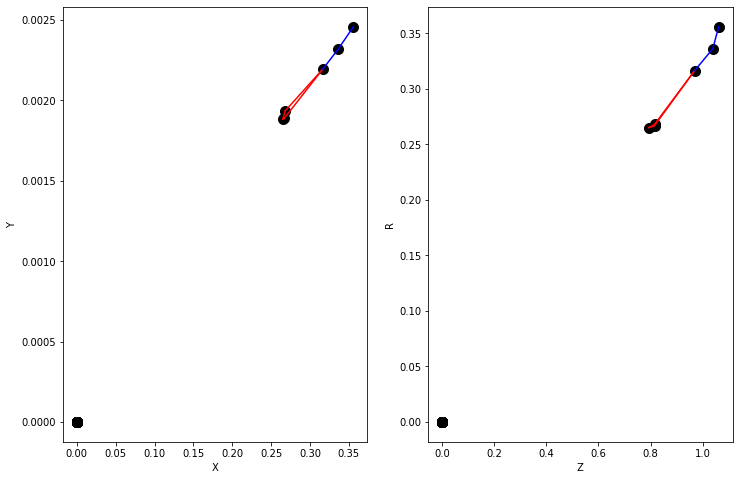

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.3555635e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

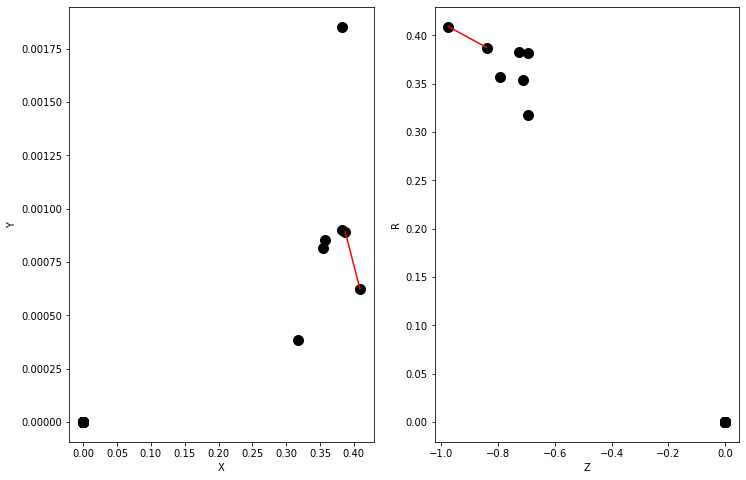

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.04995598 0.05024441 0.0460836  0.17262171 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


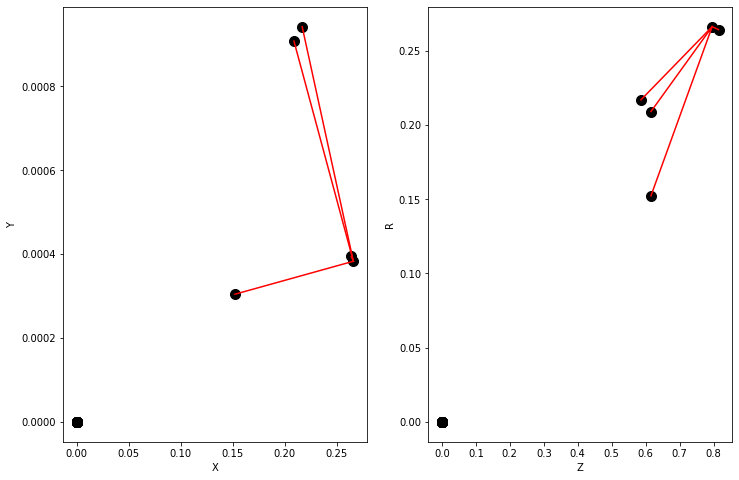

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.00011465 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


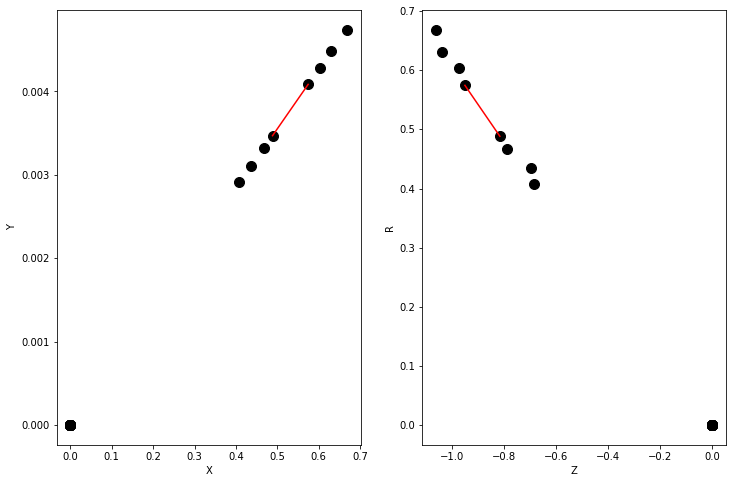

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.16092317 0.07404721 0.0716044  0.05832905 0.05583632 0.06245781
 0.05924758 0.04509664 0.04289807 0.21849304 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


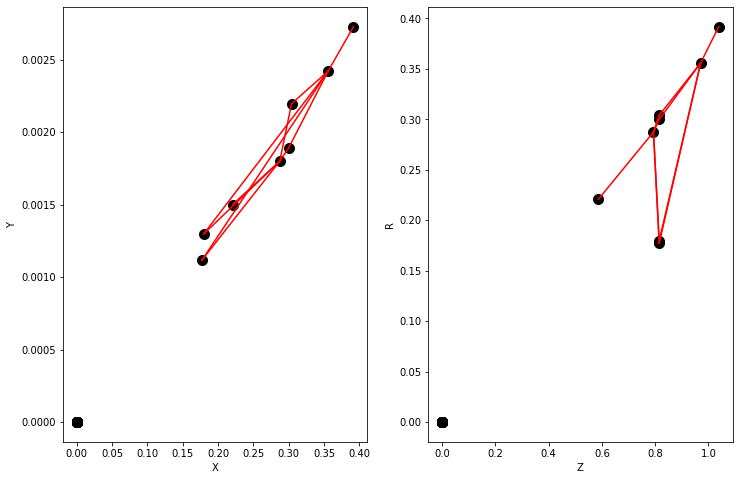

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.537784e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

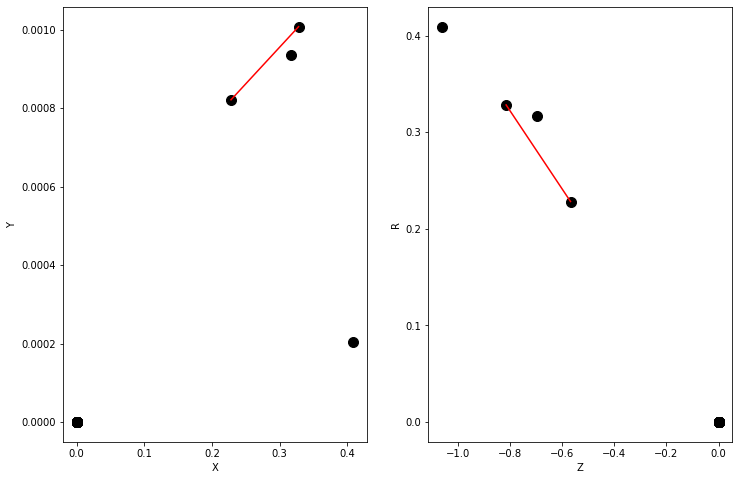

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.9200076e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

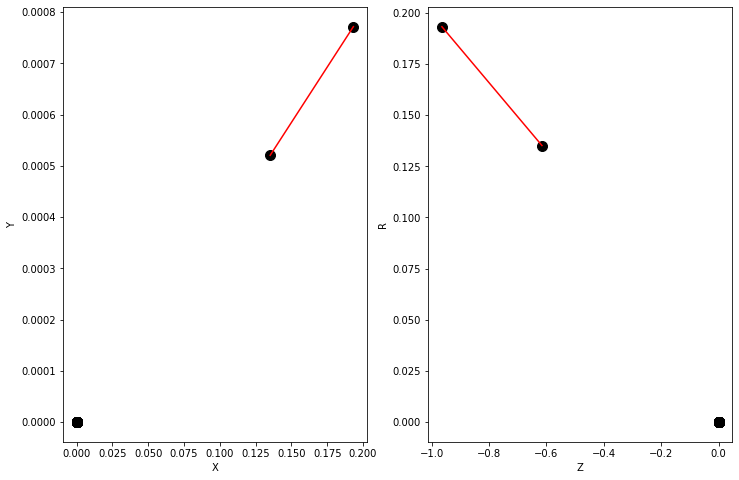

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.0145256e-05 5.5209712e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

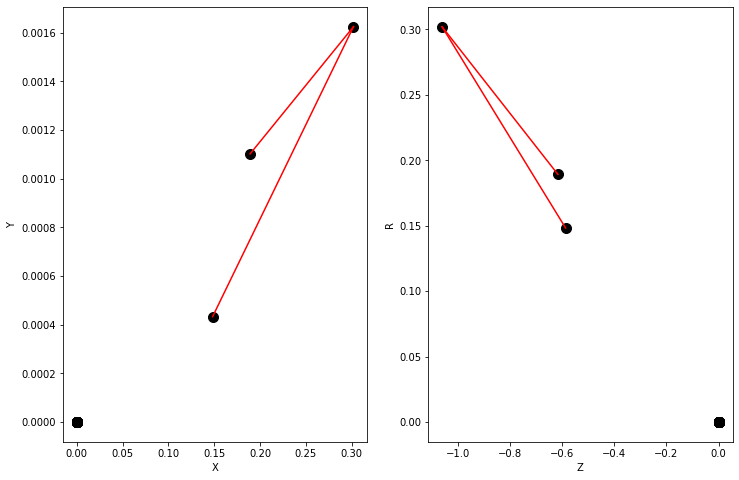

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [2.9514587e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

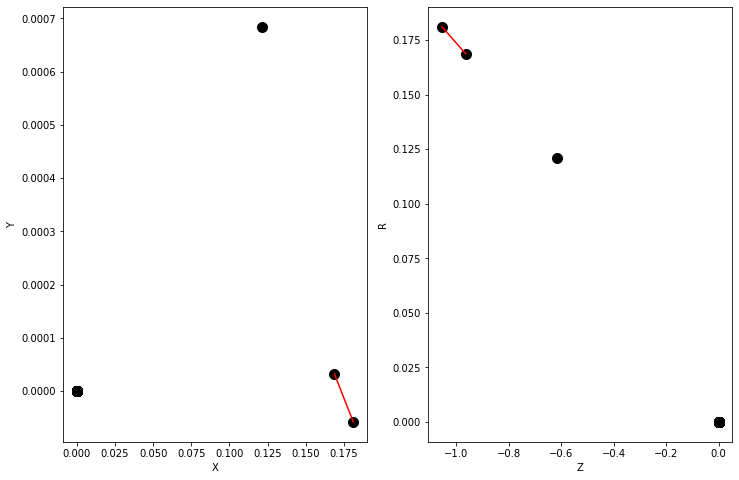

Y = [1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.2246492  0.22699909 0.11275559 0.1947404  0.19688459 0.09522629
 0.25726345 0.25899214 0.13115579 0.13135424 0.41150376 0.21701407
 0.2164645  0.38961655 0.22955576 0.19936362 0.4378106  0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.839, precision 1.000, recall 0.182


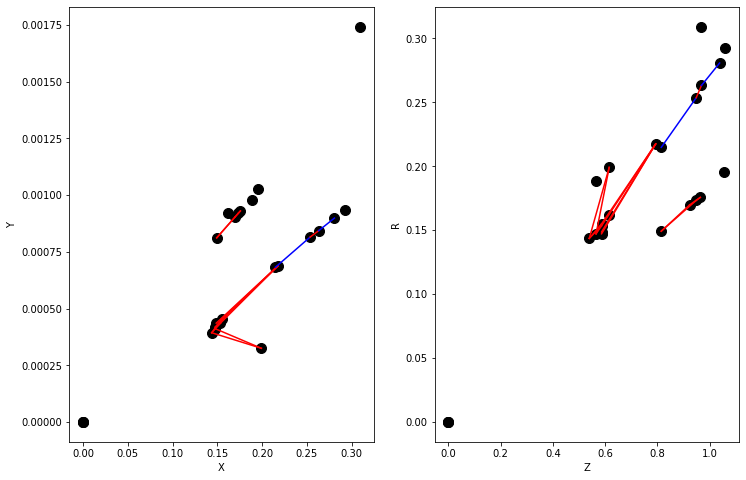

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.6954999e-05 8.3769824e-05 8.7088192e-05 8.6300839e-05 6.0747603e-05
 5.9617036e-05 6.6710287e-05 6.5102933e-05 4.2806172e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

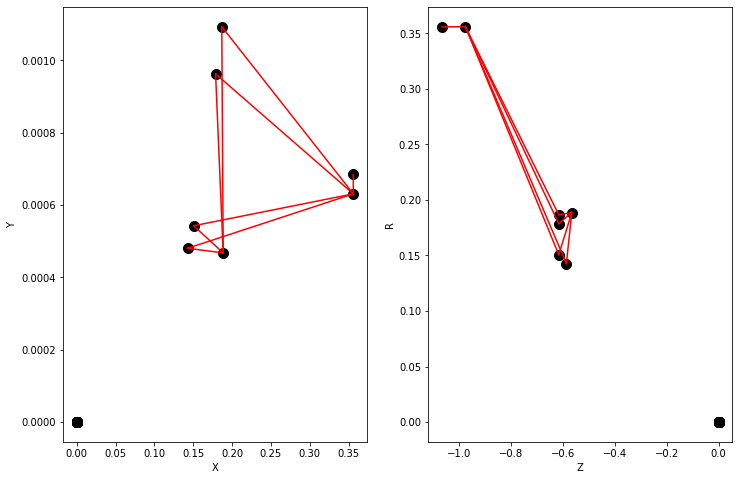

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.13375805 0.48051766 0.49923176 0.52851605 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.946, precision 0.000, recall 0.000


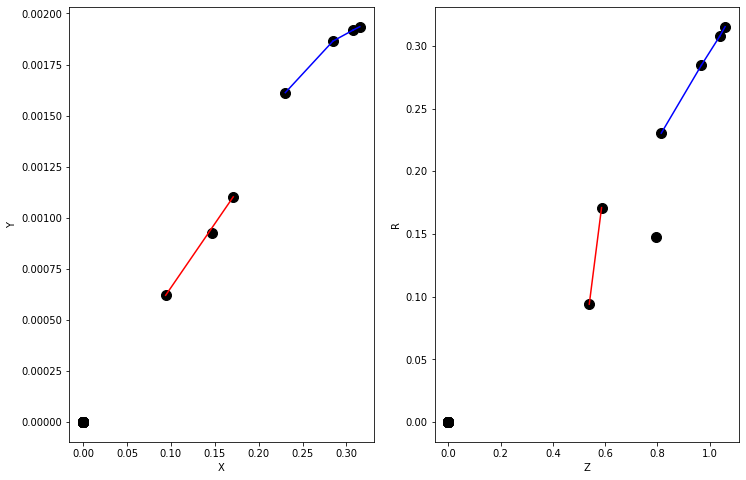

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [9.2354618e-05 6.0568407e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

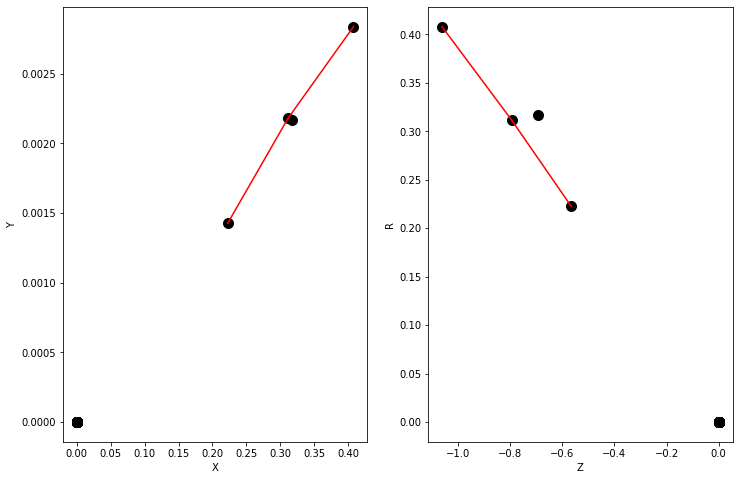

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.9490052e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

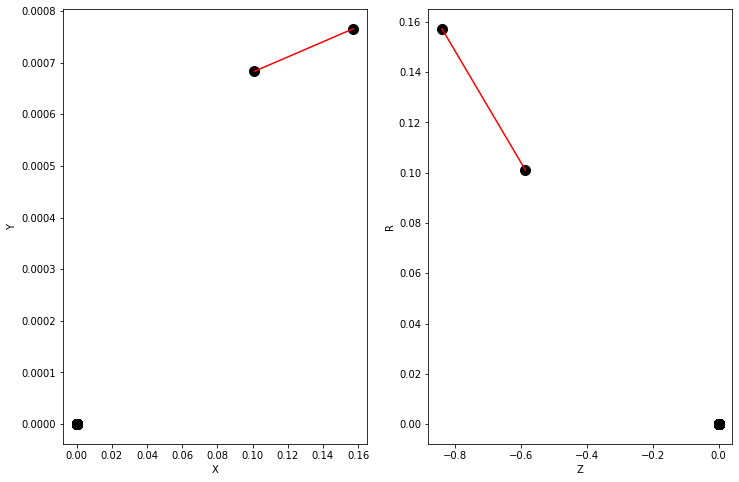

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.9233636e-05 5.7717716e-05 4.1918855e-05 3.6742269e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

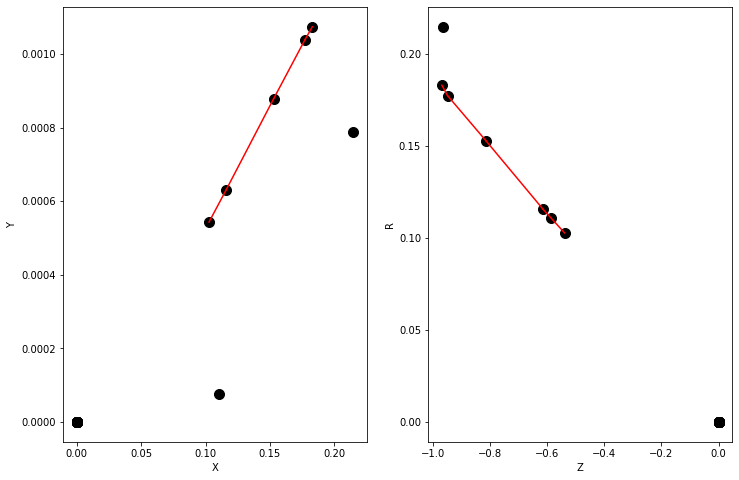

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.4116645e-05 3.1304469e-05 3.4469667e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

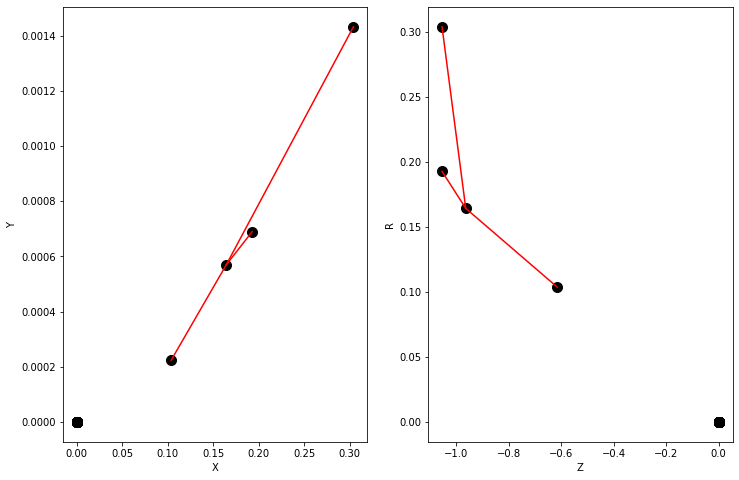

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.36012828 0.47774485 0.668988   0.5681024  0.63052815 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.929, precision 0.000, recall 0.000


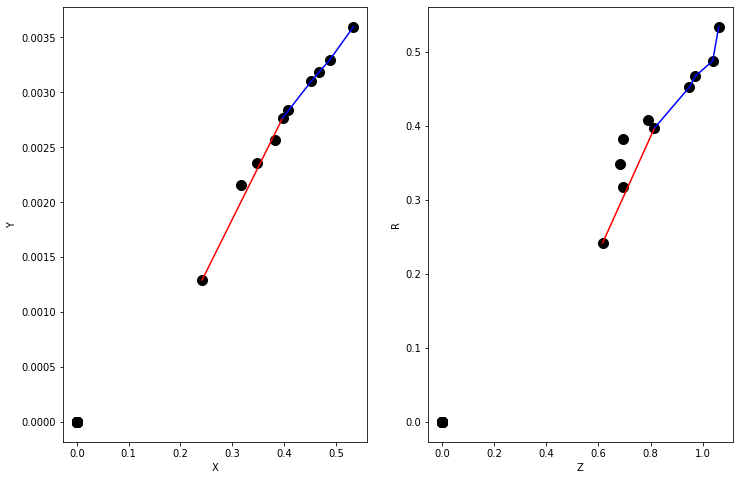

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.8922407e-05 6.2778949e-05 5.4704389e-05 4.0403942e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

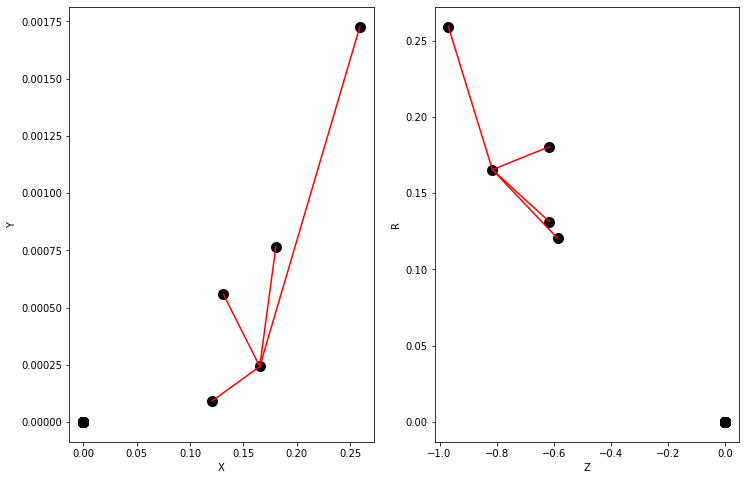

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.3805975e-05 7.2867188e-05 5.4215900e-05 3.9237224e-05 3.5844034e-05
 3.6797075e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

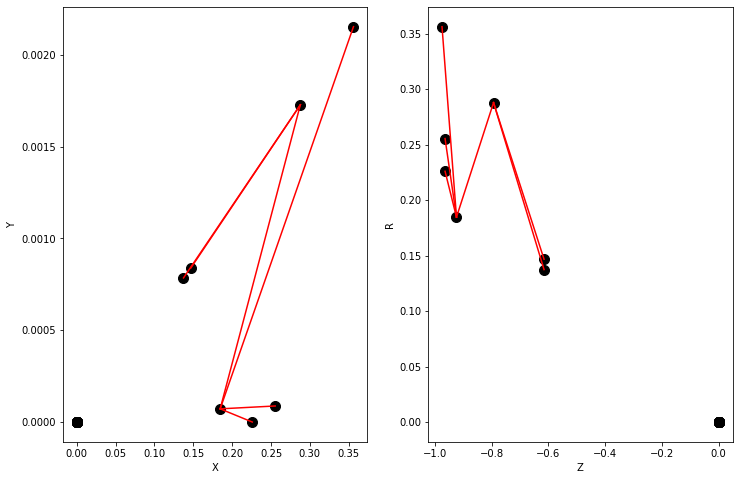

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.07371657 0.07366311 0.05885184 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


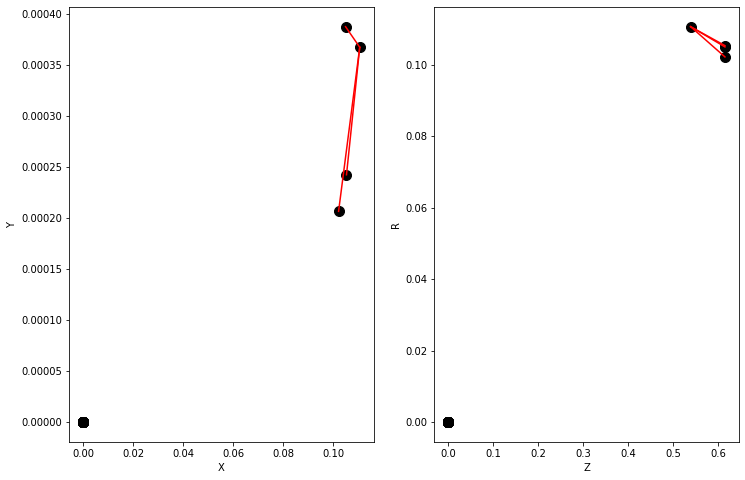

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.03837511 0.03829616 0.12413079 0.29893667 0.40557954 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


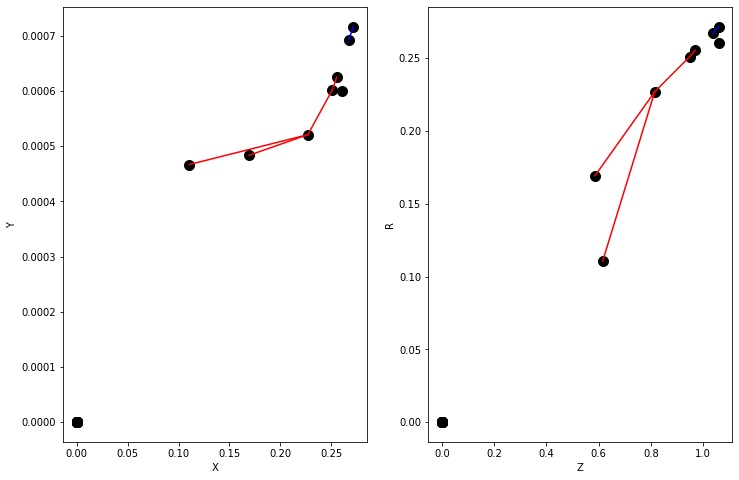

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.6515149e-05 6.8598019e-05 8.0663231e-05 7.2173563e-05 8.1670507e-05
 7.3045849e-05 5.6190107e-05 5.5440792e-05 3.8471255e-05 4.4449203e-05
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

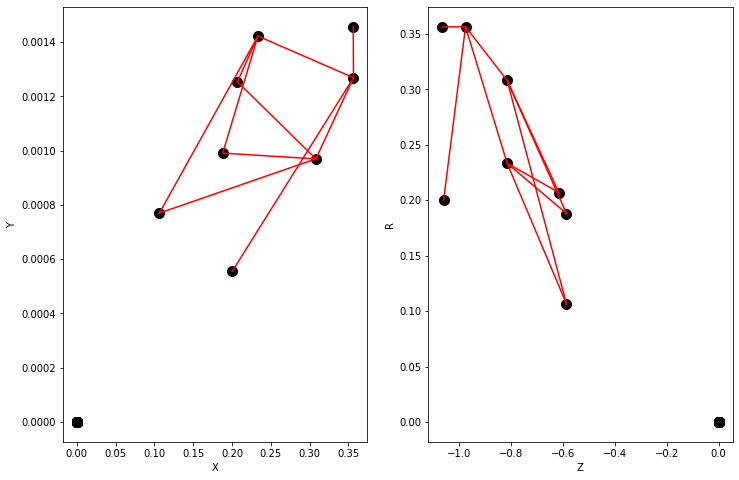

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.5755573e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

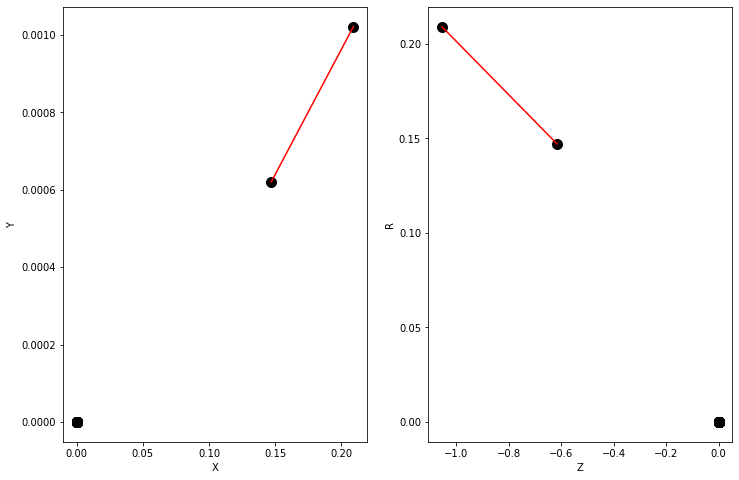

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.9154812e-05 4.3205957e-05 3.4830002e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

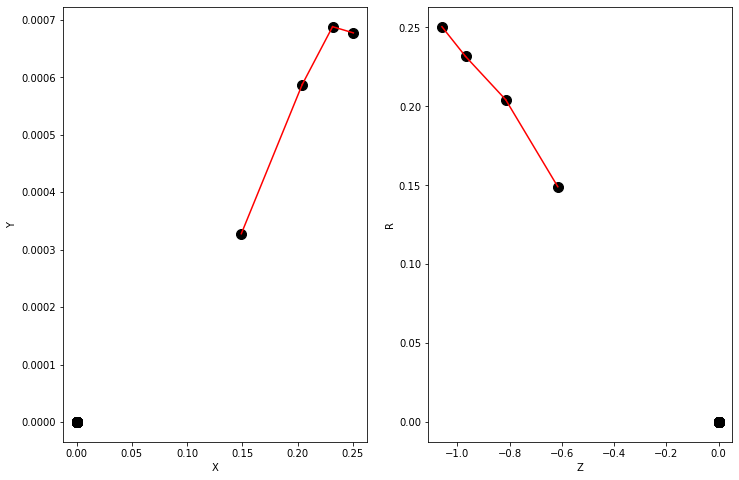

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.30210397 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


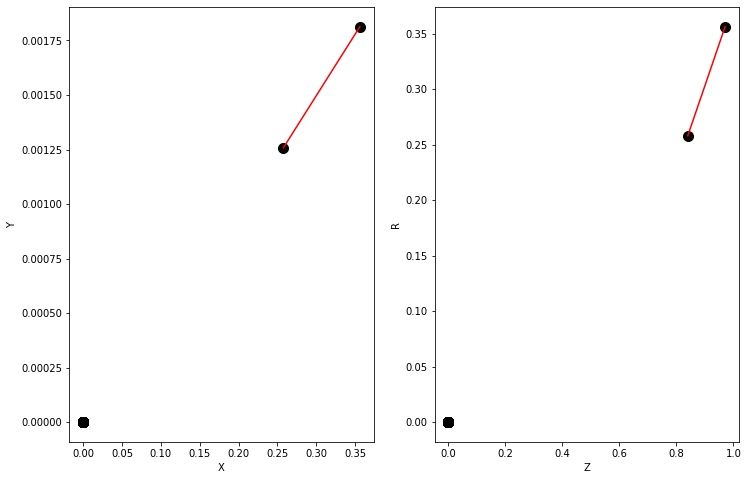

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.7055986e-05 6.0174156e-05 3.7339545e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

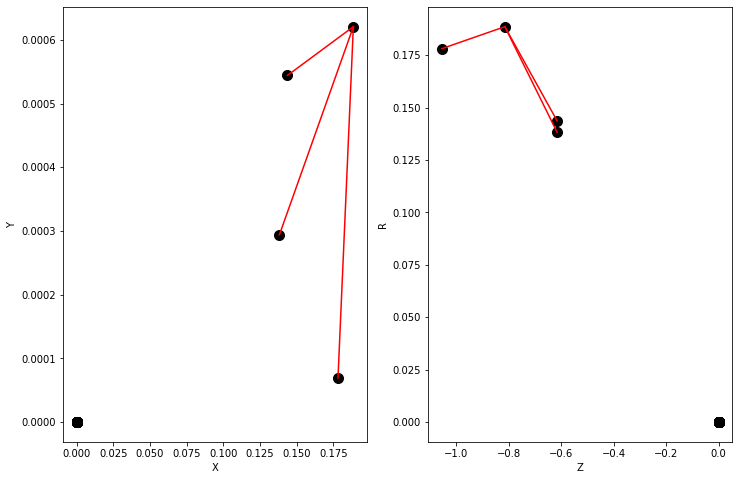

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.07997186 0.10570001 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


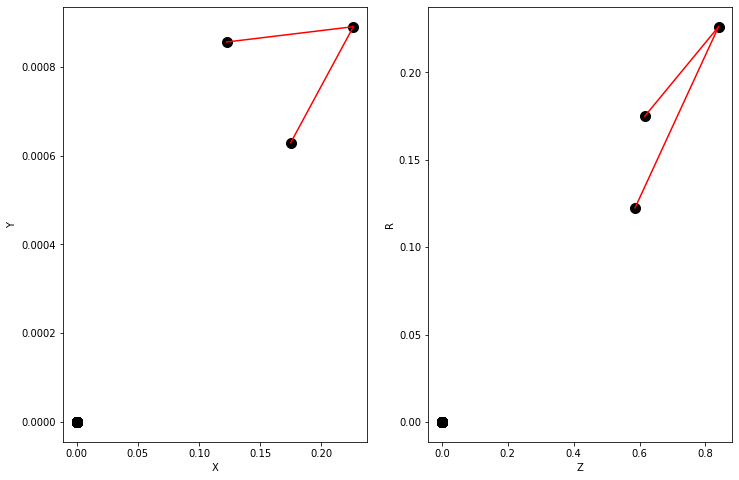

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.6495827  0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


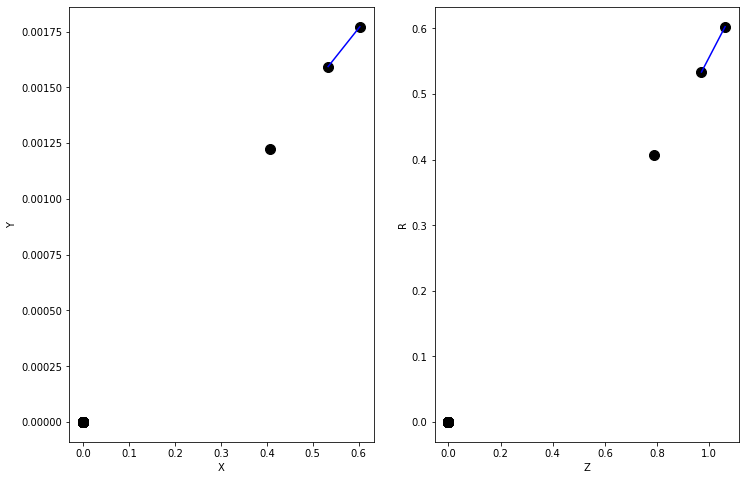

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.0633178e-05 5.0129238e-05 5.2487740e-05 3.6202782e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

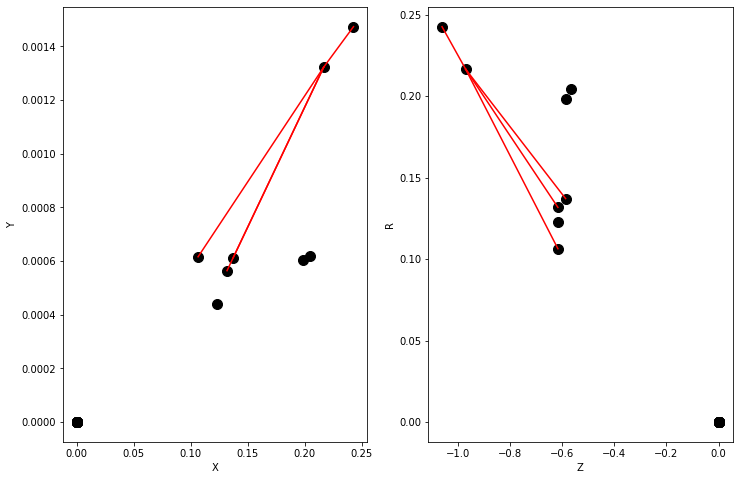

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.45171598 0.54284424 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


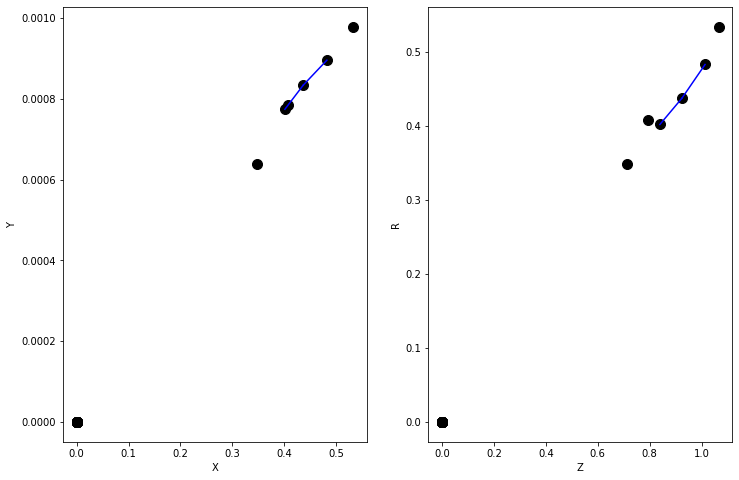

Y = [1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.5569145  0.2688569  0.22743437 0.3743825  0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.946, precision 1.000, recall 0.250


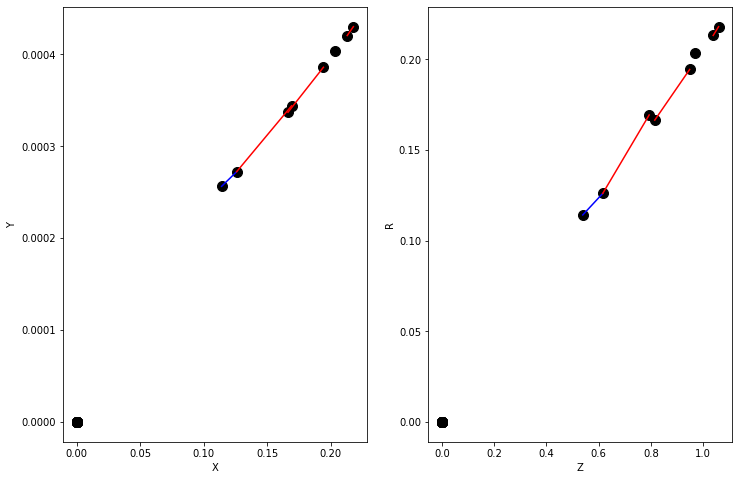

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.1612839  0.15968394 0.08352534 0.08519939 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


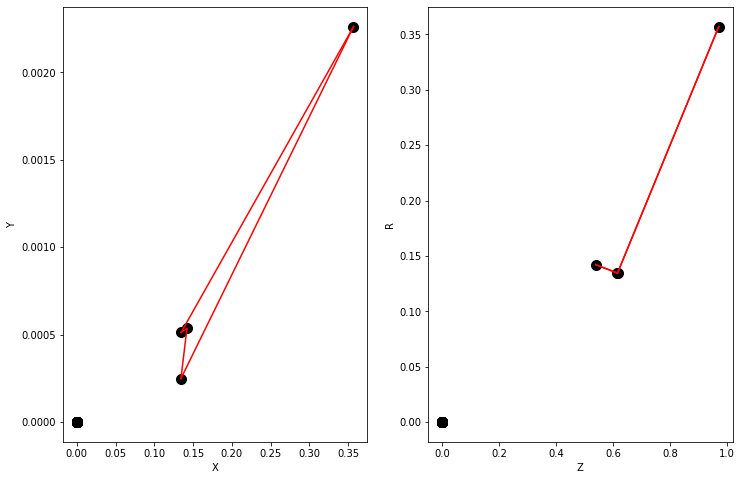

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.0137747e-05 5.0636165e-05 6.2042505e-05 5.0462342e-05 5.0961266e-05
 6.2471983e-05 3.2802123e-05 2.8796090e-05 3.6069625e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

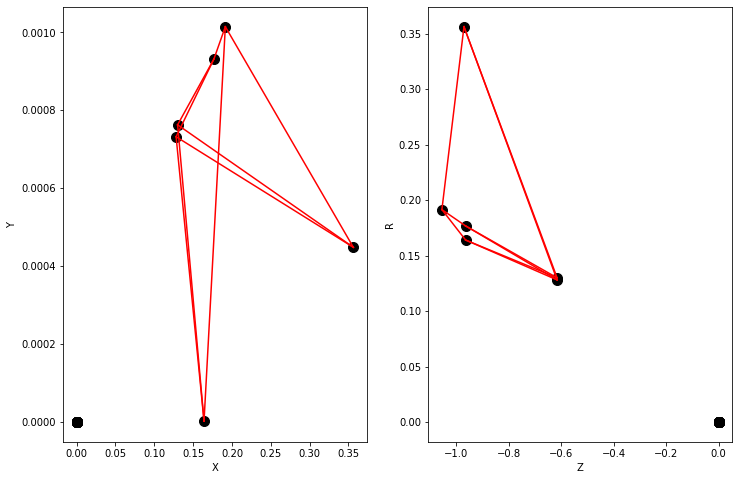

Y = [1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.31508932 0.45681265 0.6481911  0.6214333  0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 1.000, recall 0.750


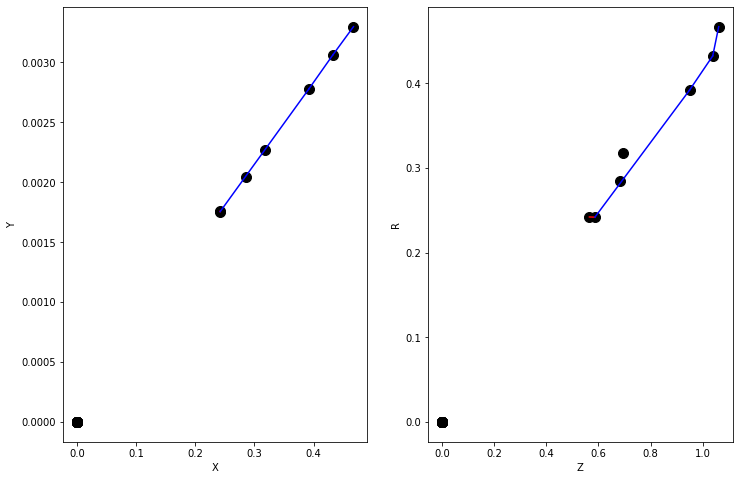

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.6409695e-05 3.9385643e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

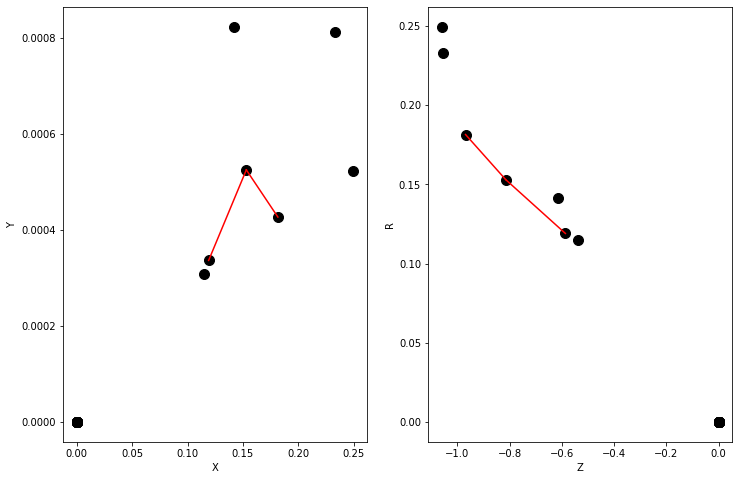

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.8410409e-05 6.3865489e-05 5.9468617e-05 5.2761243e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

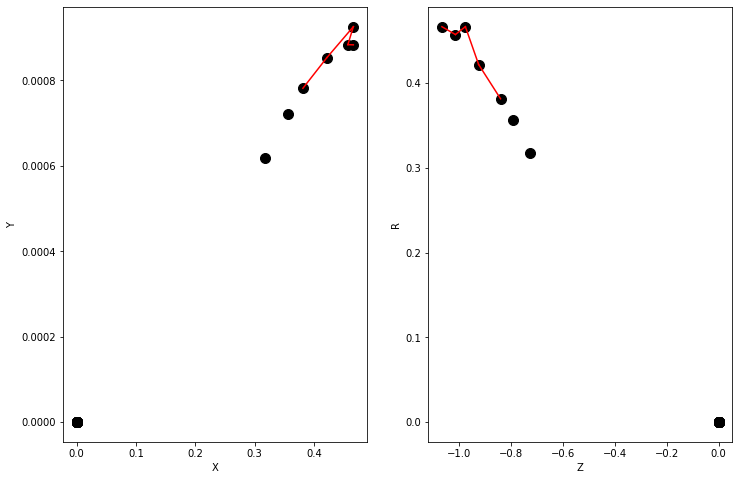

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.39864784 0.4704577  0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


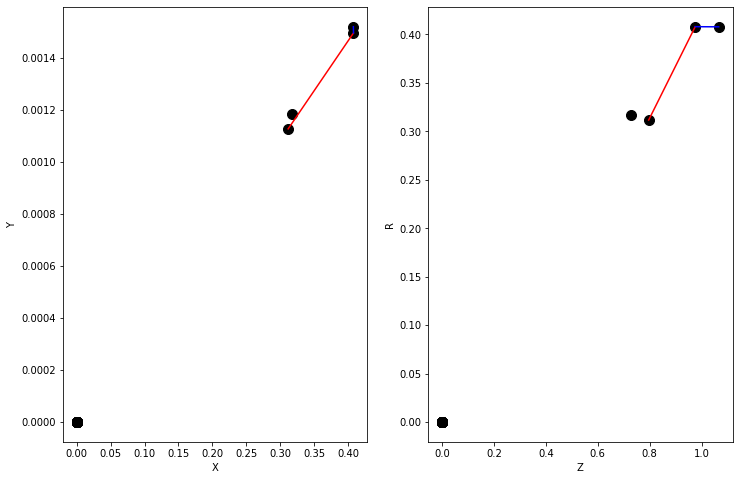

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.23226401 0.2146102  0.35311562 0.23749642 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


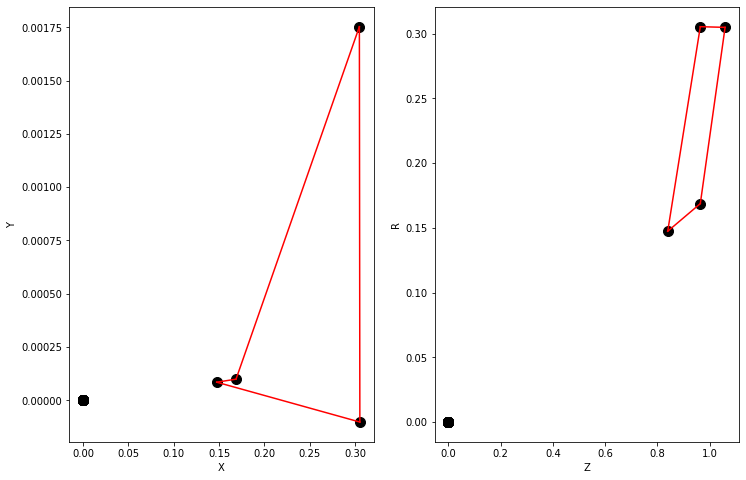

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [7.6542659e-05 7.3540614e-05 6.0065915e-05 7.2796764e-05 6.9982532e-05
 5.7350226e-05 5.2827247e-05 5.6142439e-05 5.0851362e-05 5.4003518e-05
 4.6206860e-05 4.8957732e-05 4.7732876e-05 4.9632585e-05 4.8452446e-05
 4.7009155e-05 4.8886537e-05 4.7689518e-05 4.5303888e-05 4.5543609e-05
 4.3384814e-05 4.3574219e-05 5.0563402e-05 5.0894880e-05 4.1701274e-05
 3.9585815e-05 4.6341145e-05 4.3857075e-05 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

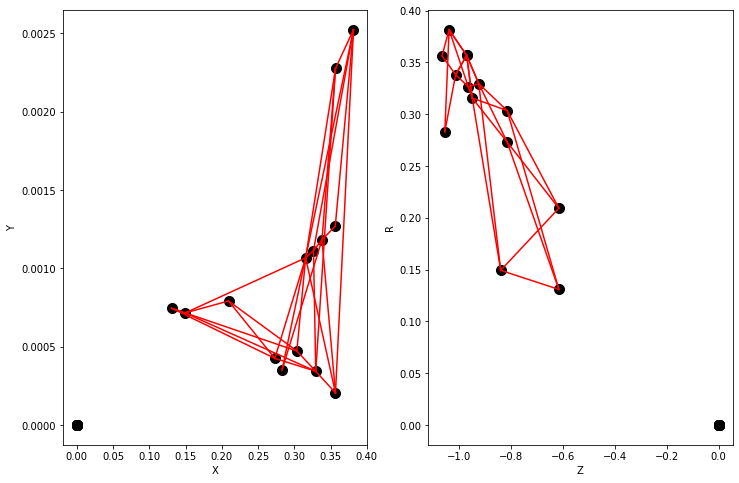

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.3670654e-05 4.4809509e-05 4.9227110e-05 3.6309761e-05 4.0080777e-05
 3.2921427e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

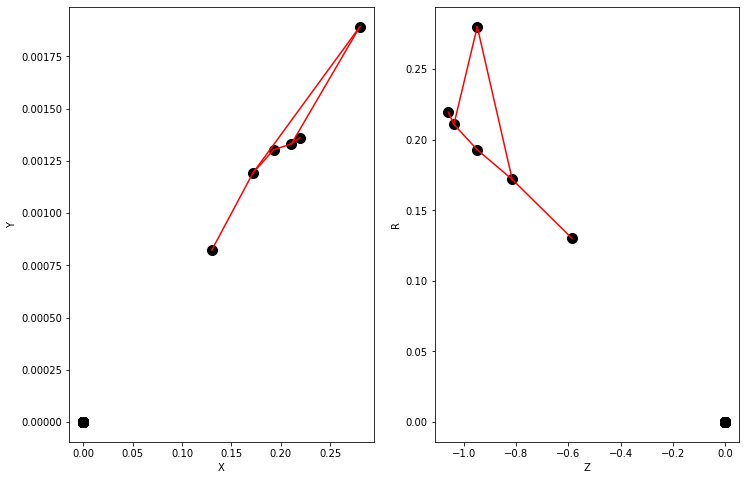

Y = [0. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.2824934  0.4503452  0.55161506 0.61094284 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 1.000, recall 1.000


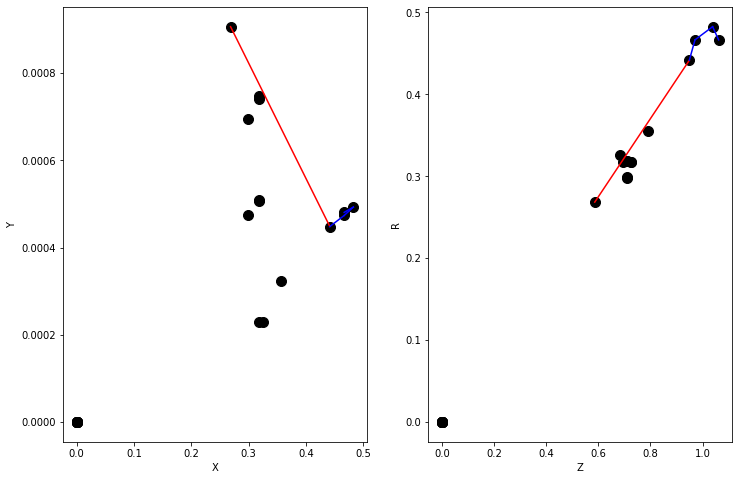

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.24394313 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


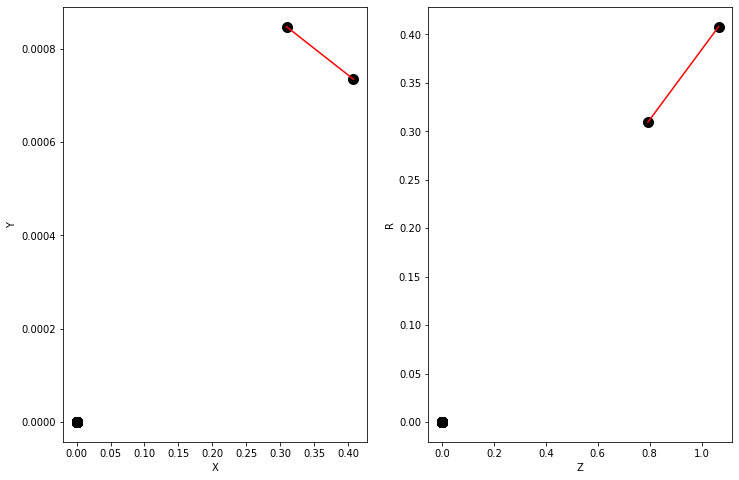

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.18241717 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


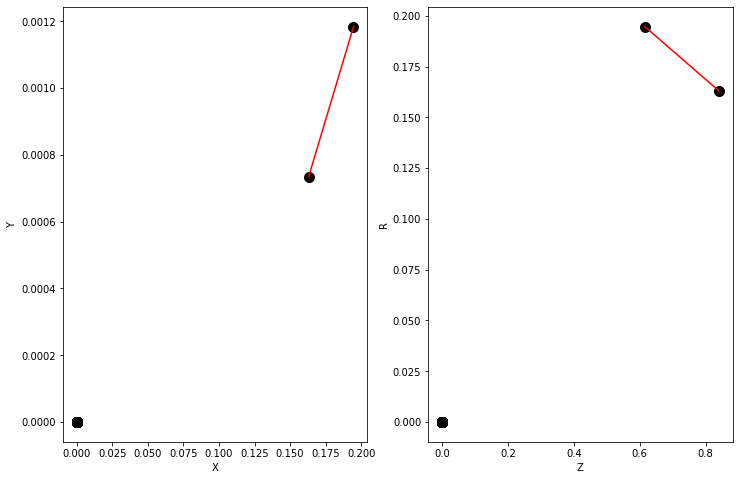

Y = [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.45726836 0.59959716 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 1.000, recall 1.000


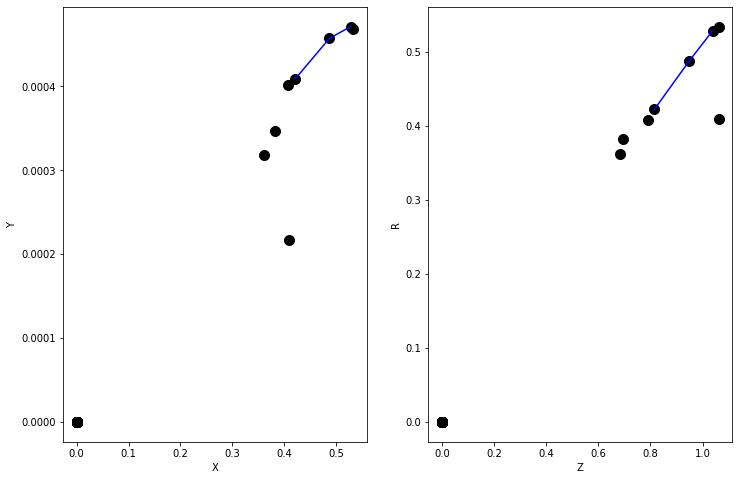

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.5286807  0.4546446  0.46913618 0.5358373  0.2964844  0.27337793
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.929, precision 0.000, recall 0.000


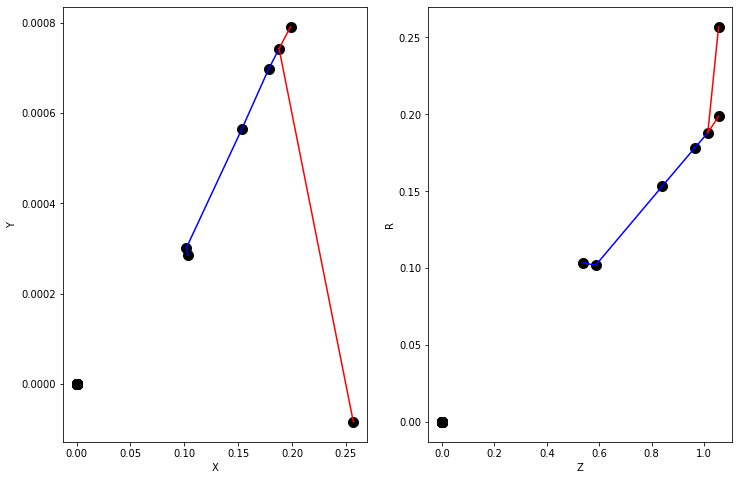

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.4258188e-05 4.0953939e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

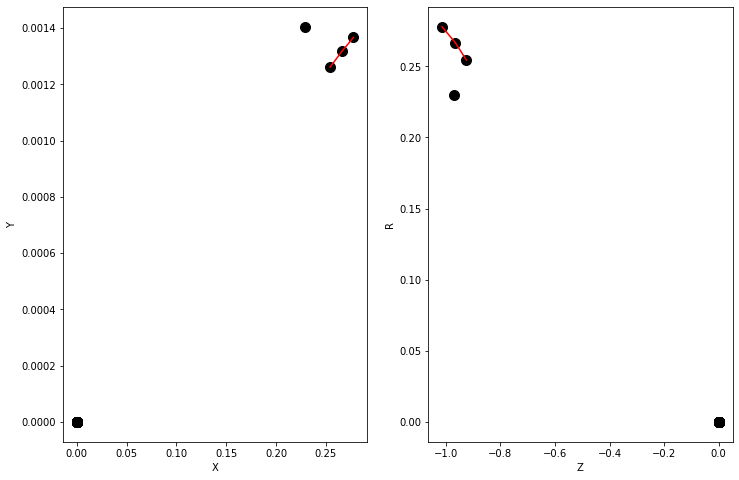

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.8802121e-05 6.2573461e-05 7.1352231e-05 7.6085496e-05 4.4534099e-05
 4.9431175e-05 4.1237679e-05 4.5733104e-05 4.5243189e-05 3.8763363e-05
 4.2124473e-05 4.2716623e-05 3.6714599e-05 3.9900086e-05 4.4321205e-05
 3.9478899e-05 3.7068556e-05 3.2129428e-05 3.4274472e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

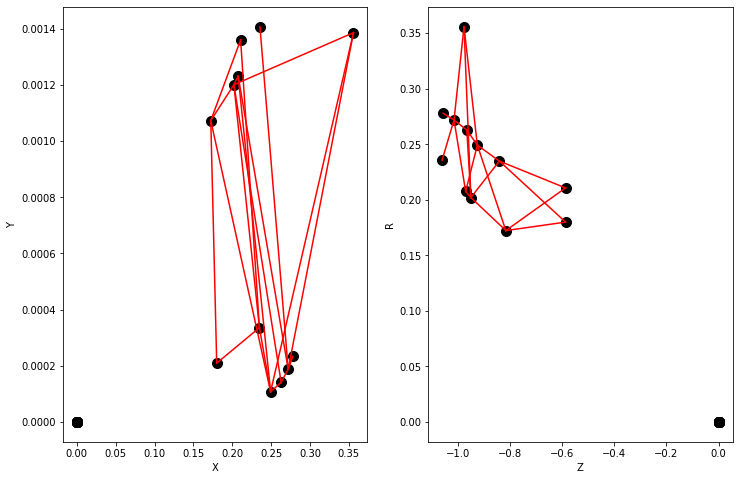

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.7930261e-05 6.8839567e-05 7.3715099e-05 5.7823378e-05 4.6049070e-05
 4.6290261e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

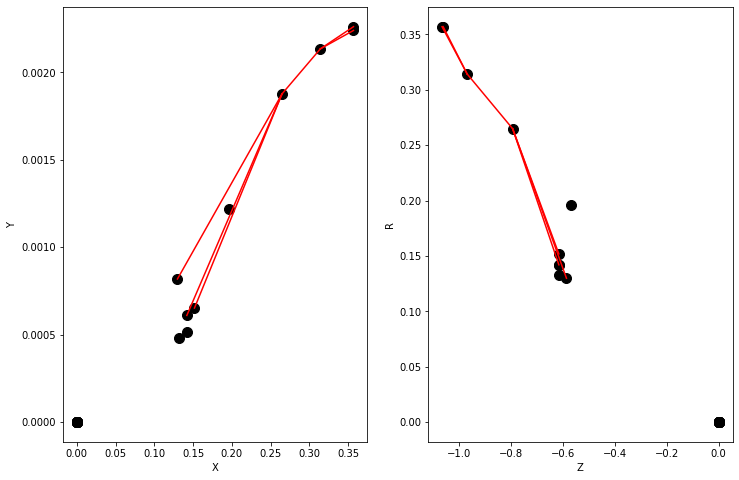

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.508882e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

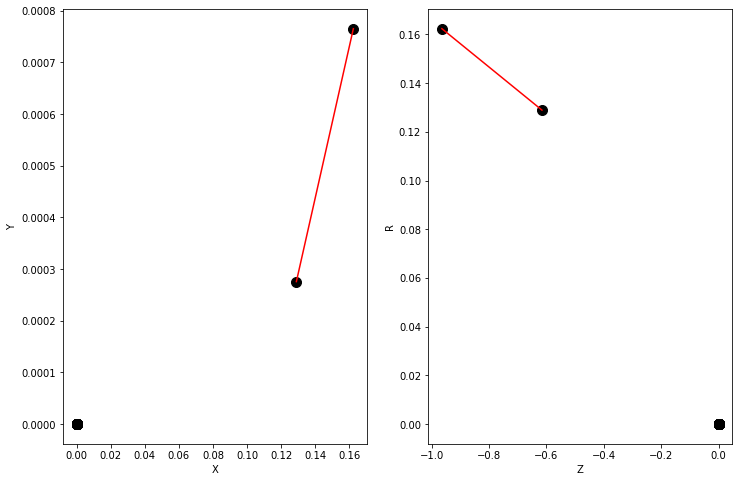

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.8802121e-05 6.2573461e-05 7.1352231e-05 7.6085496e-05 4.4534099e-05
 4.9431175e-05 4.1237679e-05 4.5733104e-05 4.5243189e-05 3.8763363e-05
 4.2124473e-05 4.2716623e-05 3.6714599e-05 3.9900086e-05 4.4321205e-05
 3.9478899e-05 3.7068556e-05 3.2129428e-05 3.4274472e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

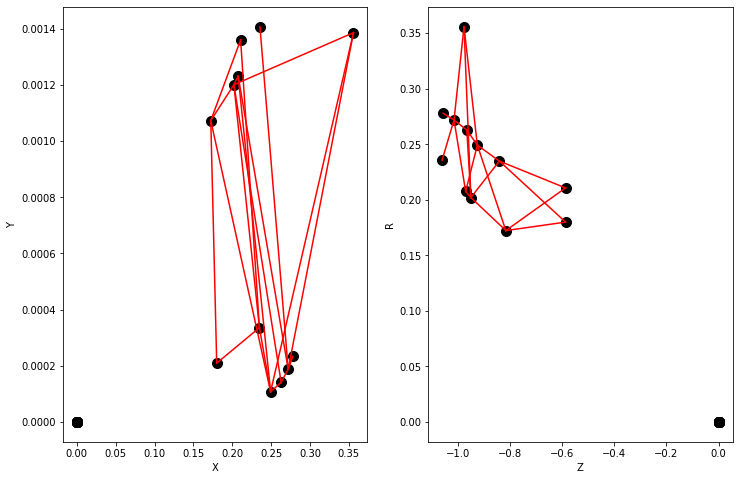

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.10914013 0.05329757 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


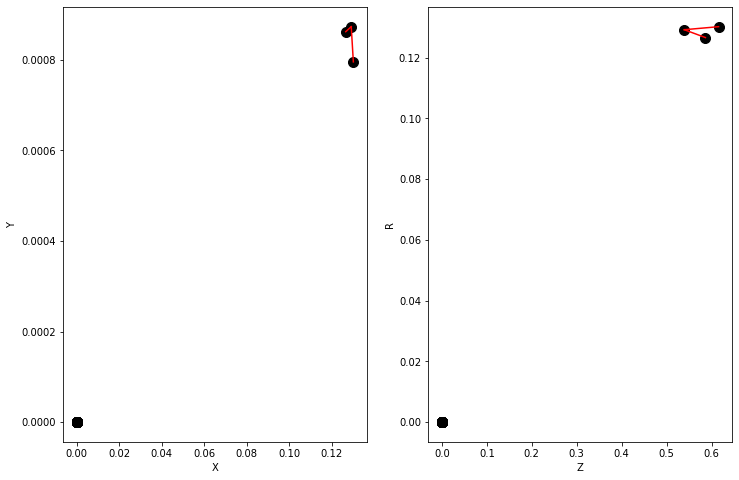

Y = [1. 1. 1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.31339848 0.43162453 0.422442   0.39598    0.2304731  0.2097092
 0.23219821 0.21111017 0.32477653 0.30780843 0.4362511  0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.946, precision 0.667, recall 0.500


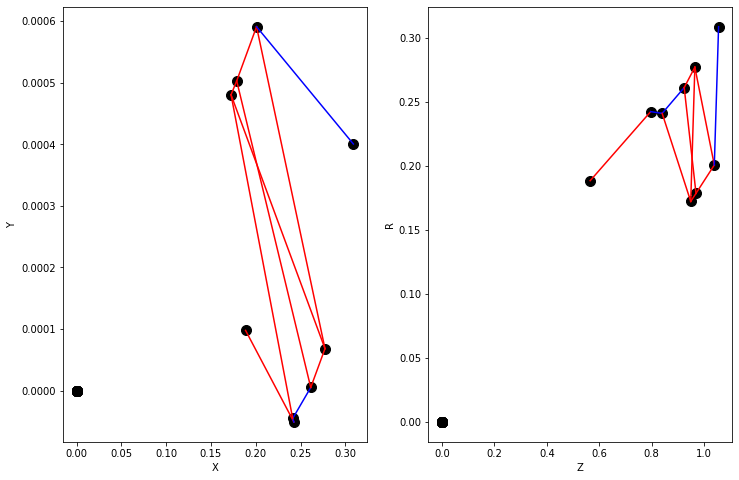

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.05778346 0.06088369 0.2349822  0.4378623  0.49073756 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


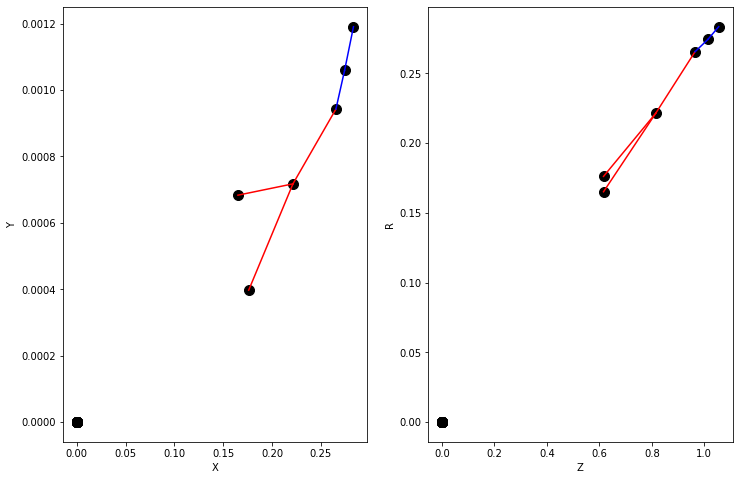

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.6038240e-05 5.6575460e-05 5.2758827e-05 5.3205469e-05 5.3890642e-05
 3.6668273e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

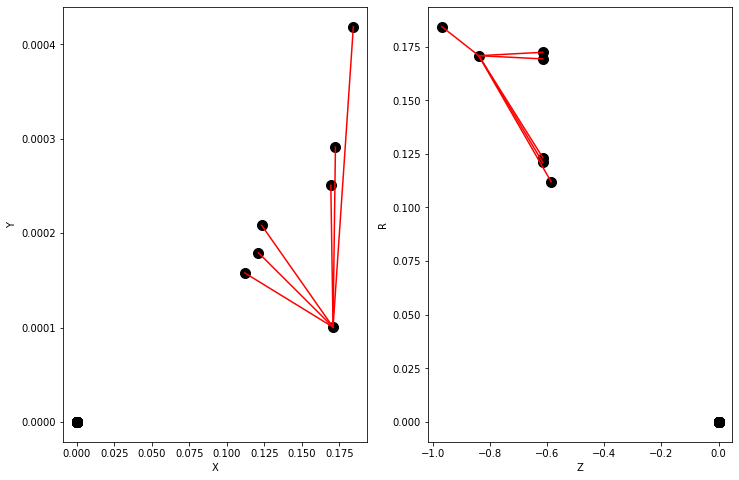

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [4.8026828e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

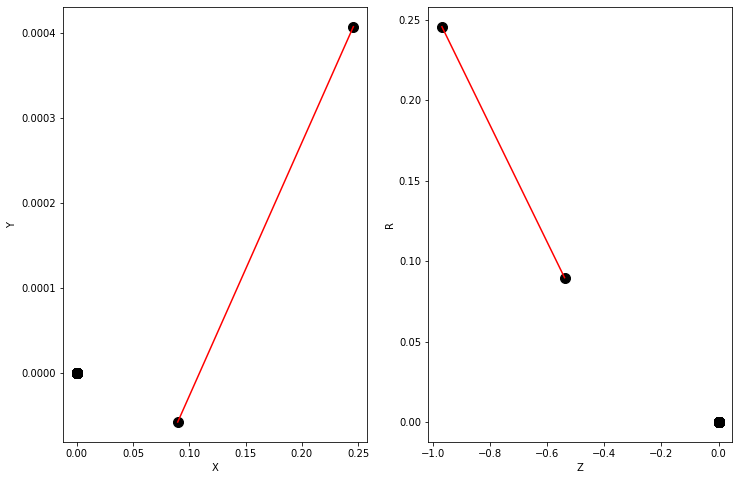

Y = [1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.62818575 0.64472514 0.7248807  0.6638074  0.47110116 0.38459176
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 1.000, recall 0.833


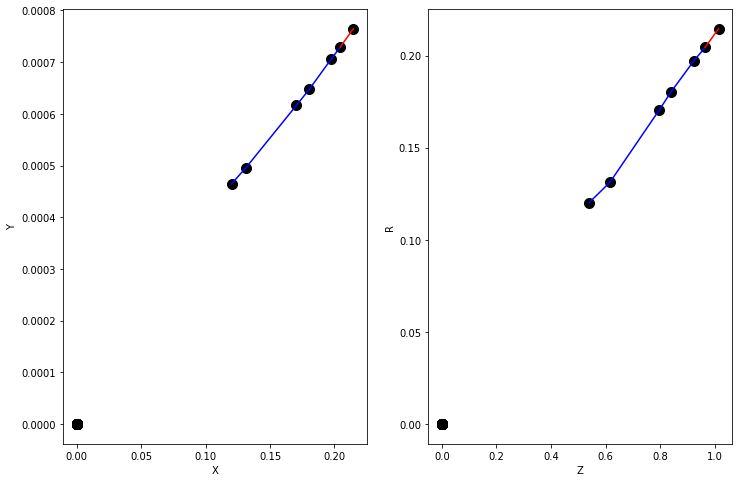

Y = [1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.12494905 0.12474298 0.32254428 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.946, precision 0.000, recall 0.000


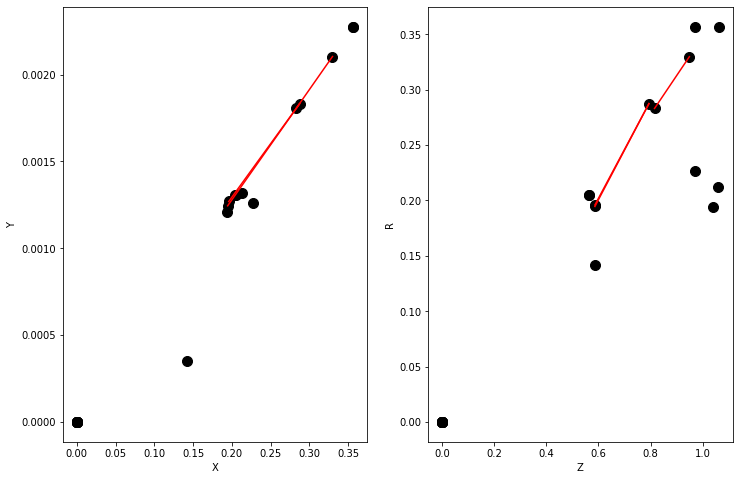

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [9.183962e-05 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04 8.123662e-04
 8.123662e-04]
--------------------------------------
accuracy 1.000, precision 0.000, reca

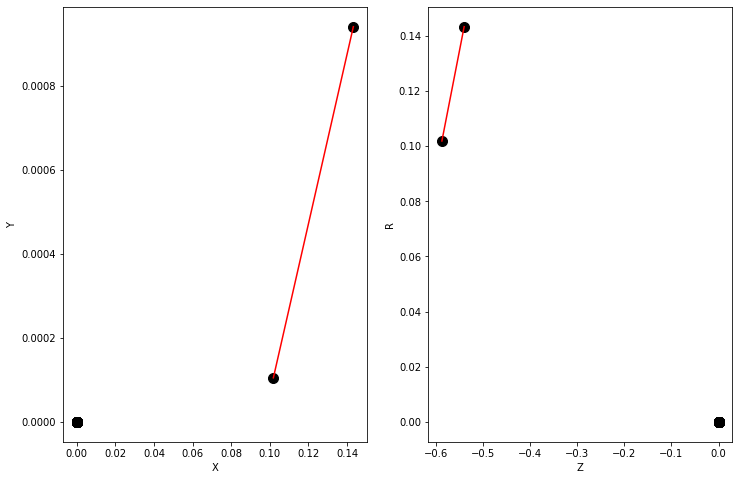

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [6.0549984e-05 6.0605846e-05 6.7940367e-05 6.7819325e-05 4.5560508e-05
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

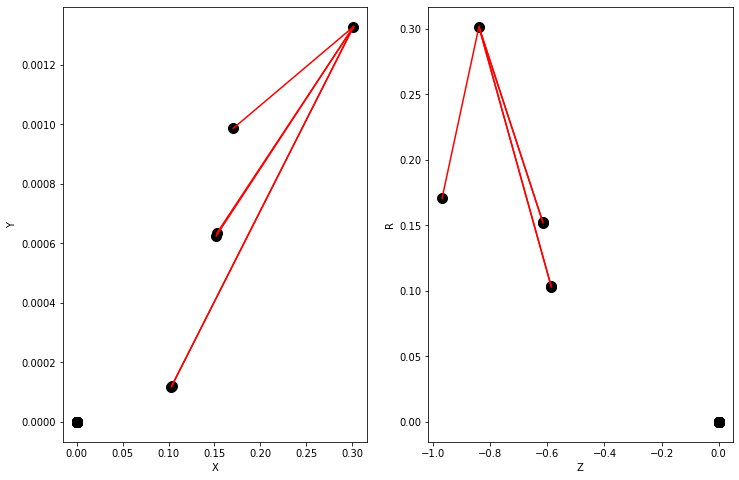

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.1248069e-05 5.3508931e-05 5.4418848e-05 4.5786866e-05 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

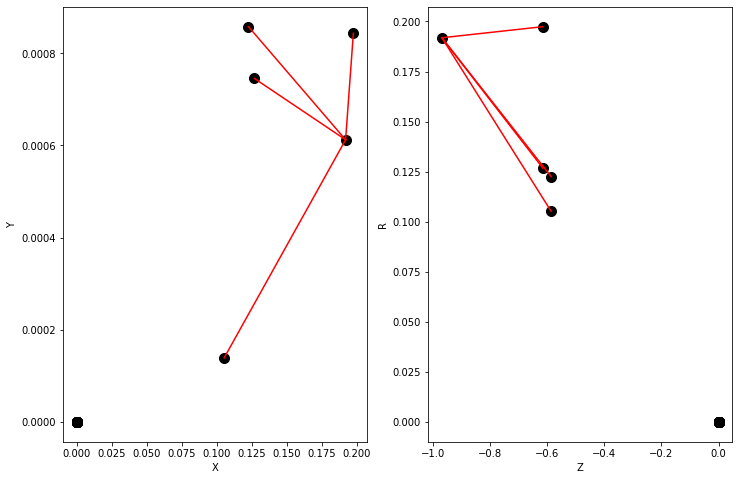

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.6278270e-05 5.3120195e-05 5.7976547e-05 3.8362010e-05 3.1703927e-05
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

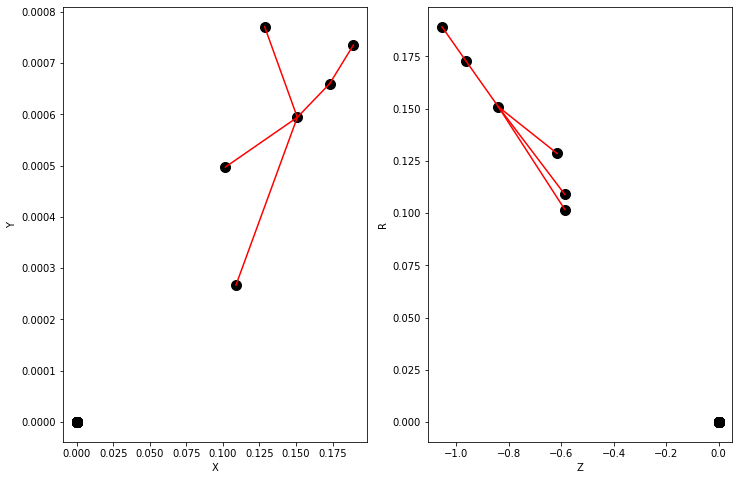

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [3.2926546e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

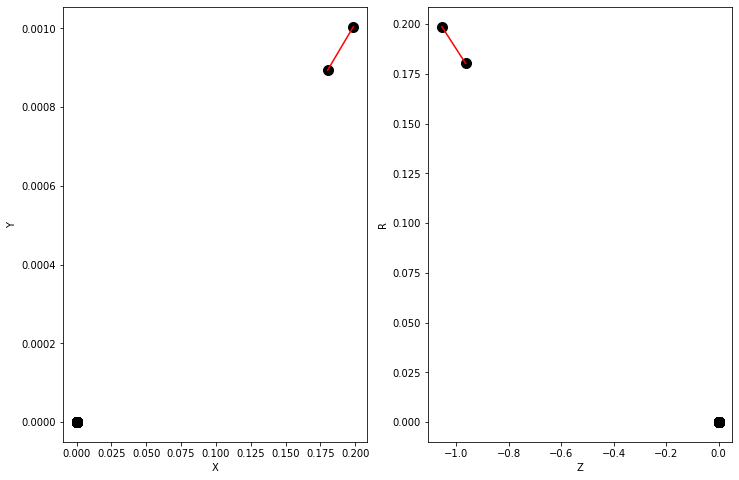

Y = [0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.20187199 0.2099256  0.20860015 0.21678562 0.4027433  0.47335383
 0.71382797 0.47189894 0.51652306 0.5379109  0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 1.000, recall 0.750


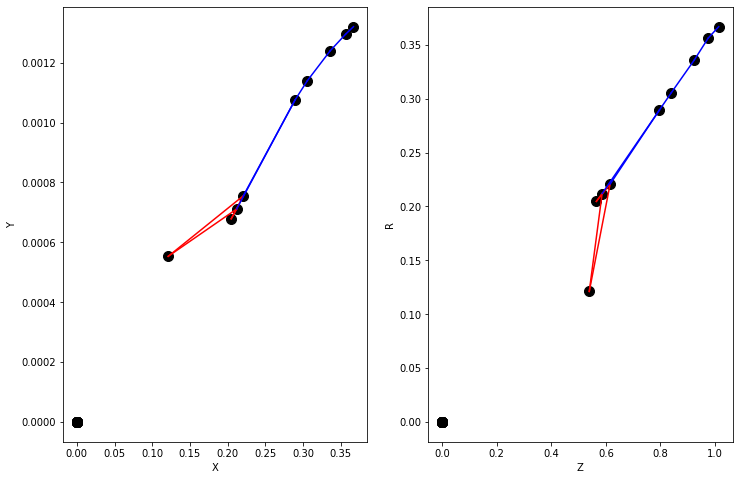

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.31151685 0.15608326 0.149938   0.23673837 0.23724888 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


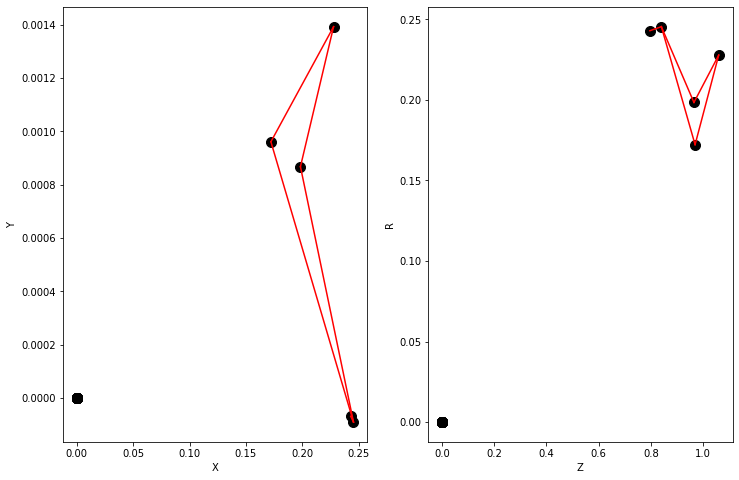

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [8.9597794e-05 4.8718484e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

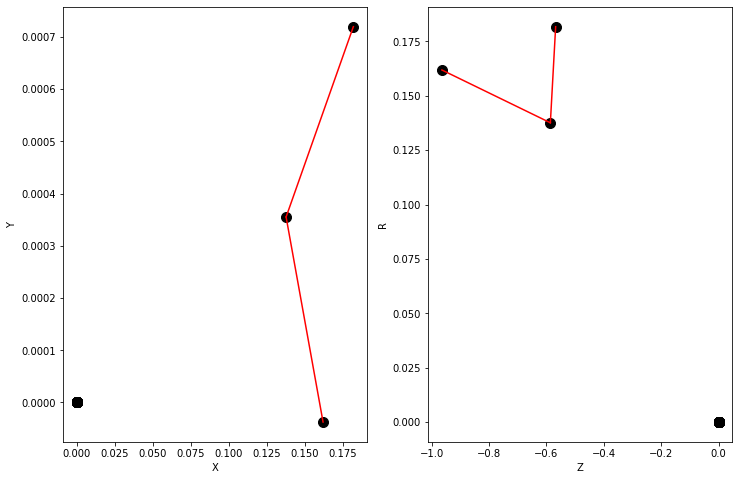

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.543336   0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


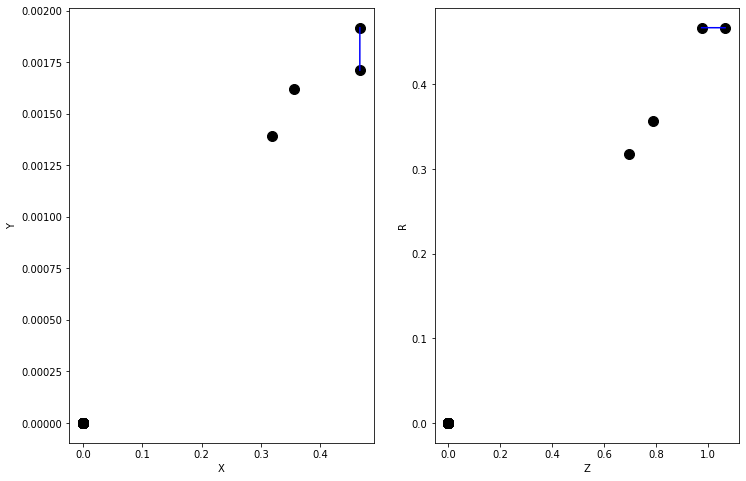

Y = [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.3127804  0.44834727 0.5238602  0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.946, precision 0.000, recall 0.000


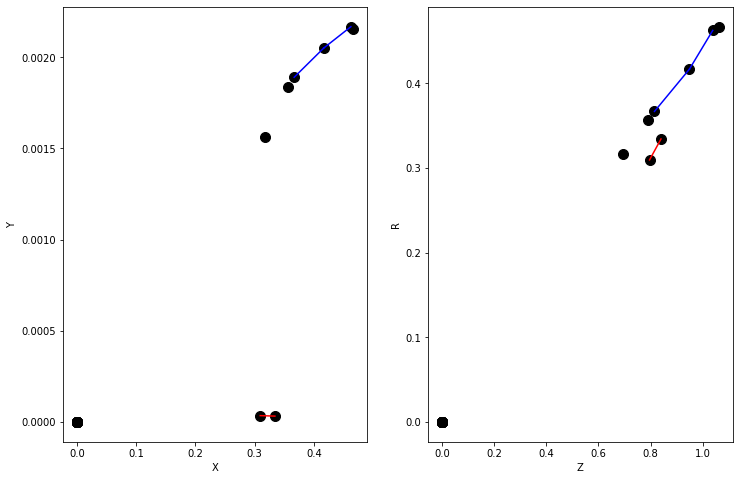

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.18258542 0.27141926 0.40745217 0.47773364 0.36067313 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.964, precision 0.000, recall 0.000


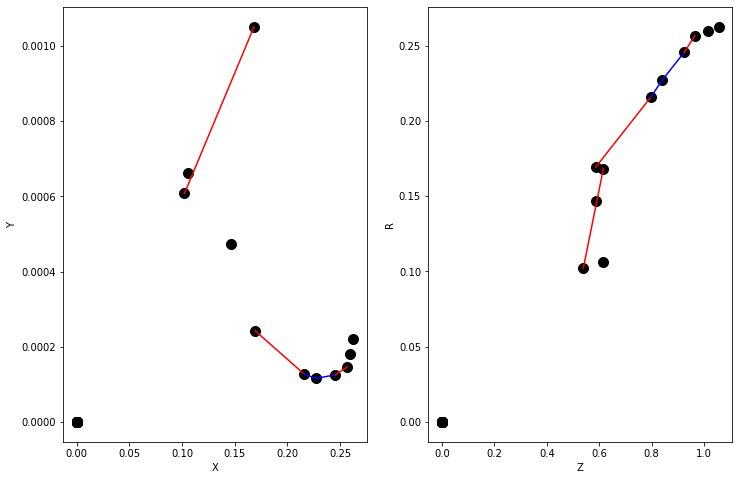

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.02757044 0.02808362 0.02639515 0.02230938 0.17657997 0.3082548
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


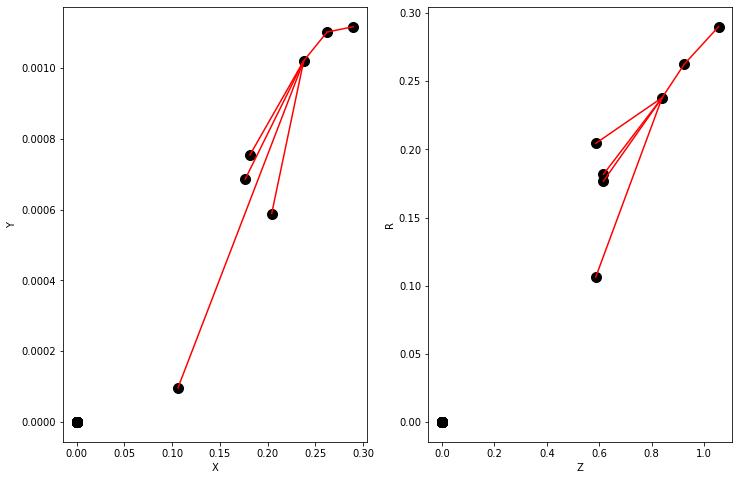

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [9.5611096e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

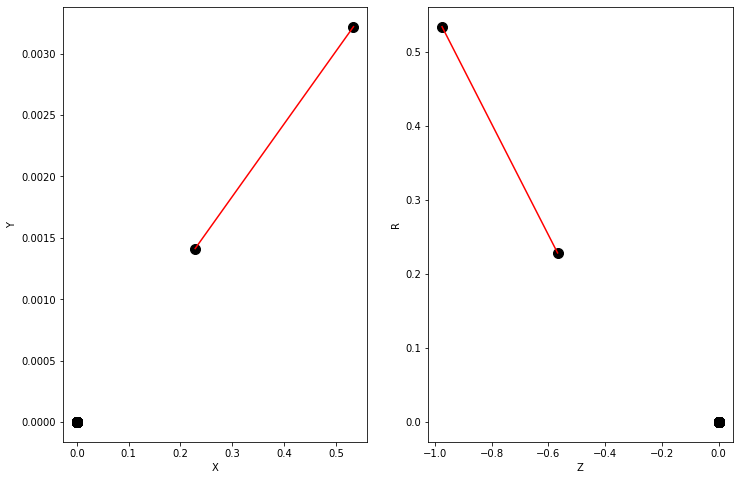

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.5835702e-05 4.9502451e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

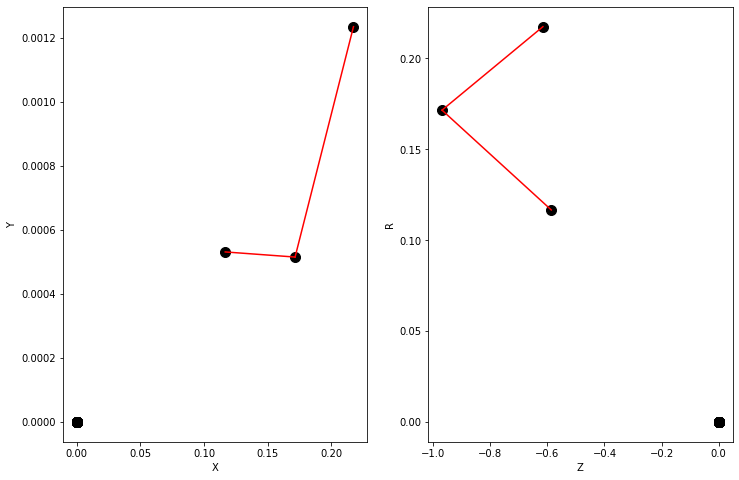

Y = [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.10663189 0.14560392 0.48046944 0.57404    0.5060827  0.5085938
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.893, precision 0.000, recall 0.000


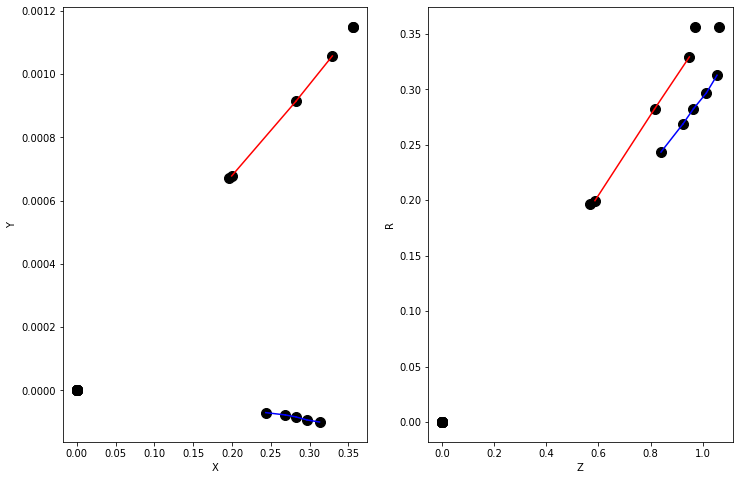

Y = [1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.66254455 0.61120665 0.78226995 0.7408024  0.60193586 0.49112952
 0.440855   0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 1.000, recall 1.000


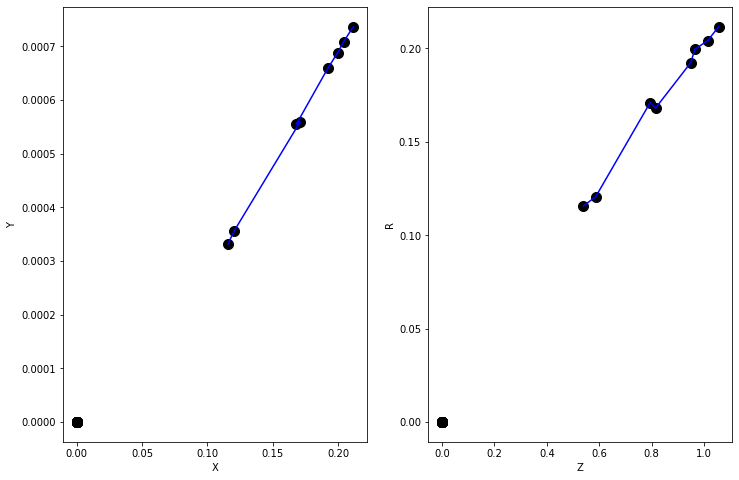

Y = [1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.58478045 0.7789219  0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 1.000, recall 1.000


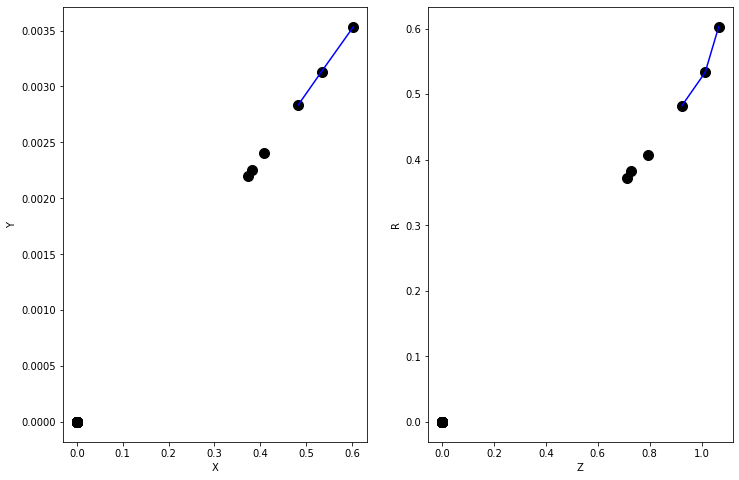

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [5.6271187e-05 5.3731463e-05 3.9821360e-05 3.5900033e-05 3.3235392e-05
 3.0793653e-05 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04 8.1236620e-04
 8.1236620e-04]
--------------------

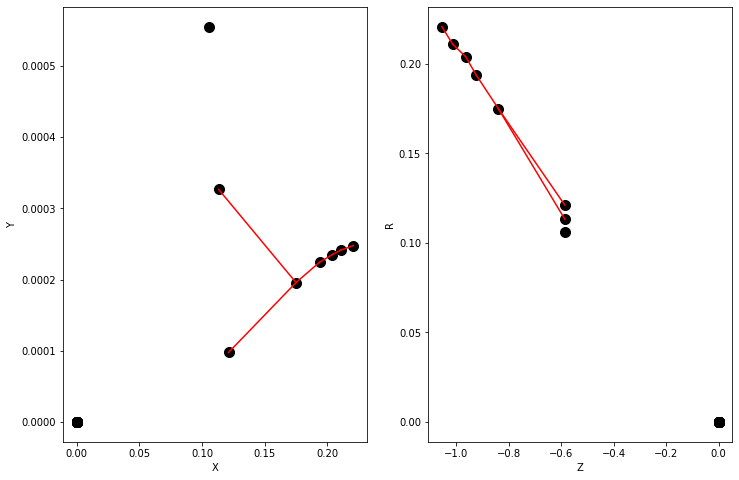

Y = [1. 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.10864756 0.4185253  0.47326517 0.4952403  0.47203752 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 1.000, recall 0.800


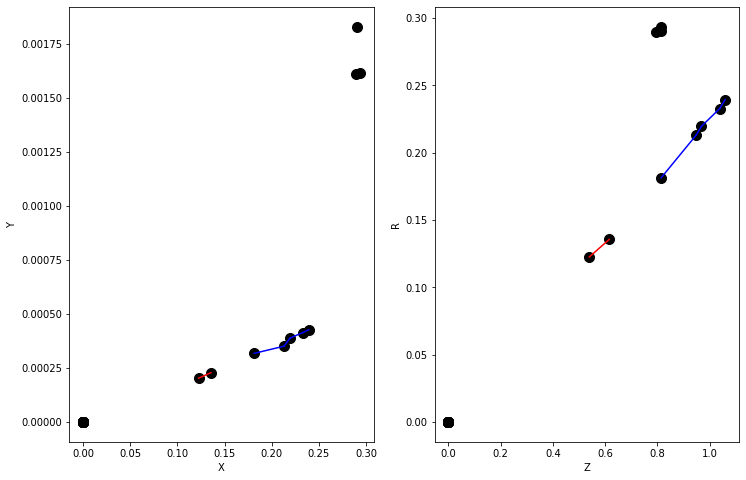

Y = [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.3331038  0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 0.982, precision 0.000, recall 0.000


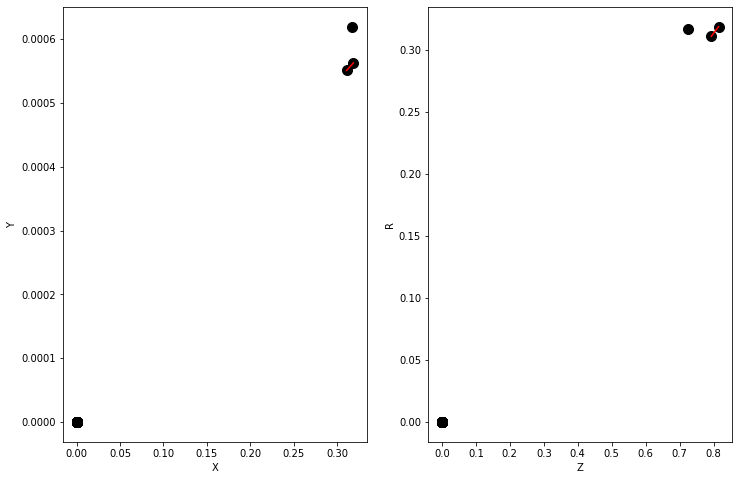

Y = [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
PRED = [0.2607542  0.31372598 0.31251478 0.14120299 0.1468205  0.14058152
 0.14188719 0.14752449 0.14125293 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237 0.00081237
 0.00081237 0.00081237]
--------------------------------------
accuracy 1.000, precision 0.000, recall 0.000


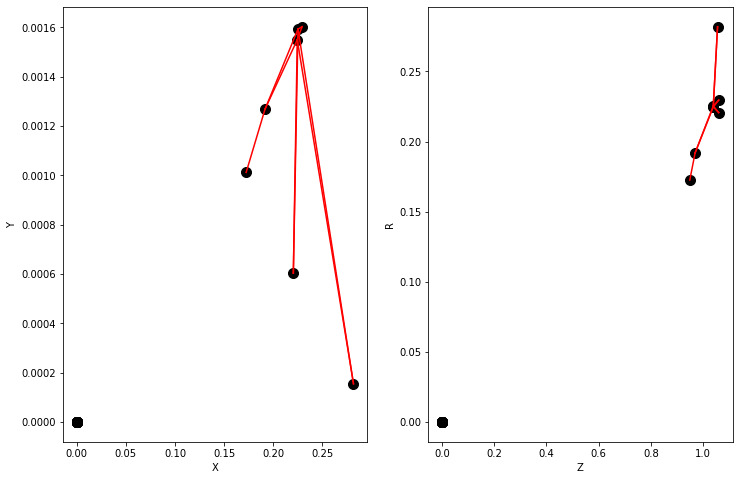

In [12]:
def drawGraph(X, Ri, Ro, y, pred): 
    # Select the i/o node features for each segment    
    # Prepare the figure
 
    fig, (ax0,ax1) = plt.subplots(1, 2, figsize=(12,8))
#    cmap = plt.get_cmap('bwr_r')

    # HITS features 
    R=X[:,0]
    Phi=(np.pi/180.)*X[:,1]
    Z=X[:,2] # Don't save isMuon X[:,3] component in graph feature
    XX=R*np.cos(Phi)
    YY=R*np.sin(Phi)

    # Transform 0 and 1 labels into color list using the dictionary 
    colordic={1:'blue' , 0:'red'}
#    cl=[colordic.get(n) for n in X[:,3]] # use the hit target value for color

    # Plot the hits
    ax0.scatter(XX,YY, s=100., color='black' )
    ax1.scatter(Z,R, s=100., color='black' )
    
    # Get the hits indices from the SGMENTS arrays
    idx_i = find(np.rot90(Ri))[1]
    idx_o = find(np.rot90(Ro))[1]
  
    # Reverse to get correct hits order as in dh_hits 
    idx_i=idx_i[::-1]
    idx_o=idx_o[::-1]

    # Get SEGMENTS begin and end hits coordinates
    R_i=X[idx_i,0]
    Phi_i=(np.pi/180.)*X[idx_i,1]
    Z_i=X[idx_i,2]
    X_i=R_i*np.cos(Phi_i)
    Y_i=R_i*np.sin(Phi_i)
  
    R_o=X[idx_o,0]
    Phi_o=(np.pi/180.)*X[idx_o,1]
    Z_o=X[idx_o,2]
    X_o=R_o*np.cos(Phi_o)
    Y_o=R_o*np.sin(Phi_o)
  
    # Create a list of SEGMENTS colors 
#    cl=[colordic.get(n) for n in y]
    cl=[colordic.get(np.round((n-thresh+0.5),0)) for n in pred]

    # Plot segments

    for j in range(len(X_i)):
      ax0.plot([X_i[j], X_o[j]], [Y_i[j], Y_o[j]], '-', color=cl[j])
      ax1.plot([Z_i[j], Z_o[j]], [R_i[j], R_o[j]], '-', color=cl[j])


    # Show plots
    ax0.set_xlabel('X')
    ax0.set_ylabel('Y')
    ax1.set_xlabel('Z')
    ax1.set_ylabel('R')
    plt.show()


# Loop to draw one graph per event

for i in range(n_test):
    X = test_X[i,:,:] 
    Ri = test_Ri[i,:]
    Ro = test_Ro[i,:]
#    pred = test_pred[i].squeeze(0)
    pred = test_pred[i,:]
    y = test_y[i,:]

    print('Y =',y)
    print('PRED =',pred)
    print('--------------------------------------')

    print('accuracy %.3f, precision %.3f, recall %.3f' % (
        sklearn.metrics.accuracy_score(y, pred>thresh),
        sklearn.metrics.precision_score(y, pred>thresh),
        sklearn.metrics.recall_score(y, pred>thresh)))
    drawGraph(X, Ri, Ro, y , pred);